In [26]:
import sys
sys.path
sys.path.insert(1, 'C:\\Users\\scj14\\BYU\\research\\image_encoder\\github\\experiment1\\')

from src.process_data import save_maps, load_maps, index2sentence, sentence2index, subsequent_mask
from src.encoderdecoder import EncoderDecoder, save_model, load_model
from src.dataset import TranslationDataset, AutoencoderDataset, padding_collate_fn, Batch
from src.image import tensor2image
from src.loss import ComputeLoss, LabelSmoothing

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt

import time
import os
import re
import copy


PAD = 0
SOS = 1
EOS = 2
UNK = 3

In [2]:
gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
base_dir = "../text_corpora/prepared/"
data_dir = "eng/"
test_data = "books_test.txt"
map_dir = '../outputs/maps/'
model_dir = '../outputs/models/books_small/'
train_name = "books_train_small_txt-2023-02-16-01-53"

In [4]:
file_path = base_dir + data_dir + test_data
test_set = AutoencoderDataset(file_path, min_freq_vocab=0)
test_text = open(file_path, encoding='utf-8').read().strip()
test_lines = test_text.split('\n')
word2index, index2word = load_maps(train_name, map_dir=map_dir)
test_set.init_using_existing_maps(None, word2index, index2word)
vocab_size = len(test_set.word2index)
test_loader = DataLoader(
    test_set, 
    batch_size=100, 
    pin_memory=True, 
    collate_fn=padding_collate_fn, 
    shuffle=False
)
model = load_model(train_name + "-cp_{}".format(9), model_dir=model_dir)

Converting lines to indices...


In [5]:
def sentence2vector(model, s):
    zeros = 20 - len(s.split())
    t = torch.tensor([1] + sentence2index(s, word2index) + [0]*zeros).unsqueeze(0)
    mask = ((t != PAD) & (t != SOS)).unsqueeze(-2)
    with torch.no_grad():
        x = model.encode(t, mask)
    return x

In [6]:
total_params = 0
for p in list(model.parameters()):
    total_params += p.flatten().size()[0]
total_params

21069464

In [7]:
def save_image(path, image):
    fig = plt.figure(frameon=False)
    fig.set_size_inches(3,3)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(image, aspect='equal')
    plt.savefig(path, bbox_inches='tight', pad_inches = 0)
    plt.close(fig)
    
def show_image(image):
    fig = plt.figure(frameon=False)
    fig.set_size_inches(3,3)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(image, aspect='equal')
    plt.show()
    plt.close(fig)

In [8]:
torch.set_printoptions(precision=4, sci_mode=False)
np.set_printoptions(precision=4, suppress=True)

In [9]:
model.to(gpu)
model.eval()
latents = []

with torch.no_grad():
    for i, batch in enumerate(test_loader):
        x = model.encode(batch.src, src_mask=batch.src_pad_mask)
        latents.append(x.cpu().detach())

latents = torch.cat(latents).numpy()

In [10]:
def cos_sim(x, y):
    return np.dot(x, y) / (np.linalg.norm(x)*np.linalg.norm(y))

In [47]:
model.d_model

256

In [51]:
L = nn.Linear(d,d//h)

In [52]:
L.weight.shape

torch.Size([32, 256])

In [48]:
l = 0
h = 8
d = 256
Q = copy.deepcopy(model.encoder.layers[l].self_attn.linears[0]).cpu().weight.detach().numpy()
K = copy.deepcopy(model.encoder.layers[l].self_attn.linears[1]).cpu().weight.detach().numpy()
V = copy.deepcopy(model.encoder.layers[l].self_attn.linears[2]).cpu().weight.detach().numpy()

In [53]:
Q1 = Q[:d//h]
K1 = K[:d//h]
V1 = V[:d//h]
Q1.shape

(32, 256)

In [74]:
W1_k = Q1@K1.T@np.linalg.inv(K1@K1.T)

In [75]:
W1_k@K1

array([[-0.0078, -0.57  ,  0.0283, ..., -0.1855, -0.2057, -0.1378],
       [ 0.2762, -0.4063, -0.1611, ...,  0.0739,  0.1172, -0.0165],
       [ 0.0068, -0.1225,  0.0992, ..., -0.2372, -0.3064, -0.0421],
       ...,
       [ 0.1211,  0.2012,  0.0776, ..., -0.0804,  0.0077,  0.1235],
       [-0.0453,  0.1812, -0.1988, ..., -0.2488,  0.0745,  0.1413],
       [-0.5133,  0.0157,  0.0735, ...,  0.2533,  0.3963,  0.1347]],
      dtype=float32)

In [81]:
Q1

array([[ 0.1584, -0.4849,  0.5598, ..., -0.381 , -0.1156, -0.0048],
       [ 0.1436, -0.7228, -0.1811, ..., -0.0878,  0.4127, -0.2797],
       [ 0.4894,  0.1806,  0.5092, ..., -0.4288, -0.2314,  0.3072],
       ...,
       [ 0.1937,  0.0703,  0.209 , ..., -0.0353, -0.0783,  0.1498],
       [ 0.0148,  0.0633, -0.4117, ...,  0.2746,  0.5486, -0.2269],
       [-0.0433,  0.1191,  0.4604, ..., -0.0211,  0.1741, -0.3183]],
      dtype=float32)

In [78]:
np.linalg.norm(Q1-W1_k@K1)

24.543085

In [79]:
np.linalg.norm(Q1-K1)

39.56546

In [82]:
np.linalg.norm(Q1)

31.265612

# Test set

In [101]:
criterion = LabelSmoothing(size=vocab_size, padding_idx=0, smoothing=0.1)

In [108]:
def run_instance(batch, model, index2word, name, i):
    greedy_decoded, image_tensor = model.greedy_decode(batch.src[0], batch.src_pad_mask[0])
    beam_decoded, _ = model.beam_search(batch.src[0], batch.src_pad_mask[0])

    trg_len = (batch.trg_y[0]!=0).sum().item()
    
    log = open("../outputs/eval/{}/decoded_sentences.txt".format(name), 'a')
    log.write("Sentence number {}".format(i) + "\n")
    log.write("Input sentence: \n")
    log.write(index2sentence(batch.trg_y[0][:trg_len].tolist(), index2word))
    log.write("\n\n")
    log.write("Greedy decode output: \n")
    log.write(index2sentence(greedy_decoded[1:].tolist(), index2word))
    log.write("\n\n")
    log.write("Beam search outputs: \n")
    for j in range(5):
        log.write(index2sentence(beam_decoded[j][0][0,1:].tolist(), index2word))
        log.write("\n")
    log.write("\n\n\n")
    log.close()
    
    image = tensor2image(image_tensor[0])
    image_path = "../outputs/eval/{}/image-{}.png".format(name, i)
    save_image(image_path, image)

In [111]:
name = train_name + "-cp_{}".format(9) + "_test"
model.to(gpu)
model.eval()
history = []

if not os.path.exists('../outputs/eval/' + name):
    os.mkdir('../outputs/eval/' + name)

with torch.no_grad():
    for i, batch in enumerate(test_loader):

        output, image = model(
            batch.src, batch.trg,
            src_mask=batch.src_pad_mask,
            trg_mask = batch.trg_attn_mask
        )
        loss = ComputeLoss(output, batch.trg_y, batch.trg_ntokens, criterion)
        history.append(loss.item())
        
        run_instance(
            batch, 
            model,  
            index2word, 
            name, 
            i
        )

avg_loss = np.mean(history)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [10]:
avg_loss

0.5477990061044693

In [113]:
model.to("cpu")
model.eval()
with torch.no_grad():
    for i, line in enumerate(test_lines):
        x = sentence2vector(model, line)
        beam_decoded, _ = model.beam_search_from_vector(x)
        print("norm:", torch.linalg.norm(x[0]).item())
        print("log prob:", beam_decoded[0][1].item())
        print()
        if i > 100: break

norm: 10.149260520935059
log prob: -7.020818710327148

norm: 11.226550102233887
log prob: -8.438002586364746

norm: 11.037227630615234
log prob: -15.48870849609375

norm: 12.185381889343262
log prob: -15.300736427307129

norm: 8.365289688110352
log prob: -0.5007095336914062

norm: 10.08345890045166
log prob: -1.6389105319976807

norm: 11.785111427307129
log prob: -5.403322696685791

norm: 10.763999938964844
log prob: -0.49178069829940796

norm: 9.283635139465332
log prob: -1.2356106042861938

norm: 11.92391586303711
log prob: -4.085196018218994

norm: 9.080891609191895
log prob: -1.2298483848571777

norm: 9.715156555175781
log prob: -0.798483669757843

norm: 7.590479850769043
log prob: -0.4866967499256134

norm: 7.458107948303223
log prob: -11.06534481048584

norm: 9.597210884094238
log prob: -3.230729818344116

norm: 9.474140167236328
log prob: -0.7414714097976685

norm: 10.805765151977539
log prob: -5.413743495941162

norm: 10.594524383544922
log prob: -1.9116277694702148

norm: 8.31

In [114]:
model.to("cpu")
model.eval()
with torch.no_grad():
    for i, line in enumerate(test_lines):
        x = sentence2vector(model, line)
        beam_decoded, _ = model.beam_search_from_vector(x)
        print("norm:", torch.linalg.norm(x[0], ord=1).item())
        print("log prob:", beam_decoded[0][1].item())
        print()
        if i > 100: break

norm: 96.9919662475586
log prob: -7.020818710327148

norm: 98.54450988769531
log prob: -8.438002586364746

norm: 119.38465881347656
log prob: -15.48870849609375

norm: 120.01416778564453
log prob: -15.300736427307129

norm: 74.3323745727539
log prob: -0.5007095336914062

norm: 87.28295135498047
log prob: -1.6389105319976807

norm: 113.12464904785156
log prob: -5.403322696685791

norm: 102.44097900390625
log prob: -0.49178069829940796

norm: 92.69795227050781
log prob: -1.2356106042861938

norm: 111.1301040649414
log prob: -4.085196018218994

norm: 95.4051742553711
log prob: -1.2298483848571777

norm: 84.18753051757812
log prob: -0.798483669757843

norm: 79.13243103027344
log prob: -0.4866967499256134

norm: 82.95451354980469
log prob: -11.06534481048584

norm: 99.28617095947266
log prob: -3.230729818344116

norm: 90.28484344482422
log prob: -0.7414714097976685

norm: 112.79488372802734
log prob: -5.413743495941162

norm: 94.28202819824219
log prob: -1.9116277694702148

norm: 86.1181488

# Train and Validation loss

In [108]:
train_log = open("../outputs/logs/books_train_small_txt-2023-02-16-01-53.log").read().strip()
train_loss_str = re.findall(r', loss\: (\d\.\d+)', train_log) 
train_loss = [float(l) for l in train_loss_str]
val_loss_str = re.findall(r'Validation loss, cp_\d+: (\d\.\d+)', train_log)
val_loss_str
val_loss = [float(l) for l in val_loss_str]

In [109]:
train_loss = train_loss[22:-11]
val_loss = val_loss[2:-1]

In [110]:
print(len(train_loss))
print(len(val_loss))

1820
20


In [105]:
91*20

1820

In [111]:
x1 = np.linspace(1/91, 20, 1820)
x2 = np.linspace(1, 20, 20)

In [145]:
plt.rcParams.update({'font.size': 18})

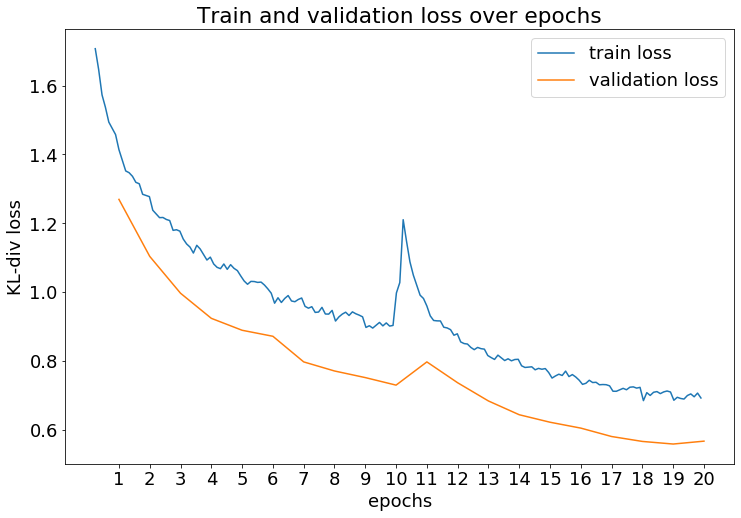

In [148]:
fg = plt.figure(figsize=[12,8])
ax = fg.gca()
plt.plot(x1[20::10], train_loss[20::10], label="train loss")
plt.plot(x2, val_loss, label="validation loss")
plt.xlabel("epochs")
plt.ylabel("KL-div loss")
plt.title("Train and validation loss over epochs")
plt.legend()
ax.set_xticks(x2)
plt.show()

In [168]:
softmax = nn.Softmax(dim=0)
softmax(torch.rand(4, 4)*5)

tensor([[0.5502, 0.3292, 0.6172, 0.0338],
        [0.2412, 0.2180, 0.0113, 0.4926],
        [0.1570, 0.0405, 0.0285, 0.2090],
        [0.0516, 0.4123, 0.3430, 0.2646]])

In [135]:
model.eval()
model.to("cpu")
s = "sure , i replied softly ."
x = sentence2vector(model, s)
memory, _ = model.extract_features(x)
ys = torch.tensor([1] + sentence2index(s, word2index))[:-2].unsqueeze(0)
ys_mask = subsequent_mask(ys.size(1))
out = model.decode(ys, memory, ys_mask)
prob_dist = model.generator(out[:,-1])

In [145]:
probs, words = torch.topk(prob_dist[0], 10)
for prob, word in zip(probs, words):
    print("{:.4f}".format(np.exp(prob.item())*100), index2word[word.item()])

97.9687 softly
0.0513 quietly
0.0216 gently
0.0203 tightly
0.0159 slowly
0.0102 .
0.0088 automatically
0.0086 knee
0.0082 forward
0.0075 casually


# PCA

In [17]:
from sklearn.decomposition import PCA

In [18]:
model.eval()
model.to("cpu")
n = 256

In [19]:
pca = PCA(n_components=n, svd_solver='full')
pca.fit(latents)

PCA(copy=True, iterated_power='auto', n_components=256, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [14]:
pca.explained_variance_ratio_

array([0.0687, 0.0547, 0.0459, 0.0421, 0.0394, 0.0361, 0.0295, 0.0285,
       0.0262, 0.0231, 0.0221, 0.0186, 0.0181, 0.0158, 0.0153, 0.0144,
       0.0134, 0.0132, 0.0127, 0.0125, 0.0122, 0.0114, 0.0108, 0.0105,
       0.0103, 0.0101, 0.01  , 0.0097, 0.0095, 0.0094, 0.0092, 0.0091,
       0.0089, 0.0087, 0.0085, 0.0085, 0.0083, 0.008 , 0.0079, 0.0076,
       0.0076, 0.0074, 0.0073, 0.0071, 0.007 , 0.0068, 0.0068, 0.0067,
       0.0064, 0.0063, 0.0063, 0.0061, 0.0059, 0.0057, 0.0056, 0.0055,
       0.0053, 0.0051, 0.0049, 0.0048, 0.0047, 0.0046, 0.0045, 0.0043,
       0.0043, 0.0042, 0.0039, 0.0039, 0.0037, 0.0035, 0.0034, 0.0034,
       0.0032, 0.003 , 0.003 , 0.0028, 0.0026, 0.0026, 0.0025, 0.0024,
       0.0023, 0.0023, 0.0022, 0.0021, 0.002 , 0.0019, 0.0018, 0.0018,
       0.0017, 0.0016, 0.0016, 0.0015, 0.0014, 0.0014, 0.0013, 0.0013,
       0.0012, 0.0011, 0.0011, 0.001 , 0.001 , 0.001 , 0.0009, 0.0009,
       0.0008, 0.0008, 0.0008, 0.0008, 0.0007, 0.0007, 0.0007, 0.0007,
      

In [499]:
[sum(pca.explained_variance_ratio_[:k]) for k in range(1, n+1)]

[0.06871172040700912,
 0.12345811724662781,
 0.1693098358809948,
 0.21145807206630707,
 0.2508700154721737,
 0.28692563250660896,
 0.3163839876651764,
 0.3448446746915579,
 0.37101095728576183,
 0.39407792314887047,
 0.4162178058177233,
 0.4347728509455919,
 0.452866954728961,
 0.46864770352840424,
 0.4839838920161128,
 0.49841975793242455,
 0.5118128238245845,
 0.525035778991878,
 0.5377762662246823,
 0.5502898851409554,
 0.5624713422730565,
 0.5738789075985551,
 0.584640403278172,
 0.5951206590980291,
 0.6054410617798567,
 0.6155890077352524,
 0.6255866587162018,
 0.6353311091661453,
 0.6448102705180645,
 0.6542357467114925,
 0.6633955622091889,
 0.6724966187030077,
 0.6813609460368752,
 0.6900722086429596,
 0.6986046209931374,
 0.7070696605369449,
 0.7153686340898275,
 0.7234145412221551,
 0.7312831748276949,
 0.7389178485609591,
 0.7465016297064722,
 0.7539341580122709,
 0.7612423421815038,
 0.7683697510510683,
 0.7753976830281317,
 0.7821996253915131,
 0.7889716732315719,
 0.79564

In [15]:
X = pca.fit_transform(latents)

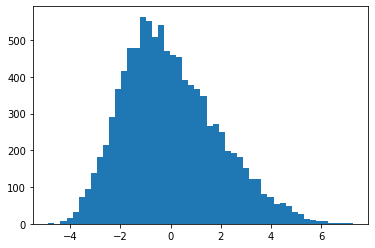

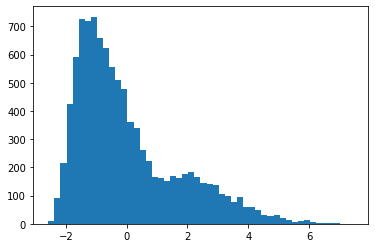

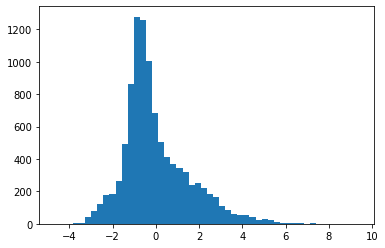

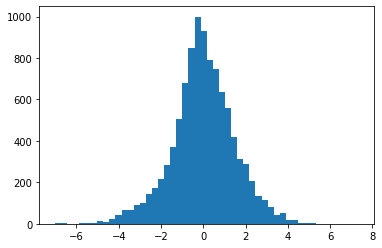

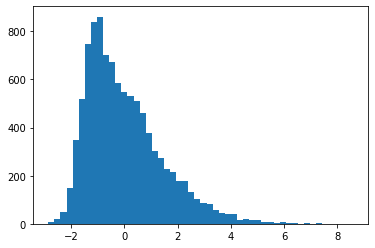

...

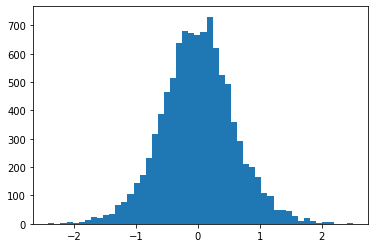

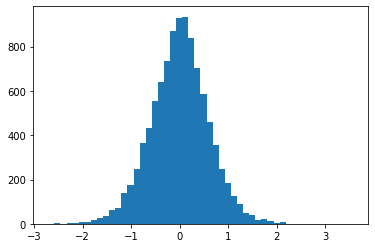

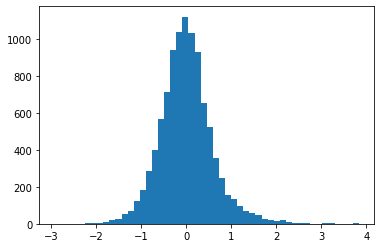

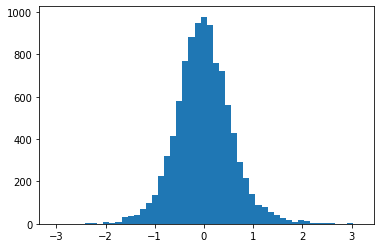

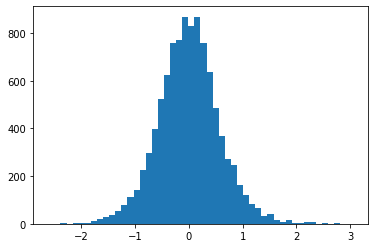

In [543]:
for j in range(0, 50):
    plt.hist(X[:, j], bins=50)
    plt.show()

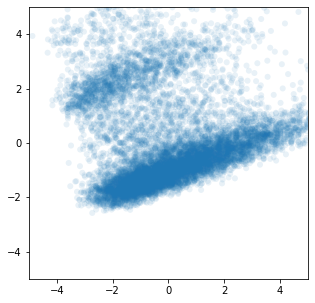

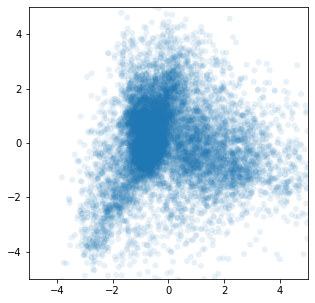

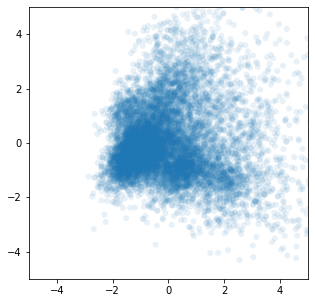

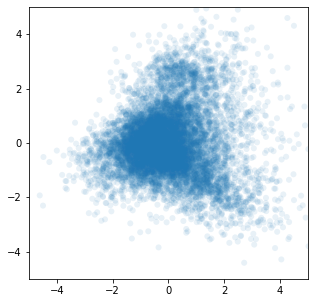

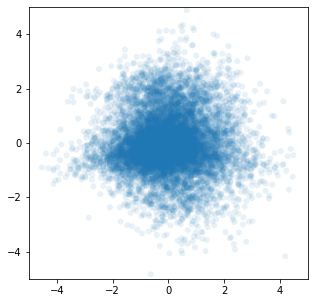

...

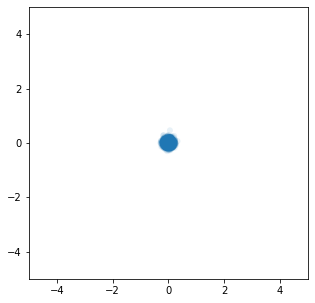

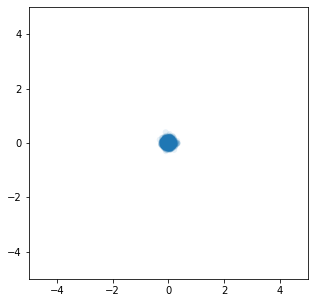

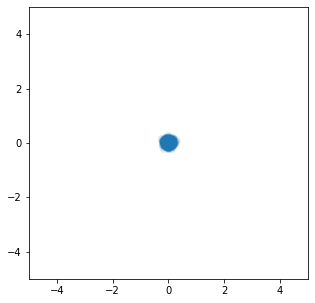

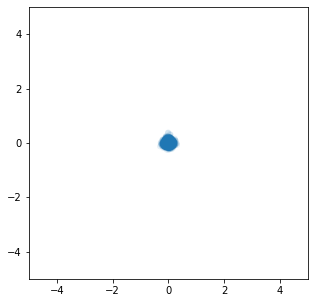

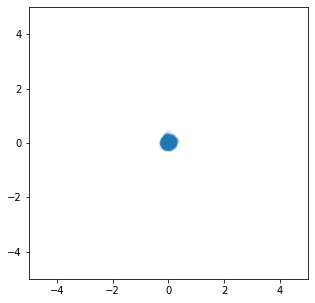

In [544]:
for j in range(0, 100):
    fig = plt.figure()
    fig.set_size_inches(5,5)
    plt.scatter(X[:,2*j], X[:,1+2*j], alpha=.1, edgecolors='none')
    plt.xlim([-5,5])
    plt.ylim([-5,5])
    plt.show()
    plt.close(fig)

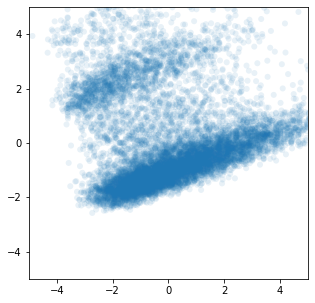

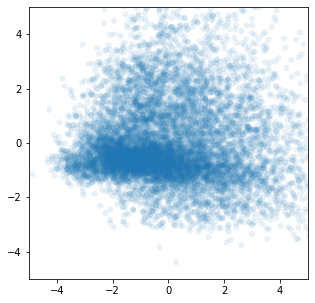

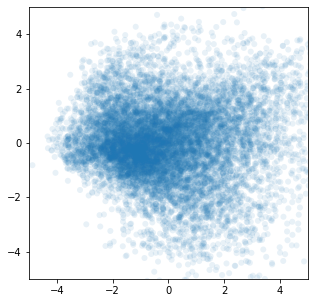

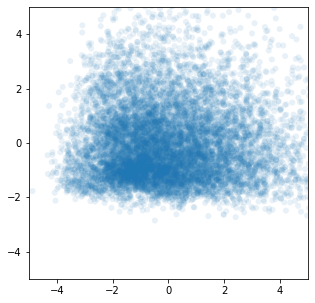

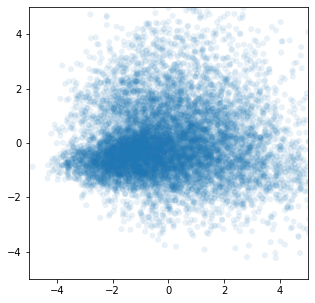

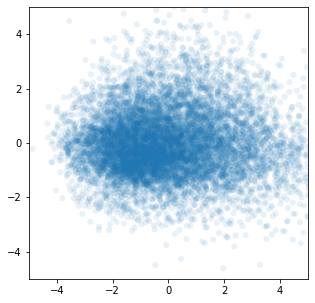

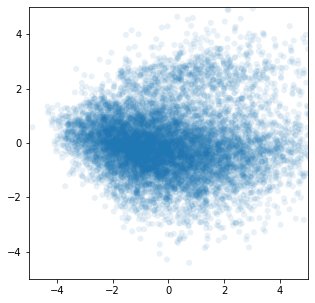

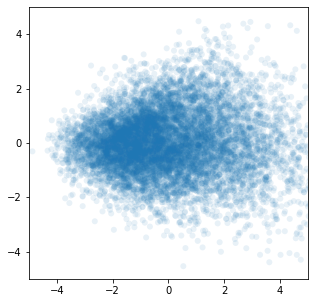

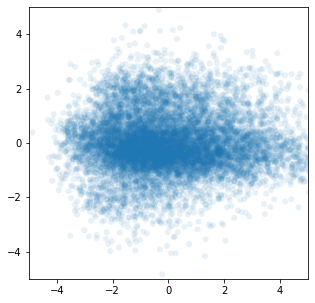

In [548]:
for j in range(1, 10):
    fig = plt.figure()
    fig.set_size_inches(5,5)
    plt.scatter(X[:,0], X[:,j], alpha=.1, edgecolors='none')
    plt.xlim([-5,5])
    plt.ylim([-5,5])
    plt.show()
    plt.close(fig)

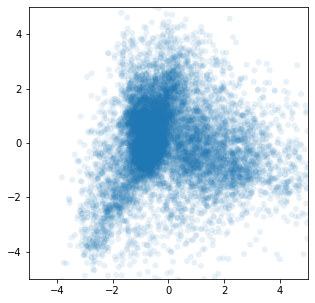

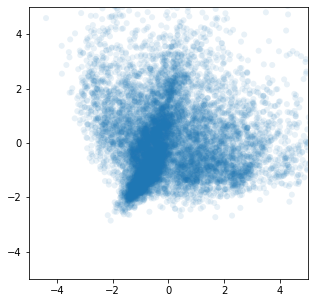

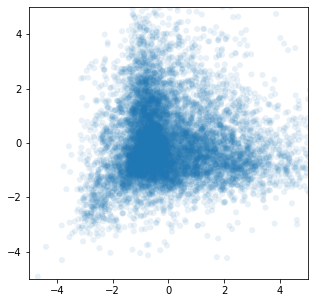

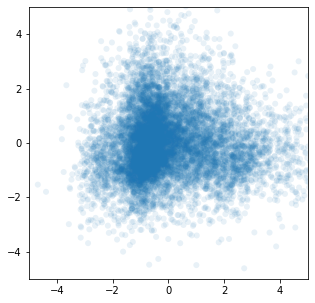

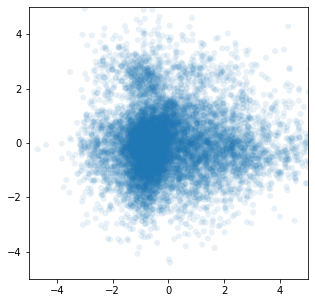

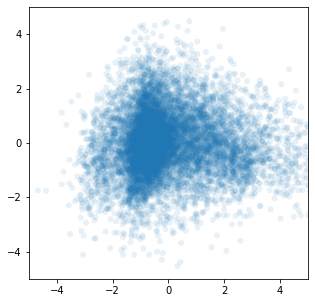

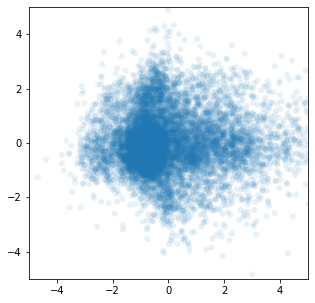

In [550]:
for j in range(3, 10):
    fig = plt.figure()
    fig.set_size_inches(5,5)
    plt.scatter(X[:,2], X[:,j], alpha=.1, edgecolors='none')
    plt.xlim([-5,5])
    plt.ylim([-5,5])
    plt.show()
    plt.close(fig)

In [535]:
Z = pca.inverse_transform(X)

get the car from the bags , tablet . EOS
-7.384411334991455
get the car from the bags , tablet . EOS
-7.020811080932617
get the bags from the car , rogers .


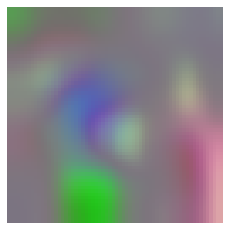

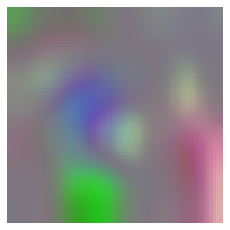

or just hell look at me and i realize hes a girl . EOS
-8.438425064086914
or hell just look at me and i realize hes a girl . EOS
-8.43797779083252
or hell just look at me and realize i m a geek .


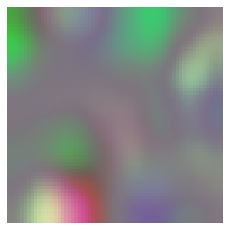

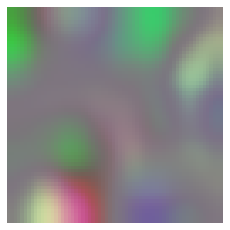

the whole moon shadows with one perfect night sky and the downtown walls . EOS
-22.613693237304688
the night house shadows with two bright red and golden stars . EOS
-14.80587100982666
the night sky shines bright with an oversize moon and two smaller ones .


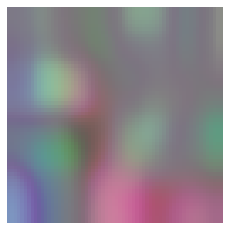

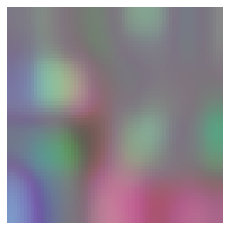

it s hard to remember if someone has stayed with the vampires is nt difficult for these years . EOS
-12.957670211791992
it s hard to act as if someone would ever be with the family these are searching for us . EOS
-15.300714492797852
it s hard to miss when someone would rather be anywhere than with the person they are with .


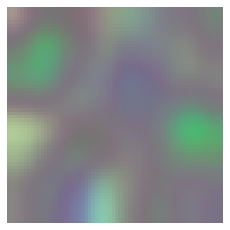

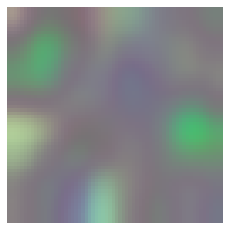

you are the source . EOS
-0.5043073892593384
you are the source . EOS
-0.5007076859474182
you are the source .


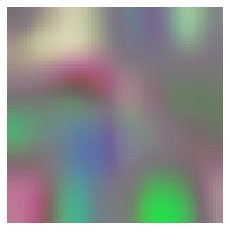

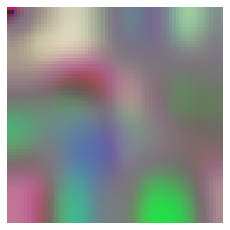

for you , it s now part of your life . EOS
-1.7163636684417725
for you , it s now part of your life . EOS
-1.6389237642288208
for you , it s now part of your life .


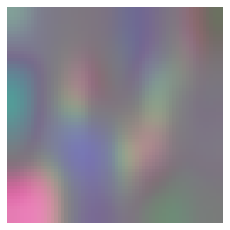

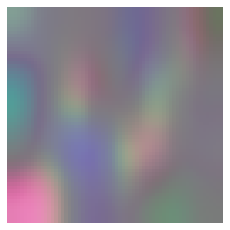

he straightened up and gave his sister a sly look of arousal . EOS
-5.578836917877197
he straightened up and gave his sister a downright look of arousal . EOS
-5.403368949890137
he straightened up and gave his sister a look of mild exasperation .


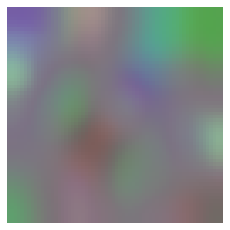

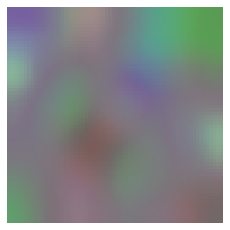

according to whose law ? EOS
-0.5998585224151611
according to whose law ? EOS
-0.4917822778224945
according to whose law ?


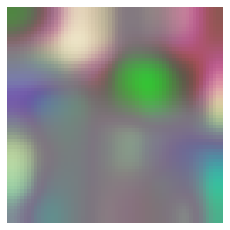

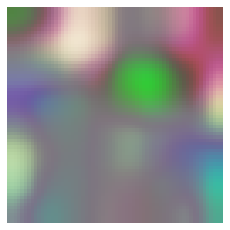

come on , let s dance and talk . EOS
-1.3440265655517578
come on , let s dance and talk . EOS
-1.2356112003326416
come on , let s talk and dance .


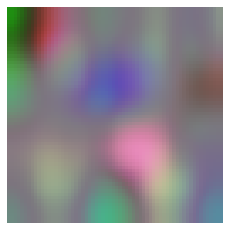

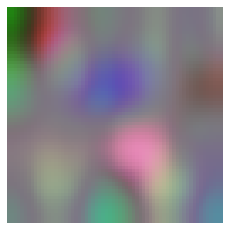

he d only been in the eye for three years and a public half . EOS
-3.996722459793091
he d only been in the eye for three years and a public half . EOS
-4.085220813751221
he d only been in the public eye for three and a half years .


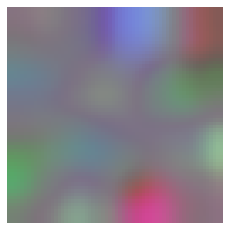

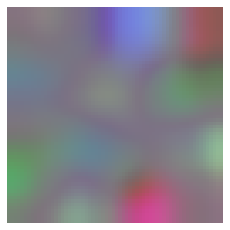

In [502]:
model.eval()
for i, z in enumerate(Z[:10]):
    z_tensor = torch.tensor(z).unsqueeze(0)
    decoded, image1 = model.beam_search_from_vector(z_tensor)
    print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print(decoded[0][1].item())
    z_tensor = torch.tensor(latents[i]).unsqueeze(0)
    decoded, image2 = model.beam_search_from_vector(z_tensor)
    print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print(decoded[0][1].item())
    print(test_lines[i])
    show_image(tensor2image(image1[0]))
    show_image(tensor2image(image2[0]))

In [458]:
Z[1]

array([ 0.3917, -0.    , -0.4726,  0.473 ,  0.2259,  0.5205, -0.    ,
        0.5064, -0.2633, -0.5091,  0.4716,  0.9481,  0.2405,  0.3676,
        0.3511,  0.3835,  0.2746, -0.2628,  0.    , -0.3391,  0.585 ,
       -0.1918, -0.3679,  0.2712, -0.4682, -0.4854,  0.5003, -0.2225,
        0.    , -0.4522, -0.3371, -0.    ,  0.3411, -0.3618,  0.4923,
       -0.4677,  0.5538, -0.5896, -0.2674,  0.1731,  0.    , -0.5109,
        0.2483, -0.    , -0.698 ,  0.    , -0.4418, -0.3002,  0.6541,
        0.6468, -0.2813,  0.3129,  0.5919, -0.4168,  0.3675,  0.    ,
        0.4827,  0.6891, -0.6255,  0.5821, -0.2103, -0.    ,  0.    ,
       -0.4855,  0.7679, -0.305 ,  0.6365,  0.3681, -0.5324, -0.7989,
        0.4767, -0.2226,  0.3998,  0.3326,  0.    ,  0.8235,  0.3763,
       -0.4971,  0.2585, -0.5332, -0.3011,  0.7242, -0.    , -0.3464,
       -0.2891,  0.2731, -0.2444,  0.2895, -0.4776, -0.6425,  0.3054,
        0.1367, -0.6075,  0.5633,  0.4705,  0.    , -0.    ,  0.557 ,
       -0.    , -0.3

In [21]:
x1_t = pca.transform(x1)

red told them . EOS
-9.053362846374512


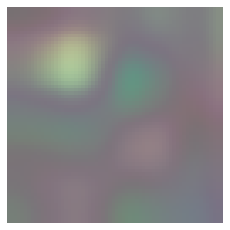

red they needed its around me . EOS
-10.976044654846191


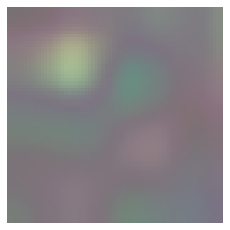

herself since he needed his and bones . EOS
-13.13753604888916


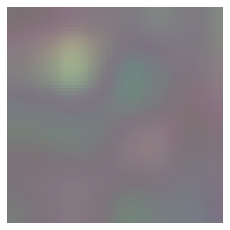

red told him through the weather . EOS
-10.903525352478027


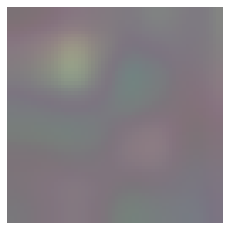

hers without any just them . EOS
-10.773201942443848


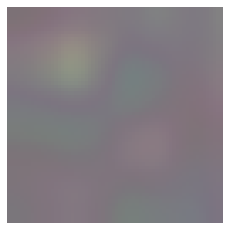

one look would react into this babies . EOS
-10.86978530883789


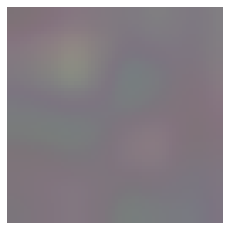

one look would stay into the insane . EOS
-11.065057754516602


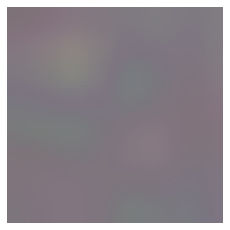

look one by the routine could survive . EOS
-12.148423194885254


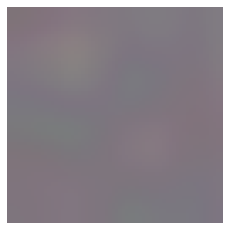

look one by the routine would survive . EOS
-12.682823181152344


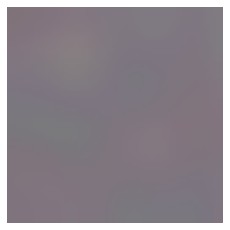

being kissed no the dishes , and she demanded by . EOS
-12.573563575744629


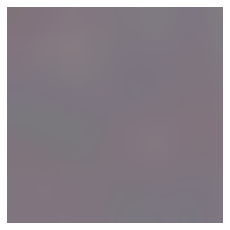

being kissed no the dishes , and he demanded by . EOS
-11.559253692626953


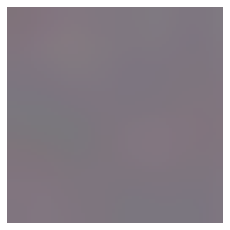

its why he wore no help , at the round and smiles . EOS
-14.745019912719727


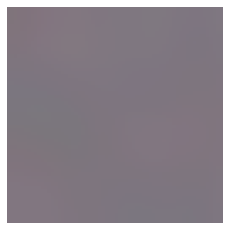

i told herself through those places , but my head always were . EOS
-12.236404418945312


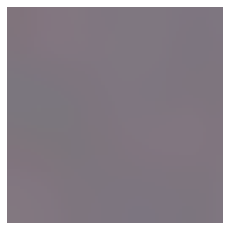

i told herself through those places , but my head always were in . EOS
-10.401872634887695


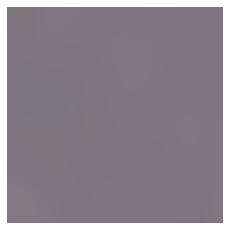

i told herself through those places , but my head always has been in . EOS
-11.874455451965332


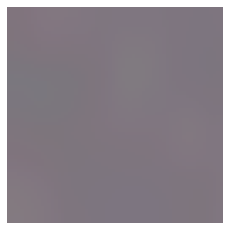

i told myself through these places , but she was always his in your bedroom . EOS
-10.619391441345215


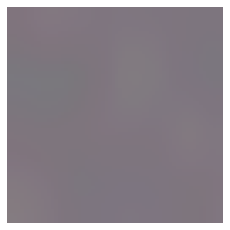

i told myself through these places , but she was always his in your bedroom . EOS
-9.656682968139648


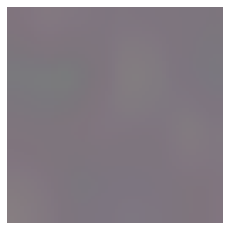

i told myself where never lay in the process , he s about first and dropping . EOS
-11.265753746032715


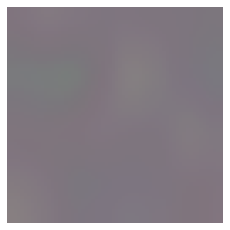

i told myself where never lay in the process , he s about to first dropping . EOS
-11.520416259765625


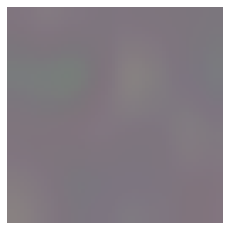

i told myself why he lay down at the level , and probably seemed normal . EOS
-11.69753646850586


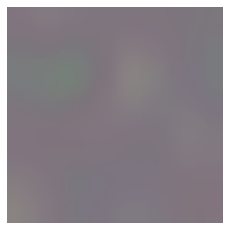

i told myself where i worked through his pants , and she almost in the language to be . EOS
-14.291141510009766


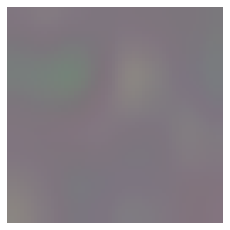

In [50]:
model.eval()
model.to("cpu")
for k in np.linspace(-5, 5, 21):
    z = torch.zeros((1, 256))
    z[0,1] += 
    z = torch.tensor(pca.inverse_transform(z))
    decoded, image = model.beam_search_from_vector(z)
    print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print(decoded[0][1].item())
    show_image(tensor2image(image[0]))

# Vector Interpolation

In [9]:
model.eval()
model.to("cpu")
s1 = "he stayed completely still for the next moment ."
s2 = "then she continued as calmly as she could ."
x1 = sentence2vector(model, s1)
x2 = sentence2vector(model, s2)
bd1, _ = model.beam_search_from_vector(x1)
bd2, _ = model.beam_search_from_vector(x2)
print(index2sentence(bd1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd2[0][0][0,1:].tolist(), index2word))

he stayed completely still for the next moment . EOS
then she continued as calmly as she could . EOS


he stayed completely still for the next moment . EOS
9.6775255
73.440155
-1.0926464796066284


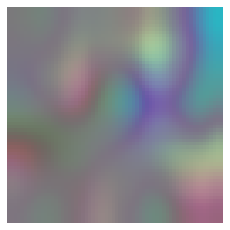

he stayed completely still for the next moment . EOS
8.709772
66.096146
-1.4577901363372803


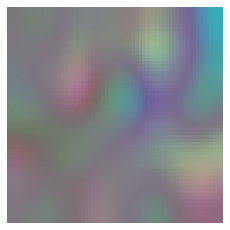

he stayed completely still for the next then . EOS
7.74202
58.752125
-4.12099552154541


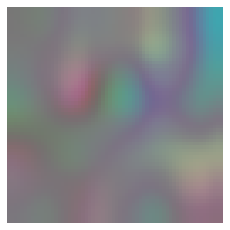

he stayed completely silent for then another still . EOS
6.774267
51.40811
-7.395654678344727


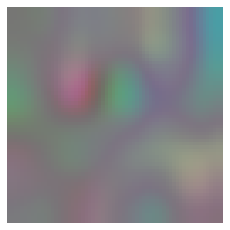

she stayed now as his head barely i wondered . EOS
5.806515
44.064095
-9.130814552307129


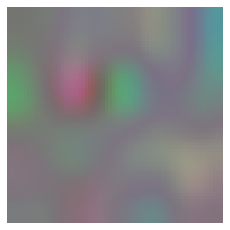

she stayed silent then as suddenly for his here . EOS
4.8387628
36.720078
-8.159804344177246


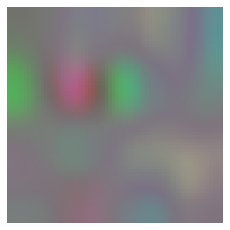

then she stayed silent as he ever watched . EOS
3.87101
29.376062
-6.924533843994141


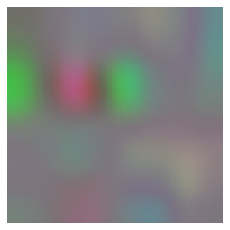

then she stayed silent as he ever watched . EOS
2.9032576
22.032047
-5.341022491455078


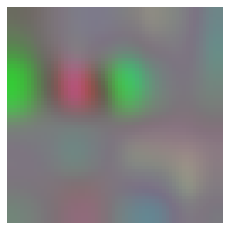

then she continued quietly as she could at my wounds . EOS
1.9355049
14.68803
-5.107645034790039


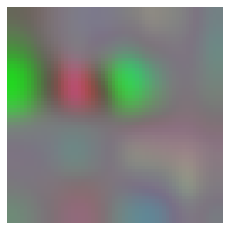

then she continued as calmly as she could . EOS
0.96775275
7.344017
-1.2261866331100464


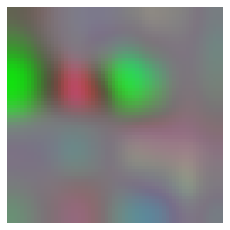

then she continued as calmly as she could . EOS
0.0
0.0
-0.9904053211212158


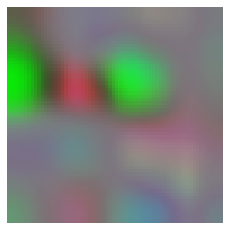

In [95]:
with torch.no_grad():
    for t in np.linspace(0, 1, 11):
        z = x1*(1-t) + x2*t
        decoded, image = model.beam_search_from_vector(z)
        print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
        print(np.linalg.norm(z-x2))
        print(np.linalg.norm((z-x2)[0], ord=1))
        print(decoded[0][1].item())
        show_image(tensor2image(image[0]))

In [25]:
torch.dot(x1[0], x2[0])

tensor(49.3575)

In [12]:
torch.dot(x1[0], x2[0]) / (torch.norm(x1[0])*torch.norm(x2[0]))

tensor(0.5132)

In [21]:
x1t = pca.transform(x1)
x2t = pca.transform(x2)

In [24]:
np.dot(x1t[0], x2t[0])

2.4500134

In [26]:
np.dot(x1t[0], x2t[0]) / (np.linalg.norm(x1t[0])*np.linalg.norm(x2t[0]))

0.050514966

In [27]:
np.linalg.norm(x1t), np.linalg.norm(x2t)

(6.368967, 7.6151667)

In [79]:
model.eval()
model.to("cpu")
s1 = "she gave him an impatient look ."
s2 = "she gave him a dirty look ."
x1 = sentence2vector(model, s1)
x2 = sentence2vector(model, s2)
bd1, _ = model.beam_search_from_vector(x1)
bd2, _ = model.beam_search_from_vector(x2)
print(index2sentence(bd1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd2[0][0][0,1:].tolist(), index2word))

she gave him an impatient look . EOS
she gave him a dirty look . EOS


she gave him an impatient look . EOS
3.8475027
40.21301
-0.5633474588394165


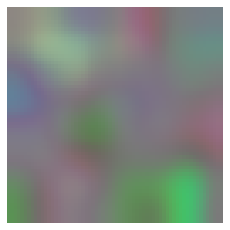

she gave him an impatient look . EOS
3.462752
36.191708
-0.5847907066345215


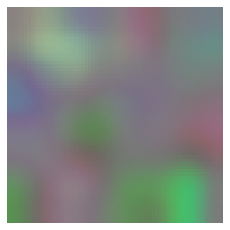

she gave him an impatient look . EOS
3.078002
32.17041
-0.8058154582977295


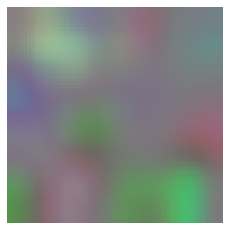

she gave him an impatient look . EOS
2.6932518
28.149109
-2.017224073410034


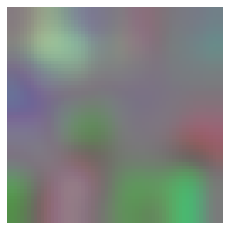

she gave him a mad look . EOS
2.3085015
24.127808
-3.3943355083465576


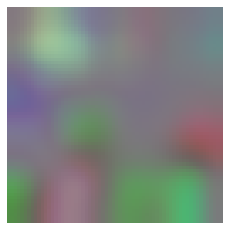

she gave him a dirty glance . EOS
1.9237512
20.106504
-2.5289416313171387


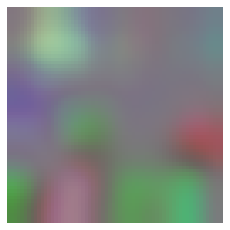

she gave him a dirty look . EOS
1.539001
16.085203
-1.7153949737548828


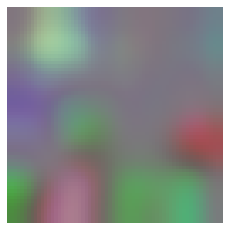

she gave him a dirty look . EOS
1.1542509
12.063904
-0.7266440987586975


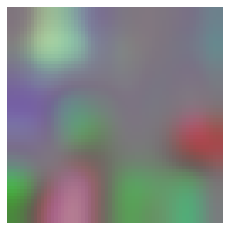

she gave him a dirty look . EOS
0.7695005
8.042603
-0.5560592412948608


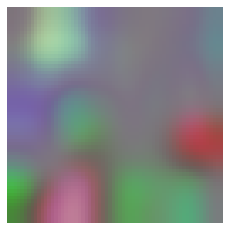

she gave him a dirty look . EOS
0.38475037
4.0213017
-0.5283944010734558


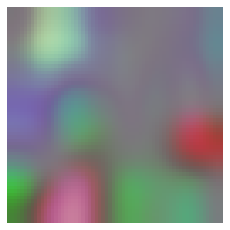

she gave him a dirty look . EOS
0.0
0.0
-0.5353056192398071


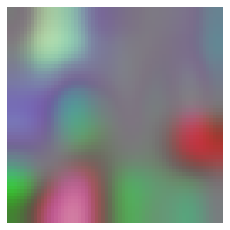

In [80]:
with torch.no_grad():
    for t in np.linspace(0, 1, 11):
        z = x1*(1-t) + x2*t
        decoded, image = model.beam_search_from_vector(z)
        print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
        print(np.linalg.norm(z-x2))
        print(np.linalg.norm((z-x2)[0], ord=1))
        print(decoded[0][1].item())
        show_image(tensor2image(image[0]))

In [103]:
model.eval()
model.to("cpu")
s1 = "my mom was upset when she saw me ."
s2 = "my dad is happy to see you ."
x1 = sentence2vector(model, s1)
x2 = sentence2vector(model, s2)
bd1, _ = model.beam_search_from_vector(x1)
bd2, _ = model.beam_search_from_vector(x2)
print(index2sentence(bd1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd2[0][0][0,1:].tolist(), index2word))

my mom was upset when she saw me . EOS
my dad is happy to see you . EOS


my mom was upset when she saw me . EOS
-0.7613470554351807


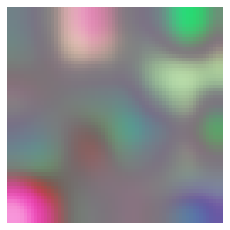

my mom was upset when she saw me . EOS
-0.7649227380752563


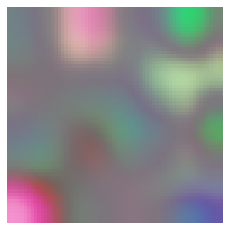

my mom was upset when she saw me . EOS
-0.9780175685882568


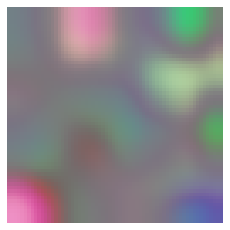

my mom was upset when you see to him . EOS
-3.4400525093078613


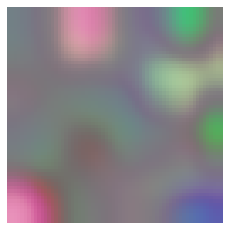

my mom was upset when you see to him . EOS
-5.450231552124023


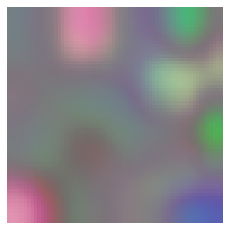

my mom was happy to see me now . EOS
-5.944489002227783


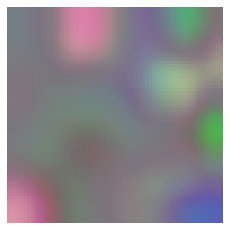

my dad is upset to see you happy . EOS
-5.6611833572387695


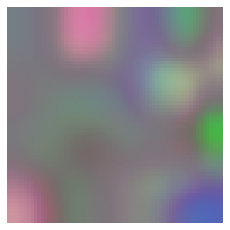

my dad is happy to see you upset . EOS
-2.3680877685546875


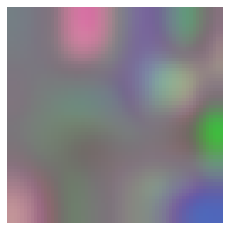

my dad is happy to see you . EOS
-0.8578437566757202


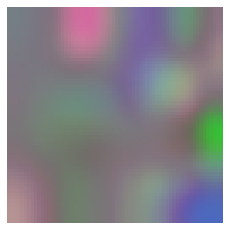

my dad is happy to see you . EOS
-0.7186140418052673


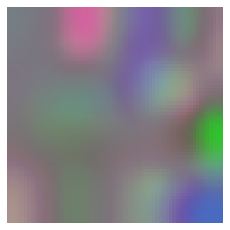

my dad is happy to see you . EOS
-0.6952286958694458


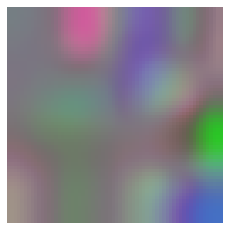

In [104]:
with torch.no_grad():
    for t in np.linspace(0, 1, 11):
        z = x1*(1-t) + x2*t
        decoded, image = model.beam_search_from_vector(z)
        print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
        print(decoded[0][1].item())
        show_image(tensor2image(image[0]))

In [107]:
cos_sim(pca.transform(x1)[0], pca.transform(x2)[0])

0.51392674

In [11]:
model.eval()
model.to("cpu")
s1 = "i am happy ."
s2 = "i am disappointed ."
s3 = "i am excited ."
x1 = sentence2vector(model, s1)
x2 = sentence2vector(model, s2)
x3 = sentence2vector(model, s3)
bd1, _ = model.beam_search_from_vector(x1)
bd2, _ = model.beam_search_from_vector(x2)
bd3, _ = model.beam_search_from_vector(x3)
print(index2sentence(bd1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd2[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd3[0][0][0,1:].tolist(), index2word))

i am happy . EOS
i am disappointed . EOS
i am excited . EOS


0.0 0.0
i am happy . EOS
-0.4284980893135071


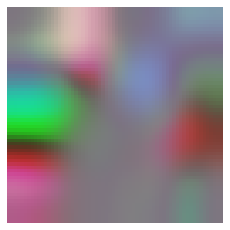

0.0 0.1
i am happy . EOS
-0.42719003558158875


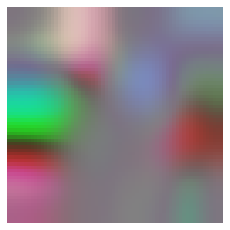

0.0 0.2
i am happy . EOS
-0.44433215260505676


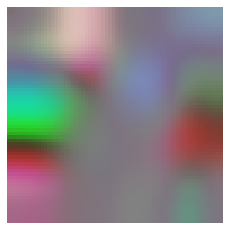

0.0 0.30000000000000004
i am happy . EOS
-0.4934858977794647


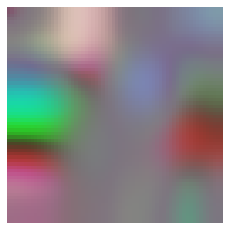

0.0 0.4
i am happy . EOS
-0.6330778002738953


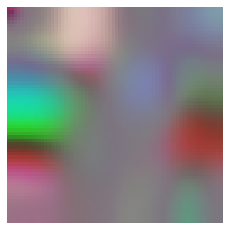

0.0 0.5
i am happy . EOS
-1.1151161193847656


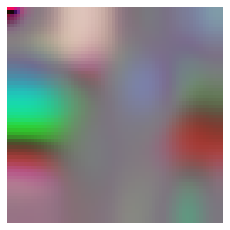

0.0 0.6000000000000001
i am excited . EOS
-0.9042350649833679


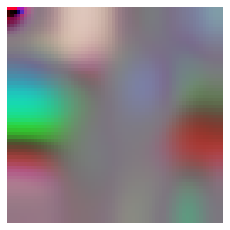

0.0 0.7000000000000001
i am excited . EOS
-0.5321294665336609


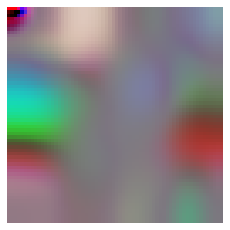

0.0 0.8
i am excited . EOS
-0.42675429582595825


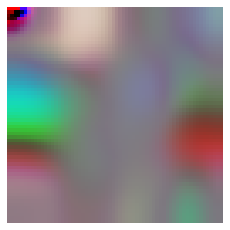

0.0 0.9
i am excited . EOS
-0.3936566412448883


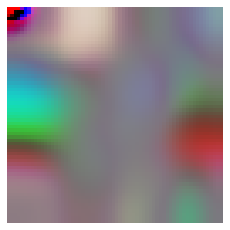

0.0 1.0
i am excited . EOS
-0.3829191029071808


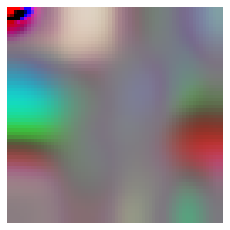

0.1 0.0
i am happy . EOS
-0.4486679136753082


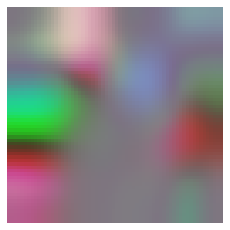

0.1 0.1
i am happy . EOS
-0.44294440746307373


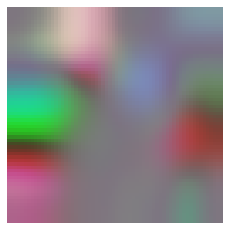

0.1 0.2
i am happy . EOS
-0.45729899406433105


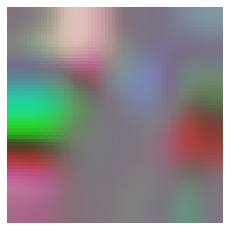

0.1 0.30000000000000004
i am happy . EOS
-0.5143312215805054


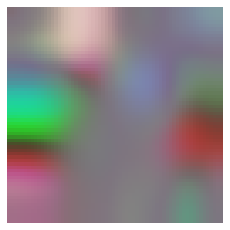

0.1 0.4
i am happy . EOS
-0.6974339485168457


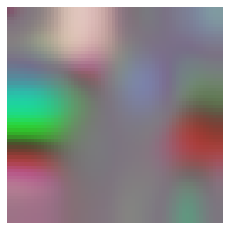

0.1 0.5
i am happy . EOS
-1.3345036506652832


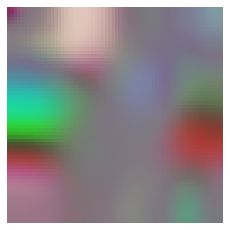

0.1 0.6000000000000001
i am excited . EOS
-0.7085893154144287


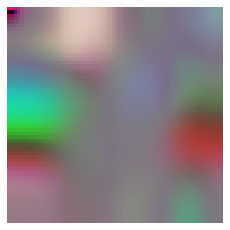

0.1 0.7000000000000001
i am excited . EOS
-0.4554780125617981


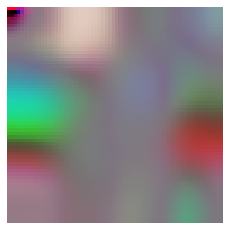

0.1 0.8
i am excited . EOS
-0.3900558352470398


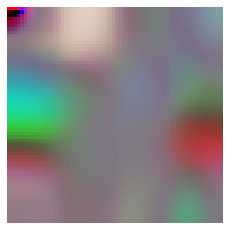

0.1 0.9
i am excited . EOS
-0.37141841650009155


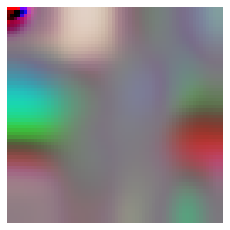

0.1 1.0
i am excited . EOS
-0.366875022649765


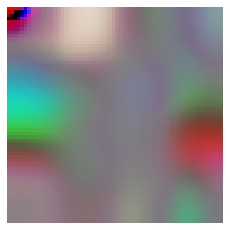

0.2 0.0
i am happy . EOS
-0.4987768530845642


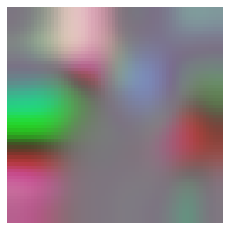

0.2 0.1
i am happy . EOS
-0.4978238046169281


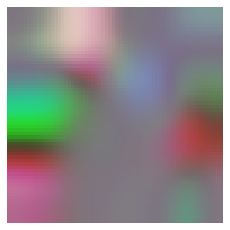

0.2 0.2
i am happy . EOS
-0.5198838710784912


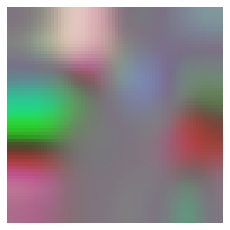

0.2 0.30000000000000004
i am happy . EOS
-0.6131715178489685


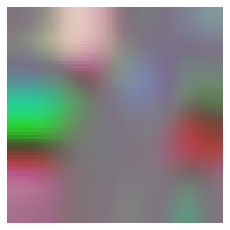

0.2 0.4
i am happy . EOS
-0.9053874015808105


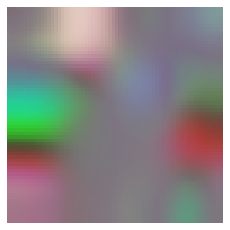

0.2 0.5
i am excited . EOS
-1.4388175010681152


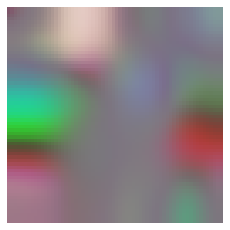

0.2 0.6000000000000001
i am excited . EOS
-0.6471003890037537


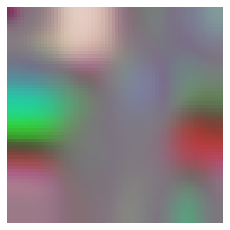

0.2 0.7000000000000001
i am excited . EOS
-0.42791852355003357


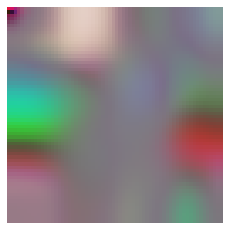

0.2 0.8
i am excited . EOS
-0.37525179982185364


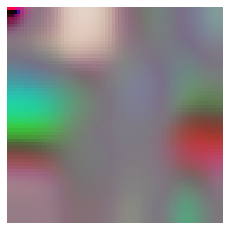

0.2 0.9
i am excited . EOS
-0.36039721965789795


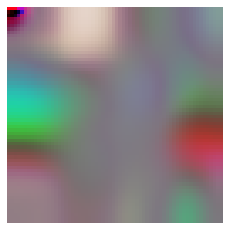

0.2 1.0
i am excited . EOS
-0.35623693466186523


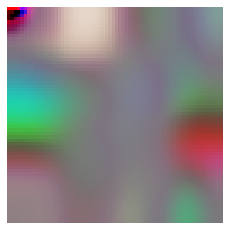

0.30000000000000004 0.0
i am happy . EOS
-0.6413544416427612


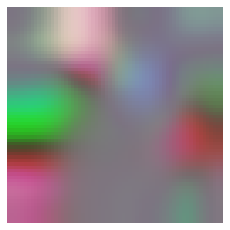

0.30000000000000004 0.1
i am happy . EOS
-0.6603697538375854


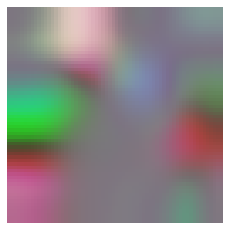

0.30000000000000004 0.2
i am happy . EOS
-0.7382878661155701


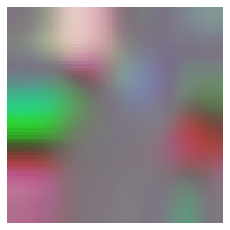

0.30000000000000004 0.30000000000000004
i am happy . EOS
-0.9613844752311707


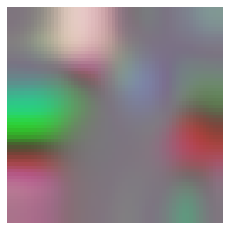

0.30000000000000004 0.4
i am happy . EOS
-1.4933234453201294


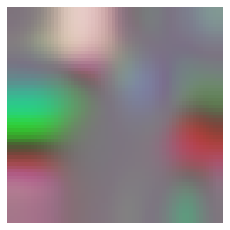

0.30000000000000004 0.5
i am excited . EOS
-1.5710569620132446


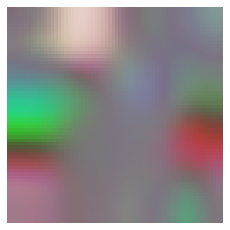

0.30000000000000004 0.6000000000000001
i am excited . EOS
-0.7243659496307373


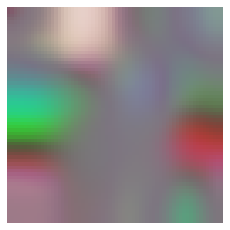

0.30000000000000004 0.7000000000000001
i am excited . EOS
-0.4575067162513733


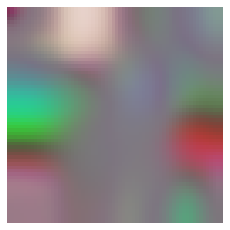

0.30000000000000004 0.8
i am excited . EOS
-0.38072559237480164


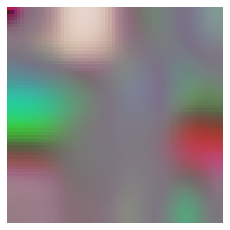

0.30000000000000004 0.9
i am excited . EOS
-0.3595040440559387


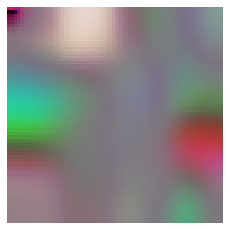

0.30000000000000004 1.0
i am excited . EOS
-0.35454294085502625


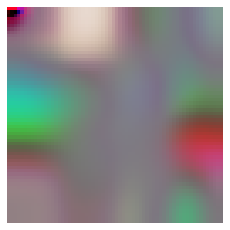

0.4 0.0
i am happy . EOS
-1.0772771835327148


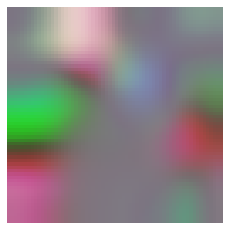

0.4 0.1
i am happy . EOS
-1.188808798789978


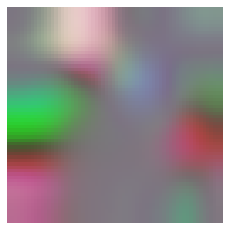

0.4 0.2
i am happy . EOS
-1.4424992799758911


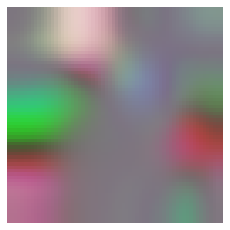

0.4 0.30000000000000004
i am happy . EOS
-1.977797508239746


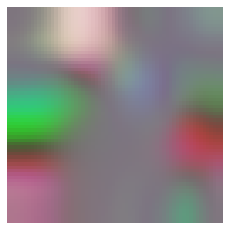

0.4 0.4
i am angry . EOS
-2.445483684539795


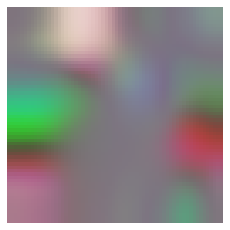

0.4 0.5
i am excited . EOS
-2.121427297592163


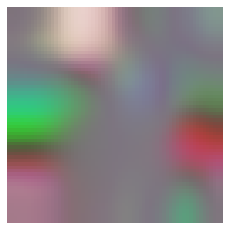

0.4 0.6000000000000001
i am excited . EOS
-0.9939086437225342


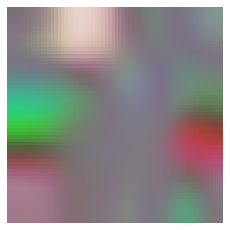

0.4 0.7000000000000001
i am excited . EOS
-0.549881637096405


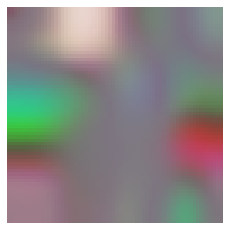

0.4 0.8
i am excited . EOS
-0.4164750576019287


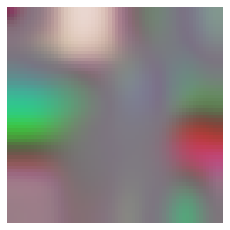

0.4 0.9
i am excited . EOS
-0.37371397018432617


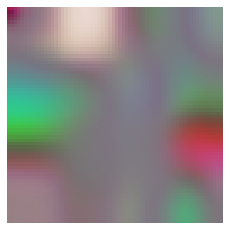

0.4 1.0
i am excited . EOS
-0.3595021069049835


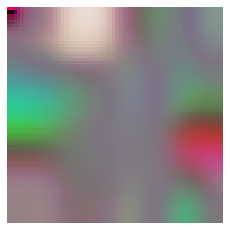

0.5 0.0
i am disappointed . EOS
-1.9883337020874023


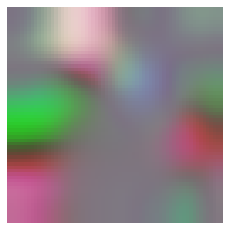

0.5 0.1
i am disappointed . EOS
-1.7502784729003906


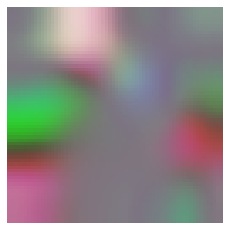

0.5 0.2
i am disappointed . EOS
-1.714630126953125


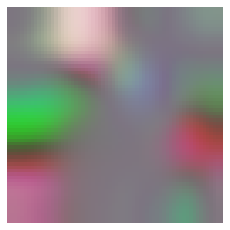

0.5 0.30000000000000004
i am disappointed . EOS
-1.9281113147735596


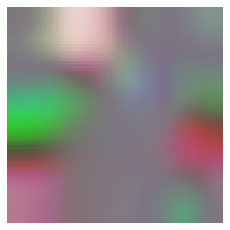

0.5 0.4
i am angry . EOS
-2.15679669380188


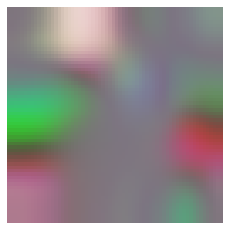

0.5 0.5
i am angry . EOS
-2.0051486492156982


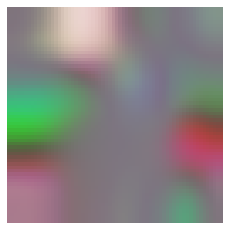

0.5 0.6000000000000001
i am excited . EOS
-1.76430082321167


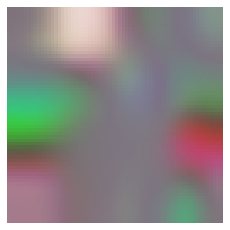

0.5 0.7000000000000001
i am excited . EOS
-0.8960579633712769


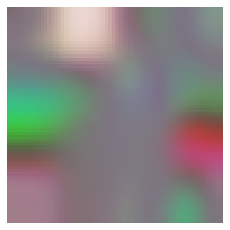

0.5 0.8
i am excited . EOS
-0.5589563846588135


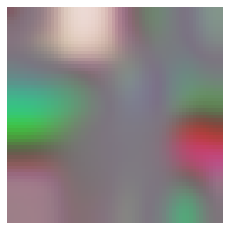

0.5 0.9
i am excited . EOS
-0.43322014808654785


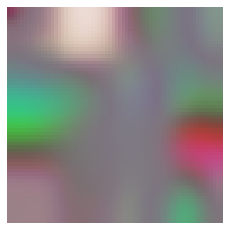

0.5 1.0
i am excited . EOS
-0.38839012384414673


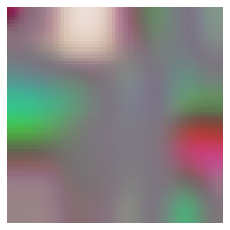

0.6000000000000001 0.0
i am disappointed . EOS
-0.9223004579544067


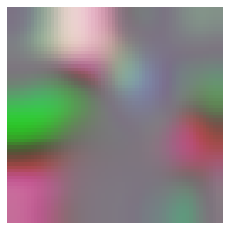

0.6000000000000001 0.1
i am disappointed . EOS
-0.8334503173828125


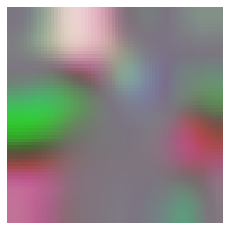

0.6000000000000001 0.2
i am disappointed . EOS
-0.8135089874267578


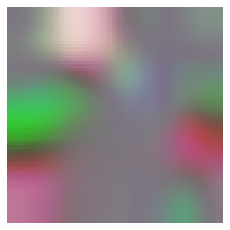

0.6000000000000001 0.30000000000000004
i am disappointed . EOS
-0.9323843717575073


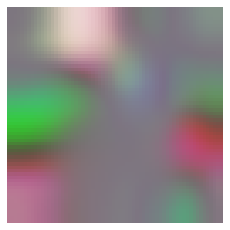

0.6000000000000001 0.4
i am disappointed . EOS
-1.2642087936401367


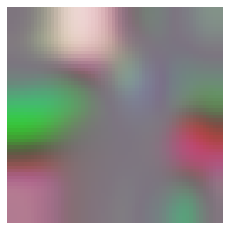

0.6000000000000001 0.5
i am disappointed . EOS
-1.9893293380737305


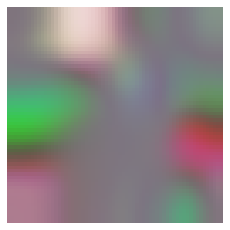

0.6000000000000001 0.6000000000000001
i am angry . EOS
-2.1368284225463867


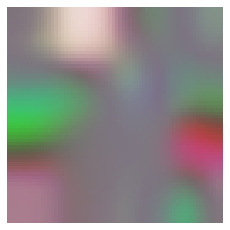

0.6000000000000001 0.7000000000000001
i am excited . EOS
-1.9006001949310303


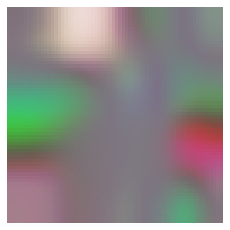

0.6000000000000001 0.8
i am excited . EOS
-1.1775904893875122


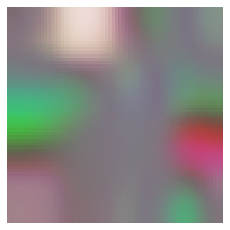

0.6000000000000001 0.9
i am excited . EOS
-0.8594537973403931


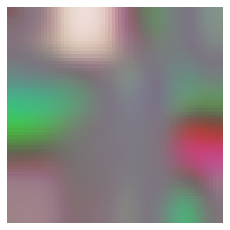

0.6000000000000001 1.0
i am excited . EOS
-0.8182411789894104


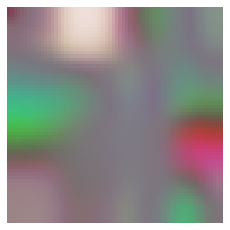

0.7000000000000001 0.0
i am disappointed . EOS
-0.5328593254089355


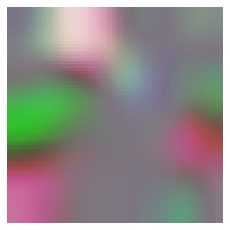

0.7000000000000001 0.1
i am disappointed . EOS
-0.49703601002693176


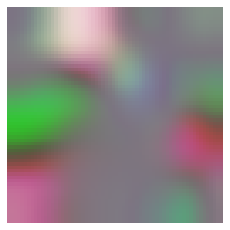

0.7000000000000001 0.2
i am disappointed . EOS
-0.5030867457389832


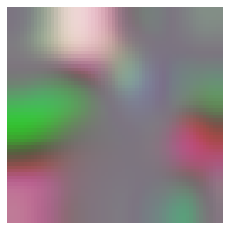

0.7000000000000001 0.30000000000000004
i am disappointed . EOS
-0.562451183795929


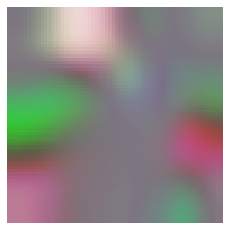

0.7000000000000001 0.4
i am disappointed . EOS
-0.72948157787323


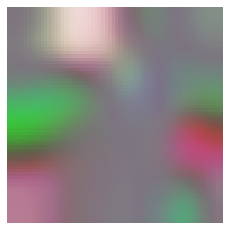

0.7000000000000001 0.5
i am disappointed . EOS
-1.1658257246017456


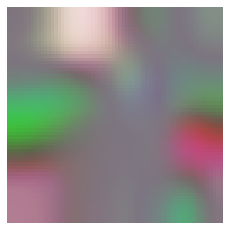

0.7000000000000001 0.6000000000000001
i am disappointed . EOS
-2.1103873252868652


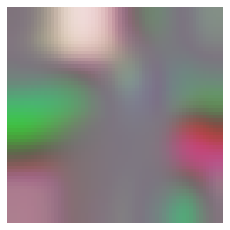

0.7000000000000001 0.7000000000000001
i am angry . EOS
-2.439988374710083


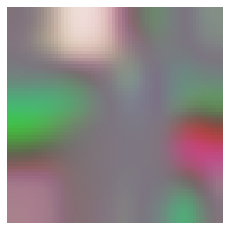

0.7000000000000001 0.8
i am angry . EOS
-3.1097500324249268


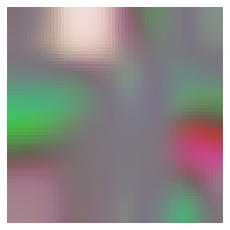

0.7000000000000001 0.9
i am excited . EOS
-3.779374599456787


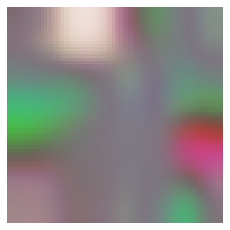

0.7000000000000001 1.0
i am excited humor . EOS
-3.05891489982605


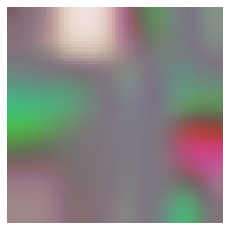

0.8 0.0
i am disappointed . EOS
-0.4195459485054016


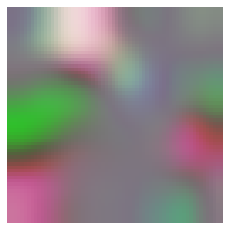

0.8 0.1
i am disappointed . EOS
-0.40531831979751587


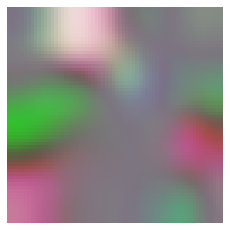

0.8 0.2
i am disappointed . EOS
-0.40866780281066895


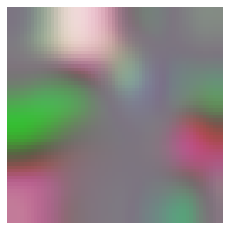

0.8 0.30000000000000004
i am disappointed . EOS
-0.42877817153930664


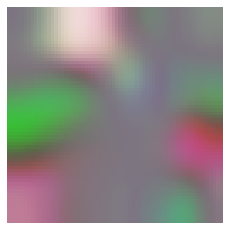

0.8 0.4
i am disappointed . EOS
-0.5027818083763123


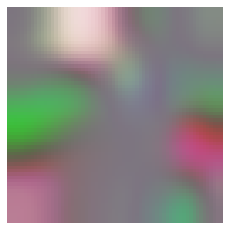

0.8 0.5
i am disappointed . EOS
-0.758430004119873


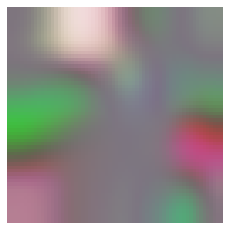

0.8 0.6000000000000001
i am disappointed . EOS
-1.4475947618484497


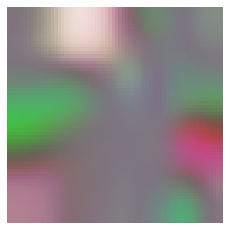

0.8 0.7000000000000001
i am disappointed . EOS
-2.642848253250122


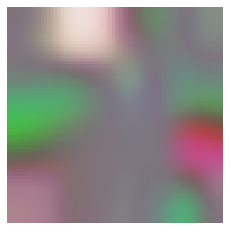

0.8 0.8
i am angry . EOS
-3.533147096633911


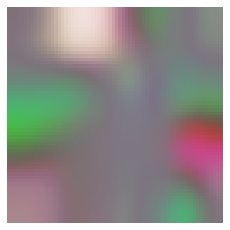

0.8 0.9
i am annoyed . EOS
-4.387379169464111


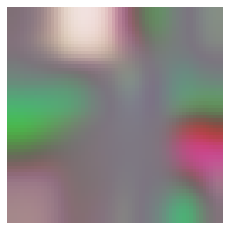

0.8 1.0
i am excited humor . EOS
-4.130138397216797


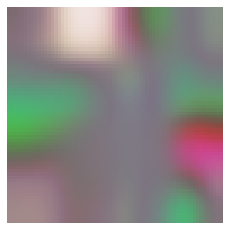

0.9 0.0
i am disappointed . EOS
-0.38774338364601135


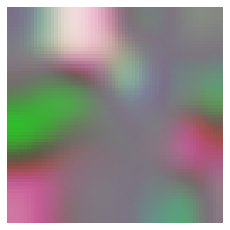

0.9 0.1
i am disappointed . EOS
-0.3789747953414917


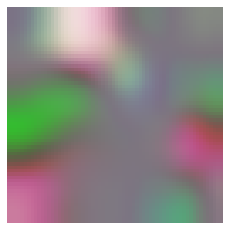

0.9 0.2
i am disappointed . EOS
-0.3794921636581421


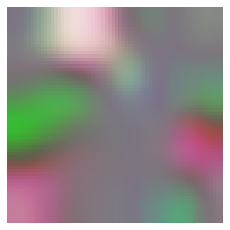

0.9 0.30000000000000004
i am disappointed . EOS
-0.3892400860786438


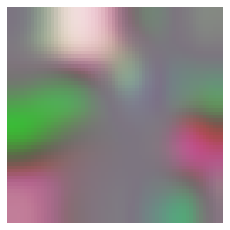

0.9 0.4
i am disappointed . EOS
-0.4295580983161926


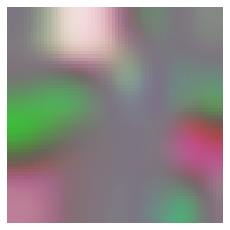

0.9 0.5
i am disappointed . EOS
-0.5668448805809021


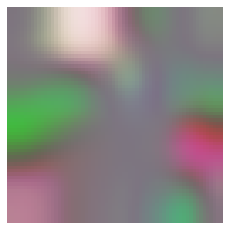

0.9 0.6000000000000001
i am disappointed . EOS
-0.9745240807533264


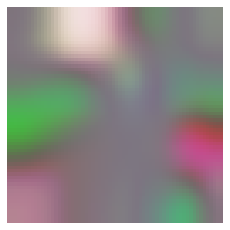

0.9 0.7000000000000001
i am disappointed . EOS
-1.9742387533187866


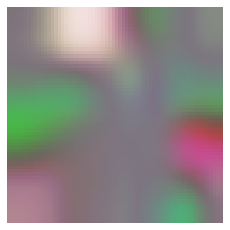

0.9 0.8
i am disappointed . EOS
-3.530518054962158


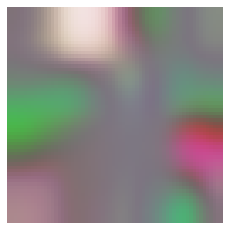

0.9 0.9
i am humor . EOS
-4.4291558265686035


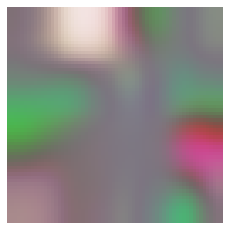

0.9 1.0
i am humor . EOS
-5.280623435974121


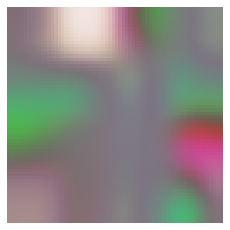

1.0 0.0
i am disappointed . EOS
-0.37664535641670227


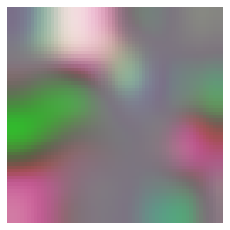

1.0 0.1
i am disappointed . EOS
-0.3723946213722229


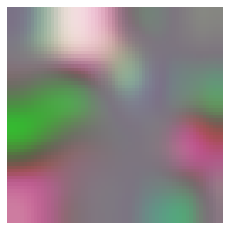

1.0 0.2
i am disappointed . EOS
-0.37206998467445374


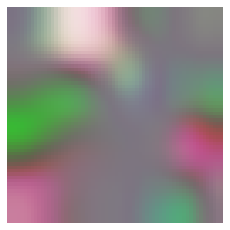

1.0 0.30000000000000004
i am disappointed . EOS
-0.38051503896713257


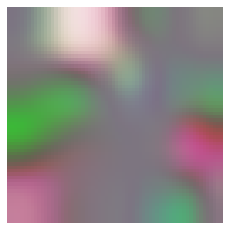

1.0 0.4
i am disappointed . EOS
-0.4124341607093811


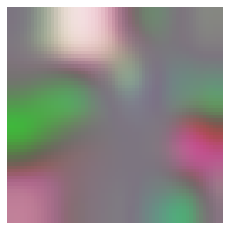

1.0 0.5
i am disappointed . EOS
-0.5129667520523071


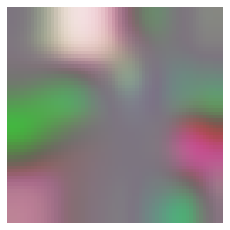

1.0 0.6000000000000001
i am disappointed . EOS
-0.8161311745643616


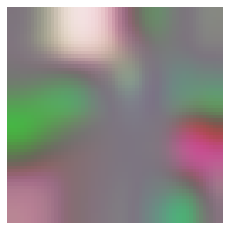

1.0 0.7000000000000001
i am disappointed . EOS
-1.554692029953003


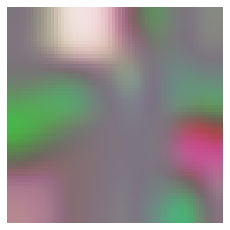

1.0 0.8
i am disappointed . EOS
-2.8648953437805176


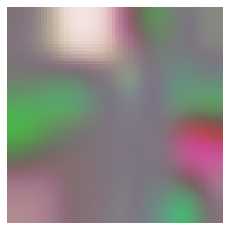

1.0 0.9
i am humor curious . EOS
-4.504022598266602


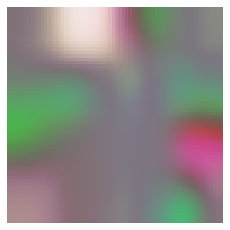

1.0 1.0
i am humor curious . EOS
-5.166092872619629


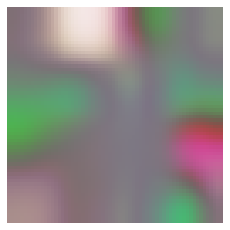

In [120]:
with torch.no_grad():
    for t1 in np.linspace(0, 1, 11):
        for t2 in np.linspace(0, 1, 11):
            y1 = x2 - x1
            y2 = x3 - x1
            z = x1 + t1*y1 + t2*y2
            decoded, image = model.beam_search_from_vector(z)
            print(t1, t2)
            print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
            print(decoded[0][1].item())
            show_image(tensor2image(image[0]))

i am disappointed . EOS
-4.3751044273376465


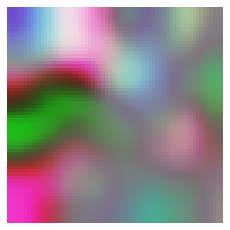

In [15]:
z = x1 + x2 - x3
decoded, image = model.beam_search_from_vector(z)
print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
print(decoded[0][1].item())
show_image(tensor2image(image[0]))

In [20]:
model.eval()
model.to("cpu")

s1 = "i am happy ."
s2 = "i am disappointed ."
s3 = "i am excited ."
s4 = "i am unhappy ."
s5 = "i am curious ."
s6 = "i am sad ."
s7 = "i am annoyed ."
s8 = "i am interested ."
s9 = "i am nervous ."

x1 = sentence2vector(model, s1)
bd1, _ = model.beam_search_from_vector(x1)
print(index2sentence(bd1[0][0][0,1:].tolist(), index2word))
x2 = sentence2vector(model, s2)
bd2, _ = model.beam_search_from_vector(x2)
print(index2sentence(bd2[0][0][0,1:].tolist(), index2word))
x3 = sentence2vector(model, s3)
bd3, _ = model.beam_search_from_vector(x3)
print(index2sentence(bd3[0][0][0,1:].tolist(), index2word))
x4 = sentence2vector(model, s4)
bd4, _ = model.beam_search_from_vector(x4)
print(index2sentence(bd4[0][0][0,1:].tolist(), index2word))
x5 = sentence2vector(model, s5)
bd5, _ = model.beam_search_from_vector(x5)
print(index2sentence(bd5[0][0][0,1:].tolist(), index2word))
x6 = sentence2vector(model, s6)
bd6, _ = model.beam_search_from_vector(x6)
print(index2sentence(bd6[0][0][0,1:].tolist(), index2word))
x7 = sentence2vector(model, s7)
bd7, _ = model.beam_search_from_vector(x7)
print(index2sentence(bd7[0][0][0,1:].tolist(), index2word))
x8 = sentence2vector(model, s8)
bd8, _ = model.beam_search_from_vector(x8)
print(index2sentence(bd8[0][0][0,1:].tolist(), index2word))
x9 = sentence2vector(model, s9)
bd9, _ = model.beam_search_from_vector(x9)
print(index2sentence(bd9[0][0][0,1:].tolist(), index2word))

i am happy . EOS
i am disappointed . EOS
i am excited . EOS
i am unhappy . EOS
i am curious . EOS
i am sad . EOS
i am annoyed . EOS
i am interested . EOS
i am nervous . EOS


In [649]:
print(np.linalg.norm(x1), np.linalg.norm(x2))
print(np.linalg.norm(x1[0], ord=1), np.linalg.norm(x2[0], ord=1))
print(np.linalg.norm(x1-x2), np.linalg.norm((x1-x2)[0], ord=1))

9.790368 9.824369
98.97142 90.34711
9.6775255 73.440155


In [658]:
s1_p1 = "he stayed still for the next moment ."
x1_p1 = sentence2vector(model, s1_p1)
bd1_p1, _ = model.beam_search_from_vector(x1_p1)
print(index2sentence(bd1_p1[0][0][0,1:].tolist(), index2word))
print(bd1_p1[0][1].item())
print(np.linalg.norm(x1_p1-x2), np.linalg.norm(x1_p1-x1))
print(np.linalg.norm((x1_p1-x2)[0], ord=1), np.linalg.norm((x1_p1-x1)[0], ord=1))

he stayed still for the next moment . EOS
-1.014778733253479
9.673629 2.4367085
68.1452 25.015472


In [659]:
s1_p2 = "he stayed calm for the next moment ."
x1_p2 = sentence2vector(model, s1_p2)
bd1_p2, _ = model.beam_search_from_vector(x1_p2)
print(index2sentence(bd1_p2[0][0][0,1:].tolist(), index2word))
print(bd1_p2[0][1].item())
print(np.linalg.norm(x1_p2-x2), np.linalg.norm(x1_p2-x1_p1))
print(np.linalg.norm((x1_p2-x2)[0], ord=1), np.linalg.norm((x1_p2-x1_p1)[0], ord=1))

he stayed calm for the next moment . EOS
-0.7334619164466858
9.63153 3.6324706
72.28766 28.094715


In [660]:
s1_p3 = "he stayed calm for the moment ."
x1_p3 = sentence2vector(model, s1_p3)
bd1_p3, _ = model.beam_search_from_vector(x1_p3)
print(index2sentence(bd1_p3[0][0][0,1:].tolist(), index2word))
print(bd1_p3[0][1].item())
print(np.linalg.norm(x1_p3-x2), np.linalg.norm(x1_p3-x1_p2))
print(np.linalg.norm((x1_p3-x2)[0], ord=1), np.linalg.norm((x1_p3-x1_p2)[0], ord=1))

he stayed calm for the moment . EOS
-0.6184861660003662
9.222424 1.3275596
66.34575 12.390903


In [661]:
s1_p4 = "she stayed calm for the moment ."
x1_p4 = sentence2vector(model, s1_p4)
bd1_p4, _ = model.beam_search_from_vector(x1_p4)
print(index2sentence(bd1_p4[0][0][0,1:].tolist(), index2word))
print(bd1_p4[0][1].item())
print(np.linalg.norm(x1_p4-x2), np.linalg.norm(x1_p4-x1_p3))
print(np.linalg.norm((x1_p4-x2)[0], ord=1), np.linalg.norm((x1_p4-x1_p3)[0], ord=1))

she stayed calm for the moment . EOS
-0.6094896197319031
7.747842 4.6505513
59.70549 8.103156


In [662]:
s1_p5 = "then she stayed calm for the moment ."
x1_p5 = sentence2vector(model, s1_p5)
bd1_p5, _ = model.beam_search_from_vector(x1_p5)
print(index2sentence(bd1_p5[0][0][0,1:].tolist(), index2word))
print(bd1_p5[0][1].item())
print(np.linalg.norm(x1_p5-x2), np.linalg.norm(x1_p5-x1_p4))
print(np.linalg.norm((x1_p5-x2)[0], ord=1), np.linalg.norm((x1_p5-x1_p4)[0], ord=1))

then she stayed calm for the moment . EOS
-1.2471057176589966
6.2279496 3.9084914
52.079754 15.232653


In [663]:
s1_p6 = "then she continued calmly for the moment ."
x1_p6 = sentence2vector(model, s1_p6)
bd1_p6, _ = model.beam_search_from_vector(x1_p6)
print(index2sentence(bd1_p6[0][0][0,1:].tolist(), index2word))
print(bd1_p6[0][1].item())
print(np.linalg.norm(x1_p6-x2), np.linalg.norm(x1_p6-x1_p5))
print(np.linalg.norm((x1_p6-x2)[0], ord=1), np.linalg.norm((x1_p6-x1_p5)[0], ord=1))

then she continued calmly for the moment . EOS
-0.9559589624404907
4.832558 3.8835914
24.10048 38.746628


In [664]:
s1_p7 = "then she continued calmly ."
x1_p7 = sentence2vector(model, s1_p7)
bd1_p7, _ = model.beam_search_from_vector(x1_p7)
print(index2sentence(bd1_p7[0][0][0,1:].tolist(), index2word))
print(bd1_p7[0][1].item())
print(np.linalg.norm(x1_p7-x2), np.linalg.norm(x1_p7-x1_p6))
print(np.linalg.norm((x1_p7-x2)[0], ord=1), np.linalg.norm((x1_p7-x1_p6)[0], ord=1))

then she continued calmly . EOS
-0.5494513511657715
4.2970247 3.3606367
24.17007 23.300358


In [665]:
s1_p8 = "then she continued as calmly as possible ."
x1_p8 = sentence2vector(model, s1_p8)
bd1_p8, _ = model.beam_search_from_vector(x1_p8)
print(index2sentence(bd1_p8[0][0][0,1:].tolist(), index2word))
print(bd1_p8[0][1].item())
print(np.linalg.norm(x1_p8-x2), np.linalg.norm(x1_p8-x1_p7))
print(np.linalg.norm((x1_p8-x2)[0], ord=1), np.linalg.norm((x1_p8-x1_p7)[0], ord=1))

then she continued as calmly as possible . EOS
-0.6673450469970703
2.0801573 3.734737
14.855576 20.904537


In [666]:
s1_p9 = "then she continued as calmly as she could ."
x1_p9 = sentence2vector(model, s1_p9)
bd1_p9, _ = model.beam_search_from_vector(x1_p9)
print(index2sentence(bd1_p9[0][0][0,1:].tolist(), index2word))
print(bd1_p9[0][1].item())
print(np.linalg.norm(x1_p9-x2), np.linalg.norm(x1_p9-x1_p8))
print(np.linalg.norm((x1_p9-x2)[0], ord=1), np.linalg.norm((x1_p9-x1_p8)[0], ord=1))

then she continued as calmly as she could . EOS
-0.9904053211212158
0.0 2.0801573
0.0 14.855576


9.6775255

In [203]:
zero_index

tensor([  1,   6,  18,  28,  31,  40,  43,  45,  55,  61,  62,  74,  82,  95,
         96,  98, 110, 122, 133, 148, 151, 173, 191, 211, 221, 222, 226, 233,
        235, 245, 249, 252])

In [268]:
np.argsort(torch.abs(x1-x2)[0]), np.sort(torch.abs(x1-x2)[0])

(tensor([  1,  18,  40,  96, 222,   6,  82, 221,  95, 233, 110, 249,  55,  28,
         122, 151, 252,  43,  61, 191,  74, 211, 173, 226,  98, 245, 235,  31,
         133,  45,  62, 148, 250,  60, 115,  69,  14,  19, 241, 135,  17, 161,
         225, 212, 120, 103, 124, 123, 172,  26,  25, 187,  90,  84, 139,  63,
          79,  94,  78,  76, 159, 109, 154, 101, 200, 171, 229,   0, 100, 132,
         214, 227,  64, 134,  72, 195, 189, 108, 140, 182, 197, 199, 119, 156,
           4, 228,  21, 220, 242, 207, 188,  80, 165, 138, 202,  83, 150,  15,
         145,  91,  32, 208, 196,  27,  65,  50,  66, 244,  71, 237, 102, 131,
         243, 169, 160,  53,   8, 105, 170,  16, 186, 177,  87, 230, 219,  86,
          49, 254, 158,  23, 209,  42,  93, 137,  47, 178,  37, 180, 201, 104,
          57,  54, 121, 143, 175,  67, 166, 126,   3, 153, 127, 106, 204,  11,
         231, 232, 141, 213, 194,  68, 253,  89,  70, 125,  12, 248,  48, 116,
         112, 236, 157, 118,  38,  56, 146,  85, 234

In [247]:
sum(np.sort(torch.abs(x1 - x2)[0]) < 0.1)

116

In [251]:
low_diff_index = np.argsort(torch.abs(x1-x2)[0])[:sum(np.sort(torch.abs(x1 - x2)[0]) < 0.1)]

In [254]:
x2_mod = torch.zeros((1, 256))
x2_mod[:, low_diff_index] = x2[:, low_diff_index]

he stayed completely still for the next moment . EOS
-1.0521230697631836


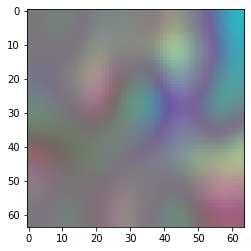

then she continued as calmly as she could . EOS
-1.150617241859436


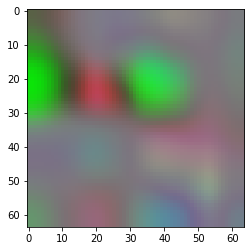

In [260]:
with torch.no_grad():
    z = torch.clone(x1)
    z[:, low_diff_index] = x2[:,low_diff_index]
    decoded, image = model.beam_search_from_vector(z)
    print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print(decoded[0][1].item())
    plt.figure()
    plt.imshow(tensor2image(image[0]))
    plt.show()
    z = torch.clone(x2)
    z[:, low_diff_index] = x1[:,low_diff_index]
    decoded, image = model.beam_search_from_vector(z)
    print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print(decoded[0][1].item())
    plt.figure()
    plt.imshow(tensor2image(image[0]))
    plt.show()

180
then she continued as calmly as she could . EOS
-4.933073997497559


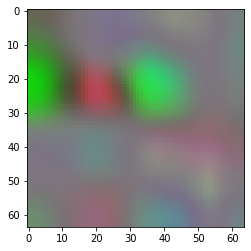

In [281]:
with torch.no_grad():
    t=180
    sorted_indices = np.argsort(torch.abs(x1-x2)[0])[:t]
    z = torch.clone(x2)
    z[:, sorted_indices] = x1[:, sorted_indices]
    decoded, image = model.beam_search_from_vector(z)
    print(t)
    print(index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print(decoded[0][1].item())
    plt.figure()
    plt.imshow(tensor2image(image[0]))
    plt.show()

In [287]:
np.argsort(torch.abs(x1-x2)[0])[-60:]

tensor([246,  34,  33, 162,  35, 210,  58, 218,  77,  92, 130, 163,  81,   7,
        216, 251,  97, 136, 174, 255, 224, 117, 247,  41, 155, 107, 190, 128,
         44, 164,  52, 192, 144, 185,  30,  24, 215,  99, 206, 198,  75,  29,
        152, 142,  73,  88, 168, 129, 203,  59, 217, 239, 193, 176, 183, 179,
         22, 181, 223, 114])

In [283]:
x1[0,np.argsort(torch.abs(x1-x2)[0])[-60:]]

tensor([ 0.4440,  0.6603, -0.0967,  0.4541, -0.4302,  0.6070, -0.7021,  0.4905,
        -0.4859, -1.0428,  0.5154,  0.5364,  1.4369,  0.0360, -0.6694,  0.4274,
         0.9475,  1.5117,  0.6399, -0.5376, -0.1966,  0.6866,  0.9424, -0.1884,
        -1.1618,  0.9961, -0.8744, -0.9148, -0.8558, -0.3156,  0.8783,  0.7085,
        -0.8071, -0.4072, -0.4098, -0.0232,  0.0893, -1.0028, -0.9409, -0.0739,
         0.8078, -0.5050, -0.3751,  0.9707,  0.8382, -0.0343,  1.2074, -1.5238,
         1.1340,  1.4568,  1.4324,  1.5380,  1.7807,  2.0018, -0.1204, -4.0982,
        -0.0611, -0.4281,  3.7089,  0.3274])

In [284]:
x2[0,np.argsort(torch.abs(x1-x2)[0])[-60:]]

tensor([ 0.1117,  0.3223, -0.4364,  0.1089, -0.0828,  0.2429, -0.3282,  0.1003,
        -0.8798, -1.4554,  0.9366,  0.1109,  1.0113,  0.4860, -0.2105,  0.8882,
         0.4818,  1.0359,  0.1519, -0.0351, -0.7093,  0.1609,  0.4050, -0.7265,
        -0.6223,  0.4431, -1.4294, -0.3450, -0.2650, -0.9067,  0.2792,  0.1087,
        -1.4162, -1.0178, -1.0271, -0.6435,  0.7363, -0.3375, -0.2677, -0.7494,
         0.0771, -1.2817, -1.1646,  0.1807,  0.0438, -0.8334,  0.3294, -0.5437,
         0.1392,  0.4018,  0.1886,  0.1697,  0.1841,  0.1045, -2.2658, -1.5112,
        -3.5793, -4.0004,  0.1071,  3.9398])

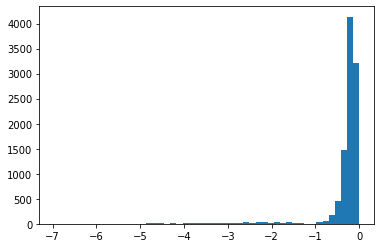

In [295]:
j = 22
plt.hist(latents[:,j], bins=50)
plt.show()

In [46]:
for i in range(len(latents)):
    pos = np.where(latents[0] > 1e-5)[0] == np.where(latents[i] > 1e-5)[0]
    zero = np.where(np.abs(latents[0]) < 1e-5)[0] == np.where(np.abs(latents[i]) < 1e-5)[0]
    neg = np.where(latents[0] < -1e-5)[0] == np.where(latents[i] < -1e-5)[0]
    if sum(pos) != len(pos) or sum(zero) != len(zero) or sum(neg) != len(neg):
        print(i)

0


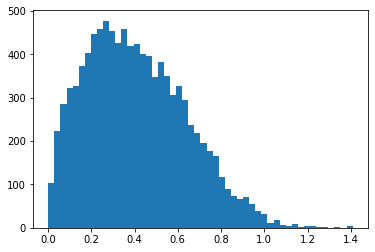

0.001 sterling wonders .
0.004 saddle up , demon .
0.006 an emergency broadcast or anything ?
0.007 absolutely essential !
0.008 yo yo snarls .

1.408 that day her mother had died along with many others .
1.395 i wish i could just take you home .
1.388 lost together .
1.326 as soon as were alone without the kids .
1.282 dead would be better .
2


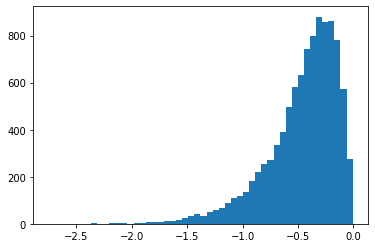

-2.755 strange , wonderful smells filled the air .
-2.509 you just drank liquid sugar .
-2.378 i had feelings i had nt experienced before .
-2.344 you feel passion for writing .
-2.333 i need to spend more time staring at them and less time tasting them .

-0.007 the enemy , men murmured .
-0.008 he growled , and faced me .
-0.008 dawn will be here soon , he said .
-0.009 kyle roared .
-0.010 the agent in black ?
3


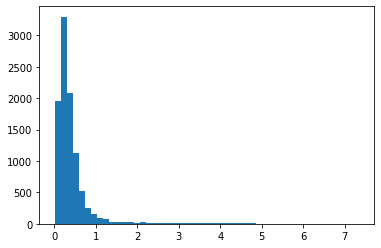

0.008 experiences ?
0.009 my , goodness !
0.014 my mind is powerful .
0.017 what youth ?
0.018 you know , wondering .

7.347 now up my spine , up my bare back , under the shirt .
7.302 he washed up , suited up and scooted the rolling stool beside her bed .
7.137 i shut up , shut up , shut up !
6.510 get up , you son of a bitch , get up !
5.444 hold up a sec , though , so i can get out of your way first .
4


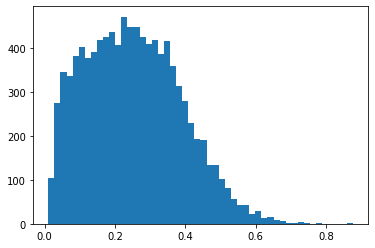

0.011 being careful not to wake her , he undid her pants and slid them from her slender legs .
0.011 there was rushing water somewhere nearby , and the calling of the occasional bird in the distant trees .
0.012 so , today she d paired navy flare leg trousers with a striped blue and yellow open collar shirt .
0.014 with the only access road newly blocked by fallen trees , it was another two day hike into town .
0.014 then , when the pier section came near , he snagged it with his right arm .

0.875 his lips smacked together .
0.788 she smacked his arm playfully .
0.774 i just fucked my boss .
0.748 the devil i do .
0.733 the man just smiled .
5


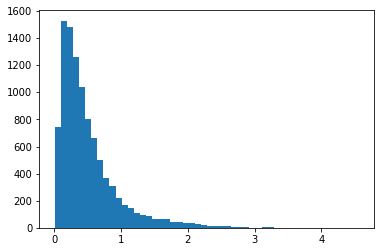

0.007 you can lead us , right ?
0.008 his arm is draped around me .
0.009 everything here was unknown .
0.011 you have my support .
0.012 i walked away before he could say anything else .

4.562 bob really needs this job , and he really needs this show to be a hit .
4.523 it was really , really strange having park s mom wash her hair .
4.196 really , really miss her .
3.274 he really is very nice to look at .
3.232 usually my brain was like a warehouse .
7


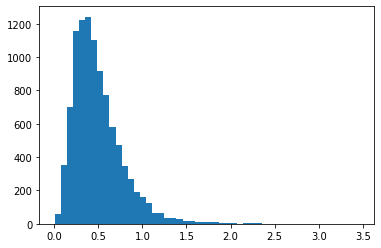

0.006 stumbling for safety .
0.015 for the last time , where is the body ?
0.024 despite the shaking of my hands , i follow her .
0.028 time for a new approach .
0.029 he lowered his whole body onto mine .

3.456 that was too weird , too uncomfortable , and so it brought everything back .
2.356 too bad to cut it , worse to cut it badly .
2.327 i think we practiced and giggled too much because we both fell asleep willow stated .
2.319 i know you too well not to think otherwise .
2.266 this chase was far too much activity for him , in far too cold an environment .
8


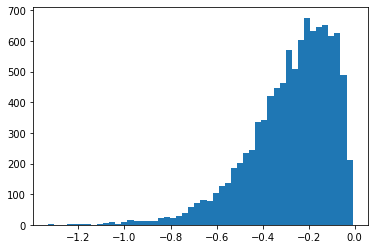

-1.331 opening her eyes hurt .
-1.230 cracks can spread .
-1.226 its eyes disappeared into empty sockets .
-1.215 his eyes bulge like grapes .
-1.205 her provocative eyes hinted below the waist .

-0.009 i did nt expect to find you here , my dear .
-0.009 i ve got ta warn you , i m a good girl .
-0.009 i lied , thinking it would help your case .
-0.010 i d found a bad luck voodoo flower in my bed .
-0.011 baby , the last thing i want is a boyfriend .
9


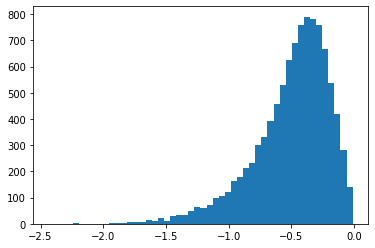

-2.438 she possessed a heart of pure gold and was especially patient with humans .
-2.240 new tattoo ?
-2.223 oversized gold colored statues spilled out from the building .
-2.103 he had them mounted in a special book with her name engraved in gold letters on the cover .
-2.084 the construction crew is at my place repairing the pool house , and they re noisy and distracting .

-0.011 the feedback squeaked loudly .
-0.012 it came naturally to her .
-0.014 straight shots .
-0.018 she softly gasped .
-0.019 a protest died in my throat .
10


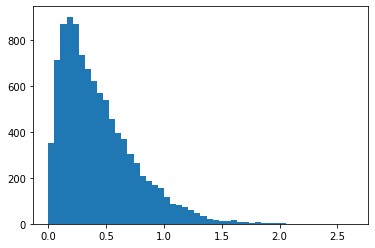

0.002 i relax some .
0.004 i m so much better .
0.005 only himself .
0.005 you needed a blood sacrifice .
0.006 they were so much in love .

2.632 the general bowed , turned sharply on his heels and departed with swift steps that rang through the air .
2.549 a mournful howl erupted from behind the swinging doors followed by a series of muffled sobs .
2.498 dean heard the rumble of a huge crowd and constant applause .
2.376 he shouted , pointing up at the four floating creatures who hissed in return .
2.306 the flat of that palm slammed across her rear and she froze .
11


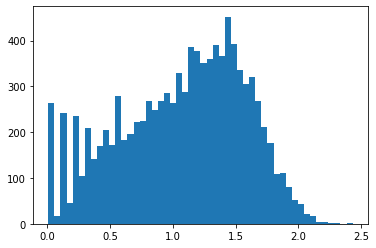

0.007 he removes his hand from my neck , but only so he can grab my hips with both hands .
0.009 there s the telltale square , high up and to my right , just as it was this morning .
0.011 i sink down next to the fire , desperate for comfort , to work out my next move .
0.012 the metal deck is carpeted and so the footfalls are not as noisy as they had been on sanctuary .
0.012 based on the fact that she was living among humans , he would guess her other half was human .

2.433 verdict ?
2.323 like fletcher .
2.302 franklin berries !
2.257 john graves .
2.225 sterling wonders .
12


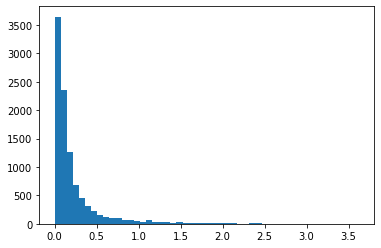

0.002 i m through running .
0.002 i could nt scare her with my intensity .
0.003 i m through .
0.003 people started honking him .
0.003 then not .

3.624 good , very good , now be off with you .
3.564 he was becoming more and more like the other man .
3.121 more than a thousand people lost their lives here .
3.116 needing more space , until the end became the same as every other relationship .
3.085 more than you know , she whispered as she placed her hands on my shoulders .
13


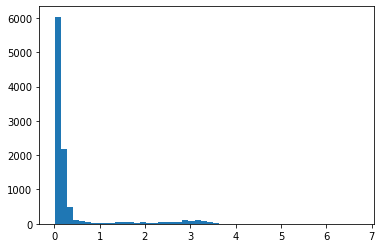

0.005 lost together .
0.005 echoed the group .
0.005 the preacher had both chastised and complimented me in the same breath .
0.005 thought i had all the time in the world .
0.006 both of us know the real reason you re talking to her .

6.722 do nt know , do nt care , do nt want to talk about it .
6.041 do nt laugh do nt laugh do nt laugh .
5.845 was nt it true that she had nt told him everything about her mother , either ?
5.456 just do nt treat me like some random person you do nt know and do nt like .
5.319 you are nt fully healed and we have nt managed to replace the blood you lost .
14


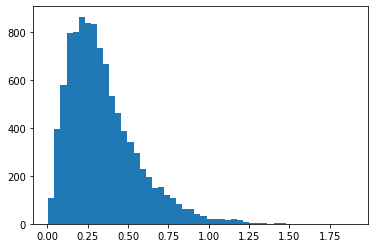

0.006 let me make my own decisions and mistakes .
0.011 i had most definitely learned my lesson .
0.011 jerry could nt believe that .
0.013 your brother would gladly trade you for them .
0.013 you always make good decisions .

1.892 hole in his forehead , just above the right eye .
1.592 dust billowed out from the mess as rocks began to shift and collapse .
1.548 blood splashed from the carpet like a stepped in puddle .
1.474 fog streamed around them as they strode forward , trailing wisps .
1.464 a curtain of dark hair fell over her shoulders in thick curls .
15


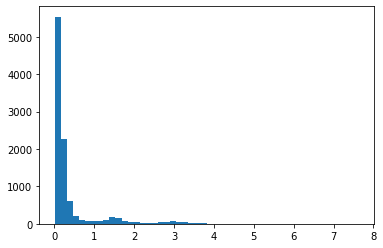

0.005 i pulled it away from him .
0.005 he shook his head as if to clear it .
0.006 shook her up .
0.006 i motioned us all to move into the ward building .
0.006 leave me now !

7.636 that s what s expected , and that s who i am .
6.004 she s dead and it s as much my fault as it is anyone s .
5.103 let s see if there s any buns left , shall we ?
5.084 it s me who s going to sort her latest financial disaster .
5.045 it s the reason she s spending the night with a friend .
16


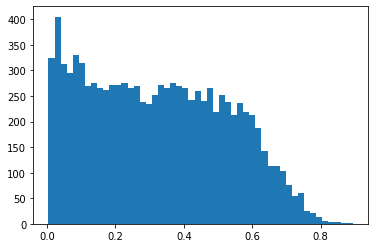

0.004 then he burned the lower calves and knees , doused the flames again , and so on .
0.005 he said , if i could get you to dance with me , he d give me a bonus .
0.005 his female , his mate , hurting god forbid , dying and he unable to be at her side .
0.005 if anyone had been looking , they would have seen her suddenly pop into existence in between the trees .
0.006 nothing i read cautioned against bringing in new people , or i would have left her at the lab .

0.894 intensely .
0.868 silk asked him .
0.850 were those hers ?
0.850 the man was ruthless .
0.845 will laughed harshly .
17


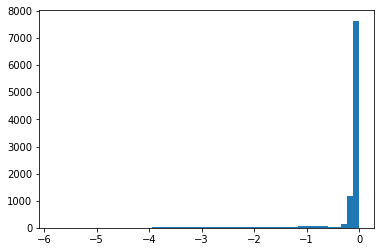

-5.804 that she likes that i ve claimed her .
-4.941 that was okay , that was fine with me .
-4.850 but that does nt mean that i m ever going to stop using his services .
-4.814 that s what s expected , and that s who i am .
-4.541 that curse has to be broken and you are the only one with that ability .

-0.003 on her way home from work .
-0.005 you re basically my doctor now .
-0.006 i was committed once .
-0.006 it sure as hell did !
-0.006 hell , i was nt sure i was ready .
19


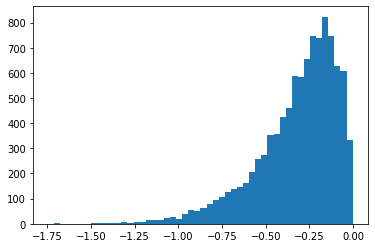

-1.743 this time he was holding a large silver bucket , which contained a bottle of champagne .
-1.699 read me my rights , officer .
-1.693 i heard him bang out of the bathroom and rummage around the bedroom for a few minutes .
-1.519 he heard a car door slam and he moved faster .
-1.485 i noticed that odd , acrid smell again .

-0.003 blunt as ever .
-0.004 it went bad .
-0.005 because i never thought you d be this stupid .
-0.006 you did nt want to yet .
-0.006 and you feel it tug you .
20


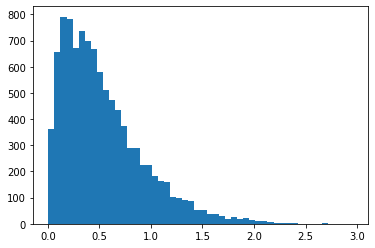

0.004 time for a new approach .
0.006 we give balance .
0.007 cracks can spread .
0.009 reluctantly , i opened the door partway .
0.009 so i resigned .

2.957 cam scurried off the kitchen floor and into the living room , kneeling down next to the couch .
2.803 probably somebody who either is a good makeup artist or has one and wants to screw with these guys .
2.667 mike leaned back on the bar , looking nothing like he was going to kick anyone s ass .
2.662 guys wrist was still bleeding badly as he lay virtually passed out against the wall .
2.585 we can rent some movies and hang out here eating junk food til we pass out .
21


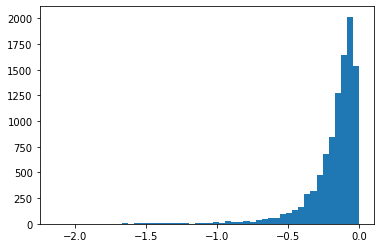

-2.141 it skittered through my veins , danced through every nerve .
-2.055 peering through the darkness into the depths of the shaft he glanced back towards the houses .
-1.873 they broke through the abundance of tents into a short clearing with police tape cutting off certain areas .
-1.770 excitement roared through her body like the storm around them .
-1.745 around and around my dining room table like it was a race track .

-0.000 morose !
-0.000 parasite !
-0.001 asked scrum .
-0.002 i asked tally .
-0.002 listen , everyone .
22


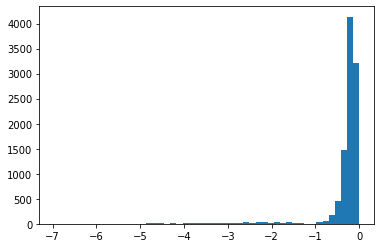

-6.953 as far as we can tell , someone broke the window and dumped the snake in .
-6.773 as long as the woman could force herself to remain motionless the iron ball hung in its place .
-6.613 as soon as you demanded a job from me , i knew you d be perfect in that department .
-6.611 as far as he could determine , there was nt any logical explanation for what they had heard .
-6.373 and as drastic as that sounds , sometimes it seems incredibly appealing .

-0.002 morose !
-0.002 parasite !
-0.003 absolutely essential !
-0.004 shameless ?
-0.004 despicable ?
23


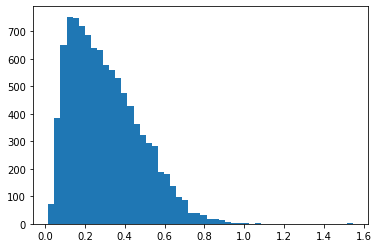

0.016 if you see this outlaw , or any man acting strangely , alert the lords guards immediately .
0.025 it was a hatred void of understanding and sympathy , which went against ashes very being .
0.027 as the thundering noise grew louder people ran into the streets , consumed with terror .
0.028 he was leaning up against the wall beside a spiral staircase that disappeared into the darkness behind him .
0.029 her eyes were puffy and red , black streaks of mascara running down her cheeks like deep cracks .

1.545 despicable ?
1.545 shameless ?
1.484 parasite !
1.411 morose !
1.229 pet ?
24


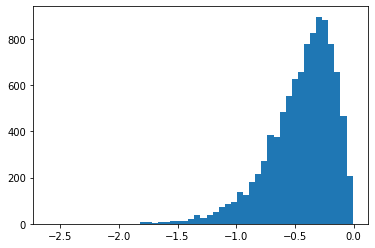

-2.600 hes a good lad , boss tough but honest .
-2.390 rose added another bowl , poured the milk , and distributed the food .
-2.189 he thought it was pretty ridiculous , considering he would be graduating in less than two months .
-2.165 our connection was so rare , so helpful , so loving , so sweet , so important to me .
-2.023 miss me while i m gone , cause i ll damn sure miss you .

-0.008 i cant see you upset .
-0.010 i was the next speaker .
-0.012 betrayed you ?
-0.013 i could nt see into the hole .
-0.013 let us greet them .
25


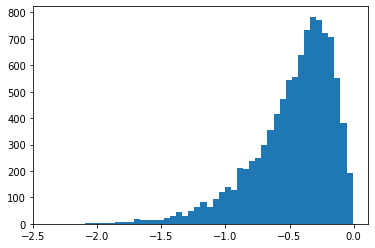

-2.383 after all , we ve been far more intimate than most friends .
-2.213 a few words in dark , shaky script were scrawled across the single page .
-2.133 oddly enough , he did nt hit me , just yelled .
-2.084 as the thundering noise grew louder people ran into the streets , consumed with terror .
-2.053 all of this was only made more appealing by his quiet but intense presence .

-0.007 night baby .
-0.008 belle screamed .
-0.010 anna , you had a thing with him .
-0.013 i did nt eat dinner earlier .
-0.013 the cell phone monitor chirped .
26


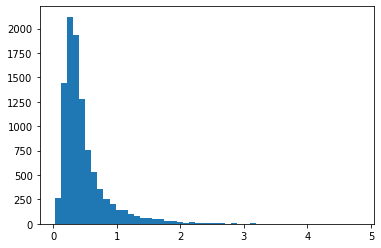

0.026 her head spun , but that was nothing new .
0.035 it was nt the forever kind of relationship , it was the for right now kind .
0.040 but the worst thing was , they knew it .
0.040 that s a crap reason because we would nt be here if not for that .
0.043 the thing is , they were nt stupid .

4.813 not by anyone , let alone by one of the most popular boys in the senior class .
3.961 by the time they find us , we ll have come and gone .
3.782 from there , he would hide the commando knife under the drivers seat of his midnight blue mustang .
3.522 by then , the first few drops of rain were beginning to hit the windshield .
3.437 just before i crashed through into midair , two hands grabbed me from behind .
27


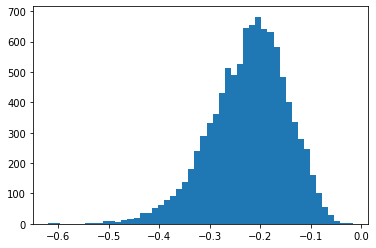

-0.620 it s not billy , spencer snapped .
-0.596 i copy come on back .
-0.539 the young lady resumed her hasty flight .
-0.524 normally , i manage five cases at once .
-0.518 john and martin sat frozen , jaws dropped .

-0.017 morose !
-0.018 parasite !
-0.020 despicable ?
-0.020 shameless ?
-0.032 just a little more , i mumbled breathlessly , and he altered from circling my clit to rubbing it .
29


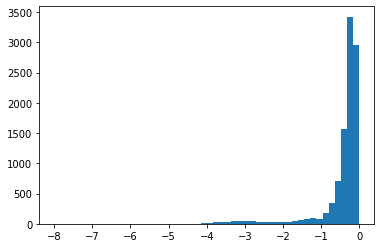

-7.987 you could leave , you could leave it all , you could watch everything drown .
-4.945 he could nt give her marriage or children , but at least he could give her peace of mind .
-4.879 you could send a lad round with a white scarf and check , could nt you ?
-4.785 never could get anything past you , could i ?
-4.699 so you can forgive me and i can still come and live with you guys ?

-0.008 he continues his pacing .
-0.009 i start pacing around the kitchen island .
-0.009 she sounded so surprised .
-0.010 you want more gold ?
-0.012 she glanced back at the group around the table .
30


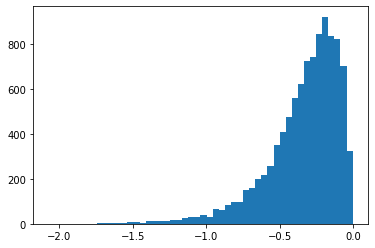

-2.075 tammy awkwardly moved , but remained in front of him .
-1.996 sierra two , talk to me .
-1.908 benjamin screamed .
-1.863 sue looked at him thoughtfully for a while .
-1.799 the abigail quietly and efficiently exchanged the dresses .

-0.002 that was the breaking point .
-0.003 was he getting cold feet ?
-0.004 i force a half smile .
-0.006 my mind is powerful .
-0.007 i find it helps .
32


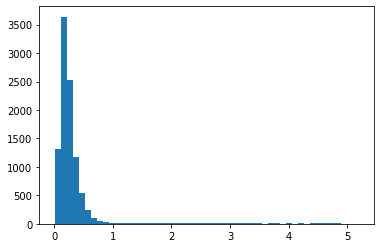

0.009 john stepped forward .
0.010 johnny smiled .
0.011 sawyer called out to me as he pulled in beside me .
0.013 straight shots .
0.015 the guards wo nt listen to me .

5.201 this was my first trip to the rock and it was more than pleasing to my eyes .
5.080 this world and how it talks , how loud its voice is .
5.075 this came from something higher , something outside the material world .
4.999 this sentiment struck me as hilarious , but i did nt say anything .
4.997 this room held all the survivors of the whole planet ?
33


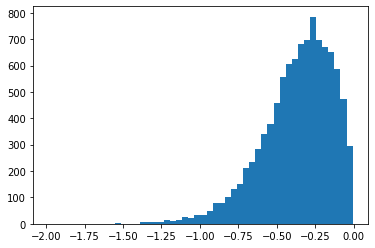

-1.986 sal grabbed the check .
-1.781 you did nt want witnesses .
-1.558 whether you leave or stay is none of my business .
-1.543 jerry could nt believe that .
-1.540 she set a trap , and we took the bait .

-0.006 deep down i was worried .
-0.007 extra !
-0.007 she is only five years old !
-0.008 an actual plan !
-0.008 excellent , quite excellent .
34


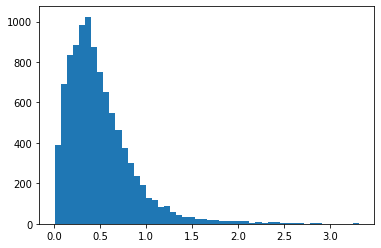

0.005 i gripped her wrists .
0.007 the fist headed toward him .
0.008 clenched my fist .
0.008 she gripped his shirt as she kissed him back .
0.009 her scent was as intoxicating as her taste .

3.315 talk about talk your novel did well .
3.297 after about five minutes , i decided i had found my most boring class .
2.978 too worried about those things out there .
2.883 how about if my old legs spend time sitting down over there while yours explore the stores ?
2.878 about ten minutes later dad called for me again .
35


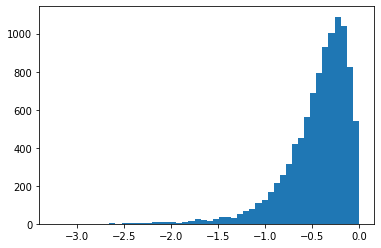

-3.238 oh , i do nt think you can out run an arrow shot at your back !
-2.980 i think i seen something back there a little ways just around the corner .
-2.974 i think i think i want to get my real estate license .
-2.683 i think i notice the corners of his mouth twitch , but i m not sure .
-2.647 i think i m going to like this just fucking arrangement very much .

-0.005 whispering to you .
-0.006 was he calling ?
-0.007 the protective service .
-0.007 it withdrew .
-0.008 the music ceased .
36


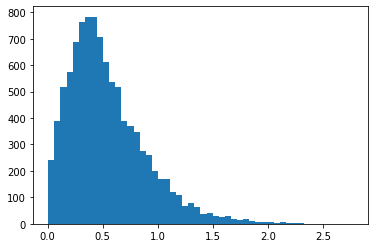

0.007 in winter ?
0.008 extra !
0.010 no other handsome wolves out in the woods ?
0.010 twenty three and under .
0.010 about four thousand .

2.768 she instantly feels guilt for saying it , afraid i would be offended .
2.415 pain tore down the back of his skull like a hot knife .
2.321 i surrendered to him , not wanting the embrace to end , letting my fingers thread through his hair .
2.303 pain and confusion .
2.296 she let out a breath of relief , but why had he passed up this chance ?
37


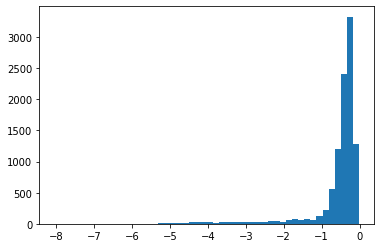

-8.042 smiling at me , staring at me , being with me .
-7.981 they caught me and brought me back , with a little help from my young friend bobby s mother .
-7.307 everything in me told me there was more to this .
-7.155 take me back to our room and do that to me again and again all night long .
-7.076 he spun me away from the wall , walking me backward until i hit the edge of the couch .

-0.013 blunt as ever .
-0.022 here at the camp , and at the border .
-0.023 another chill .
-0.023 i m forty .
-0.027 slowly , the soldier tried to raise his head .
38


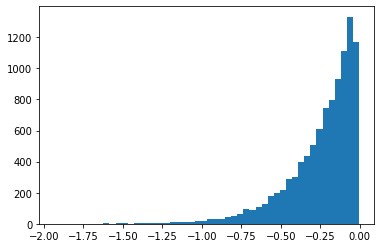

-1.932 his face was hard and lean , with close cropped black hair and dead , grim blue eyes .
-1.792 i spend too much time thinking of ways to get inside that tight little body of hers .
-1.619 baby soft lips , damp and silken and hot .
-1.602 hunter slammed the breaks a little too hard in my opinion at the red light .
-1.546 its a stupid name and a stupid idea from a stupid man .

-0.005 i let them be .
-0.005 i nod in the direction of his arm .
-0.005 i did nt have it .
-0.005 i do nt want this .
-0.005 you did nt want witnesses .
39


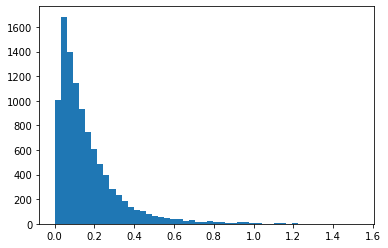

0.001 believe their eyes ?
0.003 then he grabs my arm .
0.003 glanced around .
0.004 why would he kill his own sister ?
0.004 what then .

1.530 with those last six words , he brushed his lips against hers .
1.325 also , i ve got to finish last minute arrangements for the trusts .
1.213 i ve been clean for three years , but you never forget your first .
1.208 i ve seen him around before , but i ve never spoken to him .
1.206 once we get interested in each other , he tells me he wants to date other women .
41


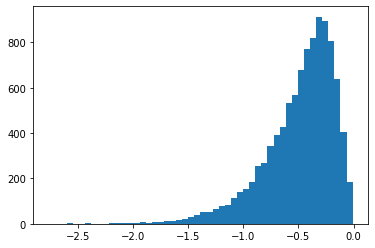

-2.766 yes , wed like to get married according to the rites of the church of the holy flower .
-2.568 good morning , lover , a husky voice abruptly intruded into the silence .
-2.552 um , like , um , oh god , i could nt think of anything !
-2.432 good morning and yes i slept like a baby .
-2.430 ah well , that is the biggest question .

-0.008 sue s moods .
-0.011 he deserved a small reward .
-0.012 she wondered why he had not revealed her secret .
-0.013 why was he arguing ?
-0.013 something disturbing .
42


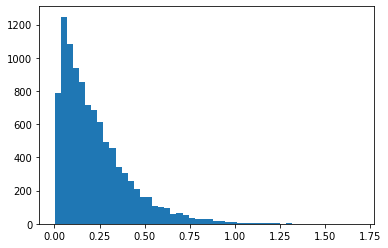

0.001 close like .
0.003 he grabs my shoulders .
0.003 suits .
0.003 pull in .
0.003 she stepped back quickly .

1.691 i think i think i want to get my real estate license .
1.429 from his tone she did nt think he referred to the leftover orange roasted chicken and vegetables .
1.356 they would think we are quite safe in that distance and agree without much fuss .
1.297 i thought he would be thinking of harry , but then he spoke , and his tone was apologetic .
1.292 i think i notice the corners of his mouth twitch , but i m not sure .
44


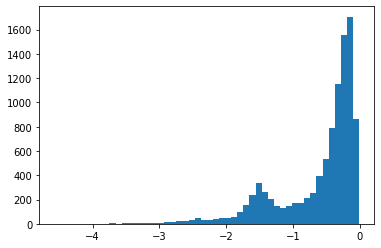

-4.567 the greater the sacrifice , the greater the power that is transferred .
-3.934 the light from the outer passageway flickered through the cracks of the wooden dungeon door .
-3.903 the clock in the center of the marble floor marked each minute that passed .
-3.772 the shaking from the undead pounding the wall vibrated his bones .
-3.755 the chief knew that the sergeant did the best part of his job for him .

-0.010 not hard enough to hurt , but enough to surprise her .
-0.011 aye , but only if there s enough to go round .
-0.012 do not ever allow yourself to worry over me like that , my love .
-0.015 surely nothing is odd about this situation , he feels .
-0.015 do not mock me , woman , he said , but there was no bite to his words .
46


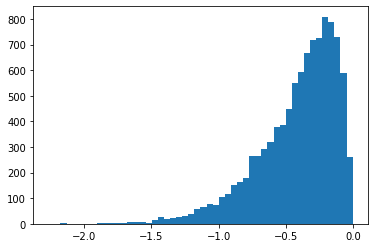

-2.263 the flat of that palm slammed across her rear and she froze .
-2.199 as he finished , he heard a thump , a scraping sound , then another thump .
-2.153 she swung the heavy french doors open and stepped inside , flipping the light switch next to the door .
-2.133 just let me explain , i said , as he kept walking , dragging me along .
-2.083 keep writing , she said grimly from behind him , and i ll keep on doing this .

-0.005 experiences ?
-0.008 mystery , mystery !
-0.012 it wont happen , my friend .
-0.014 i want to ask your forgiveness in advance .
-0.014 you wont run away , will you ?
47


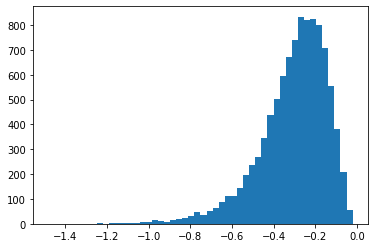

-1.482 hop called .
-1.384 cricket asked as the slave boy pulled away .
-1.327 dash .
-1.247 u coming ?
-1.245 sterling wonders .

-0.022 the love they shared for each other was the love of brother and sister , not man and wife .
-0.023 you said , she s in no further danger , what does that mean ?
-0.024 permanent part .
-0.025 good , very good , now be off with you .
-0.026 he laughed a little and said , this is strong , perhaps you re not ready ?
48


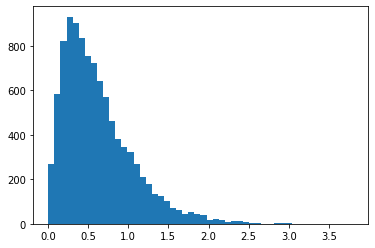

0.006 but another hitch .
0.008 straight shots .
0.008 he let his trousers slip to half mast , underwear and all .
0.009 dash .
0.009 get her to bring you up to speed .

3.793 our connection was so rare , so helpful , so loving , so sweet , so important to me .
3.611 he laughed , and the sound was magical to her ears .
3.146 the black cat blinked then gazed at her with widened eyes , innocence itself .
2.993 a strange , thoughtful expression appears on her face .
2.973 the faint hum of voices awoke me .
49


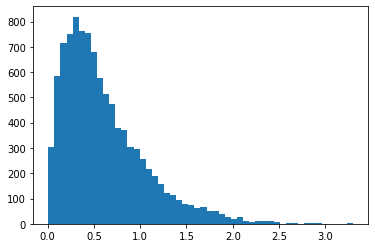

0.007 you re also dressed perfectly fine .
0.008 i still want to know what you re doing here .
0.012 still confused , i shook mine .
0.014 i did nt know either , i said .
0.015 no only the druids can read it .

3.296 i reached one hand under her knees and the other around her waist and swept her off her feet .
3.251 it flowed through him , flowed from him .
3.173 the two rodents fell with a plop into the rushing waters as he hit the other side .
3.131 swept by , then came right back .
2.946 there was rushing water somewhere nearby , and the calling of the occasional bird in the distant trees .
50


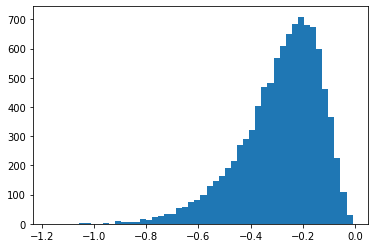

-1.176 she sang the words so fast , how could they understand ?
-1.073 straight shots .
-1.048 but that craved contact did nt come .
-1.042 awkward .
-1.030 furious and feeling terribly guilty .

-0.009 there was no choice here of putting on the armor .
-0.013 i m doing very well .
-0.013 i am only doing my duty , sire .
-0.014 there were drinks with a small umbrella on the tables .
-0.016 there was nt so much as a speck of dirt on her pressed khakis and knit shirt .
51


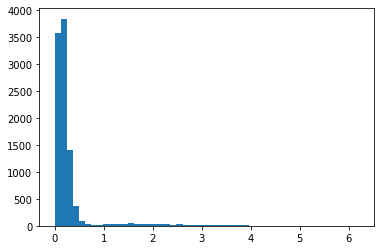

0.001 buck coughed .
0.003 his head nodded once .
0.003 they all watched .
0.003 she paused and inhaled deeply .
0.005 he grabs my shoulders .

6.207 be quick and be safe .
4.620 it wo nt be a long kiss , but it ca nt be a quick peck , either .
4.446 but she would be lying to herself if she had nt been anticipating his presence .
4.412 it will be okay , but it has to be now .
4.312 oh , to be sure , to be sure .
52


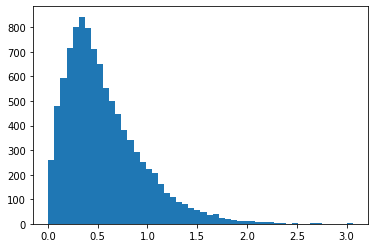

0.004 her eyes fluttered open and she smiled .
0.006 black and blue s your color .
0.006 like , not love .
0.008 there are no rich black people around here .
0.009 her eyes were wide and bright blue .

3.061 as she settled into the taxi for the drive to the nice train station , she called him .
3.061 he owns a firing range outside of town .
2.809 and the emergency kit that i carried over my shoulder , no matter what .
2.717 i gather my lesson papers and pull on the layers of winter gear .
2.699 it was like pushing a shopping cart that was full of sand and held together by string .
53


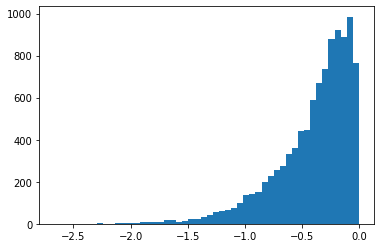

-2.664 logan s voice sounded deep and downright commanding , making her shiver .
-2.533 he paused , and a light flickered in his deep brown eyes .
-2.428 this sounded vague and terrifying .
-2.397 after the sound echoed away , he swung around and saw the door was empty .
-2.320 your head practically bounced on the floor , big bro .

-0.004 we ca nt lose both .
-0.005 i put him on speakerphone .
-0.005 you could get a loan .
-0.005 he stared the other way .
-0.006 i have to go take a shower .
54


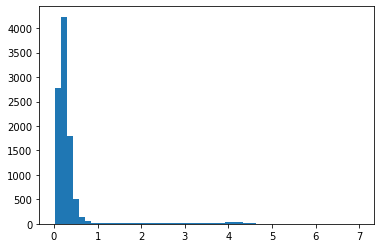

0.016 do nt let her bite me again !
0.017 leave me out of it !
0.020 just let him live the rest of his life in peace .
0.020 essentially it explained everything .
0.022 he put his arm around me and gave me a hug .

6.994 but while we had you open we figured that we d just root around in there a bit .
6.923 we suggest that we postpone agreeing to this quest immediately .
6.694 and when we row we always make up by the next time we meet .
6.597 we ll move on after we ve eaten , he said .
6.452 we are giving it everything we have , and still the walls split .
56


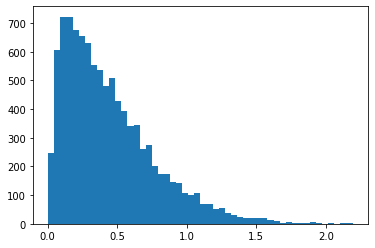

0.005 i heard her screaming at him .
0.009 you can get help .
0.009 you re coming out .
0.009 get her down and keep her down .
0.010 her voice was trembling .

2.194 tori had no interest in going back to the hangar .
2.170 picking up the sweatshirt , i sniff it .
2.136 he regarded me closely , as if he knew i was deliberately avoiding discussing myself .
2.123 i silently thanked her for her vote of confidence .
2.099 unlike gale , she has no problem with our hunting arrangement .
57


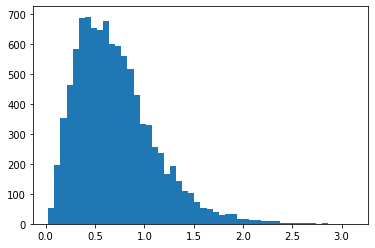

0.026 here the dream departed from reality .
0.028 how could any of this be real ?
0.030 his very posture was tense .
0.032 some kind of foot fetish ?
0.039 i miss those days .

3.112 buddy , being so young , healthy , and stubborn , never did carry medical insurance for himself .
2.886 i did something no witch , no male demon can do , and all the demons agree .
2.845 twelve feet long .
2.843 ruth seems nice enough .
2.836 never had anyone been so thorough with him .
58


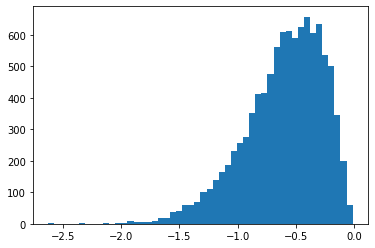

-2.623 she muttered something , rolled up onto her belly and propped her chin on her elbows .
-2.316 he spits out the residue behind his shoulder and wipes his lips down on the lapel of his jacket .
-2.121 max stood , popping his shoulder back into place with a groan and rotating his arm .
-2.028 he turned to face the water and shoved his hands into his pockets .
-2.028 i beat my brother in front of my entire council .

-0.015 that s helpful to know , is nt it ?
-0.025 an hour ago , marsh would have been relieved to see it .
-0.025 it will be your choice , and we ll do whatever you want to do .
-0.026 which was truly bizarre , although i did nt think so then .
-0.029 that should nt be enough .
59


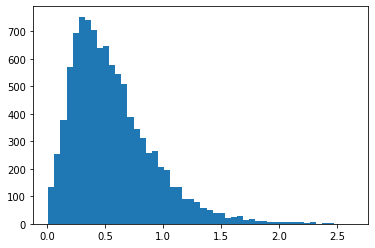

0.009 he stands and kisses my forehead .
0.009 he smelled like soap and fresh laundry .
0.014 she s blushing !
0.014 split a turkey bacon avocado ?
0.015 and the top hat sir .

2.632 dad always called me back right away .
2.465 when his father woke , billy could tell he knew he was dying .
2.456 she d always been too focused on school to make new friends .
2.384 now someone has to tell the other parents the places have been filled , said merlin .
2.370 ben died without ever seeing what had killed him .
60


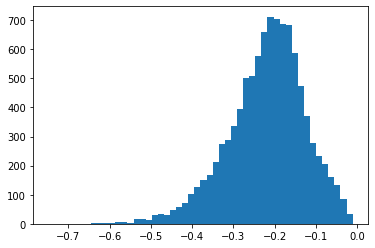

-0.748 boring , i mutter .
-0.703 rise and shine , sleeping beauty .
-0.676 no swimming , he jokes .
-0.653 thirty grand .
-0.636 art s eyes flashed to black .

-0.011 he removes his hand from my neck , but only so he can grab my hips with both hands .
-0.014 he reached for me , but before his fingertip made contact , he yanked it back and jerked away .
-0.014 but you are my dads brother and i guess that means you really wont hurt me , will you ?
-0.015 we love each other too much to keep away from each other and i want to eventually have children .
-0.016 they caught me and brought me back , with a little help from my young friend bobby s mother .
63


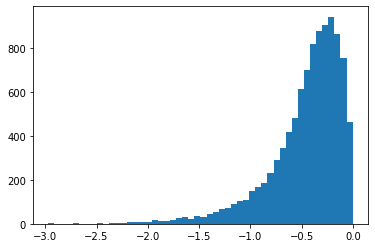

-2.970 it was stark white everywhere from the walls to the four poster bed to the carpet and curtains .
-2.929 she had on a pair of short shorts and combat boots , paired with a flowing purple tank top .
-2.726 with the only access road newly blocked by fallen trees , it was another two day hike into town .
-2.718 the shirt parted and she ran her slender fingers through the hair on his chest .
-2.541 i started unbuttoning my shirt , and slipped my arms from the sleeves .

-0.004 just one sentence .
-0.005 said the major .
-0.005 no sarcastic response ?
-0.006 instead , he changed the subject .
-0.006 suspicion of murder .
64


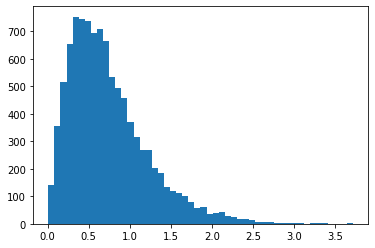

0.008 another ten , then .
0.014 it s simple , the young bowman replied .
0.014 i was in this area for another reason .
0.014 you did more than anyone else would .
0.016 belle screamed .

3.710 send out your captain before the sands run out , or we shall open fire .
3.687 your memories are kept in your subconscious , i know , i said .
3.643 those things are big enough to choke you .
3.549 i need your names and contact numbers , in case we have to speak to you again .
3.443 here , get your things together and let s get out of here .
65


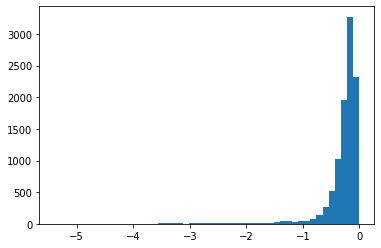

-5.389 how did she know who you you re curious how i knew it was warren entering with you ?
-4.387 but how will they know how much to use ?
-4.300 how had the young wolves known where to find me ?
-3.910 how about if my old legs spend time sitting down over there while yours explore the stores ?
-3.854 how could he have ever forgotten who she was ?

-0.008 she hugs me back , hard .
-0.009 the balls .
-0.009 he did nt argue with her as their lips melded together .
-0.011 he d enjoy it too much .
-0.011 my heart pounds behind my ribs .
66


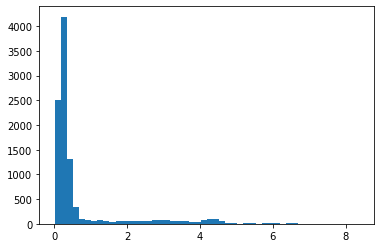

0.010 only himself .
0.023 somehow he had to convince her to trust him again .
0.024 and enough to cause him to lose his train of thought .
0.024 how was he going to get himself out of this predicament ?
0.027 centers of international traffic .

8.369 you know those days you get when you just snap at everyone ?
8.329 you re loyal , and you re courageous , and you make friendships that last forever .
8.156 you do nt know what you ll find when you get in there , pumpkin .
8.121 you could leave , you could leave it all , you could watch everything drown .
8.075 you cant say you do nt regret your decision for going left because it caused you to lose .
67


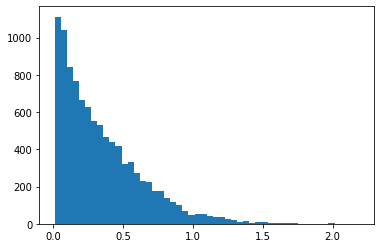

0.009 i thought my heart would stop .
0.009 leaning in , he kissed her .
0.009 sounds like you re right about that .
0.010 do nt feel bad , i said .
0.010 there is nt a day to lose .

2.189 issue orders and demand loyalty .
2.067 stalker y .
2.014 local law enforcement and emergency response teams are already arriving on site .
1.999 no strings , no commitment , no promises .
1.984 thankfully , they did include a video program .
68


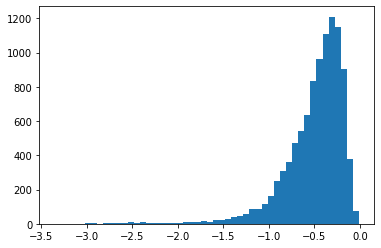

-3.355 i should ve found out first thing .
-2.992 hawk should have said that too .
-2.969 i should think the other professors would be very surprised to discover these things .
-2.934 you should know you can come to me with your problems .
-2.930 you should put them in the for next year , then your camp will be perfect .

-0.008 her friend also stood .
-0.025 it sure as hell did !
-0.027 he mumbled against her shoulder .
-0.029 his head nodded once .
-0.031 he asked when she did nt say anything else .
69


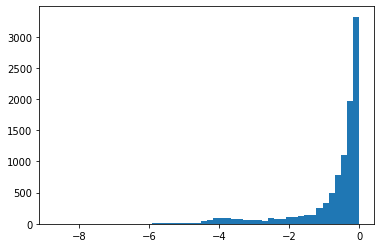

-8.688 it was like i was a stranger who was being fired for sexual harassment .
-7.453 he was desperate , and i was beginning to think i was broken .
-7.418 it was nt his fault , was it , that he was a friendly man ?
-7.327 i was nt sure whose team he was on but i knew he was playing .
-7.089 was it true that he was alive and never died of a heart failure ?

-0.002 try to mingle .
-0.004 try to have some fun .
-0.006 we shall starve before we reach land .
-0.006 old issue .
-0.006 try to choose the first , if you can .
70


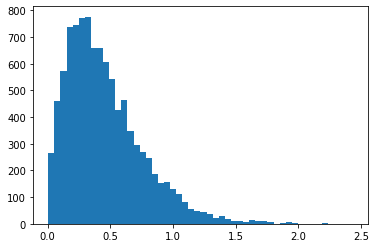

0.004 cut , cut , cut .
0.005 no , nothing serious .
0.005 very high doses each time .
0.005 protected by what ?
0.006 baby , it s morning .

2.435 knowing what he now knew , knowing how i felt , he could have kissed me again .
2.306 he thought there might be a story there .
2.240 he thought i d known all along .
2.226 she touched his arm , guessing his thought .
2.095 let freedom ring .
71


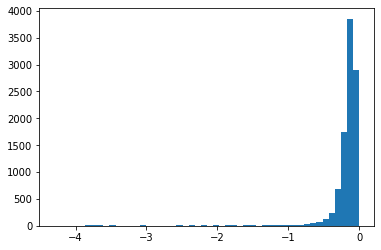

-4.294 down the other end , one of the men rapped the edge of a coin off the bar top .
-4.287 he glances down at his long sleeve black shirt pulled over a gray t shirt and his dark jeans .
-4.097 we drove down the alley and crossed over mulberry street into the open parking lot .
-4.061 down here were sitting ducks .
-4.031 caressing down her body , he sucked in her left nipple before going to her right .

-0.004 they were absolutely fascinating .
-0.004 or horny .
-0.005 of hell ?
-0.005 it was nearly dusk .
-0.007 i also told you that you have to trust me .
72


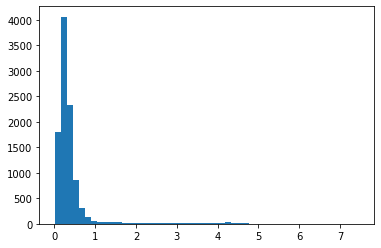

0.007 my trip ?
0.012 she was screwing this up .
0.015 can i take a nap now ?
0.017 it storms !
0.019 there s no shower ?

7.467 what matters what kind of love it is ?
6.975 what a wonderful art , what are you doing here go at some art school .
6.461 what i wanted to know was , what s sunny s husband been doing for the last six years ?
5.814 what did it matter what i said ?
5.501 i meant what i said earlier about the table , and what s on and off of it .
73


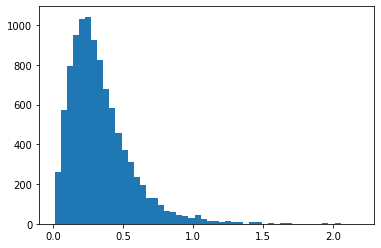

0.011 resigned .
0.012 clipped .
0.013 then i smiled at it on the counter .
0.015 thought so , said agent b .
0.015 i tapped at the door , tentatively .

2.183 there was no mistaking a burning desire growing in the pit of my body .
2.031 nor is there any evil super being who can make you do evil things .
2.021 but there were no flames on my skin .
1.958 there s nothing fair in life .
1.927 there was truly no better feeling than to have her with him , touching him like this .
75


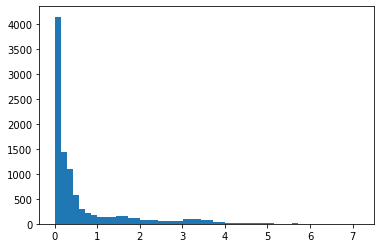

0.002 shameless ?
0.002 despicable ?
0.004 they cant have gotten far .
0.005 morose !
0.005 parasite !

7.153 the greater the sacrifice , the greater the power that is transferred .
6.449 the clock in the center of the marble floor marked each minute that passed .
6.418 the light from the outer passageway flickered through the cracks of the wooden dungeon door .
6.258 the rest of the comments were of the same vein , but this one was different .
6.096 the glow from the rising moon and streetlights illuminated the building against the darkening twilight .
76


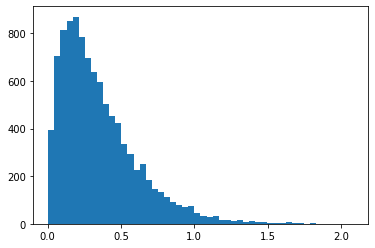

0.004 my reply was not quiet .
0.004 the princess asked hopefully .
0.005 she ll adjust .
0.005 i m frowning again .
0.006 i understood the feeling .

2.080 the gift table was loaded with gifts of all shapes and sizes .
2.035 he had a white cotton towel draped around his waist .
1.841 it was like pushing a shopping cart that was full of sand and held together by string .
1.825 he tucked the first aid kit underneath his arm .
1.812 he stuffed her in the trunk of a white car , he said .
77


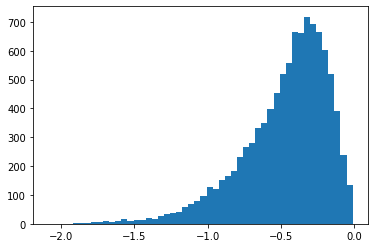

-2.089 she smacked his arm playfully .
-2.026 cord or no cord .
-1.993 fin hunched his shoulders , lifted a brow .
-1.930 abruptly , he spun and headed for a sideboard to my right .
-1.900 his shoulders are rigid and he keeps working his jaw .

-0.009 we ve got some business to discuss .
-0.010 he was learning her anew .
-0.010 he sounds terrible .
-0.013 i d start building some connections .
-0.015 i ve heard his speeches and talks many times .
78


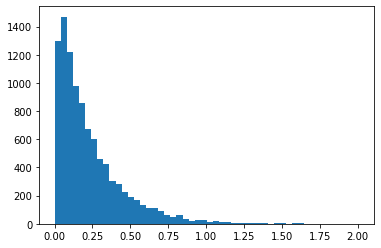

0.001 extra !
0.001 clipped .
0.001 killed two .
0.001 asked scrum .
0.002 i asked tally .

2.009 living , breathing , existing from day to day only added to the weight on my heart .
1.940 this other world of ideas , her life at home , the east strange , intriguing .
1.838 this world was strange and in many ways wonderful but scary too .
1.811 his heart clattered and roared like an old water pump that was drawing more air than water just lately .
1.770 i ve done things and thought things and said things i never thought i would .
79


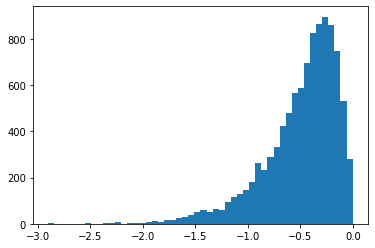

-2.898 her arm extended out to him .
-2.845 his hand stroked over her cheek before following the line of her neck .
-2.804 she extended her hand and beckoned me to her .
-2.527 she raised the blade above him and brought it down into his skull .
-2.507 he grasped her shoulders , turning her over .

-0.002 i dig that stuff .
-0.004 i m a pretty stellar boyfriend .
-0.007 i absolutely know that .
-0.007 absolutely , i tell him .
-0.009 it always made her day .
80


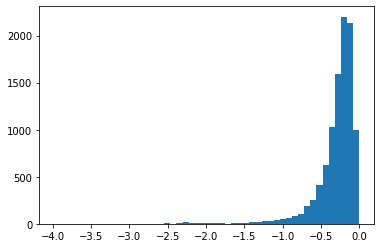

-3.975 well , well start with one and go from there .
-3.569 well have it crafted well again soon .
-2.957 well lose him in the woods .
-2.832 well , damned to them both .
-2.751 well i m really glad it sounds like you guys are going strong again .

-0.004 spencer typed .
-0.005 something disturbing .
-0.005 polite .
-0.005 her suitcase was beside her and she was looking down at her phone .
-0.006 the letter was brief .
81


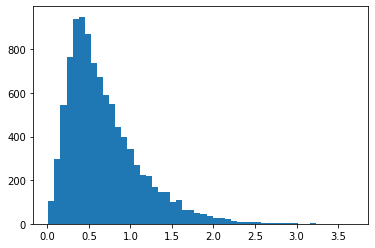

0.012 so nice of you .
0.014 sure , i still had the summer .
0.016 hunter s right , baby .
0.017 sorry we were nt there for you .
0.019 yeah , she s pretty fantastic .

3.675 another woman saw the young man in the robe and black wig and screamed .
3.419 the other character is a young girl , walking towards the artist carrying a large basket on her head .
3.280 she was careful to call her sister every few days to prevent the other woman from worrying too badly .
3.231 she let her own rhythm slip away from her mind , concentrating on finding another s .
3.196 as long as the woman could force herself to remain motionless the iron ball hung in its place .
83


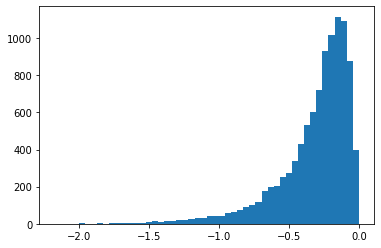

-2.177 she playfully slapped his arm but then lunged for the banana with her mouth , taking a bite .
-2.074 reaching back , i slammed my hands down on the driver s seat , elbows bent .
-1.974 along this recent avenue strode harry king trailing cigar smoke .
-1.964 she muttered something , rolled up onto her belly and propped her chin on her elbows .
-1.920 his head threw back , eyes closed , and words tore in a loud gasp from his strained throat .

-0.001 would anybody ?
-0.003 nobody does .
-0.004 is yours gone ?
-0.005 he needed drugs .
-0.005 are you guys all seniors ?
84


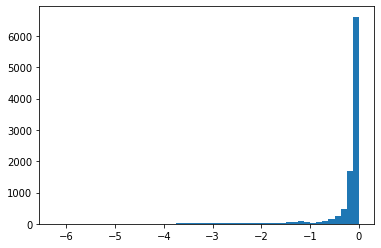

-6.243 and on and on and on .
-6.176 planning on throwing myself on the mercy of my superiors , he said .
-6.058 what if the tunnel went on and on , too far for him to swim through holding his breath ?
-5.572 come on , come on , he muttered .
-5.405 come on , we need to run on .

-0.001 it would ?
-0.001 close like .
-0.001 only himself .
-0.001 the man teaches it .
-0.001 a hub ?
85


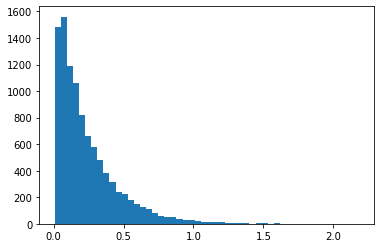

0.008 how could such a thing exist ?
0.008 one thing you could do for me !
0.009 what matters what kind of love it is ?
0.009 we need you !
0.009 it would ?

2.184 i looked around the room , taking in the shelves and shelves of small , wooden boxes .
1.725 as i enter the lifeless north south corridor connecting the halls , i lift my right arm straight out .
1.659 cam scurried off the kitchen floor and into the living room , kneeling down next to the couch .
1.641 there were two uniformed officers outside in my yard wearing their big , bulky winter uniform jackets .
1.618 one sat at a nearby tall table with long legged chairs .
86


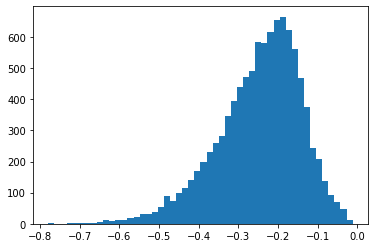

-0.780 kissing sterling in the rain .
-0.727 picking up the sweatshirt , i sniff it .
-0.719 cade punched a tree .
-0.708 something purely irrational and completely superstitious shook him .
-0.693 vane snarled enough that the girl jumped .

-0.011 you will walk out that door , go to your truck , and drive directly out of town .
-0.013 i was nt exactly sure what that was like , but i would make someone very happy one day .
-0.017 i however , had nt been able to wait to find out if we were expecting girls or boys .
-0.017 i am with some of my staff , and i think they would all like to hear your report .
-0.021 down the other end , one of the men rapped the edge of a coin off the bar top .
87


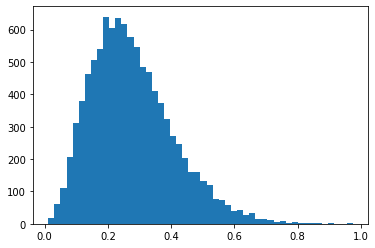

0.011 before the rising .
0.015 farther ?
0.016 hop called .
0.020 what then .
0.021 just one sentence .

0.974 nightingale lane said the old signs on the wall .
0.910 strange shadows shifted uneasily , through the fields of mysterious blood flora .
0.878 the young writer leaned forward quizzically .
0.869 no other handsome wolves out in the woods ?
0.854 the high priest indicated pillows on the floor beside a fire pot .
88


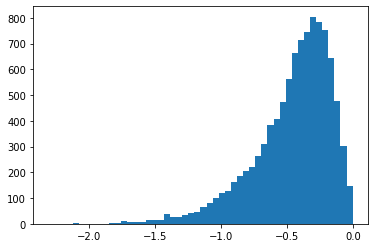

-2.306 he leaned down to kiss me goodbye and promised to call me later .
-2.121 please , just stop , i begged , my eyes pleading with him .
-2.117 i sipped at the honey tea and sat it down on my bedside table .
-2.041 penny stands up , steam rolling off her skin in waves , and water dripping down her body .
-1.939 the undead lowered its head and started licking the blood and beer mixture .

-0.004 she unrolled the map on her leg .
-0.007 health department regulations .
-0.007 one goal .
-0.007 cut , cut , cut .
-0.009 permanent part .
89


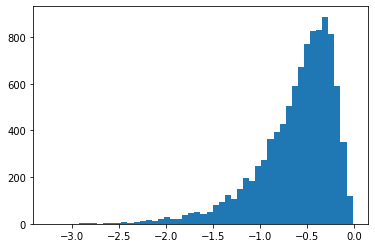

-3.252 i drop my hands and turn my flushed face and bright red neck to ghost .
-3.063 oh god , they d probably been making love , right there in the living room .
-2.959 yes , yes , the young man nodded , he knew just the thing , and hurried away .
-2.917 your lips are so soft when you cry , my beautiful , brave girl , he whispers .
-2.902 oh , god , i hate bats !

-0.012 farther ?
-0.014 this means its laundry day .
-0.017 there s a market out there just waiting to be tapped .
-0.018 she unrolled the map on her leg .
-0.019 its a right of passage .
90


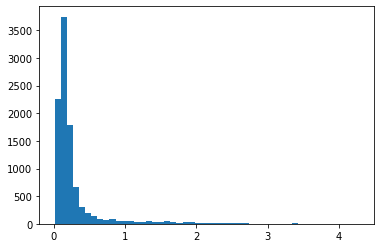

0.011 i found myself without much to do tonight .
0.012 i walked away before he could say anything else .
0.012 and she does nt remember driving home .
0.013 i did nt eat dinner earlier .
0.015 he looked away to veil his eyes .

4.282 of course , after the death of my aunt , hiding was a moot point .
3.517 of course you re not , he soothed , stroking my back .
3.479 of course not , but i d rather you still want to come back tomorrow night .
3.453 of course they were just kissing , but will declared to have the image burned forever in his memory .
3.434 of course , this one s just a little different .
91


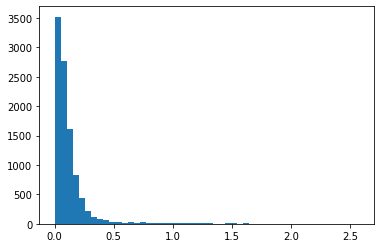

0.001 loading dock .
0.001 the music ceased .
0.002 the recording blurred .
0.002 more scared .
0.002 awkward .

2.575 one by one we went to bed , mumbling excuses about it having been a long day .
2.458 one , the one with white hair , has a tattoo on her face .
2.193 the one who was blind or the one who saw it instantly and was powerless to stop it .
1.829 he gripped one in each hand as he kept low and moved forward .
1.646 one had a tattoo that covered most of his head .
92


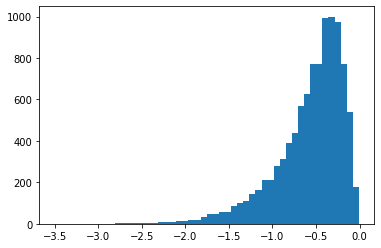

-3.502 two more police cars pulled up .
-3.391 it s two train cars big ones .
-3.305 a dozen and a half plus two or three , maybe .
-3.001 he picked out a pair of two inch heels .
-2.792 on the ground floor of tower three he unintentionally disturbed two human nurses passionately kissing each other .

-0.008 is that so unnatural ?
-0.011 there was joy .
-0.011 something disturbing .
-0.012 that was too weird , too uncomfortable , and so it brought everything back .
-0.013 his right hand .
93


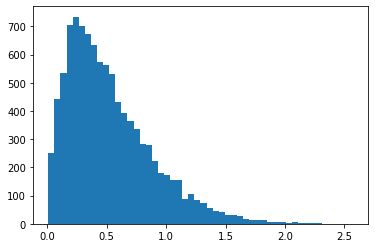

0.007 we never ate .
0.007 unaware of loss .
0.009 experiences ?
0.009 no drink .
0.009 a joke .

2.570 he shouted , pointing up at the four floating creatures who hissed in return .
2.495 his face was hard and lean , with close cropped black hair and dead , grim blue eyes .
2.387 fox called out in a voice thin as a reed .
2.352 so ben s my cousin .
2.300 shaw tell your friend goodbye and come back inside , we have guests and you re being very rude .
94


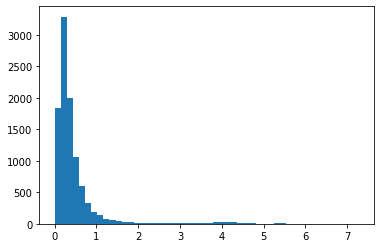

0.002 i m a single lady .
0.006 why am i punishing you ?
0.006 i wanted her for myself , simply because i could not have her .
0.007 charlotte rolled her eyes .
0.012 being single again ?

7.286 they re so strong , and they always know where they need to be .
6.632 oh , they may say they do , but do they truly believe it ?
6.296 they were loving the fact that they were finally free and this was their day of revenge .
5.977 they re real little , but daddy says that they will grow fast .
5.839 they are nt enhanced , but they re good soldiers and highly trained .
97


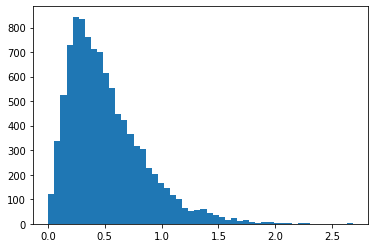

0.003 intensely .
0.010 actually , its quite good , he lied .
0.010 morose !
0.011 o oh ?
0.011 parasite !

2.681 he moved the small knot in the rope away from her clitoris and stroked with his thumb .
2.677 i wondered what would happen , running different scenarios through my mind while standing there .
2.592 darkness fully descended upon the land as all the survivors traveled beyond his sight .
2.377 he locked his dark thoughts away and did what needed to be done , just as always .
2.303 he ignored the aching need all over his body and nodded his head .
99


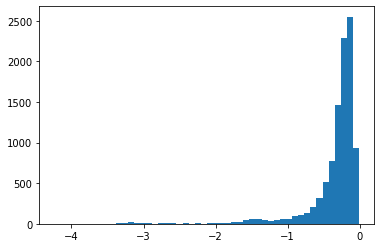

-4.232 now , here s a breakfast spread .
-3.779 now well see if our suspicions are correct .
-3.594 now she knows she must sneak out tonight to meet the prince .
-3.573 now lets get you into bed and henry will take care of everything .
-3.513 now , i need to go and help someone else .

-0.012 eight one one five .
-0.013 i m through running .
-0.016 i m through .
-0.017 neither of them thought to run before it was too late .
-0.018 i do nt remember other .


In [222]:
for j in range(100):
    if j not in zero_index:
        print(j)
        plt.hist(latents[:,j], bins=50)
        plt.show()
        sorted_args = np.argsort(latents[:,j])
        for i in range(5):
            print("{:.3f}".format(latents[sorted_args[i], j]), test_lines[sorted_args[i]])
        print()
        for i in range(1, 6):
            print("{:.3f}".format(latents[sorted_args[-i], j]), test_lines[sorted_args[-i]])

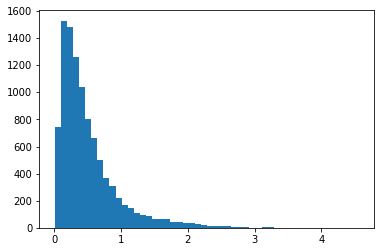

0.007 you can lead us , right ?
0.008 his arm is draped around me .
0.009 everything here was unknown .
0.011 you have my support .
0.012 i walked away before he could say anything else .
0.012 she met his gaze squarely .
0.013 the safety is on right ?
0.013 he crowded closer .
0.014 he commanded me , and i obeyed .
0.014 nothing was over until he said it was .
0.015 she said , leading him to what she wanted him to say .
0.015 anything i should know before i go ?
0.015 i stood in the doorway , unable to enter .
0.016 i executed a little wave .
0.016 she matched his steps .
0.016 then he grabs my arm .
0.016 you can give us more instructions when you wake up .
0.016 but we re connected by more than that .
0.016 was one of them perched on the wall next to the office ?
0.016 i crowded him in the doorway .

4.562 bob really needs this job , and he really needs this show to be a hit .
4.523 it was really , really strange having park s mom wash her hair .
4.196 really , really miss her .
3.2

In [227]:
j = 5
num_sents = 20
plt.hist(latents[:,j], bins=50)
plt.show()
sorted_args = np.argsort(latents[:,j])
for i in range(num_sents):
    print("{:.3f}".format(latents[sorted_args[i], j]), test_lines[sorted_args[i]])
print()
for i in range(1, num_sents+1):
    print("{:.3f}".format(latents[sorted_args[-i], j]), test_lines[sorted_args[-i]])

In [373]:
mean = np.array([0,0])
cov = np.array([[2,-1],[-1,2]])
samples = np.random.multivariate_normal(mean, cov, size=10000)

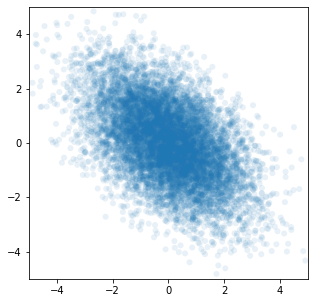

In [374]:
fig = plt.figure()
fig.set_size_inches(5,5)
plt.scatter(samples[:,0], samples[:,1], alpha=.1, edgecolors='none')
plt.xlim([-5,5])
plt.ylim([-5,5])
plt.show()
plt.close(fig)

# Gaussian Mixture Model Fitting

In [438]:
from sklearn.mixture import GaussianMixture as GM

In [572]:
n_components = 1
gm = GM(n_components, verbose=2)
gm.fit(latents)

Initialization 0
Initialization converged: True	 time lapse 0.21620s	 ll 227.32601


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=1, n_init=1, precisions_init=None,
                random_state=None, reg_covar=1e-06, tol=0.001, verbose=2,
                verbose_interval=10, warm_start=False, weights_init=None)

In [573]:
decoded, _ = model.beam_search_from_vector(torch.FloatTensor(gm.means_))
print("{:.2f}".format(decoded[0][1].item()), index2sentence(decoded[0][0][0,1:].tolist(), index2word))

-11.56 being kissed no the dishes , and he demanded by . EOS


In [574]:
samples = np.random.multivariate_normal(gm.means_[0], gm.covariances_[0], size=20)
samples = torch.FloatTensor(samples)
for x in samples:
    decoded, _ = model.beam_search_from_vector(x.unsqueeze(0))
    print("{:.2f}".format(decoded[0][1].item()), index2sentence(decoded[0][0][0,1:].tolist(), index2word))
print()

-16.69 who i just kiss this , or what s jack ? EOS
-16.96 you re nt even able it if i stood out of a whole family from a female . EOS
-9.53 what should i do nt like that kind of tests ! EOS
-10.45 run because i was in my pad ! EOS
-9.92 you knew that heart , would nt do what he treated tanner ! EOS
-8.35 my family did feel interest to a tire on the eyes . EOS
-12.34 hands before i put up on she snatched alarm one . EOS
-9.78 was nt she going well about it , and his daughter first ? EOS
-14.93 he banged away her gun like an idiot , his mind could handle its private . EOS
-12.21 i do you cross their line , and they slipped me over to me . EOS
-13.39 yes , i bit you , we ll be packing in no faster options . EOS
-10.65 love you being disgusting , just before him trey . EOS
-18.18 began her she glanced off his directly first to her waist ? EOS
-16.11 she pulled the black s nose along each other , and he was no longer looked out of his angle . EOS
-14.24 ya want to run behind you , she left 

In [37]:
np.linalg.norm(gm.means_[0])

7.312970234089018

In [10]:
n_components = 20
gm = GM(n_components, verbose=2)
gm.fit(latents)

Initialization 0
  Iteration 10	 time lapse 12.80223s	 ll change 0.06609
Initialization converged: True	 time lapse 17.45373s	 ll 290.45426


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=20, n_init=1,
                precisions_init=None, random_state=None, reg_covar=1e-06,
                tol=0.001, verbose=2, verbose_interval=10, warm_start=False,
                weights_init=None)

In [17]:
model.to("cpu")
for i in range(n_components):
    samples = np.random.multivariate_normal(gm.means_[i], gm.covariances_[i], size=10)
    samples = torch.FloatTensor(samples)
    print("Component {}".format(i))
    for x in samples:
        decoded, _ = model.beam_search_from_vector(x.unsqueeze(0))
        print("{:.2f}".format(decoded[0][1].item()), index2sentence(decoded[0][0][0,1:].tolist(), index2word))
    print()

Component 0
-11.72 at dinner , i just sit through the woods and it s not really yet . EOS
-21.76 everyone else saw me on the table , shivering at a little and tugging me , he had a chin . EOS
-11.63 that for the father of noticed hes calls off . EOS
-11.70 i glance not one , that locked against it . EOS
-14.23 at the only dark apartment where she paused , and then pounded well . EOS
-14.37 at the street they ve fixed ground a moment ago . EOS
-12.23 i stare her eyes glanced at his bat even to a table . EOS
-17.20 she glanced at me at school , but the summer would put him along with great daily lives . EOS
-6.92 screaming for tonight , by them glance . EOS
-27.47 back at the distance , several nights ago , they were dancing in with a butterfly ink shaped in my backpack . EOS

Component 1
-14.57 i do , but i just arrived a small oven from another jet . EOS
-18.10 i pushed against the air , not sure he could notice sorrow in me of a intercom . EOS
-16.01 i wrapped my head to kiss her , wh

In [93]:
np.sqrt(1/4*256)

8.0

# Vector space operations

### subject pronoun manipulation

In [32]:
model.eval()
model.to("cpu")
s1_he = "he stayed completely still for the next moment ."
s1_she = "she stayed completely still for the next moment ."
s1_they = "they stayed completely still for the next moment ."
s1_i = "i stayed completely still for the next moment ."
s1_you = "you stayed completely still for the next moment ."
s1_we = "we stayed completely still for the next moment ."

In [33]:
x1_he = sentence2vector(model, s1_he)
x1_she = sentence2vector(model, s1_she)
x1_they = sentence2vector(model, s1_they)
x1_i = sentence2vector(model, s1_i)
x1_you = sentence2vector(model, s1_you)
x1_we = sentence2vector(model, s1_we)

In [34]:
bd_x1_he, img1_he = model.beam_search_from_vector(x1_he)
bd_x1_she, img1_she = model.beam_search_from_vector(x1_she)
bd_x1_they, img1_they = model.beam_search_from_vector(x1_they)
bd_x1_i, img1_i = model.beam_search_from_vector(x1_i)
bd_x1_you, img1_you = model.beam_search_from_vector(x1_you)
bd_x1_we, img1_we = model.beam_search_from_vector(x1_we)

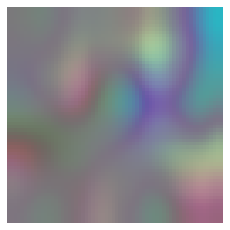

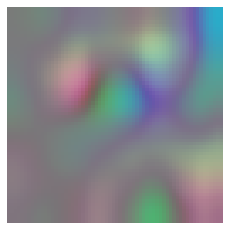

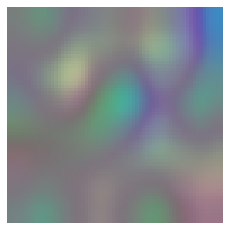

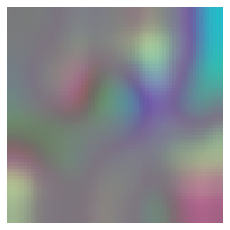

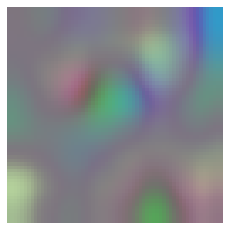

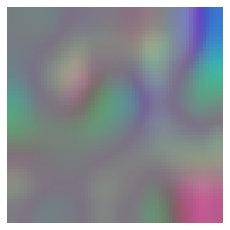

In [35]:
show_image(tensor2image(img1_he[0]))
show_image(tensor2image(img1_she[0]))
show_image(tensor2image(img1_they[0]))
show_image(tensor2image(img1_i[0]))
show_image(tensor2image(img1_you[0]))
show_image(tensor2image(img1_we[0]))

In [36]:
print(index2sentence(bd_x1_he[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x1_she[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x1_they[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x1_i[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x1_you[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x1_we[0][0][0,1:].tolist(), index2word))

he stayed completely still for the next moment . EOS
she stayed completely still for the next moment . EOS
they stayed completely still for the next moment . EOS
i stayed completely still for the next moment . EOS
you stayed completely still for the next moment . EOS
we stayed completely still for the next moment . EOS


In [66]:
cos_sim(pca.transform(x1_they)[0], pca.transform(x1_we)[0])

0.66149086

5.34442663192749


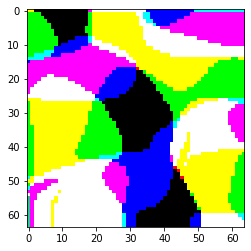

In [37]:
with torch.no_grad():
    z = x1_we - x1_i
    _, img_z = model.extract_features(z)
print(torch.linalg.norm(z[0]).item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

they stayed completely still for the next moment . EOS
-4.865013122558594


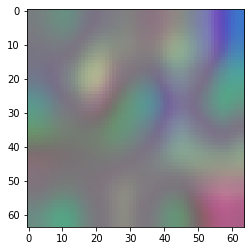

In [38]:
with torch.no_grad():
    z = x1_we - x1_i + x1_he
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

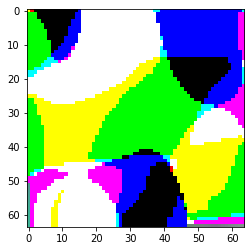

In [19]:
with torch.no_grad():
    z = x1_they - x1_he
    _, img_z = model.extract_features(z)
plt.imshow(tensor2image(img_z[0]))
plt.show()

completely we stayed still for the next moment . EOS
-3.865880250930786


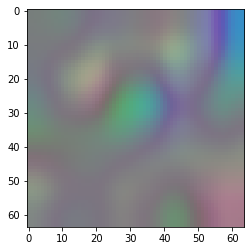

In [39]:
with torch.no_grad():
    z = (x1_they - x1_he) + x1_i
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

you stayed completely still for their next time . EOS
-8.652512550354004


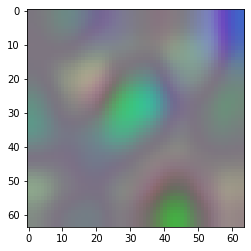

In [41]:
with torch.no_grad():
    z = x1_they - x1_he + x1_you
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

you stayed completely still for our moment they next . EOS
-9.966156005859375


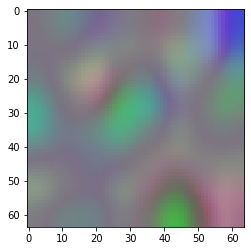

In [42]:
with torch.no_grad():
    z = x1_we - x1_i + x1_you
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

completely he stayed still for her next moment . EOS
-2.5776076316833496


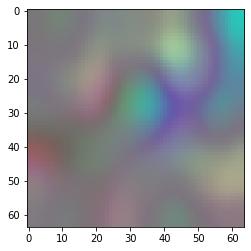

In [45]:
with torch.no_grad():
    z = x1_i - x1_we + x1_they
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i stayed completely still for the next moment . EOS
-2.9239706993103027


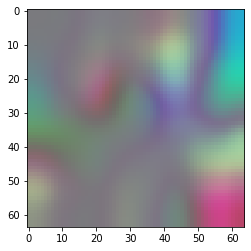

In [46]:
with torch.no_grad():
    z = x1_he - x1_they + x1_we
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

then he continued as calmly as he could . EOS
-1.000442385673523


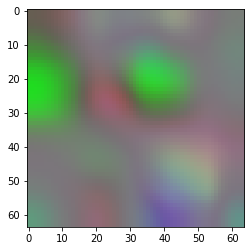

In [48]:
s2_he = "then he continued as calmly as he could ."
x2_he = sentence2vector(model, s2_he)
bd_x2_he, img_x2_he = model.beam_search_from_vector(x2_he)
print(index2sentence(bd_x2_he[0][0][0,1:].tolist(), index2word))
print(bd_x2_he[0][1].item())
plt.imshow(tensor2image(img_x2_he[0]))
plt.show()

In [49]:
print(torch.linalg.norm(x2_he[0]).item())

9.863146781921387


then they continued as calmly as he could . EOS
-0.938031792640686


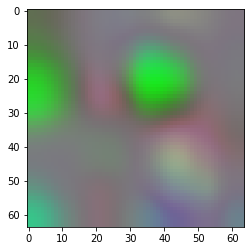

In [50]:
with torch.no_grad():
    z = x1_they - x1_he + x2_he
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

then they continued as he calmly as we could . EOS
-4.0362091064453125


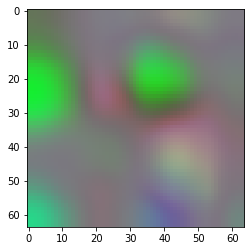

In [51]:
with torch.no_grad():
    z = x1_we - x1_i + x2_he
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

then she continued as calmly as he could . EOS
-1.014629602432251


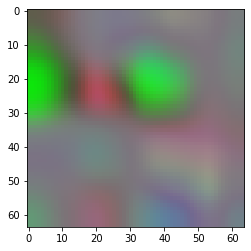

In [44]:
with torch.no_grad():
    z = x1_she - x1_he + x2_he
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

### tense manipulation

In [52]:
s3_1 = "i am there ."
s3_2 = "i will be there ."
s3_3 = "i was there ."

In [53]:
x3_1 = sentence2vector(model, s3_1)
x3_2 = sentence2vector(model, s3_2)
x3_3 = sentence2vector(model, s3_3)
bd_x3_1, _ = model.beam_search_from_vector(x3_1)
bd_x3_2, _ = model.beam_search_from_vector(x3_2)
bd_x3_3, _ = model.beam_search_from_vector(x3_3)
print(index2sentence(bd_x3_1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x3_2[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x3_3[0][0][0,1:].tolist(), index2word))
print(bd_x3_1[0][1].item())
print(bd_x3_2[0][1].item())
print(bd_x3_3[0][1].item())

i am there . EOS
i will be there . EOS
i was there . EOS
-0.43707960844039917
-0.48707711696624756
-0.44806739687919617


In [69]:
print(torch.linalg.norm(x3_1[0]).item())
print(torch.linalg.norm(x3_2[0]).item())
print(torch.linalg.norm(x3_3[0]).item())

6.699996471405029
7.148030757904053
7.079203128814697


In [71]:
cos_sim(pca.transform(x3_1)[0], pca.transform(x3_3)[0])

0.83640766

In [54]:
s4 = "i am going with you ."

In [55]:
x4 = sentence2vector(model, s4)
bd_x4, _ = model.beam_search_from_vector(x4)
print(index2sentence(bd_x4[0][0][0,1:].tolist(), index2word))
print(bd_x4[0][1].item())

i am going with you . EOS
-0.6621503829956055


In [86]:
print(torch.linalg.norm(x4[0]).item())

7.302206993103027


In [115]:
torch.eq(torch.where(torch.abs(x4[0]) < 1e-10)[0], torch.where(torch.abs(x1_he[0]) < 1e-10)[0])

tensor([True, True, True, True, True, True, True, True, True, True, True, True,
        True, True, True, True, True, True, True, True, True, True, True, True,
        True, True, True, True, True, True, True, True])

i will be going with you . EOS
-0.8618355393409729


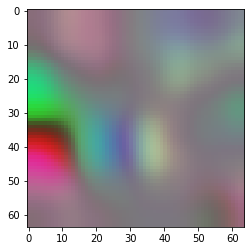

In [51]:
with torch.no_grad():
    z = x3_2 - x3_1 + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i was going with you . EOS
-0.7616597414016724


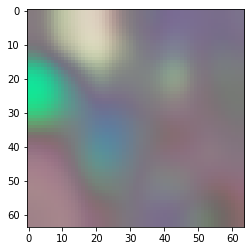

In [52]:
with torch.no_grad():
    z = x3_3 - x3_1 + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i m there . EOS
-2.8652682304382324


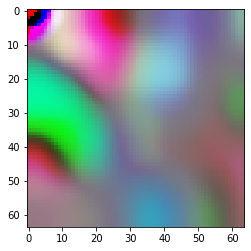

In [60]:
with torch.no_grad():
    z = (x3_2 + x3_3)
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

#### tense + pronoun

they are going with you . EOS
-0.8423060178756714


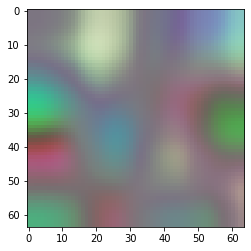

In [53]:
with torch.no_grad():
    z = x1_they - x1_i + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

they will be going with you . EOS
-0.8932702541351318


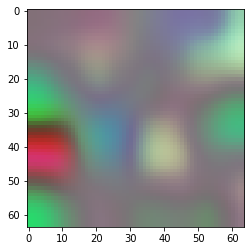

In [54]:
with torch.no_grad():
    z = x1_they - x1_i + x3_2 - x3_1 + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

they were going with you . EOS
-1.1485161781311035


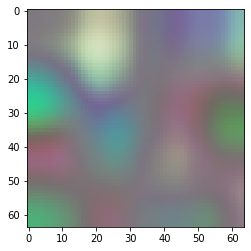

In [65]:
with torch.no_grad():
    z = x1_they - x1_i + 0.5*(x3_3 - x3_1) + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

In [66]:
s5_1 = "i run in the morning ."
s5_2 = "i ran in the morning ."
x5_1 = sentence2vector(model, s5_1)
x5_2 = sentence2vector(model, s5_2)
bd_x5_1, _ = model.beam_search_from_vector(x5_1)
print(index2sentence(bd_x5_1[0][0][0,1:].tolist(), index2word))
bd_x5_2, _ = model.beam_search_from_vector(x5_2)
print(index2sentence(bd_x5_2[0][0][0,1:].tolist(), index2word))
print(bd_x5_1[0][1].item())
print(bd_x5_2[0][1].item())

i run in the morning . EOS
i ran in the morning . EOS
-0.5286900401115417
-0.5524254441261292


In [67]:
print(torch.linalg.norm(x5_1[0]).item())
print(torch.linalg.norm(x5_2[0]).item())

8.549505233764648
8.514665603637695


i ll run in the morning being . EOS
-4.367191314697266


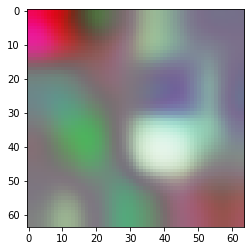

In [68]:
with torch.no_grad():
    z = x3_2 - x3_1 + x5_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i run in the morning . EOS
-2.6777987480163574


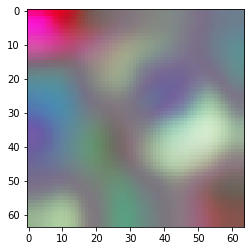

In [77]:
with torch.no_grad():
    z = (x3_3 - x3_1) + x5_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i slid in the morning run . EOS
-4.734732151031494


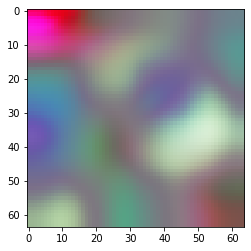

In [81]:
with torch.no_grad():
    z = 1.2*(x3_3 - x3_1) + x5_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i were there . EOS
-2.2215077877044678


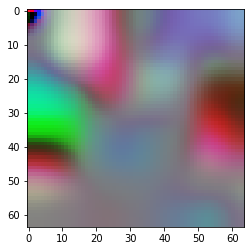

In [68]:
with torch.no_grad():
    z = (x5_2 - x5_1) + x3_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

### negation

In [90]:
s3_not = "i am not there ."
x3_not = sentence2vector(model, s3_not)
bd_x3_not, _ = model.beam_search_from_vector(x3_not)
print(index2sentence(bd_x3_not[0][0][0,1:].tolist(), index2word))
print(bd_x3_not[0][1].item())

i am not there . EOS
-0.46410730481147766


In [83]:
print(torch.linalg.norm(x3_not[0]).item())

7.131072998046875


In [84]:
cos_sim(pca.transform(x3_1)[0], pca.transform(x3_not)[0])

NameError: name 'pca' is not defined

i will not be there . EOS
-0.6474839448928833


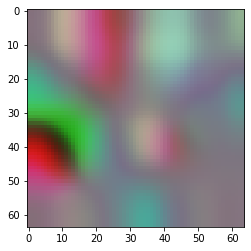

In [85]:
with torch.no_grad():
    z = x3_not - x3_1 + x3_2
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i was not there . EOS
-0.5373213291168213


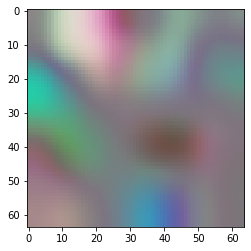

In [71]:
with torch.no_grad():
    z = x3_not - x3_1 + x3_3
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i run not in the morning . EOS
-1.2074998617172241


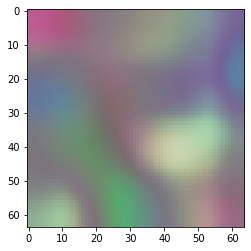

In [72]:
with torch.no_grad():
    z = x3_not - x3_1 + x5_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i am not going with you . EOS
-0.7776677012443542


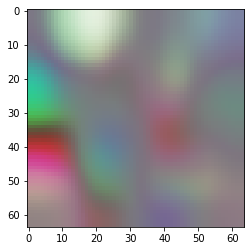

In [73]:
with torch.no_grad():
    z = x3_not - x3_1 + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

he stayed completely not still for the next moment . EOS
-3.0167298316955566


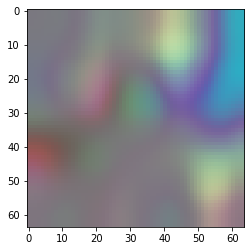

In [95]:
with torch.no_grad():
    z = x3_not - x3_1 + x1_he
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

then he continued not as calmly as he could . EOS
-1.18349289894104


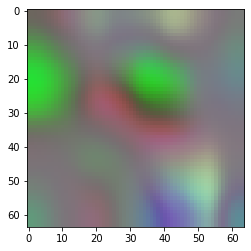

In [96]:
with torch.no_grad():
    z = x3_not - x3_1 + x2_he
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

### statement to question

In [97]:
s6_1 = "you can go home ."
s6_2 = "can you go home ?"
x6_1 = sentence2vector(model, s6_1)
x6_2 = sentence2vector(model, s6_2)
bd_x6_1, _ = model.beam_search_from_vector(x6_1)
bd_x6_2, _ = model.beam_search_from_vector(x6_2)
print(index2sentence(bd_x6_1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x6_2[0][0][0,1:].tolist(), index2word))
print(bd_x6_1[0][1].item())
print(bd_x6_2[0][1].item())

you can go home . EOS
can you go home ? EOS
-0.5594754815101624
-0.5041468739509583


In [98]:
print(torch.linalg.norm(x6_1[0]).item())
print(torch.linalg.norm(x6_2[0]).item())

7.276794910430908
8.205559730529785


In [99]:
torch.eq(torch.where(torch.abs(x6_1[0]) < 1e-10)[0], torch.where(torch.abs(x1_he[0]) < 1e-10)[0])

tensor([True, True, True, True, True, True, True, True, True, True, True, True,
        True, True, True, True, True, True, True, True, True, True, True, True,
        True, True, True, True, True, True, True, True])

am i going with you ? EOS
-0.7556241750717163


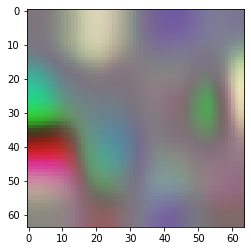

In [100]:
with torch.no_grad():
    z = x6_2 - x6_1 + x4
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

am i there ? EOS
-0.3856028914451599


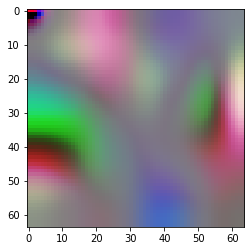

In [101]:
with torch.no_grad():
    z = x6_2 - x6_1 + x3_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

will i be there ? EOS
-0.6512588262557983


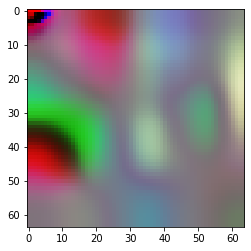

In [102]:
with torch.no_grad():
    z = x6_2 - x6_1 + x3_2
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

was i there ? EOS
-0.6415278911590576


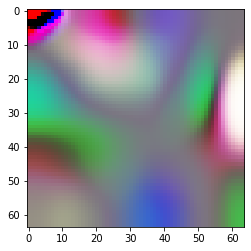

In [105]:
with torch.no_grad():
    z = 1.5*(x6_2 - x6_1) + x3_3
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

In [113]:
s3_q = "am i there ?"
s4_q = "am i going with you ?"
x3_q = sentence2vector(model, s3_q)
x4_q = sentence2vector(model, s4_q)
bd_x3_q, _ = model.beam_search_from_vector(x3_q)
bd_x4_q, _ = model.beam_search_from_vector(x4_q)
print(index2sentence(bd_x3_q[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x4_q[0][0][0,1:].tolist(), index2word))
print(bd_x3_q[0][1].item())
print(bd_x4_q[0][1].item())

am i there ? EOS
am i going with you ? EOS
-0.3881876468658447
-0.7429244518280029


i am there . EOS
-0.5496283769607544


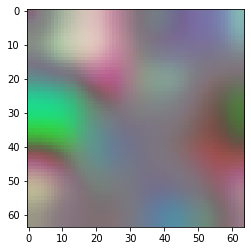

In [114]:
with torch.no_grad():
    z = x6_1 - x6_2 + x3_q
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i am going with you . EOS
-0.7490531802177429


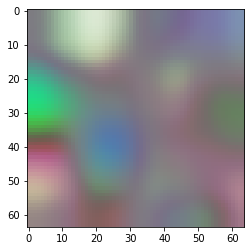

In [115]:
with torch.no_grad():
    z = x6_1 - x6_2 + x4_q
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

### commanding vs requesting

In [83]:
s7_1 = "clean your room ."
s7_2 = "can you clean your room ?"
x7_1 = sentence2vector(model, s7_1)
x7_2 = sentence2vector(model, s7_2)
bd_x7_1, _ = model.beam_search_from_vector(x7_1)
bd_x7_2, _ = model.beam_search_from_vector(x7_2)
print(index2sentence(bd_x7_1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x7_2[0][0][0,1:].tolist(), index2word))
print(bd_x7_1[0][1].item())
print(bd_x7_2[0][1].item())

clean your room . EOS
can you clean your room ? EOS
-0.26480016112327576
-0.4390431344509125


In [77]:
print(torch.linalg.norm(x7_1[0]).item())
print(torch.linalg.norm(x7_2[0]).item())

7.4230146408081055
9.209046363830566


In [119]:
torch.eq(torch.where(torch.abs(x7_1[0]) < 1e-10)[0], torch.where(torch.abs(x1_he[0]) < 1e-10)[0])

tensor([True, True, True, True, True, True, True, True, True, True, True, True,
        True, True, True, True, True, True, True, True, True, True, True, True,
        True, True, True, True, True, True, True, True])

come to my house . EOS
can you come to my house ? EOS
-0.4464179277420044
-0.6166371703147888


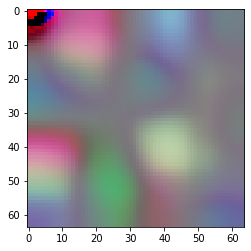

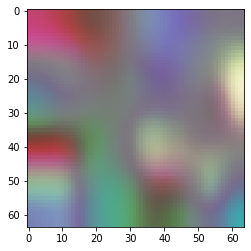

In [84]:
s8_1 = "come to my house ."
s8_2 = "can you come to my house ?"
x8_1 = sentence2vector(model, s8_1)
x8_2 = sentence2vector(model, s8_2)
bd_x8_1, img_x8_1 = model.beam_search_from_vector(x8_1)
bd_x8_2, img_x8_2 = model.beam_search_from_vector(x8_2)
print(index2sentence(bd_x8_1[0][0][0,1:].tolist(), index2word))
print(index2sentence(bd_x8_2[0][0][0,1:].tolist(), index2word))
print(bd_x8_1[0][1].item())
print(bd_x8_2[0][1].item())
plt.imshow(tensor2image(img_x8_1[0]))
plt.show()
plt.imshow(tensor2image(img_x8_2[0]))
plt.show()

In [78]:
print(torch.linalg.norm(x8_1[0]).item())
print(torch.linalg.norm(x8_2[0]).item())

7.487992763519287
9.333196640014648


can you come to my house ? EOS
-0.7884718775749207


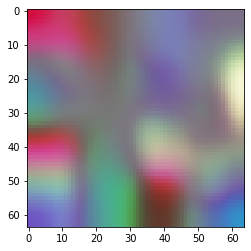

In [85]:
with torch.no_grad():
    z = x7_2 - x7_1 + x8_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

come to my house . EOS
-1.1248048543930054


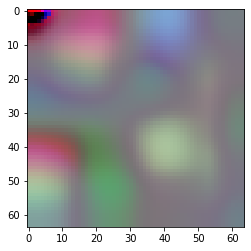

In [86]:
with torch.no_grad():
    z = x7_1 - x7_2 + x8_2
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

can you clean your room ? EOS
-0.9442039728164673


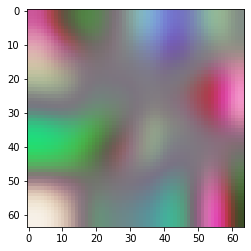

In [87]:
with torch.no_grad():
    z = x8_2 - x8_1 + x7_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

clean your room . EOS
-0.6862858533859253


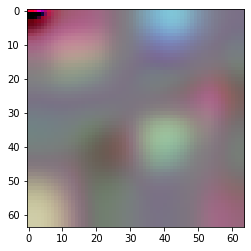

In [88]:
with torch.no_grad():
    z = x8_1 - x8_2 + x7_2
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i m there . EOS
13.430631637573242
-2.8652682304382324


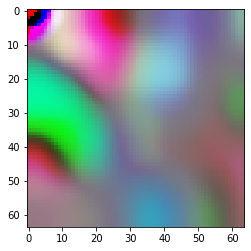

In [167]:
with torch.no_grad():
    z = (x3_2 + x3_3)
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(torch.linalg.norm(z).item())
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

i am there . EOS
-0.43707960844039917


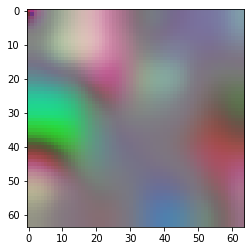

In [163]:
with torch.no_grad():
    z = x3_1
    bd_z, img_z = model.beam_search_from_vector(z)
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
print(bd_z[0][1].item())
plt.imshow(tensor2image(img_z[0]))
plt.show()

In [70]:
zero_index = torch.where(torch.abs(x1_he[0]) < 1e-10)[0]
pos_index = torch.where(x1_he[0] > 1e-10)[0]
neg_index = torch.where(x1_he[0] < -1e-10)[0]

In [72]:
len(pos_index), len(zero_index), len(neg_index)

(120, 32, 104)

0.0
perhaps he have experienced such expression even had a human at such a loss at believed a man . EOS
-52.24967575073242 2.0335466526152618e-23


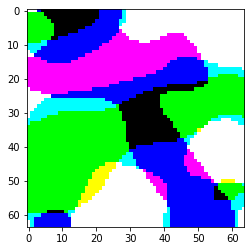

0.1
completely i wanted their card as that . EOS
-7.022374629974365 0.00089170550612992


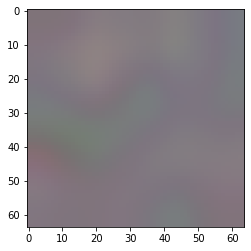

0.2
completely he wanted an area for me abruptly . EOS
-5.655683517456055 0.0034975816115072763


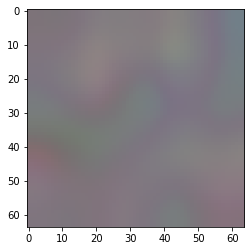

0.30000000000000004
completely he wanted an area for me abruptly . EOS
-5.4257493019104 0.004401766673628696


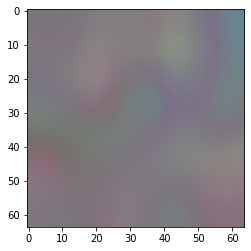

0.4
he stayed completely still for the next thought . EOS
-4.834205627441406 0.007953003464055025


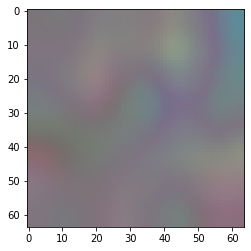

0.5
he stayed completely still for the next moment . EOS
-2.3966927528381348 0.09101847666156987


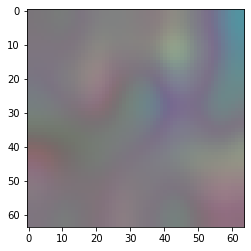

0.6000000000000001
he stayed completely still for the next moment . EOS
-1.2064168453216553 0.2992676829722344


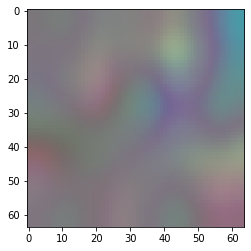

0.7000000000000001
he stayed completely still for the next moment . EOS
-0.9861563444137573 0.37300765214535375


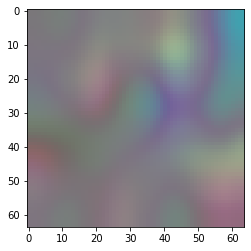

0.8
he stayed completely still for the next moment . EOS
-0.979745090007782 0.37540678159541274


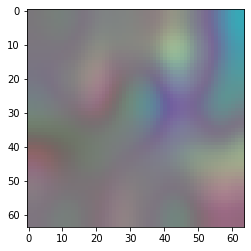

0.9
he stayed completely still for the next moment . EOS
-1.026366949081421 0.3583063439689899


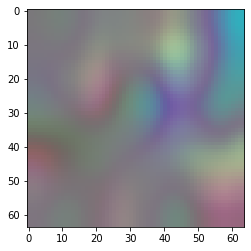

1.0
he stayed completely still for the next moment . EOS
-1.0926464796066284 0.3353278799804221


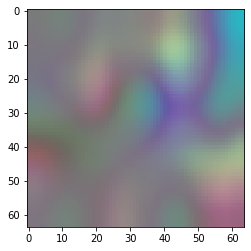

1.1
he stayed completely still for the next moment . EOS
-1.1604506969451904 0.31334492545260856


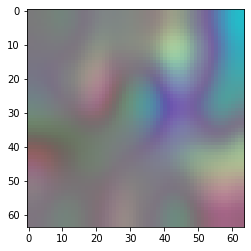

1.2000000000000002
he stayed completely still for the next moment . EOS
-1.2280796766281128 0.2928544132295227


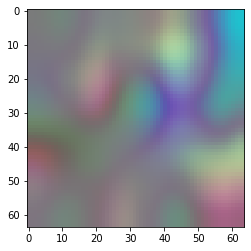

1.3
he stayed completely still for the next moment . EOS
-1.300136923789978 0.2724944795026342


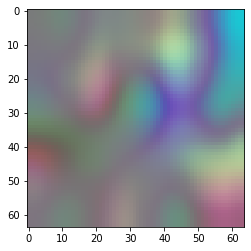

1.4000000000000001
he stayed completely still for the next moment . EOS
-1.3837409019470215 0.2506391805065849


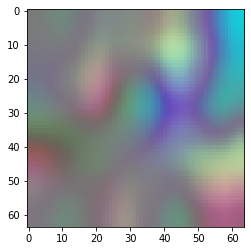

1.5
he stayed completely still for the next moment . EOS
-1.4865120649337769 0.22616011322997814


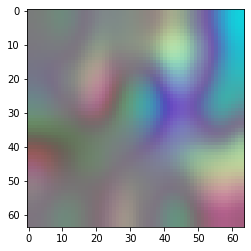

1.6
he stayed completely still for the next moment . EOS
-1.6405551433563232 0.1938723854444112


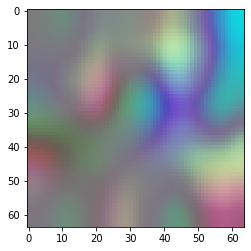

1.7000000000000002
he stayed completely still for the next moment . EOS
-1.8746414184570312 0.15340996696598644


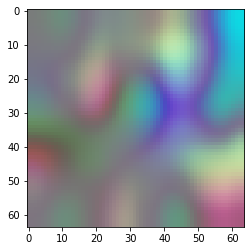

1.8
he stayed completely still for the next moment . EOS
-2.191542387008667 0.11174426273239801


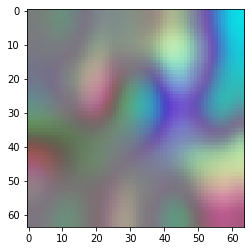

1.9000000000000001
he stayed completely still for the next moment . EOS
-2.5507924556732178 0.0780198142525776


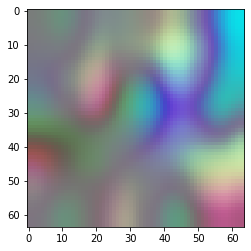

2.0
he stayed completely still for the next moment . EOS
-2.9615726470947266 0.05173748834936612


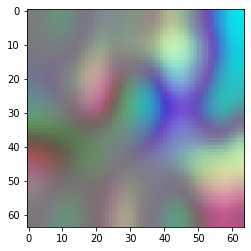

2.1
he stayed completely still for the next moment . EOS
-3.4406485557556152 0.03204389633377897


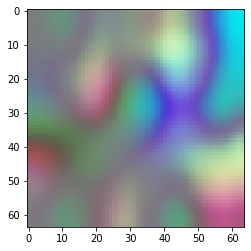

2.2
he stayed completely still for the next body . EOS
-3.848677396774292 0.021307899706742125


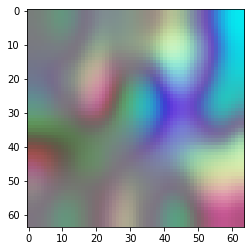

2.3000000000000003
he stayed completely still for the next body . EOS
-4.382374286651611 0.01249565510557771


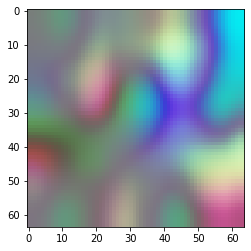

2.4000000000000004
he stayed completely still for the next body he stayed . EOS
-4.947066307067871 0.00710421998746419


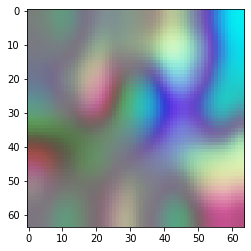

2.5
he stayed completely still for the next body he stayed . EOS
-5.200424671173096 0.005514222192250415


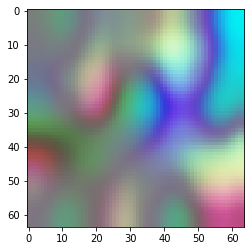

2.6
he stayed completely still for the next body he stayed . EOS
-5.614343166351318 0.003645203204099343


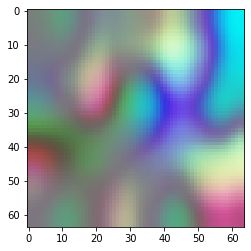

2.7
he stayed completely still for the next body he stayed . EOS
-6.164569854736328 0.00210262260325277


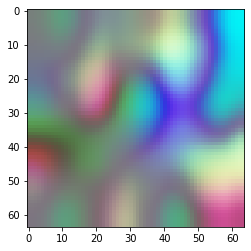

2.8000000000000003
he stayed completely still for the next body he stayed . EOS
-6.745283126831055 0.0011764155573498242


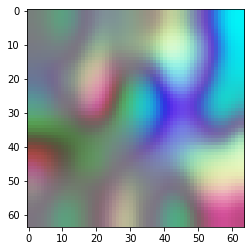

2.9000000000000004
he stayed completely still for the next body he stayed completely . EOS
-7.257473945617676 0.0007048863698799944


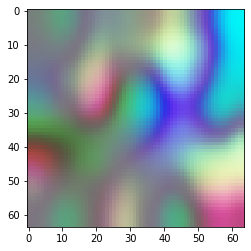

3.0
he stayed completely still for the next body he stayed completely . EOS
-7.6384172439575195 0.00048159008877983494


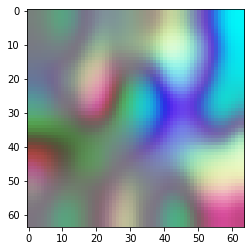

3.1
he stayed completely still for the next body he stayed completely . EOS
-8.076982498168945 0.0003106068795806664


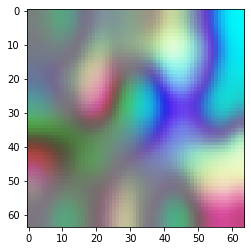

3.2
he stayed completely still for the next body he stayed completely . EOS
-8.629103660583496 0.00017882486112211449


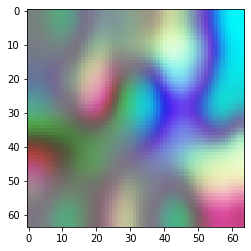

3.3000000000000003
he stayed completely still for the next body he stayed completely . EOS
-9.266660690307617 9.45236310874873e-05


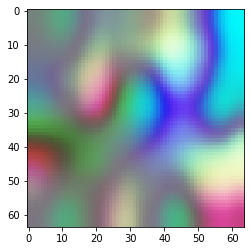

3.4000000000000004
he stayed completely still for the next body he stayed completely . EOS
-9.965749740600586 4.6981824650917434e-05


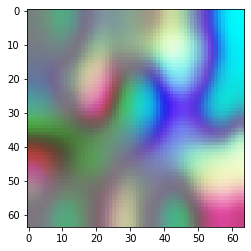

3.5
he stayed completely still for the next body he stayed completely . EOS
-10.72404670715332 2.2009272697566384e-05


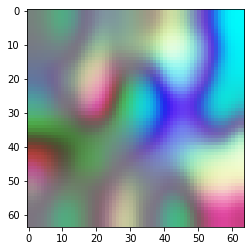

3.6
he stayed completely still for the next body he stayed completely . EOS
-11.557963371276855 9.559612441862408e-06


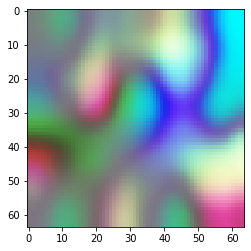

3.7
he stayed completely still for the next body he stayed completely . EOS
-12.45395565032959 3.902256234935347e-06


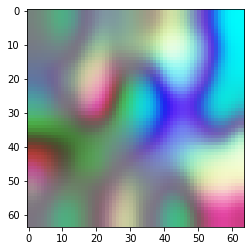

3.8000000000000003
he stayed completely still for the next body he stayed completely . EOS
-13.45344352722168 1.4362952146685243e-06


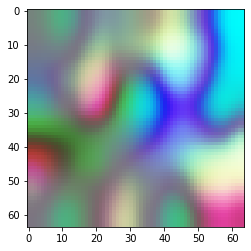

3.9000000000000004
he stayed completely still for the next body he completely he stayed . EOS
-16.301605224609375 8.323439071296256e-08


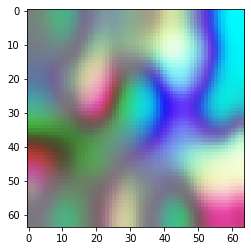

4.0
he stayed completely still for the next body he completely he stayed . EOS
-17.30653953552246 3.0469503599793934e-08


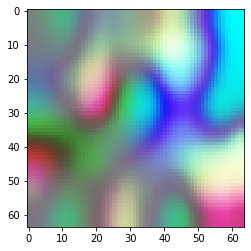

4.1000000000000005
he stayed completely still for the next body he only completely he stayed . EOS
-18.9914608001709 5.650844690772493e-09


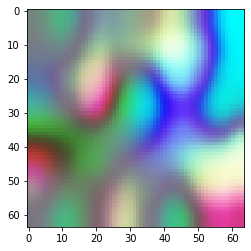

4.2
he stayed completely still for the next body he only body with completely . EOS
-19.790945053100586 2.5403980563385252e-09


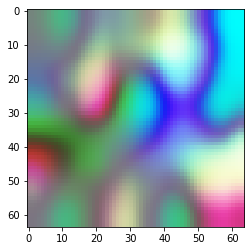

4.3
he stayed completely body he still for the only for completely with a next . EOS
-23.800569534301758 4.608334392754523e-11


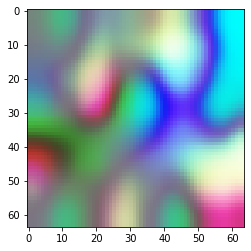

4.4
he stayed completely body he still for the only for completely with a next . EOS
-24.391088485717773 2.553200160384277e-11


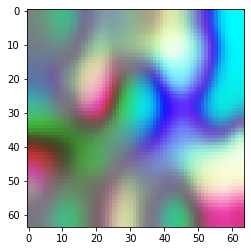

4.5
he stayed completely body he still for the only for completely with a body next . EOS
-25.862621307373047 5.861466384544858e-12


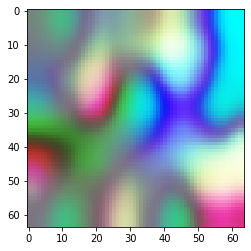

4.6000000000000005
he stayed completely body he still for the only completely with a body for weeks . EOS
-26.03223991394043 4.946999355616422e-12


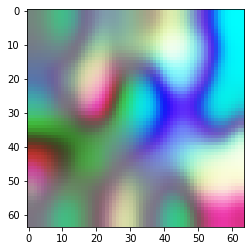

4.7
he stayed completely body he still for the only completely with a body for weeks . EOS
-26.575870513916016 2.872407711710688e-12


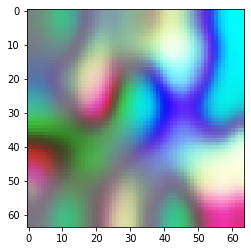

4.800000000000001
he stayed completely body he still for the only for completely with a body next . EOS
-28.54329490661621 4.0161000796334737e-13


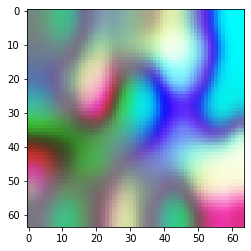

4.9
he stayed completely body he still for only for the body with a completely the next . EOS
-31.101491928100586 3.110238383249111e-14


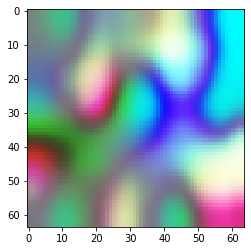

5.0
he stayed completely body he still for only for the body with the next completely easier . EOS
-30.74359130859375 4.448646948038006e-14


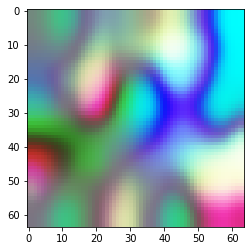

5.1000000000000005
he stayed completely body he still for only for the body with a body completely the next . EOS
-34.94514083862305 6.660673791179089e-16


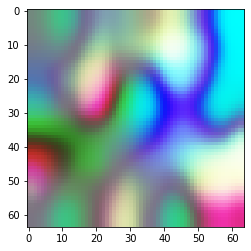

5.2
he stayed completely body he still for only for the body with the next completely a body completely . EOS
-38.53539276123047 1.8377717267371354e-17


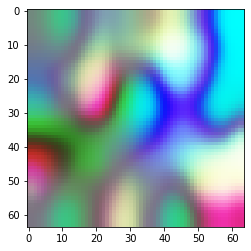

5.300000000000001
he stayed completely body he still for completely for the body with the only a body easier . EOS
-35.579345703125 3.5325351457350884e-16


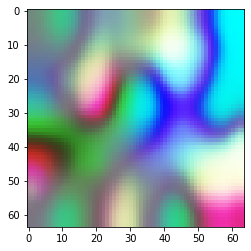

5.4
he stayed completely body he still for only for the completely for the body with a body completely easier . EOS
-42.10128402709961 5.195707166778367e-19


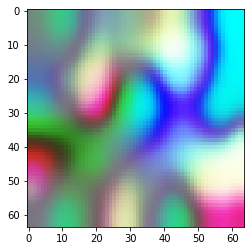

5.5
he stayed completely body only for he still for the body with a body completely he completely the whole easier . EOS
-45.336238861083984 2.045133357370949e-20


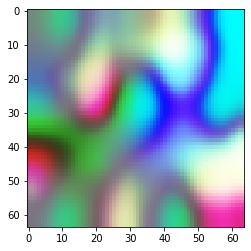

5.6000000000000005
he stayed completely body only for he still for the body completely with a body for the whole body he easier . EOS
-49.268577575683594 4.008008442471505e-22


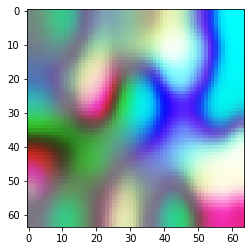

5.7
he stayed completely body for he only completely still for the body with a body for the whole body he easier . EOS
-49.65092849731445 2.734486176453437e-22


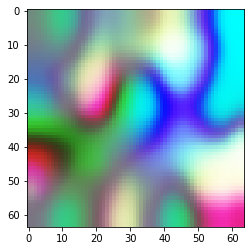

5.800000000000001
he stayed completely body for he only completely still for the body with a body for the whole body he completely he easier . EOS
-56.49675369262695 2.909186917141563e-25


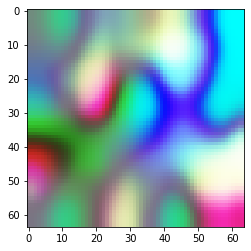

5.9
he stayed completely body for he still only completely for the body for the body with a body he completely the whole easier . EOS
-57.277442932128906 1.332669925456626e-25


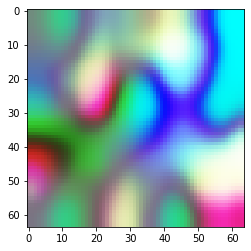

6.0
he stayed completely body for he only completely still for the body for the body with a body he completely he easier the whole conversation . EOS
-65.20924377441406 4.786138474992242e-29


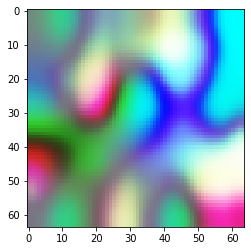

6.1000000000000005
he stayed completely body for he still only completely for the body for the body with a body he completely he completely he easier the whole conversation . EOS
-72.72032165527344 2.6179755297948527e-32


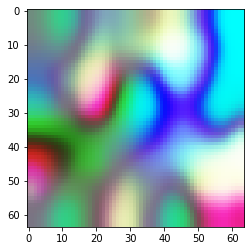

6.2
he stayed completely body completely for he still for the only body with body for the body a body he completely he easier the next thirty easier . EOS
-71.61698150634766 7.891146773356647e-32


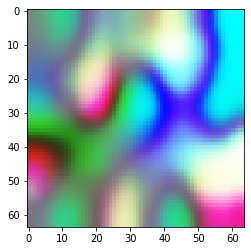

6.300000000000001
he stayed completely body completely for he still only for the body with body for the body the body he easier a body he completely he completely he stayed with a conversation . EOS
-89.34620666503906 1.5755618860889814e-39


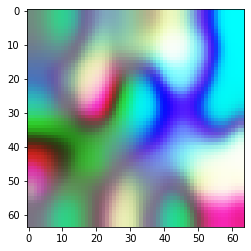

6.4
he stayed completely body for he only body completely still for the body for the body with a body he completely he easier with the whole he stayed completely he body a conversation . EOS
-96.49352264404297 1.2399254560323418e-42


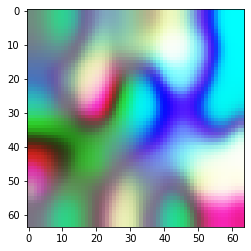

6.5
he stayed completely body for he only body completely still for the body for the body with the body he completely he completely he easier with a whole he stayed a conversation body a conversation . EOS
-104.45702362060547 4.314108322248858e-46


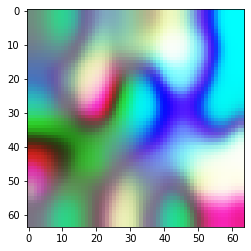

6.6000000000000005
he stayed completely body for he only body completely still for the body for the body with the body he completely he completely he easier with a whole he stayed a conversation body he only thirty easier . EOS
-112.32054138183594 1.65885594477327e-49


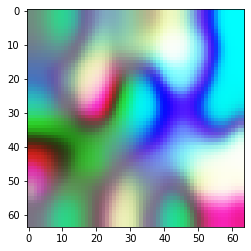

6.7
he stayed completely completely body for he still body for the only body with body for the body he only a body he completely he easier for the whole he stayed with the body he completely the conversation thirty easier . EOS
-120.5239486694336 4.540609523189447e-53


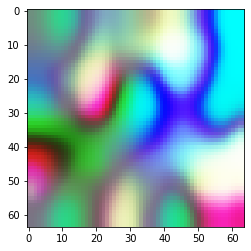

6.800000000000001
he stayed completely body completely he only for body with body for the body for the body for a body he only he easier he still the whole he stayed completely he completely the body a conversation thirty easier . EOS
-120.98025512695312 2.87701932533965e-53


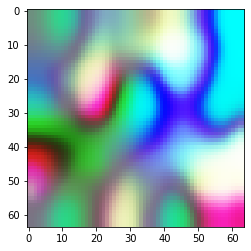

6.9
he stayed completely body completely he only for body with body for the body for the body he easier for a body he completely he still for the whole he only thirty easier the body he stayed completely the body a conversation thirty easier . EOS
-139.9290313720703 1.696656077246798e-61


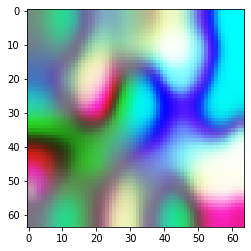

7.0
he stayed completely body completely he only for body for body for the body with the body he still the body he completely he easier for a body he only thirty easier for the whole he stayed with a thirty easier the body he completely he only thirty the
-157.4763946533203 4.063224065445714e-69


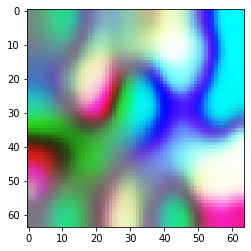

7.1000000000000005
he stayed completely completely body he only body for he stayed for body for the body for the body with the body with a body he completely he only easier with a whole he completely he only thirty easier for the whole the body a conversation body he body
-153.8431396484375 1.5373521941075108e-67


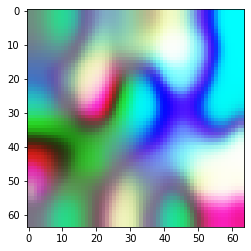

7.2
he stayed completely completely body he only body for he stayed for body for the body for the body for the body with a body he completely he only easier with a body he completely he still the whole he only thirty the whole he only thirty easier the
-155.0235137939453 4.72218931343298e-68


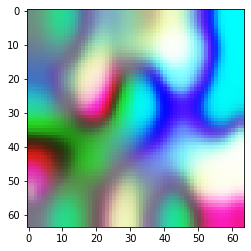

7.300000000000001
he stayed completely completely body he only body for he stayed for body for the body for the body with body with the only a body he completely he completely he easier for the whole he still the body he only thirty easier for the whole he completely he
-155.32977294921875 3.4764559663020873e-68


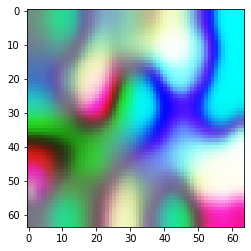

7.4
he stayed completely completely body he only body for he stayed for body with body for the body for the body only a body with the body he completely he easier for the whole the he completely he only he only thirty easier for the whole he completely he
-154.48623657226562 8.081275761380723e-68


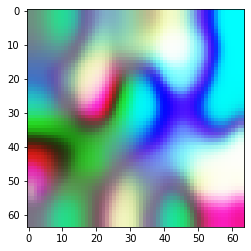

7.5
he stayed completely body completely he only body for he stayed with body for body for the body for the body only he completely the body for the body a body he completely he completely he easier for a whole the conversation only he only thirty easier for the
-156.02450561523438 1.7354742315585082e-68


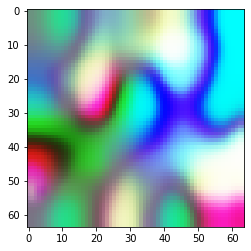

7.6000000000000005
he stayed completely body completely he only body body for he stayed with body for body for the body for the only he completely for the body he completely he easier for the only a body a body he completely he still the whole he only thirty easier for
-156.11521911621094 1.5849727383215066e-68


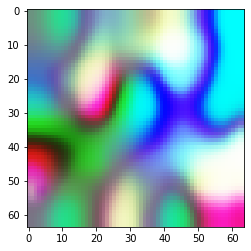

7.7
he stayed completely body completely he only body body for he stayed with body for body for the body for the only he completely he only body for the body he easier for the body he completely a whole the he only thirty easier for the he completely he
-156.22813415527344 1.4157397249625157e-68


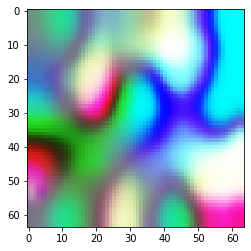

7.800000000000001
he stayed completely body completely he only body body for he stayed with body for body for the body for the only he completely he only easier for the body a body he completely he completely he still the body for the whole the body he only thirty easier
-157.03993225097656 6.286718073424117e-69


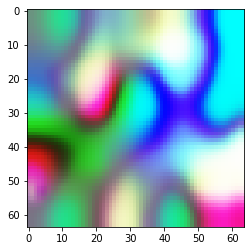

7.9
he stayed completely body only body he stayed body for he only body completely for he completely for the body for the body with he completely he easier with the body completely he completely he body for the body easier for the body he only a body he body
-158.74745178222656 1.1398761707558376e-69


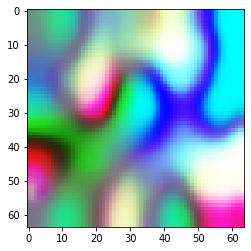

8.0
he stayed completely body body body he only he stayed completely for only body for he completely for the body for the body with body with he completely he only easier for the whole the body he completely he only easier for the body a body he completely he
-159.77066040039062 4.09716843370444e-70


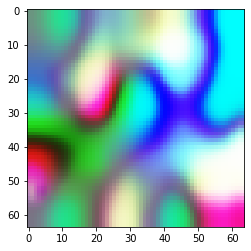

8.1
he stayed completely body body body he only he stayed completely for he only body for completely for the body for the body with body only he completely he easier for the body with a body he completely he only easier for the whole the he completely he body
-161.4088134765625 7.962381400373093e-71


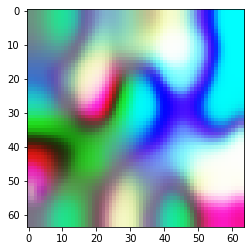

8.200000000000001
he stayed completely body body body he only he stayed completely for only body for he completely for the body for the body he completely he only body with body easier for the body with he completely he only easier for the whole the he completely he only body
-160.92782592773438 1.288051461994713e-70


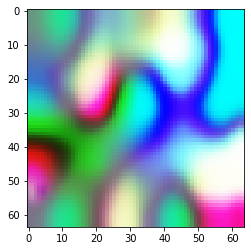

8.3
he stayed completely body completely body he only body he stayed body for he only body for body for the body for the he completely he only body with body easier for the he completely he only easier for the he completely he stayed with thirty easier for the
-160.0098876953125 3.225438191240591e-70


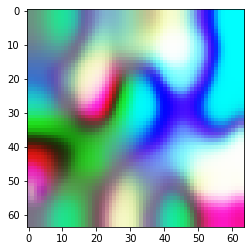

8.4
he stayed completely body completely body he only body he stayed body for he only body for he stayed with body for the only body for the body completely he completely for the he completely he only easier for the body easier for the body he completely he body
-157.34530639648438 4.632353341667723e-69


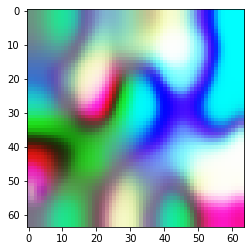

8.5
he stayed completely body completely body he only body he stayed body for he only body for he stayed with body for the only body completely for the body completely he completely for the he completely he only easier for the body easier for the he completely he body
-156.931396484375 7.007457451691775e-69


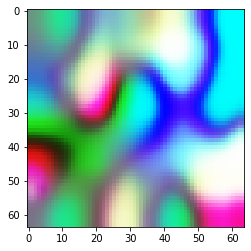

8.6
he stayed completely body body body he only he stayed completely body only body for he only body for he stayed with body for he completely for the body completely for the he completely for the he completely he only body easier for the body plan for the body
-156.03587341308594 1.7158574225283745e-68


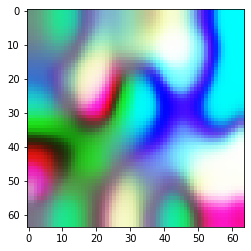

8.700000000000001
he stayed completely body body body he only he stayed completely body only body for he only body for he stayed completely for he completely for the body for the body with he completely he only body easier for the he completely he completely he body plan for the
-157.05735778808594 6.178117593213294e-69


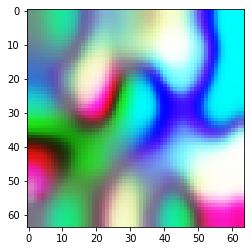

8.8
he stayed completely body body body he only he only he stayed completely body body for body for he only body completely for he stayed completely for the body for the body with body completely he completely he only easier for the body easier with the he completely he
-159.67799377441406 4.4949868172880864e-70


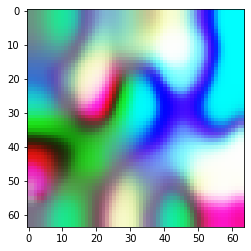

8.9
he stayed completely body body body he only he only he stayed completely body for only body for he completely body for he stayed completely body for the body with body for the body completely he completely he only body easier for the body with the he only body
-159.07469177246094 8.217489404083125e-70


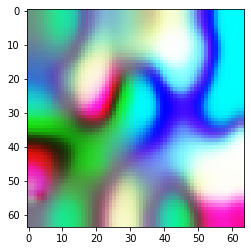

9.0
he stayed completely body body body he only he only he stayed completely body completely body for he only body for body for he stayed completely for the body for the body only he completely he only body easier for the body with he completely easier for the body
-157.49102783203125 4.004199096261933e-69


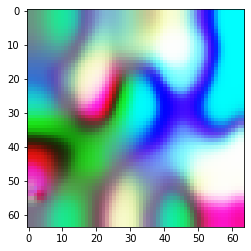

9.1
he stayed completely body body body he only he only he stayed completely body completely body for he only body for he stayed completely for body for the body for the body only he completely he only body easier for the body with he completely he completely he body
-157.08193969726562 6.028099092449795e-69


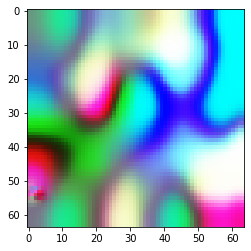

9.200000000000001
he stayed completely body body he only he only body completely body body he stayed body for he stayed completely for body for he only body for he completely for the only body completely he only body for the he completely he body easier for the body plan with
-159.6990966796875 4.401123414866134e-70


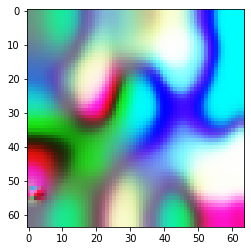

9.3
he only body completely body he stayed he stayed completely body body body he stayed completely body for he only he stayed completely for body for he only body for he only body for the body for he completely he only body with body easier for the he completely
-156.781982421875 8.136735006633048e-69


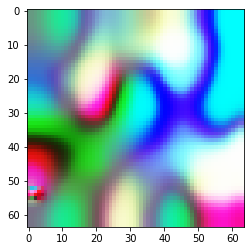

9.4
he only body completely body he stayed he stayed completely body body he stayed completely body body for he only he stayed body for he only body for only body for he completely for he completely for the body only body with body for the he completely he body
-156.61082458496094 9.655684715822681e-69


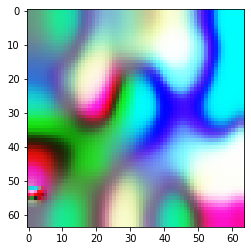

9.5
he completely body body body he stayed he only he stayed only body only body completely body for he stayed completely he stayed completely for body for only body for he completely for he body for the only he only he completely he body easier for the he body
-159.45526123046875 5.6164246552419036e-70


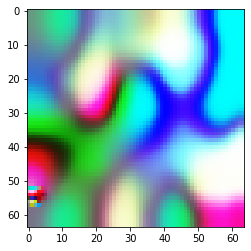

9.600000000000001
he completely body body body he stayed he only he stayed completely body only body only body for only he stayed he stayed he stayed completely for body completely for body for body for he completely for the body completely he completely he body with body for the body
-157.68138122558594 3.3101390282628304e-69


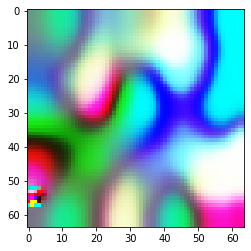

9.700000000000001
he only body body he stayed completely he stayed completely body body completely body body he body he only he stayed he stayed body for body for he only he completely for only body for he only he stayed completely for he completely for body for only he completely
-157.17991638183594 5.465496862811889e-69


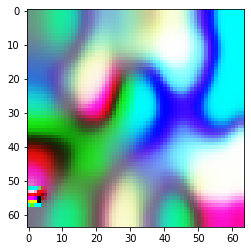

9.8
he only body body he stayed completely he stayed completely body completely body body he stayed he only he stayed body body for he stayed completely body for he only he only body for body for he only he completely body for body for he completely he completely body
-154.5116424560547 7.878549927161708e-68


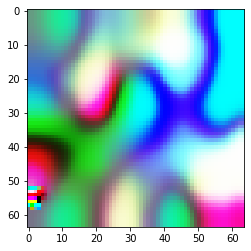

9.9
he only body body he stayed completely he stayed completely body completely body body he stayed he only he stayed he stayed completely body body for body body for he only he only body for he only he completely body for body for he completely for he completely body
-153.11184692382812 3.194256351081332e-67


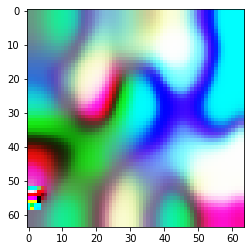

10.0
he only body body he stayed completely he stayed completely body completely body body he stayed he only he only he stayed completely body body body body for body for he body for he only he completely for he only he stayed completely for he completely for he body
-153.50250244140625 2.1612760025430016e-67


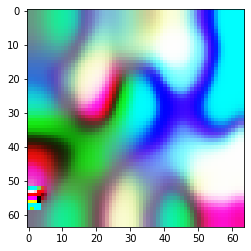

In [122]:
for k in np.linspace(0, 10, 101):
    with torch.no_grad():
        z = k*x1_he
        bd_z, img_z = model.beam_search_from_vector(z, max_len=20)
    print(k)
    print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    prob = bd_z[0][1].item()
    print(prob, np.exp(prob))
    plt.imshow(tensor2image(img_z[0]))
    plt.show()

0.0
perhaps he have experienced such expression even had a human at such a loss at believed a man .
-52.129119873046875 2.2940923287260082e-23


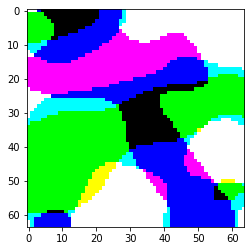

0.3333333333333333
to the not in the not around around the around in my around the around the it around the
-36.8232536315918 1.018272797616743e-16


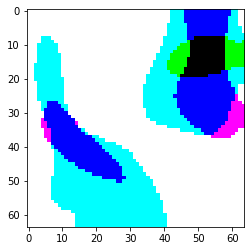

0.6666666666666666
to the not in around the around my around my around the it around in my around my around
-39.70945358276367 5.680720601395996e-18


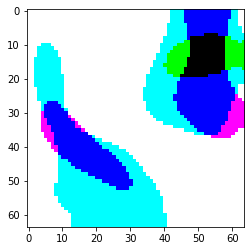

1.0
to at the not around the around in my around my around my in the it around it around
-35.67658233642578 3.2052149380526553e-16


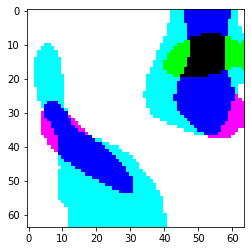

1.3333333333333333
to at the not around my around in the around my around my around my around the it around
-38.373783111572266 2.1601193381782902e-17


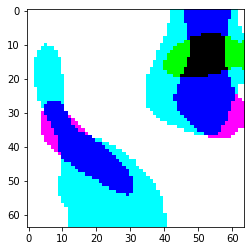

1.6666666666666665
to at the not around in my around my around my around my around the around the it around
-37.30634689331055 6.281442726334912e-17


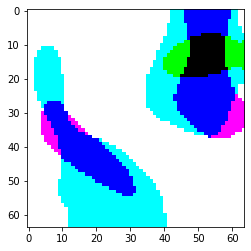

2.0
to at the not around in my around my around my around my around the it around in the
-36.576988220214844 1.302614329407911e-16


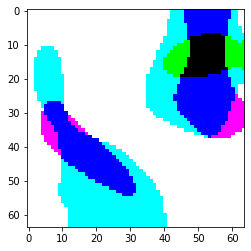

2.333333333333333
to at the not around in my around my around my around my around the it around in the
-36.582984924316406 1.2948263112745172e-16


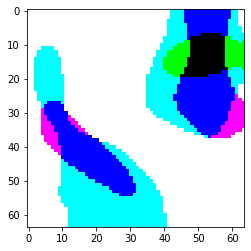

2.6666666666666665
to at the not around in my around my around my around my around the around my around the
-37.88150405883789 3.534042931870161e-17


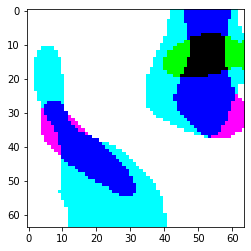

3.0
to at the not around in my around my around my around my around the around my around the
-38.14892578125 2.7047805991808587e-17


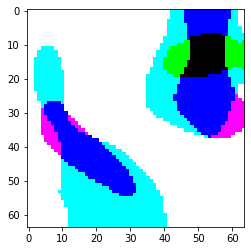

In [124]:
for k in np.linspace(0, 3, 10):
    with torch.no_grad():
        z = -k*x1_he
        bd_z, img_z = model.beam_search_from_vector(z, max_len=20)
    print(k)
    print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    prob = bd_z[0][1].item()
    print(prob, np.exp(prob))
    plt.imshow(tensor2image(img_z[0]))
    plt.show()

0.0
perhaps he have experienced such expression even had a human at such a loss at believed a man .
-52.129119873046875 2.2940923287260082e-23


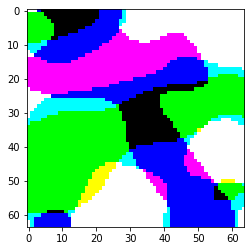

1.0
i am there . EOS
-0.43707960844039917 0.6459200086792963


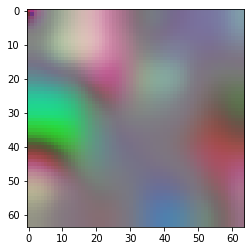

2.0
i am there . EOS
-0.3828619122505188 0.6819070557956008


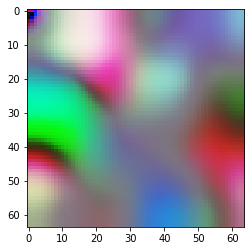

3.0
i am there . EOS
-0.38582006096839905 0.6798928539359067


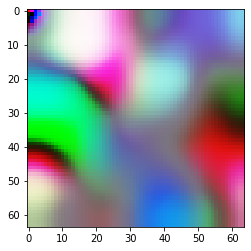

4.0
i am i am there there . EOS
-2.6386470794677734 0.07145788102225614


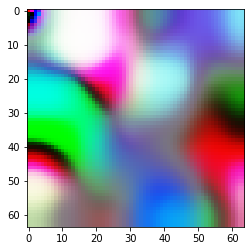

5.0
i am i am i am there is there there . EOS
-5.852190017700195 0.0028735990291722155


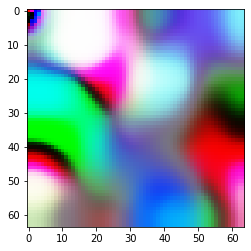

6.0
i i am i am there am i am i am there is there am i am i am
-13.510133743286133 1.3571362955453073e-06


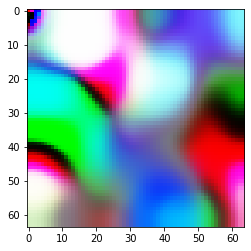

7.0
i i am i am i am i am there am i am there am i am i am
-11.17821979522705 1.3975289896159194e-05


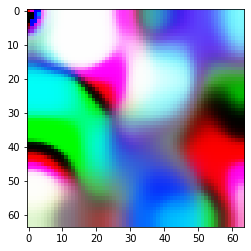

8.0
i i am i am i am i there am i am i am i am i am i
-9.880492210388184 5.116308866670815e-05


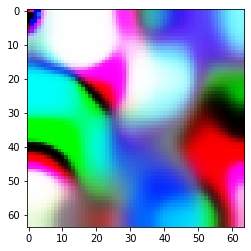

9.0
i i am i am i am i am i am i am i am i am i am
-8.953166007995605 0.00012932706069119587


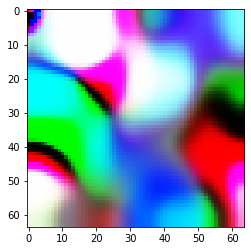

10.0
i i i am i am i am i am i am i am i am i am i
-7.135678291320801 0.0007961855539397662


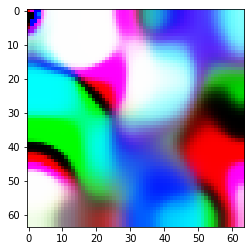

In [126]:
for k in np.linspace(0, 10, 11):
    with torch.no_grad():
        z = k*x3_1
        bd_z, img_z = model.beam_search_from_vector(z, max_len=20)
    print(k)
    print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    prob = bd_z[0][1].item()
    print(prob, np.exp(prob))
    plt.imshow(tensor2image(img_z[0]))
    plt.show()

0.0
perhaps he have experienced such expression even had a human at such a loss at believed a man .
-52.129119873046875 2.2940923287260082e-23


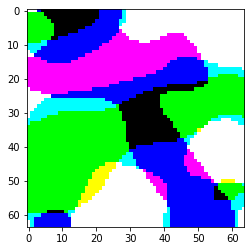

0.3333333333333333
with for around for around for around around around around for one around around around ? EOS
-31.30445098876953 2.53892385760972e-14


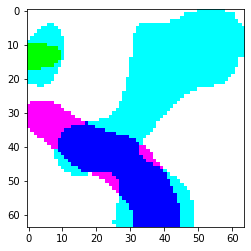

0.6666666666666666
? EOS
-3.6880927085876465 0.02501967637729323


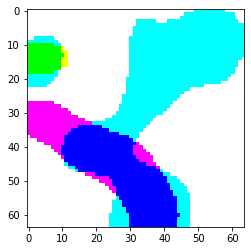

1.0
with for around for around for around around around around for one around around around around around around for
-31.63982391357422 1.8155117580696643e-14


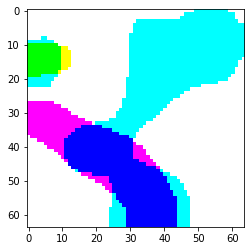

1.3333333333333333
with for around for around for around around around around around around for one around for one around for
-33.784751892089844 2.125537056298805e-15


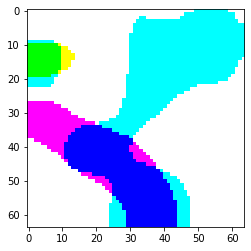

1.6666666666666665
with for around for around around around around around around around for one around for one around around for
-34.375064849853516 1.1778745023625072e-15


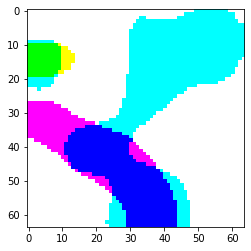

2.0
with for around for around around around around around around around around for one around for one around for
-34.012088775634766 1.6933141079346345e-15


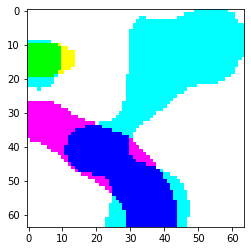

2.333333333333333
for around with around for around around for one around around around around around around for one around for
-36.806636810302734 1.0353346187456165e-16


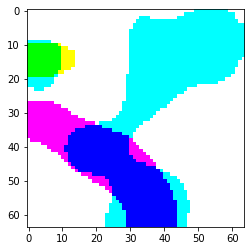

2.6666666666666665
for around with around for around around for one around around around around around around for one around for
-35.940826416015625 2.460919527797449e-16


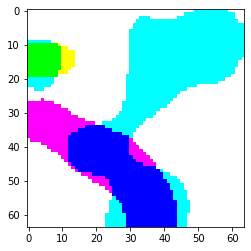

3.0
for around with around for around around around around around around for one around for one around around for
-35.67042541503906 3.2250100704585557e-16


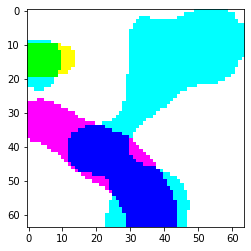

In [127]:
for k in np.linspace(0, 3, 10):
    with torch.no_grad():
        z = -k*x3_1
        bd_z, img_z = model.beam_search_from_vector(z, max_len=20)
    print(k)
    print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    prob = bd_z[0][1].item()
    print(prob, np.exp(prob))
    plt.imshow(tensor2image(img_z[0]))
    plt.show()

0.0
perhaps he have experienced such expression even had a human at such a loss at believed a man .
-52.129119873046875 2.2940923287260082e-23


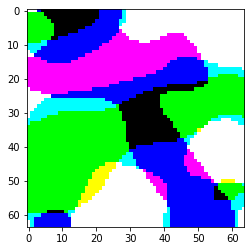

1.0
i am not there . EOS
-0.46410730481147766 0.628696088732186


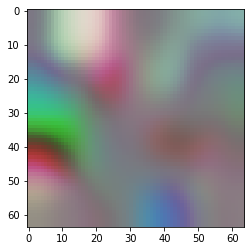

2.0
i am not there . EOS
-0.5572518110275269 0.5727810133168063


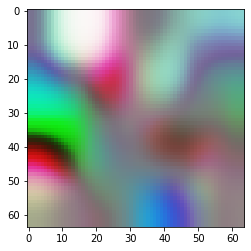

3.0
i am not there . EOS
-0.6047738790512085 0.5461979194688036


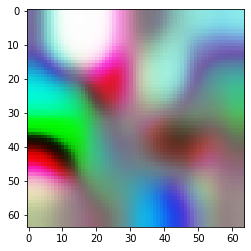

4.0
i am not i am there . EOS
-2.394663095474243 0.09120340058559531


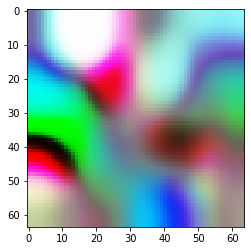

5.0
i am i am not not there i am not . EOS
-5.535015106201172 0.003946149024216363


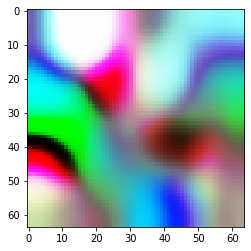

6.0
i am i am not i am not am not there is not i am there . EOS
-12.619105339050293 3.308203255561515e-06


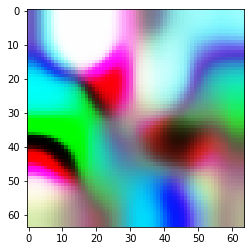

7.0
i i am i am i am not is not am not am i am not is not i
-11.96214485168457 6.381260869504203e-06


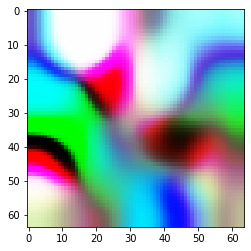

8.0
i i am i am i am i am i am not am not is not is not is
-9.938762664794922 4.8266990145440785e-05


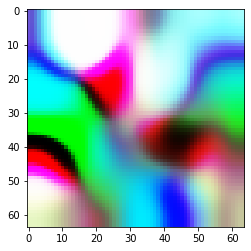

9.0
i i i am i am i am i am i am not is not am not am not
-8.795708656311035 0.00015138131243580755


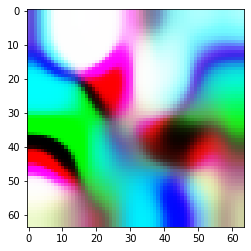

10.0
i i i am i am i am i am i am i am not am not am not
-7.490550518035889 0.0005583355020925537


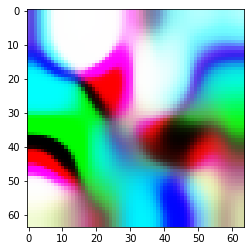

In [128]:
for k in np.linspace(0, 10, 11):
    with torch.no_grad():
        z = k*x3_not
        bd_z, img_z = model.beam_search_from_vector(z, max_len=20)
    print(k)
    print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    prob = bd_z[0][1].item()
    print(prob, np.exp(prob))
    plt.imshow(tensor2image(img_z[0]))
    plt.show()

In [133]:
torch.set_printoptions(precision=3, sci_mode=False)

In [139]:
rand_x = torch.empty(20, 256).normal_()
rand_x.index_fill_(1, zero_index, 0)
unit_rand_x = torch.div(rand_x, torch.norm(rand_x, dim=1).unsqueeze(1))
unit_rand_x.shape

torch.Size([20, 256])

In [143]:
x1_he + 0*unit_rand_x

tensor([[ 0.507,  0.000, -0.474,  ..., -0.138, -0.029, -0.538],
        [ 0.507,  0.000, -0.474,  ..., -0.138, -0.029, -0.538],
        [ 0.507,  0.000, -0.474,  ..., -0.138, -0.029, -0.538],
        ...,
        [ 0.507,  0.000, -0.474,  ..., -0.138, -0.029, -0.538],
        [ 0.507,  0.000, -0.474,  ..., -0.138, -0.029, -0.538],
        [ 0.507,  0.000, -0.474,  ..., -0.138, -0.029, -0.538]])

In [ ]:
unit_rand_x

1.0
he stayed completely still for the next moment . EOS
-1.1739091873168945 0.3091560271422459


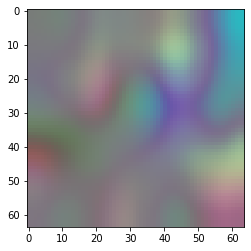

he stayed completely still for the next moment . EOS
-1.44821298122406 0.23498984436871717


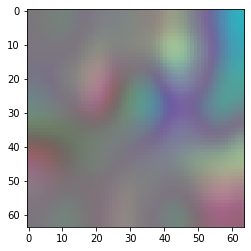

he stayed completely still for the next moment . EOS
-1.030759334564209 0.35673597574141763


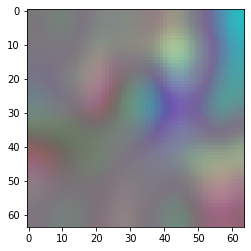

he stayed completely still for the next moment . EOS
-1.0752182006835938 0.3412232920217427


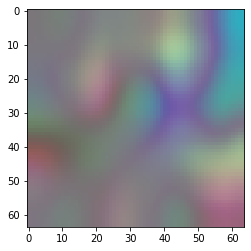

he stayed completely still for the next moment . EOS
-1.423274278640747 0.24092387213731806


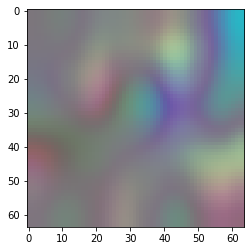

he stayed completely still for the next moment . EOS
-1.1345691680908203 0.3215606300754287


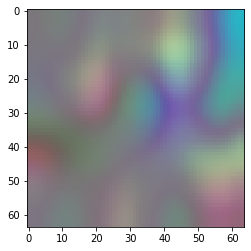

he stayed completely still for the next moment . EOS
-1.228418231010437 0.2927552828659972


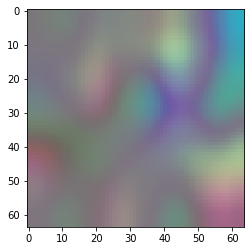

he stayed completely still for the next moment . EOS
-1.2404181957244873 0.28926322399771226


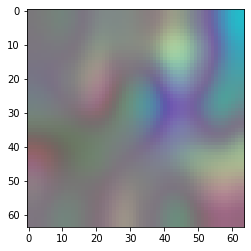

he stayed completely still for the next moment . EOS
-1.238680362701416 0.2897663522305412


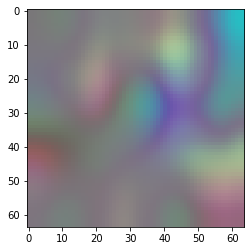

he stayed completely still for the next moment . EOS
-1.2198389768600464 0.29527770964013733


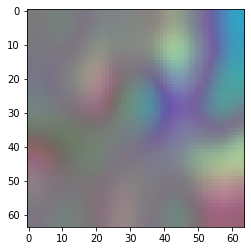

he stayed completely still for the next moment . EOS
-1.2827370166778564 0.27727734820019956


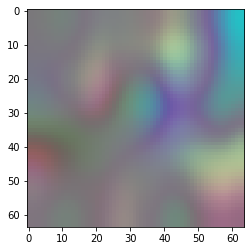

he stayed completely still for the next moment . EOS
-1.0917519330978394 0.33562798057171433


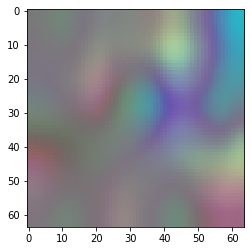

he stayed completely still for the next moment . EOS
-1.6075830459594727 0.2003713175607122


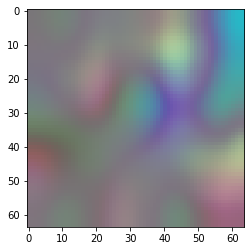

he stayed completely still for the next moment . EOS
-1.23883056640625 0.2897228315194678


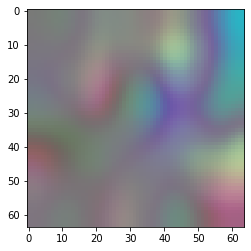

he stayed completely still for the next moment . EOS
-1.1044116020202637 0.33140582340182695


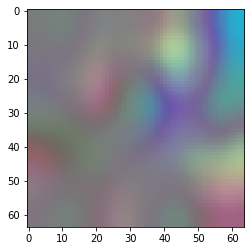

he stayed completely still for the next moment . EOS
-1.655751347541809 0.1909485330835875


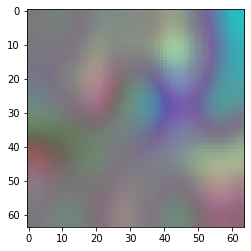

he stayed completely still for the next moment . EOS
-1.0646898746490479 0.3448347801934485


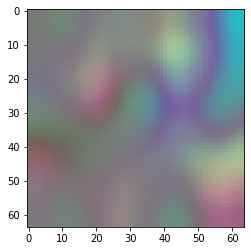

he stayed completely still for the next moment . EOS
-0.9648194313049316 0.3810519995899198


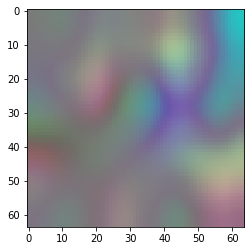

he stayed completely still for the next moment . EOS
-1.147013545036316 0.31758380426529187


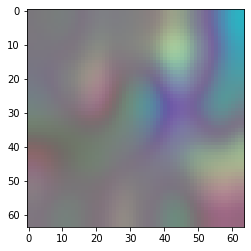

he stayed completely still for the next moment . EOS
-0.9356814026832581 0.39231844758933476


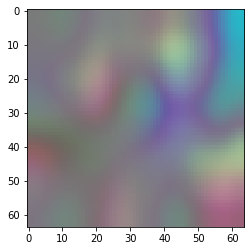




2.0
he stayed completely still for the next moment . EOS
-1.6012382507324219 0.20164667419992907


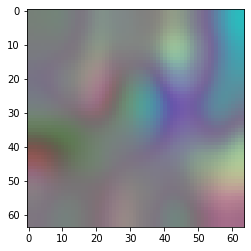

he stayed completely still for the next moment . EOS
-2.256120443344116 0.10475610467642618


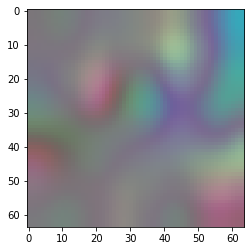

he stayed completely still for the next moment . EOS
-2.63098406791687 0.07200756702515336


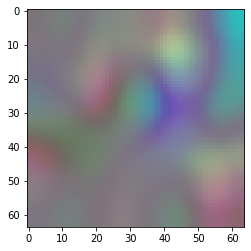

he stayed completely still for the next moment . EOS
-1.2341845035552979 0.2910720338164203


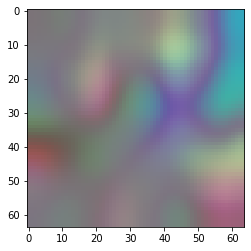

he stayed completely still for the next moment . EOS
-1.9478129148483276 0.14258557761688528


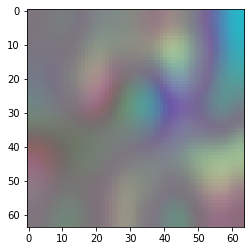

he stayed completely still for the next moment . EOS
-2.6270689964294434 0.07229003437683004


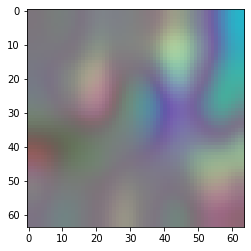

he stayed completely still for the next moment . EOS
-1.8015601634979248 0.16504119600320302


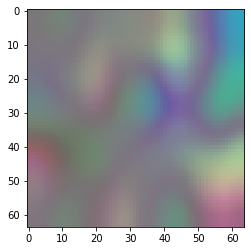

he stayed completely still for the next moment . EOS
-2.51029109954834 0.08124458553611272


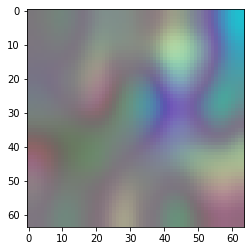

he stayed completely still for the next moment . EOS
-2.694828510284424 0.06755396559128866


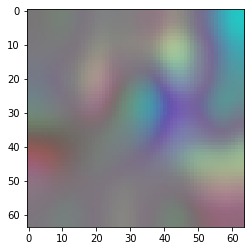

he stayed completely still for the next moment . EOS
-1.8277621269226074 0.1607729549612128


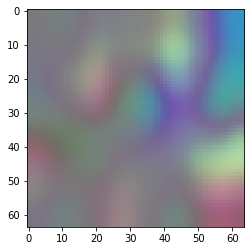

he stayed completely still for the next moment . EOS
-1.8377677202224731 0.1591723470295541


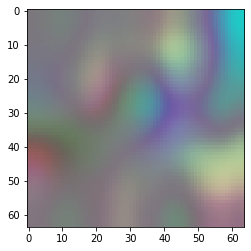

he stayed completely still for the next moment . EOS
-1.682349443435669 0.18593661490363128


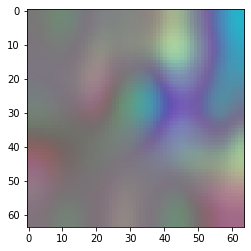

he stayed completely still for the next moment . EOS
-4.169417381286621 0.015461265522923961


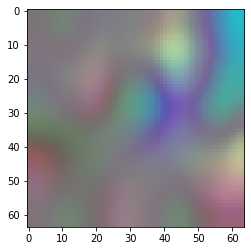

he stayed completely still for the next moment . EOS
-1.8222917318344116 0.161654856520068


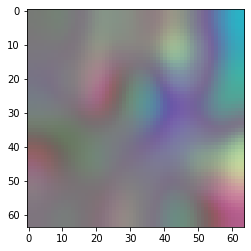

he stayed completely still for the next moment . EOS
-2.0759599208831787 0.12543596108479005


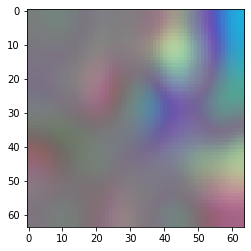

he stayed completely still for the next moment . EOS
-2.8760504722595215 0.05635690703072112


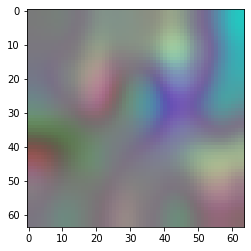

he stayed completely still for the next moment . EOS
-1.7946869134902954 0.16617947275407335


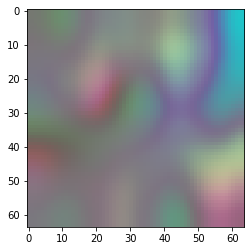

he stayed completely still for the next moment . EOS
-1.4361953735351562 0.2378308972661145


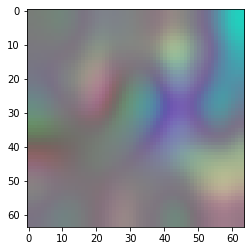

he stayed completely still for the next moment . EOS
-2.5804595947265625 0.07573918669172981


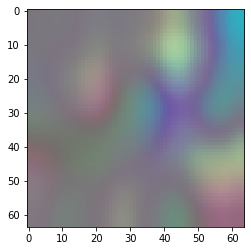

he stayed completely still for the next moment . EOS
-2.5415284633636475 0.0787459474649057


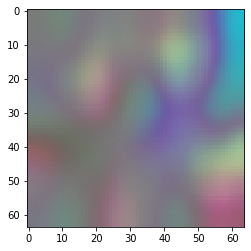




3.0
he stayed completely still for the next moment . EOS
-3.7350821495056152 0.0238712099800986


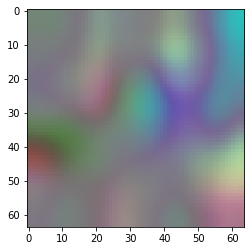

he stayed completely still for the next time before . EOS
-6.339832782745361 0.0017645972832784722


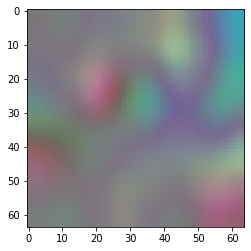

he stayed completely still for the next reason . EOS
-3.0985851287841797 0.04511298632570438


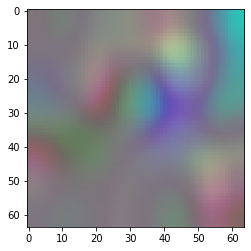

he stayed completely still for the next moment . EOS
-1.6065278053283691 0.20058286911557735


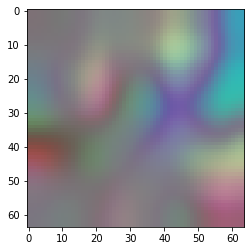

he stayed completely still for the next moment . EOS
-3.2722280025482178 0.037921842920647694


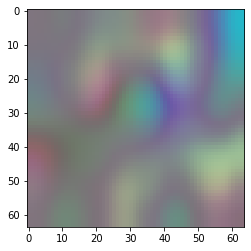

he stayed completely still for the next moment that was . EOS
-4.109663009643555 0.016413304719837353


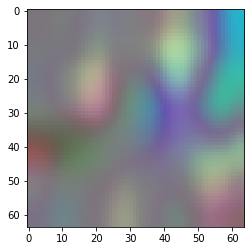

he stayed completely still for the next eye . EOS
-4.881678104400635 0.007584276135651647


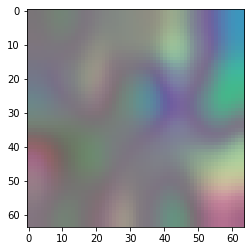

he stayed completely still for the next person . EOS
-2.7991247177124023 0.06086331189661395


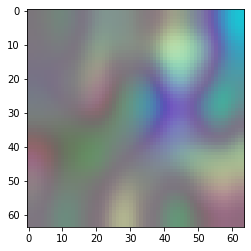

he stayed completely still for over the next moment . EOS
-5.522965431213379 0.0039939864714468


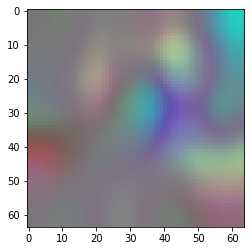

he stayed completely still for the next moment of . EOS
-5.28038215637207 0.00509048505963326


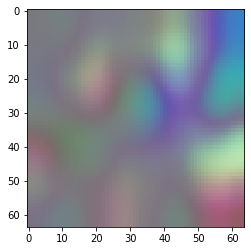

he stayed completely still for the next moment . EOS
-4.118637561798096 0.016266661672687706


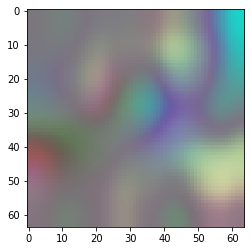

he stayed completely still for the next moment . EOS
-4.3149824142456055 0.013366784549051115


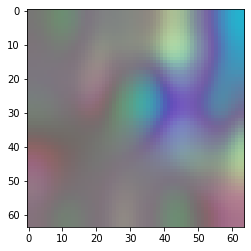

he stayed completely silent for the first presence . EOS
-6.494290351867676 0.0015120478545852449


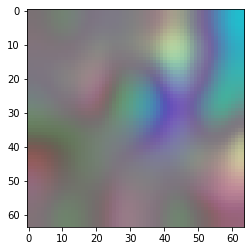

he stayed completely still for the next moment . EOS
-4.250429630279541 0.014258106878470659


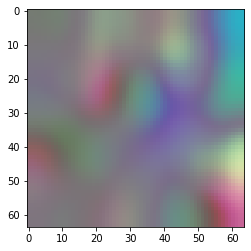

he stayed completely still for the next moment being collected . EOS
-9.619512557983398 6.641998565542527e-05


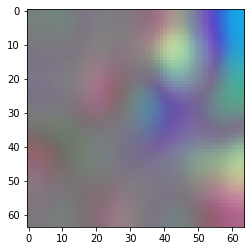

he stayed completely still for the next moment . EOS
-4.690455436706543 0.009182503154776134


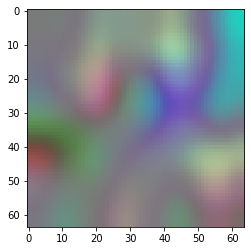

he stayed completely still for the next moment she left . EOS
-7.905735015869141 0.00036862340568546466


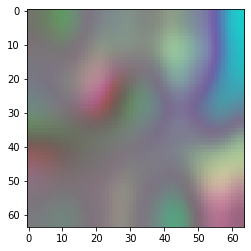

he stayed completely still for over the next moment . EOS
-5.741110324859619 0.0032112008190570652


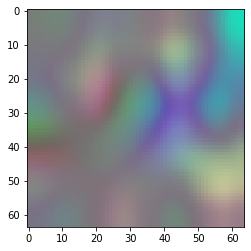

he stayed completely still for the next moment had nothing . EOS
-6.7017927169799805 0.0012287072027966125


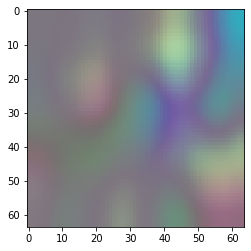

he stayed completely still for the moment that morning . EOS
-4.108548164367676 0.016431613218741307


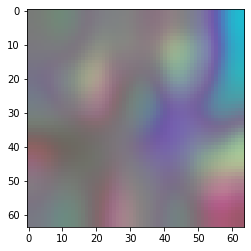




4.0
he stayed completely still for the next person had his eyes . EOS
-8.490739822387695 0.00020536127303339793


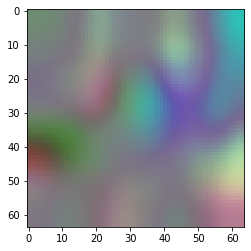

he stayed completely than once at the bright line . EOS
-6.272316932678223 0.0018878494919596202


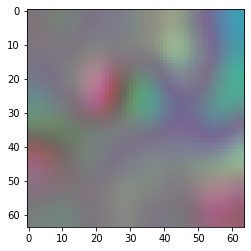

he stayed completely still for the next door . EOS
-4.362912178039551 0.012741228842434234


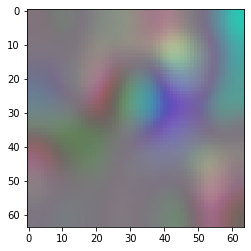

he stayed completely still for the next moment . EOS
-3.028933525085449 0.04836719302822827


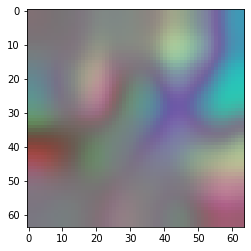

he stayed completely still for the next time to tortured . EOS
-8.23123836517334 0.0002662064652326352


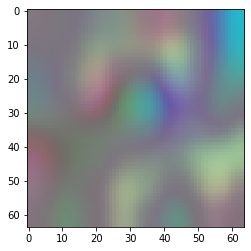

he stayed completely still for the next moment that had his father s . EOS
-8.959663391113281 0.0001284894971625134


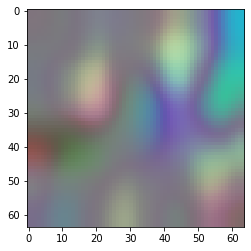

he stayed completely still for the next to eye . EOS
-6.75592041015625 0.001163968013156879


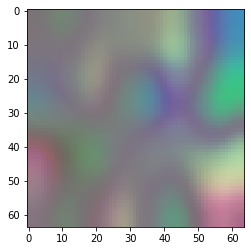

he stayed completely still for the next person . EOS
-5.6237664222717285 0.0036110148571834467


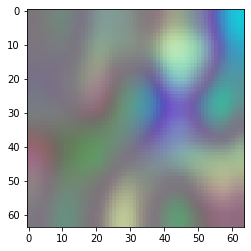

he stayed completely still over for the moment shed been . EOS
-9.158775329589844 0.00010529176683427587


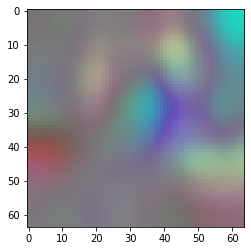

he stayed completely still for the next woman by which . EOS
-9.014957427978516 0.00012157764716589933


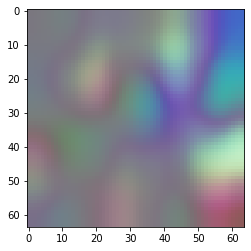

he stayed completely still for over the next person . EOS
-6.8295416831970215 0.0010813536065770396


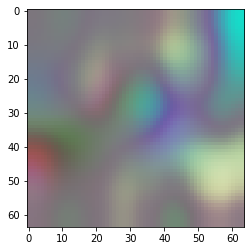

he stayed completely still for the next words harder . EOS
-9.166605949401855 0.0001044704868013515


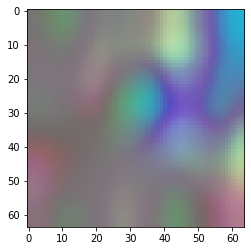

he stayed completely tense the next body with him . EOS
-8.868141174316406 0.00014080407480025067


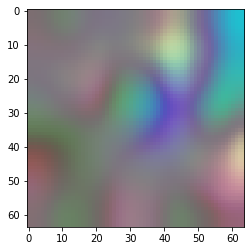

he stayed completely still for the own voice . EOS
-7.011489391326904 0.0009014649539618184


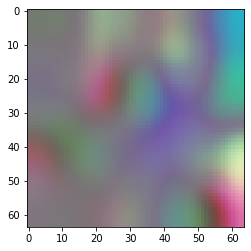

he stayed completely because a woman stuck by my breathing . EOS
-9.57397174835205 6.951473952713767e-05


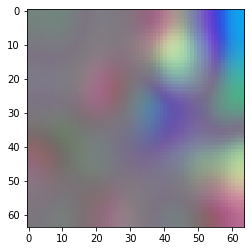

he stayed completely at the only two moment . EOS
-9.12600326538086 0.00010879956024886779


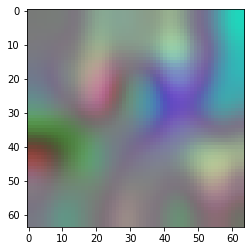

he stayed completely still for what she lay in the next room . EOS
-11.087959289550781 1.52953868278401e-05


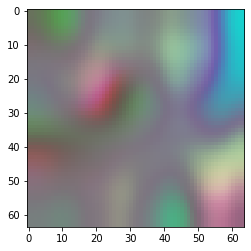

he stayed completely still for some time in the hallway . EOS
-8.030198097229004 0.0003254837251095864


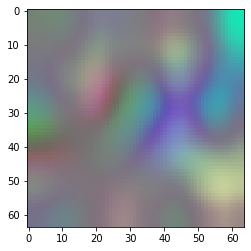

he stayed completely still for the next moment had nt arm . EOS
-11.902191162109375 6.7755422187752344e-06


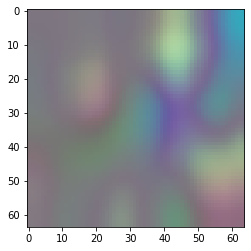

he stayed completely still for the moment that he completely carried . EOS
-6.6178879737854 0.0013362501628082005


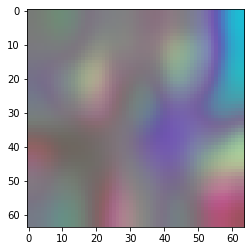




5.0
he stayed completely still for the next person had his eyes again . EOS
-12.667393684387207 3.152251229396238e-06


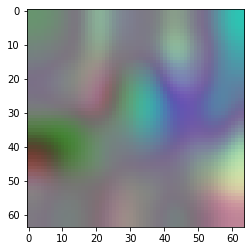

he stayed completely than once at the bright line . EOS
-6.937127113342285 0.0009710553255931844


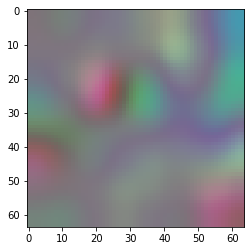

he stayed completely still for the next door . EOS
-8.740989685058594 0.00015989556332676922


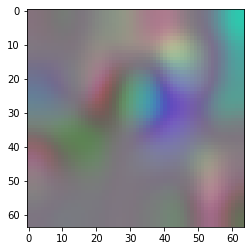

he stayed completely still for the next moment would be . EOS
-6.62673807144165 0.0013244763947203558


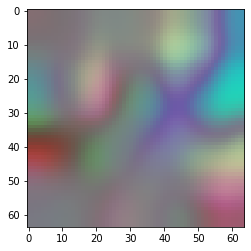

he stayed completely still next for the time to tortured . EOS
-10.388376235961914 3.0788286894089625e-05


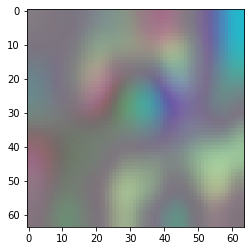

he stayed completely still next but his father had a darkness with this . EOS
-11.988515853881836 6.215180107839002e-06


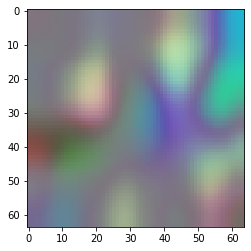

he stayed completely still for next to the head . EOS
-8.088529586791992 0.00030704090236514036


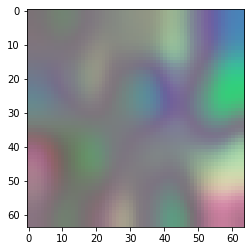

he stayed completely still for the whole person next to . EOS
-8.969768524169922 0.00012719763192543907


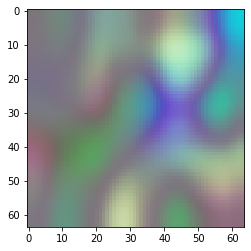

he stayed completely over until something had always the hallway . EOS
-9.47683334350586 7.660613879470037e-05


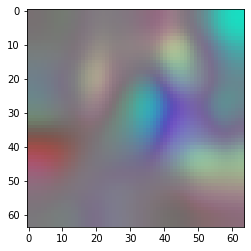

he stayed completely at the moment still next and only melted . EOS
-11.738306999206543 7.982116155956307e-06


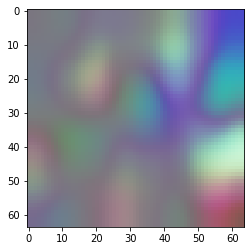

he stayed completely still for over the next few months . EOS
-9.117996215820312 0.00010967422077194861


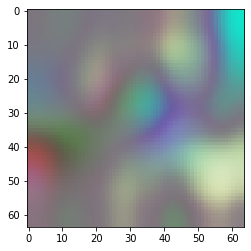

he stayed completely when some part barely her response . EOS
-12.767646789550781 2.8515530292655378e-06


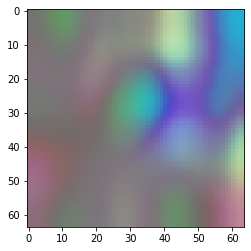

he stayed completely have the next tense simply . EOS
-9.337965965270996 8.801828638261648e-05


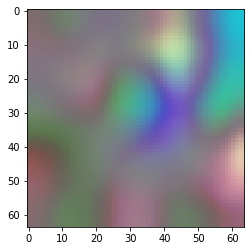

he stayed completely than a voice even for her guard . EOS
-10.519262313842773 2.7011109494108343e-05


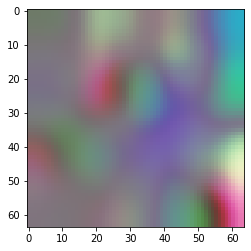

he stayed completely because a woman kept by my brain breathing . EOS
-9.724248886108398 5.981531141163802e-05


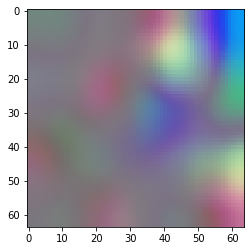

he stayed completely at the next he only two . EOS
-10.6215238571167 2.4385451411630536e-05


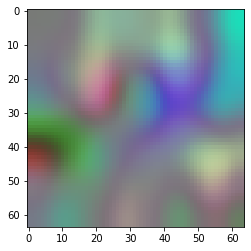

she still stayed completely empty until he no for his voice . EOS
-11.433420181274414 1.0827512804427336e-05


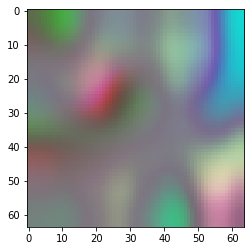

he still stayed completely behind for the next one slept . EOS
-9.079051971435547 0.00011402965960493231


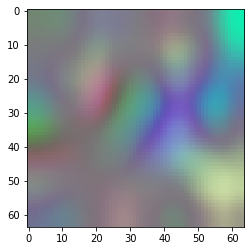

he still had anything waiting for the place completely over the moment . EOS
-11.689748764038086 8.379278340717107e-06


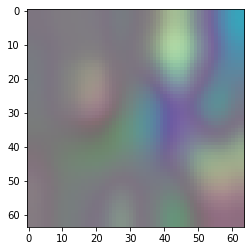

he stayed completely still after his life and the light at that long . EOS
-9.770777702331543 5.7095931140208064e-05


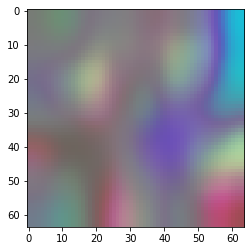




6.0
completely he stayed for his body but two eyes were suddenly . EOS
-15.131216049194336 2.682849837552204e-07


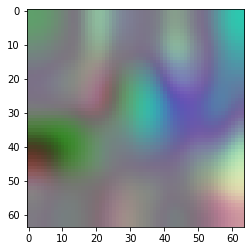

he stayed completely black for once any if barely belonged . EOS
-10.493287086486816 2.772192098371612e-05


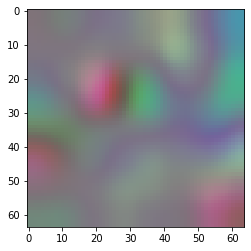

he stayed completely nt ill for the morning myself . EOS
-11.568498611450195 9.4594282875161e-06


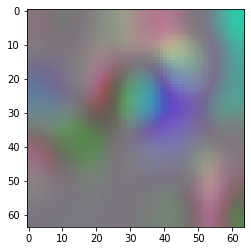

he stayed completely still for the moment would be different . EOS
-8.244279861450195 0.00026275727479611383


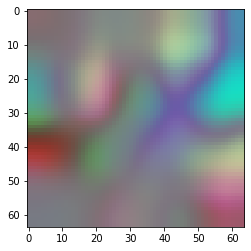

he stayed completely upon mother for the instant to him . EOS
-11.114204406738281 1.4899179602877681e-05


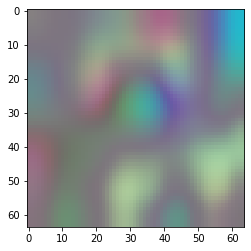

he only stayed near his body and no doubt the house had almost a time . EOS
-15.010035514831543 3.028477857772286e-07


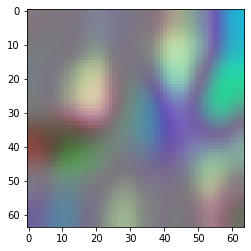

he stayed completely still for next to the head . EOS
-10.661022186279297 2.3441040922633258e-05


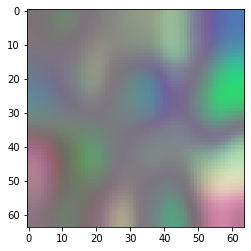

he most stayed completely still for the next person to death . EOS
-11.6026611328125 9.141727986051264e-06


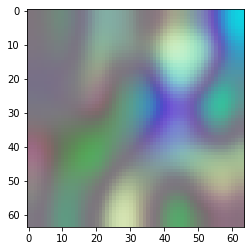

he stayed completely over until something had always the hallway . EOS
-10.08021068572998 4.1900588502462686e-05


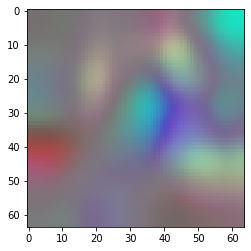

he stayed completely at the moment still had with no other body . EOS
-12.368475914001465 4.250491587790783e-06


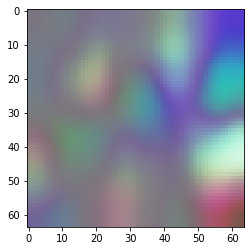

he stayed completely when i slept for most at his head . EOS
-9.306365013122559 9.084416307497101e-05


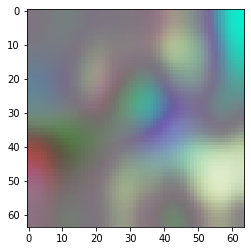

he stayed completely when her body might get an response . EOS
-13.434908866882324 1.4631646977810793e-06


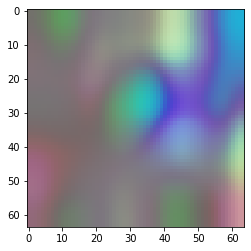

he stayed completely the pace have a little completely determined . EOS
-9.639654159545898 6.509556353434682e-05


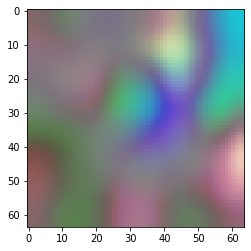

he stayed completely for a voice even her guard . EOS
-11.431117057800293 1.0852478642001158e-05


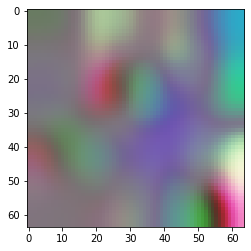

he stayed completely because i kept a face by his new death stuck the pace . EOS
-15.3888578414917 2.073499603468712e-07


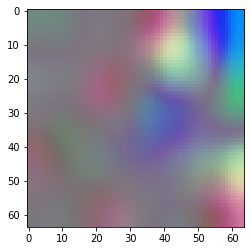

he stayed completely at the next he only two . EOS
-12.135858535766602 5.3636892015629e-06


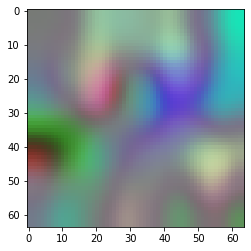

she still remained completely dark until he could get for his voice . EOS
-14.835988998413086 3.604224582325213e-07


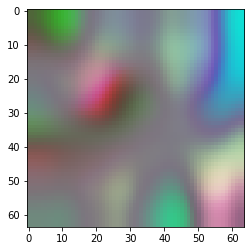

he still stayed completely behind for some time in her blur . EOS
-10.891303062438965 1.861946419256367e-05


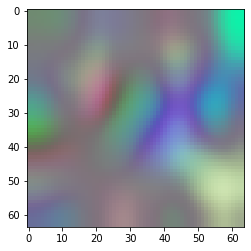

he only had another body still over the house but i stayed behind her . EOS
-12.62767505645752 3.2799740195859975e-06


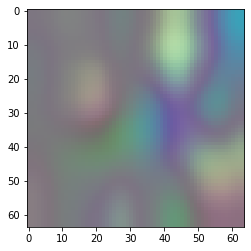

he stayed completely still after his life and the light that she stumbled at long . EOS
-11.032201766967773 1.6172443753121204e-05


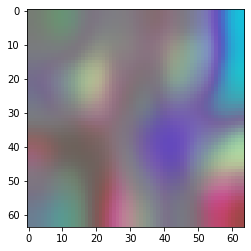




7.0
only he stayed completely and his body looked like a second driver . EOS
-18.104345321655273 1.3720904081655424e-08


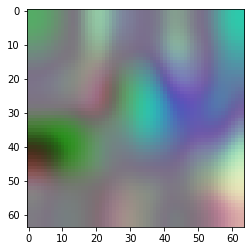

completely he stayed as if at any time a giant tight . EOS
-12.078594207763672 5.679801870671287e-06


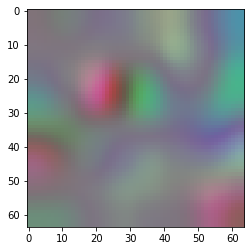

he stayed quiet beside your surely not her . EOS
-9.099668502807617 0.00011170283152829192


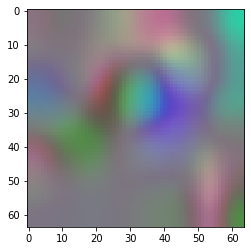

he stayed completely still for the moment would be different . EOS
-10.844202041625977 1.95174417857468e-05


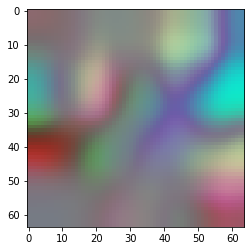

he completely reacted upon she still for the next phone . EOS
-12.971113204956055 2.3265752883998885e-06


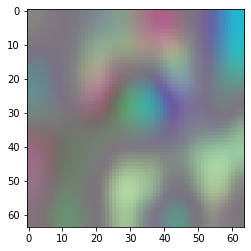

he only stayed near his body and had no death but the next he slept was a barely an
-17.448427200317383 2.6438958856807538e-08


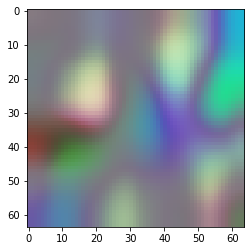

he only barely remained next at lying . EOS
-12.574721336364746 3.4583417860321082e-06


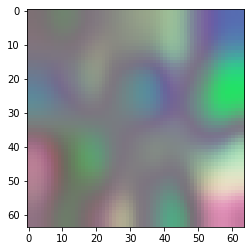

he stayed completely upon someone with the whole body but he seems . EOS
-14.779656410217285 3.8130875469725926e-07


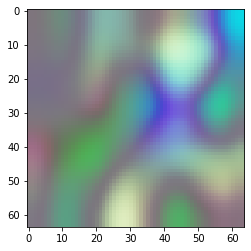

he stayed completely over until something had always slid the hallway . EOS
-12.8518648147583 2.621235425817071e-06


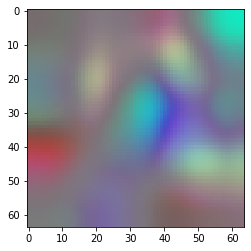

he stayed at the next woman still only completely and melted . EOS
-14.775327682495117 3.8296291409428897e-07


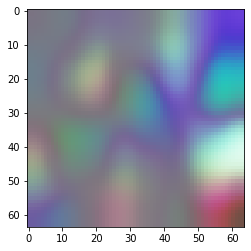

he stayed completely when i slept for most at his head . EOS
-10.273734092712402 3.452820289320614e-05


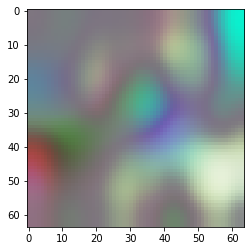

he stayed when shed finally feel her body an response . EOS
-14.90147590637207 3.375757503379802e-07


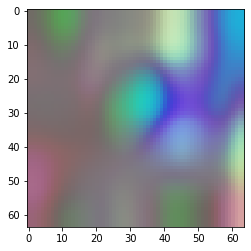

he stayed completely the most struggling have a pulse . EOS
-9.836421966552734 5.346828056349618e-05


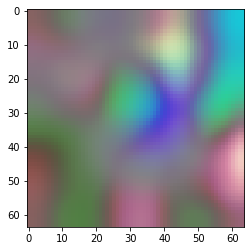

he stayed even for her voice a guard completely final . EOS
-13.697187423706055 1.1256077750415163e-06


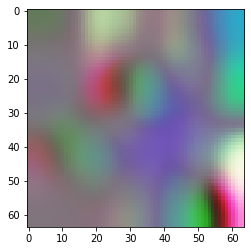

he stayed completely because i kept a death by his face stayed in the bright green . EOS
-15.143824577331543 2.649235409438779e-07


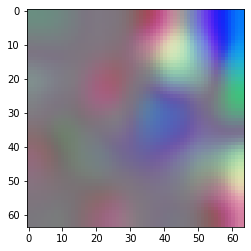

he stayed completely at the next he only his father . EOS
-14.584616661071777 4.634271392949877e-07


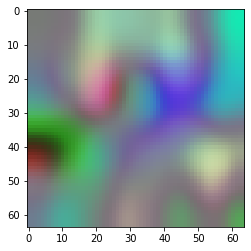

she still remained completely dark until he what he could leave no chair . EOS
-18.201845169067383 1.244626611988154e-08


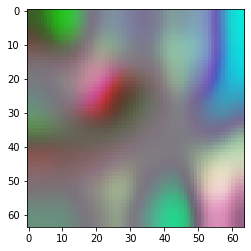

he still stayed completely over again and continued in the front with a vision . EOS
-12.498147010803223 3.7335650219605567e-06


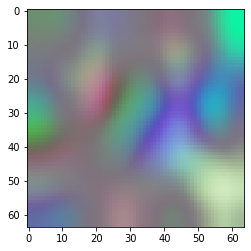

he only had another body over the house but still there me passed her . EOS
-14.445401191711426 5.326500517617463e-07


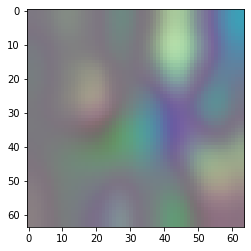

he stayed completely still after his life and that he stumbled at the small light . EOS
-10.631006240844727 2.415531206319459e-05


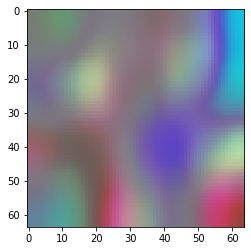




8.0
body stayed completely but he were his eyes two suddenly for his front . EOS
-15.808963775634766 1.3622420047636357e-07


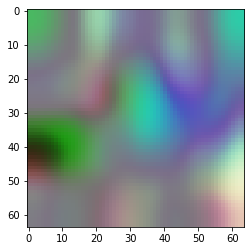

once he stayed completely at any wide , be spreading . EOS
-14.749626159667969 3.9293322137996765e-07


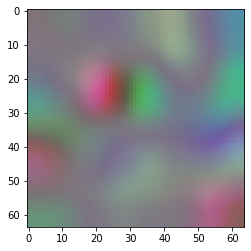

he stayed quiet beside your surely not her . EOS
-11.03882884979248 1.606562197821786e-05


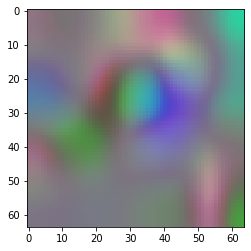

he stayed still has for the only different situation . EOS
-13.334001541137695 1.6185149265918814e-06


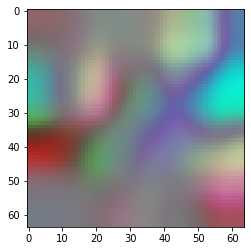

he completely reacted at once next to the body pen . EOS
-12.98409366607666 2.29657042808402e-06


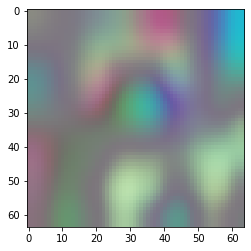

he only stayed near his body and had no doubt that the house was almost a moment upon the
-16.743019104003906 5.3530240271936355e-08


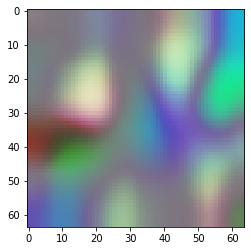

he only barely lay next to starting . EOS
-12.40697193145752 4.089974054971153e-06


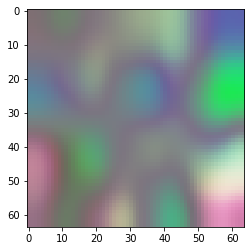

he stayed completely upon someone with the whole body and he seems their . EOS
-17.98971176147461 1.5387478210718852e-08


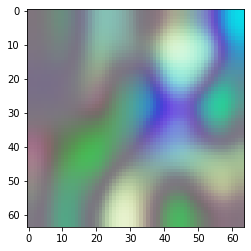

he stayed over noise until finally had been his phone passed . EOS
-11.958694458007812 6.403316760529872e-06


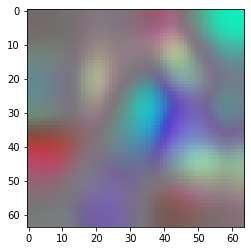

he stayed at the next woman still had completely but only melted by two . EOS
-20.13138198852539 1.8073900592104027e-09


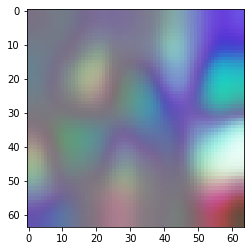

he stayed completely when i slept for must after his body . EOS
-12.853960037231445 2.6157491039849546e-06


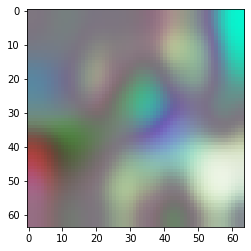

he stayed when shed finally feel her body an response . EOS
-18.049022674560547 1.4501370502674478e-08


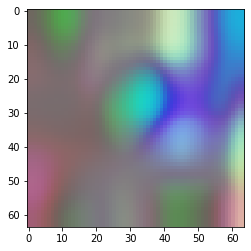

he stayed completely the most completely have a steady response . EOS
-9.681337356567383 6.243794611678943e-05


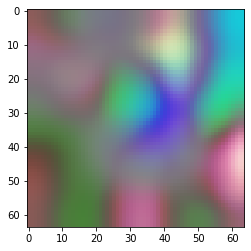

he stayed even for her voice a guard completely final . EOS
-14.257109642028809 6.430073756895312e-07


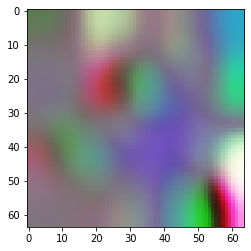

he stayed completely because i kept a death by his face stuck into the new house . EOS
-15.043148040771484 2.929839402773964e-07


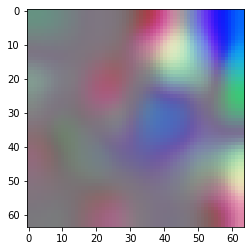

he completely appeared the only at his next two . EOS
-15.994677543640137 1.131357350860746e-07


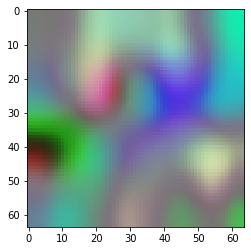

she still remained completely dark until what he could but he pushed no woman . EOS
-22.837284088134766 1.2075177929588705e-10


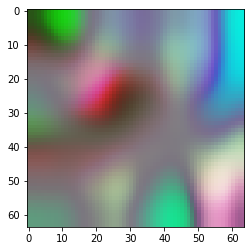

he still stayed completely behind just as the next one slept anxious front continued . EOS
-19.18893051147461 4.638241584120784e-09


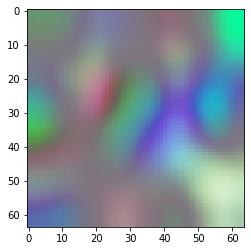

he had nt only another body behind the house but i started myself easier . EOS
-13.184894561767578 1.878767536544104e-06


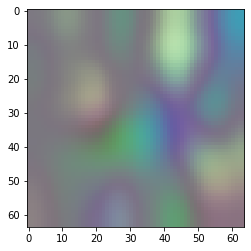

he stayed completely still after his life and that he stumbled at the light , the last distance .
-13.584136009216309 1.2603312065318024e-06


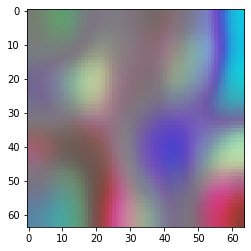




9.0
completely he looked completely but his eyes were two body for his cell phone . EOS
-20.332866668701172 1.4775704753976268e-09


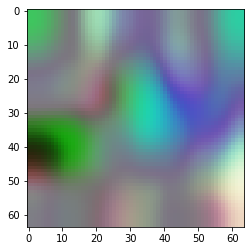

once he stayed wide at any becoming burned , in a woman . EOS
-15.517559051513672 1.8230968107033092e-07


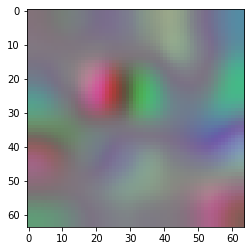

i obviously stay beside her no he nowhere . EOS
-11.119505882263184 1.4820400972871582e-05


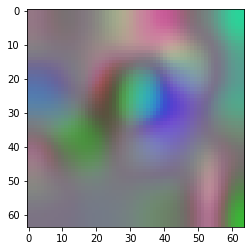

he stayed still has been for the only different at the easier . EOS
-15.552698135375977 1.7601473296629594e-07


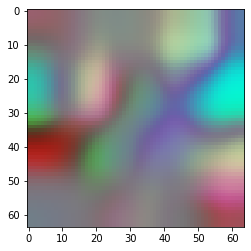

he completely reacted at once upon her face was home . EOS
-13.19444465637207 1.8609105325882575e-06


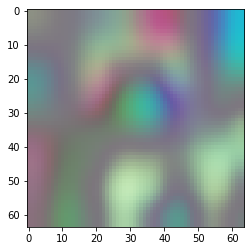

he only stayed near his body and had no doubt that the house was almost a moment upon his
-15.811306953430176 1.3590537663096216e-07


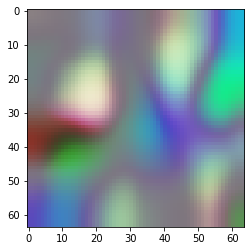

he only barely remained next to get green . EOS
-12.274996757507324 4.666987555411021e-06


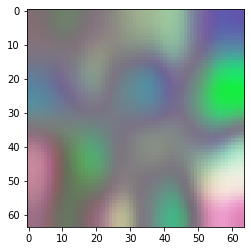

he stayed completely upon someone with the whole person and he seems the body . EOS
-20.204025268554688 1.6807507496562064e-09


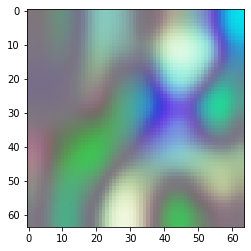

he stayed over shed been behind his message , but barely listened . EOS
-12.297469139099121 4.563278885027657e-06


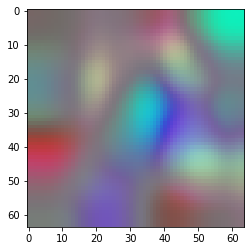

she stayed at the body with no face which had only barely few years more . EOS
-26.61062240600586 2.774300684690372e-12


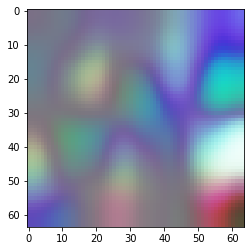

he stayed completely when i must function for after his thoughts . EOS
-12.586427688598633 3.418093260282006e-06


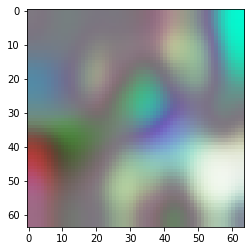

he stayed when shed finally feel her body toward her self . EOS
-22.347782135009766 1.9700694480202542e-10


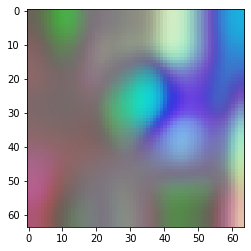

he stayed completely the most completely have a steady response . EOS
-11.599138259887695 9.173989926050796e-06


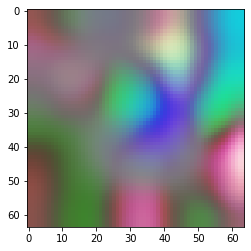

he stayed even for a voice showed her voice easily . EOS
-16.069730758666992 1.0495535594640215e-07


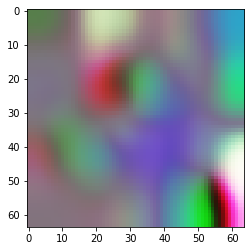

he stayed completely because i kept a death by his face stuck into the new house . EOS
-16.846481323242188 4.8268757740801495e-08


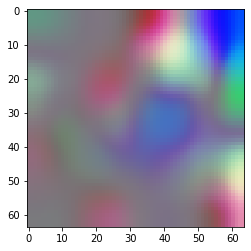

he completely appeared the only at his side . EOS
-14.8644380569458 3.503132590348727e-07


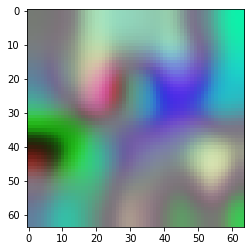

she nothing fully left because he ca nt body for just short and face . EOS
-27.760757446289062 8.783269885522833e-13


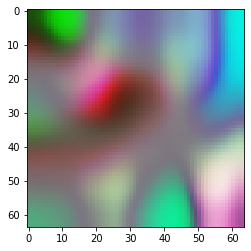

he still stayed behind just no one slept with her completely anxious in the time . EOS
-19.676639556884766 2.8480264481087424e-09


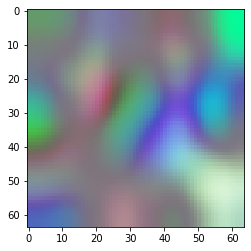

he had nt only another body behind the house but i started its presence to him . EOS
-13.497013092041016 1.3750601366715186e-06


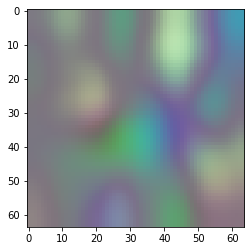

he stayed completely still after his life and that he stumbled at the light , what the last distance
-14.741874694824219 3.9599086472898567e-07


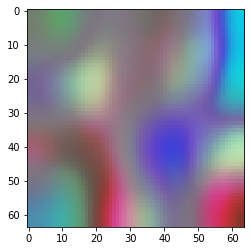




10.0
completely he had body but his eyes suddenly only looking for her two remained his cell . EOS
-25.318559646606445 1.0099253086915523e-11


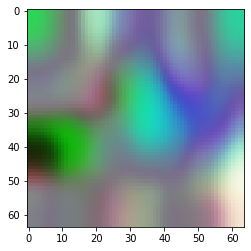

barely once he lay advanced for any place , or been a different woman . EOS
-15.940242767333984 1.1946495557932928e-07


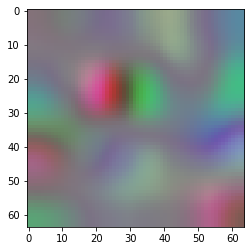

i obviously stay nt beside her safe . EOS
-11.140228271484375 1.4516447058009672e-05


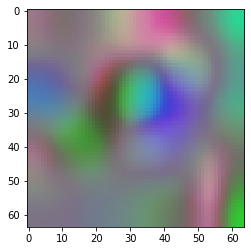

he still would have stayed different for the easier at the moment he seemed . EOS
-17.419565200805664 2.72131588111727e-08


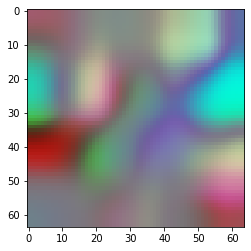

he completely reacted at once upon max to the body . EOS
-13.344574928283691 1.6014918958115365e-06


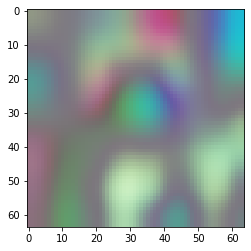

he only stayed near his body and had no doubt that the house was almost a moment upon his
-16.62077522277832 6.049075927822546e-08


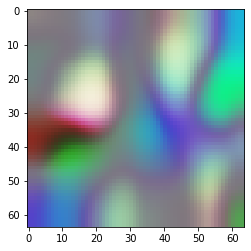

he only barely remained next to get green . EOS
-13.121033668518066 2.002661186682205e-06


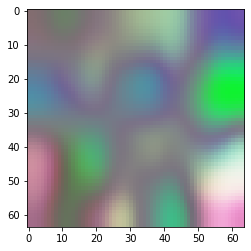

he stayed completely whole person with the fight and she still has nt the next person . EOS
-25.426239013671875 9.068275395817901e-12


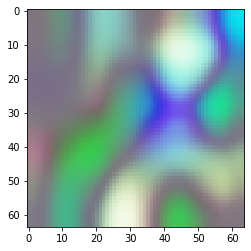

he d stayed over being behind , but his message barely stumbled over her . EOS
-16.836715698242188 4.874244147246594e-08


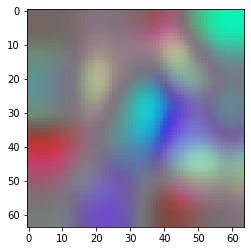

she stayed at the body with no face which had only barely few years of falling . EOS
-29.178415298461914 2.1280177454261572e-13


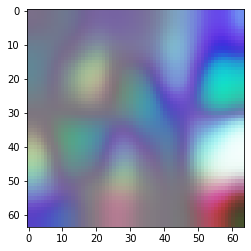

he stayed completely when i must function for after his thoughts . EOS
-13.513223648071289 1.3529493455812028e-06


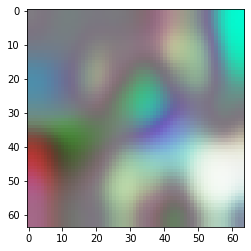

body when he might get her scared her very response two weeks . EOS
-23.90296173095703 4.159830349109285e-11


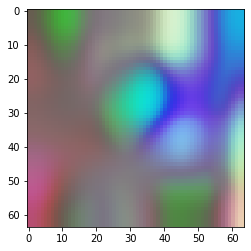

he have fully the completely struggling her body completely a noise . EOS
-14.403146743774414 5.556391613414031e-07


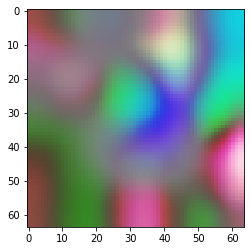

he stayed even for a voice showed her voice easily . EOS
-16.322425842285156 8.151931570335004e-08


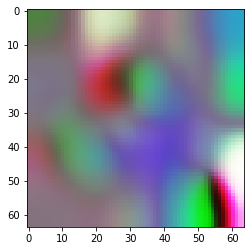

he stayed there maybe i worked his body , having a burning in the near her voice from his
-18.90247917175293 6.176715546309039e-09


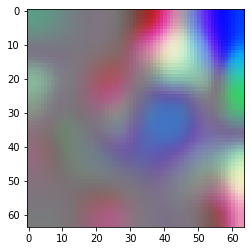

he completely appeared the only at his woman two . EOS
-15.416849136352539 2.0162644447661536e-07


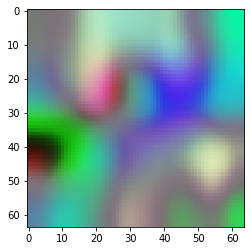

she nothing fully left because he ca nt body for and he just short face . EOS
-31.881776809692383 1.425345858832246e-14


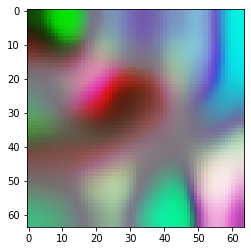

he still slept completely behind continued in front and continued for her back a blur . EOS
-19.267709732055664 4.286866750428417e-09


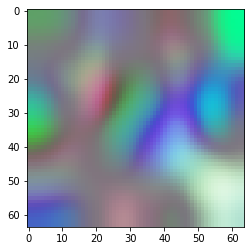

he had nt only hit the body there but something passed her behind the truth . EOS
-17.988630294799805 1.540412825722546e-08


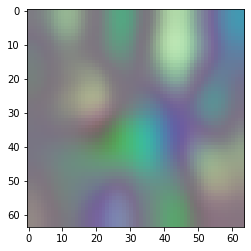

he stayed completely still after that and the wind he stumbled at his light , so what his last
-15.527896881103516 1.804347029552915e-07


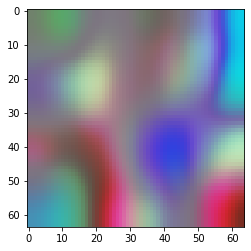




11.0
body completely looked his eyes but were truly two have for his car his throat . EOS
-25.403705596923828 9.274934245224661e-12


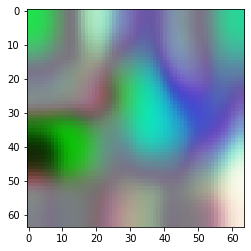

barely once he lay advanced for place , or been a different woman . EOS
-13.44371509552002 1.4503363027108716e-06


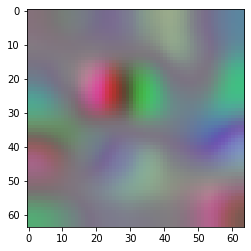

i stayed nt late beside her family . EOS
-11.351226806640625 1.175505959014419e-05


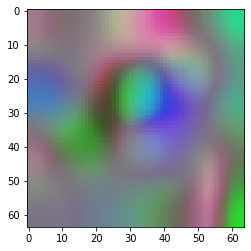

he still would have stayed different for the easier seemed at the he remained . EOS
-18.50345230102539 9.205614189466703e-09


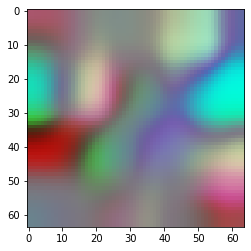

she completely i reacted upon he was still for his mother to cry . EOS
-18.270118713378906 1.1624874126275213e-08


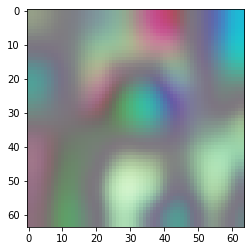

he only stayed upon his side and had no doubt that the house was a woman but he had
-17.994609832763672 1.531229352577078e-08


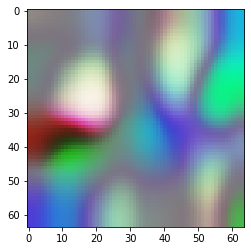

she only barely remained next to flip . EOS
-13.469805717468262 1.4129854981638058e-06


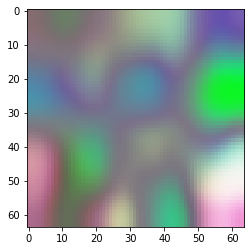

she most body he definitely has stayed with the whole person toward his body toward the relationship . EOS
-30.946134567260742 3.632992666494754e-14


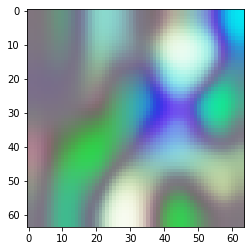

he d stayed over when something stayed in her , barely stopped his message . EOS
-19.209543228149414 4.543613446449095e-09


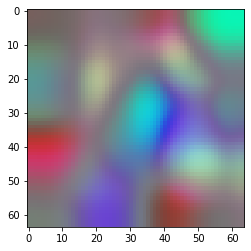

she stayed at the body with no face that had only few minutes or barely melted . EOS
-33.26872634887695 3.5610307733623114e-15


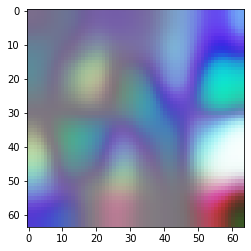

he stayed completely when i must function for after every few thoughts . EOS
-14.663797378540039 4.2814779800202784e-07


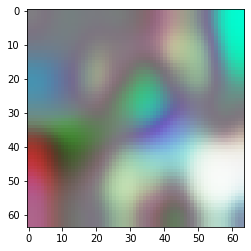

body when he might get her response very scared her two weeks . EOS
-26.049846649169922 4.8606611451590356e-12


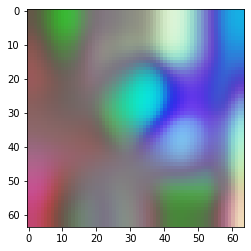

he have the completely struggling her body fully a growing pace . EOS
-14.144551277160645 7.196137140583549e-07


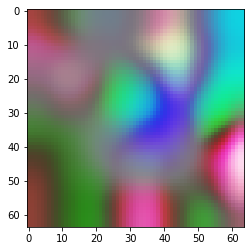

he did so simply after my voice a voice becoming her voice . EOS
-22.611927032470703 1.5127419990099543e-10


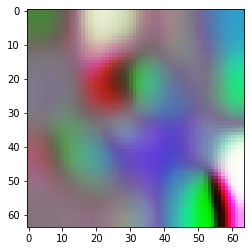

he stayed there maybe i worked his body , having a burning in the near her voice from his
-18.466110229492188 9.55586982896535e-09


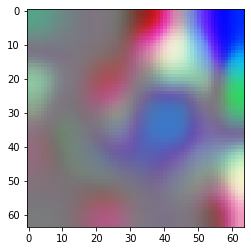

he completely appeared the only at his woman two . EOS
-15.91796875 1.221557765175736e-07


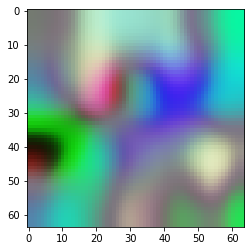

dark body what he wanted but coming in short of what grew in his near no quiet body .
-36.57573699951172 1.304245207506505e-16


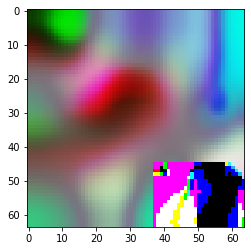

he still slept completely behind continued in front and continued with her back for a blur . EOS
-21.750865936279297 3.578647707298554e-10


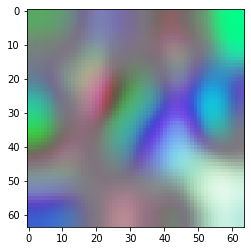

he had nt only an arm the area now but she started feeling her panic . EOS
-16.12740707397461 9.907317940415493e-08


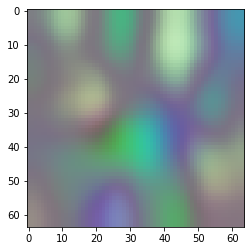

after he completely lying that he and beyond his car , they were still leaving the first room that
-16.217975616455078 9.049460362647852e-08


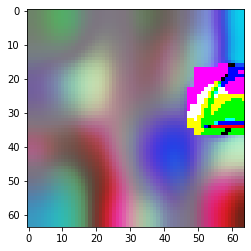




12.0
body completely looked his eyes but two were completely for his cell or his body obviously have . EOS
-30.82255744934082 4.110866578262716e-14


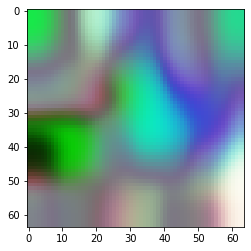

barely once he lay advanced for different place , or been in a line . EOS
-15.9572172164917 1.1745421762885855e-07


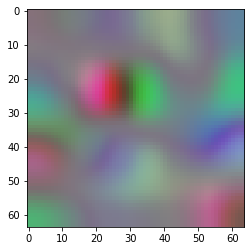

i obviously nt nowhere beside her safe . EOS
-11.822867393493652 7.3348954980875165e-06


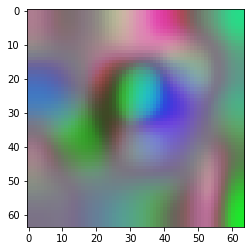

he still would have been easier for the different but remained of his even . EOS
-19.458690643310547 3.5415879274147447e-09


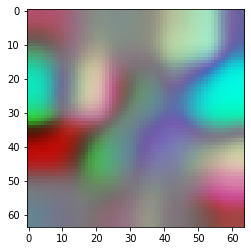

he completely struck upon she back to head for her cry . EOS
-16.678239822387695 5.71126717757727e-08


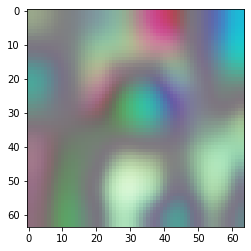

he only had no doubt that his body stayed and the next death was upon his side but he
-19.54126739501953 3.260884383684928e-09


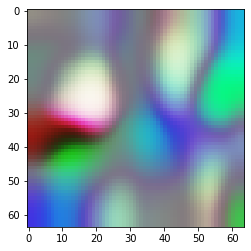

she only barely stays next to set . EOS
-15.625734329223633 1.6361751980748083e-07


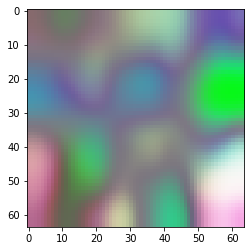

she most body he definitely stayed with his body and the whole person has toward the relationship . EOS
-34.377113342285156 1.1754641050422291e-15


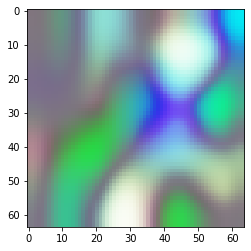

he d stayed over when something stayed in her , barely stopped for his message . EOS
-21.317081451416016 5.522162156001839e-10


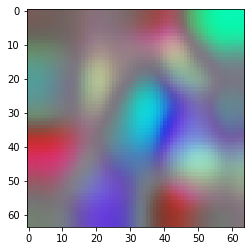

she had at the body with no woman that only few minutes have barely stayed by but of two
-42.07482147216797 5.335034197273851e-19


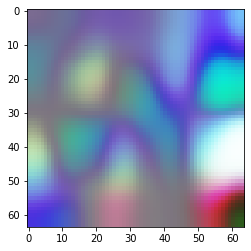

he stayed completely when i must function for after every few thoughts . EOS
-16.37482261657715 7.73579398706175e-08


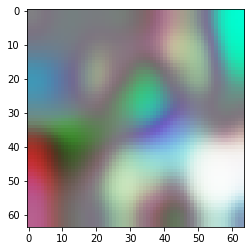

harder when he never get her two presence her body gets response . EOS
-28.178573608398438 5.783636288457934e-13


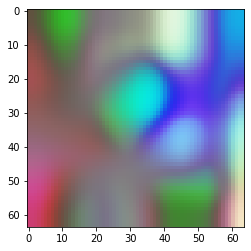

he have the completely struggling her body fully a completely overwhelming . EOS
-15.336090087890625 2.1858517358911672e-07


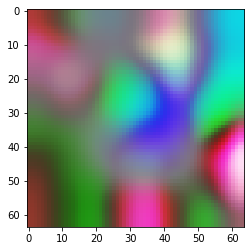

he did so simply after my voice a voice at her throat becoming a voice . EOS
-25.6761531829834 7.06298617432074e-12


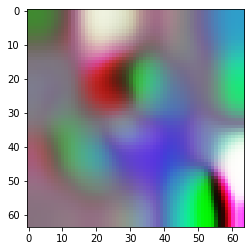

he stayed there maybe i worked his body , having a burning in the near her voice from his
-19.87612533569336 2.332966190907677e-09


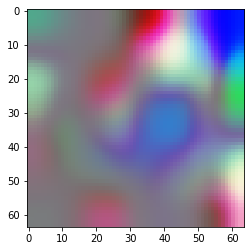

he sensed the line with his body at her . EOS
-17.963863372802734 1.5790404795672655e-08


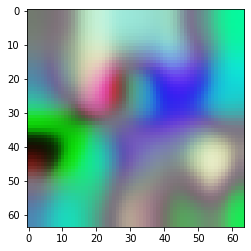

last year in every friend who has said , so they will come live outside and live what s
-38.13437271118164 2.744431280527101e-17


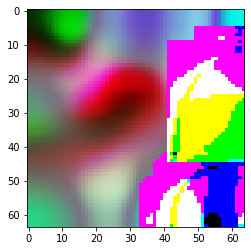

still she slept with no thoughts continued in his vision and stayed behind his back in the front completely
-25.109085083007812 1.2452682143494645e-11


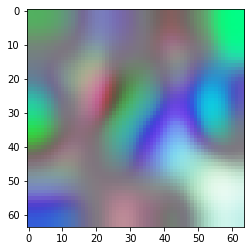

he had nt only an arm the area now but she felt its panic past me . EOS
-18.06024169921875 1.4339588484560468e-08


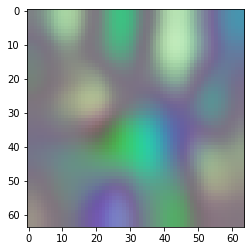

after he left that morning they were first night , and they have his car to a living room
-17.757200241088867 1.941538117210573e-08


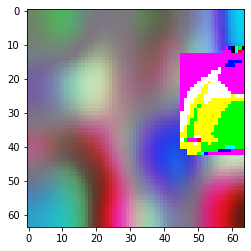




13.0
his body completely looked completely but suddenly were two for his eyes for my eyes or his cell person
-33.85435485839844 1.982624627803154e-15


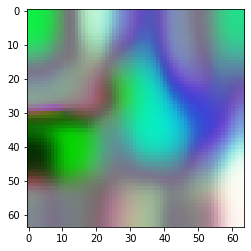

barely once he lay advanced for place , or been a different line . EOS
-18.56529998779297 8.653517183882306e-09


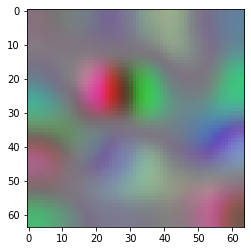

i obviously nt safe beside her bed . EOS
-13.119935989379883 2.00486067303197e-06


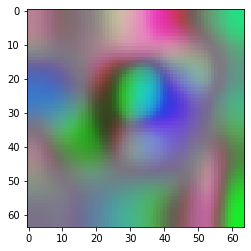

he would still have been easier for the different but even with his remained . EOS
-19.87839126586914 2.3276858371324055e-09


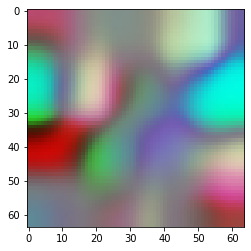

she completely i struck upon his head to cry for him back . EOS
-17.821510314941406 1.8206078503019505e-08


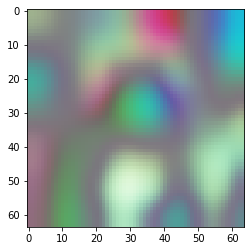

he only had no doubt that his death stayed and the next darkness was upon his side but he
-17.898109436035156 1.686358225948008e-08


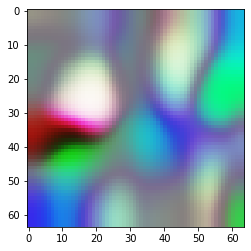

she only barely next to staring at boots . EOS
-14.532146453857422 4.883924986499388e-07


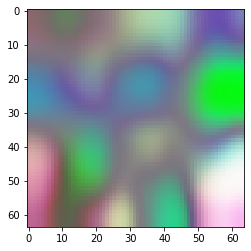

she most body he definitely stayed with his body and the whole person upon the relationship to know two
-38.763771057128906 1.4625412776647692e-17


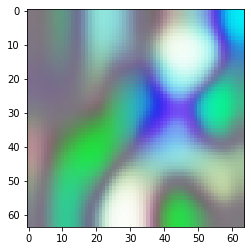

he d stayed over until something had always happened , in her behind his phone to be over the
-27.976146697998047 7.081314192745373e-13


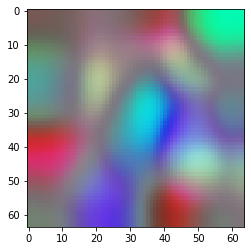

she had at the body of some far with no woman i still only grown eyes but only ever
-40.243160247802734 3.3313293418526667e-18


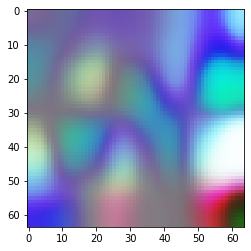

he rode after things i must grown for unexpected thoughts . EOS
-17.57453155517578 2.3306546383402005e-08


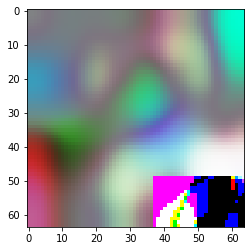

harder when he never get her body gets some presence two response to her response . EOS
-35.05534744262695 5.965626296603693e-16


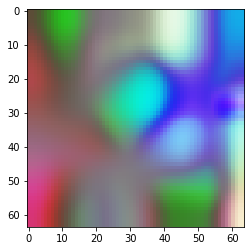

she have the completely struggling my body fully i his growing his have his unexpected pace . EOS
-24.63479995727539 2.0009780092459273e-11


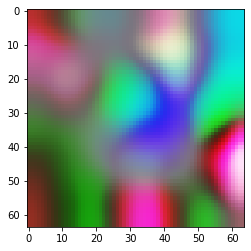

he did so simply after my voice a voice like her voice a voice . EOS
-25.678071975708008 7.049446761652777e-12


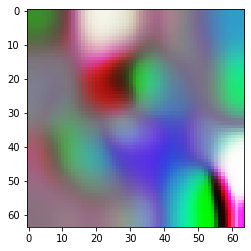

he stayed there maybe i stuck his body , even having a burning in the voice leaving her into
-21.332672119140625 5.436735619450311e-10


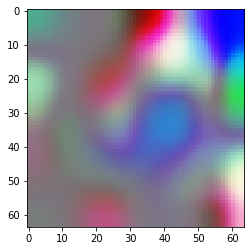

he sensed the line with his body at her . EOS
-17.351491928100586 2.913015549269866e-08


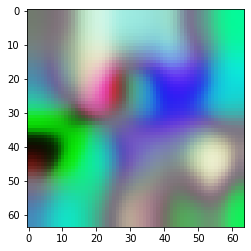

last year who will live in every matter where they know what has come in prison and leave in
-36.03404998779297 2.2418726030050143e-16


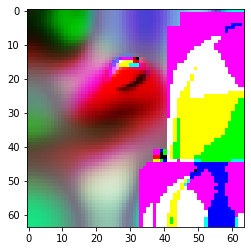

still she slept with no thoughts in shock and continued his back in my vision behind his thirty listened
-30.361061096191406 6.521668223590643e-14


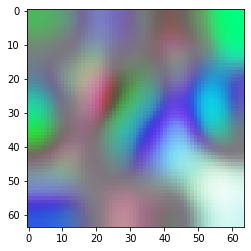

she had nt only an arm the place but i felt her presence upon me again . EOS
-17.933000564575195 1.6285339279410767e-08


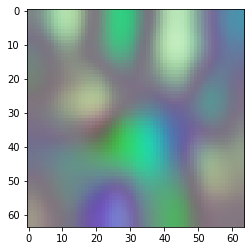

after that night they are leaving his car and he have to church , they have a living room
-21.199371337890625 6.211979418208282e-10


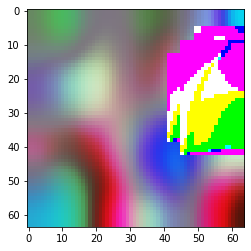




14.0
only his body and body suddenly were completely looking for his person but his mouth had his shadow my
-37.28396224975586 6.423636119604276e-17


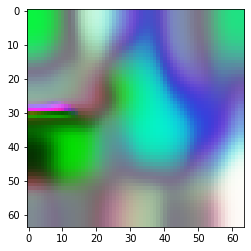

barely once he lay advanced around , for a different place or be welcomed . EOS
-20.144067764282227 1.7846067318456077e-09


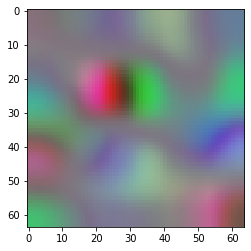

i obviously nt safe a bed beside my wishing . EOS
-16.71088218688965 5.527847819556869e-08


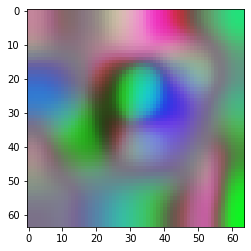

KeyboardInterrupt: 

In [145]:
for k in np.linspace(1, 20, 20):
    with torch.no_grad():
        z = x1_he + k*unit_rand_x
        print(k)
        for zi in z:
            bd_z, img_z = model.beam_search_from_vector(zi.unsqueeze(0), max_len=20)
            print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
            prob = bd_z[0][1].item()
            print(prob, np.exp(prob))
            plt.imshow(tensor2image(img_z[0]))
            plt.show()
        print("\n\n")

1.0
he stayed completely still for the next question . EOS
-4.507693290710449 0.011023859709472915


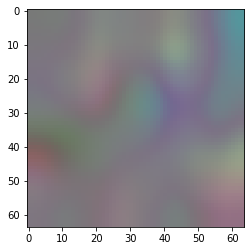

he stayed completely still for the next moment down . EOS
-6.934815406799316 0.0009733027171970446


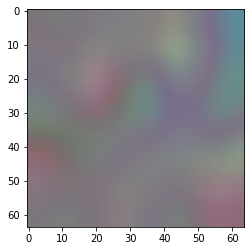

he stayed completely still for the next thing down . EOS
-3.1148107051849365 0.04438690856393914


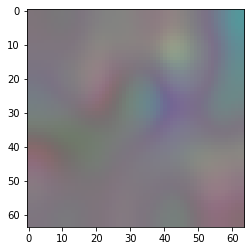

he stayed completely still for the next thought . EOS
-2.6049013137817383 0.0739104307785657


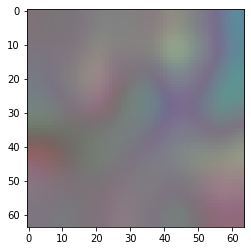

he stayed completely still for the next moment s kiss . EOS
-5.5010881423950195 0.004082326867804551


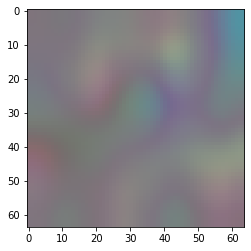

he stayed completely still for the next moment which was . EOS
-5.026127815246582 0.006564179137336976


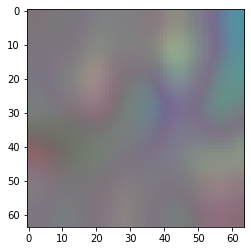

he stayed completely still for the next question . EOS
-3.046393871307373 0.04753001506933403


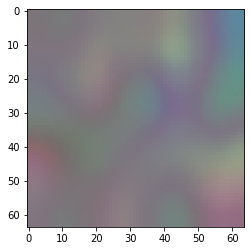

he stayed completely still for the next thing . EOS
-2.472464084625244 0.0843766913276807


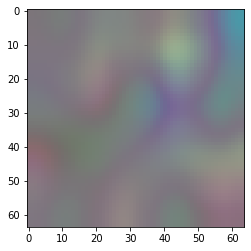

he stayed completely still for the moment s reading . EOS
-5.116750240325928 0.005995475123636075


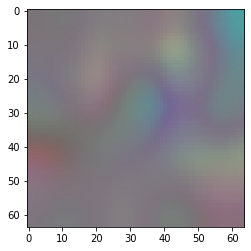

he stayed completely still for the next question . EOS
-3.98211932182312 0.018646080388384355


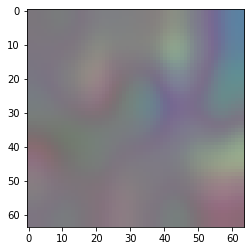

he stayed completely still for the next moment . EOS
-2.324568271636963 0.09782566905179178


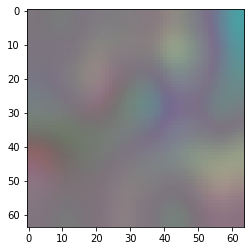

he stayed completely still for the next thought . EOS
-3.8003556728363037 0.022362816595108206


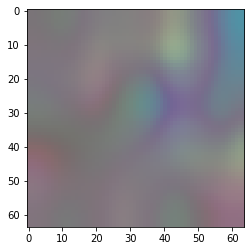

he stayed completely still for the next moment . EOS
-5.456972122192383 0.004266454509945955


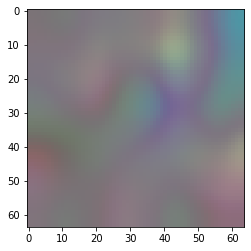

he stayed completely still for the next question . EOS
-3.2410082817077637 0.03912442676089939


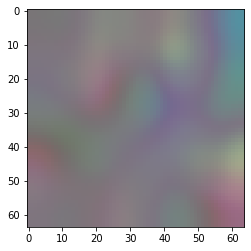

he stayed completely still for the other moment s note . EOS
-6.806832790374756 0.0011061908960434768


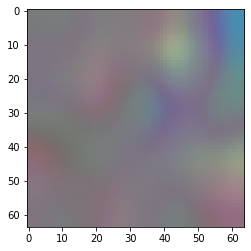

he stayed completely still for the next moment . EOS
-3.7529170513153076 0.02344924334577062


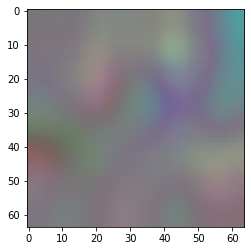

he stayed completely still for the next thing out . EOS
-6.5511040687561035 0.0014285375236699192


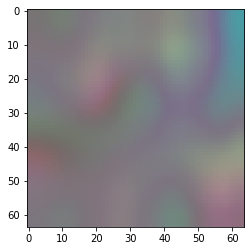

he stayed completely still for the next moment on me . EOS
-2.6388654708862305 0.0714422769382208


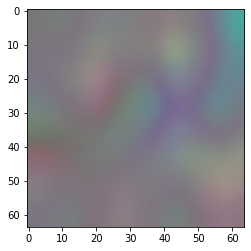

he stayed completely still for the next question s scent . EOS
-5.723602294921875 0.0032679176705173335


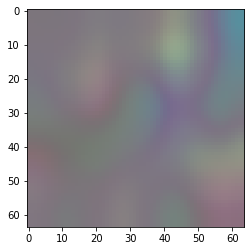

he stayed completely still for the second s study . EOS
-5.103821277618408 0.006073493660517658


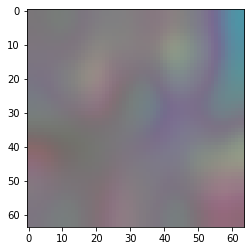




2.0
completely he stayed still for the next moment or mine . EOS
-9.282143592834473 9.307140228994229e-05


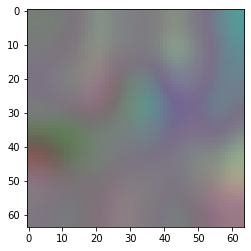

completely he stayed at once any other as a den . EOS
-10.528708457946777 2.675715997162609e-05


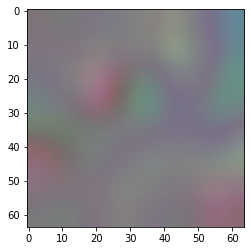

he stayed completely still over the thank myself . EOS
-6.496714115142822 0.0015083874462985872


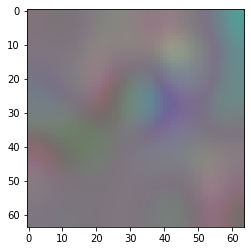

he stayed completely still for the moment s freedom . EOS
-4.739406108856201 0.008743837531446249


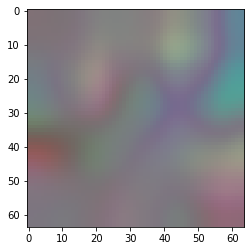

he stayed completely at once the second s murder . EOS
-6.472954750061035 0.0015446549142371126


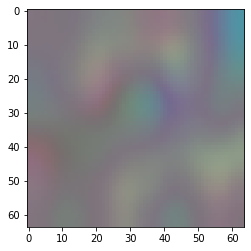

he stayed completely still for the next thing that was touched . EOS
-7.088864326477051 0.00083434437057136


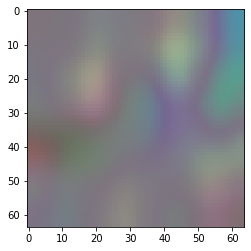

he stayed completely still for the next glass . EOS
-6.1947150230407715 0.0020401845224386154


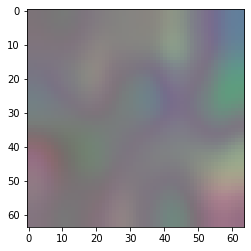

he stayed completely still next for the girl s opinion . EOS
-4.861578464508057 0.007738259677675917


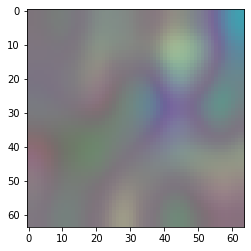

he stayed completely still over until the letter reached . EOS
-7.827672004699707 0.00039855222885351984


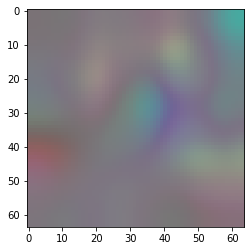

he stayed completely at some once any other looked . EOS
-8.718602180480957 0.00016351559654221548


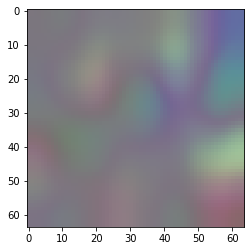

he stayed completely still for over the next year . EOS
-5.222156524658203 0.005395680652469807


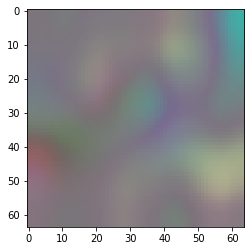

he stayed completely still until her next name . EOS
-8.963955879211426 0.00012793913957195912


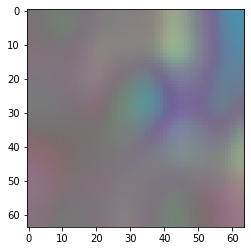

he stayed completely silent for the first ease . EOS
-6.290868282318115 0.0018531501905519026


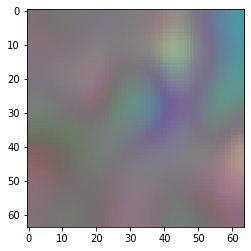

he stayed completely still for the own question . EOS
-7.248694896697998 0.0007111018448637383


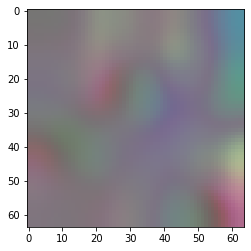

he stayed completely alone than a eye at the spell . EOS
-8.22138786315918 0.0002688416903914774


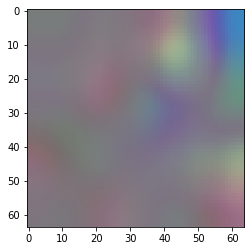

he stayed completely at the moment s two . EOS
-4.826879024505615 0.008011485939915755


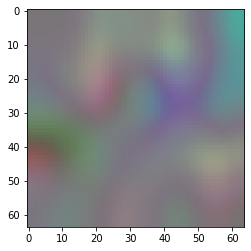

he left completely still waiting for another thing in the . EOS
-7.824235916137695 0.00039992404509978536


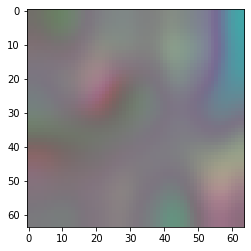

he stayed still completely over for the first moment . EOS
-5.298639297485352 0.0049983906043844445


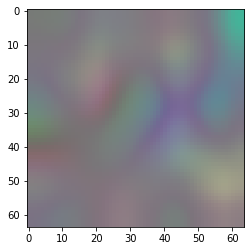

he stayed still next until the smell had every place . EOS
-11.193339347839355 1.376557912679753e-05


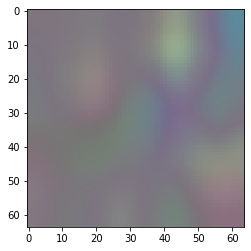

he stayed completely still for the moment that was large . EOS
-6.235147953033447 0.0019593393026866913


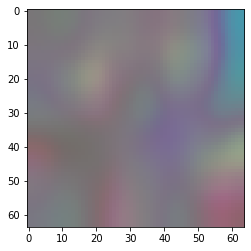




3.0
completely he still had some waiting looking for my existence . EOS
-9.344576835632324 8.74383280288484e-05


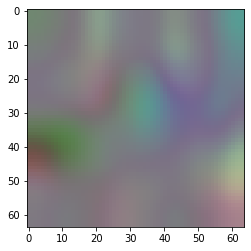

completely he stayed at once until a perfect badge came . EOS
-9.97066593170166 4.6751419843740753e-05


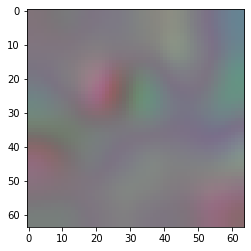

he stayed completely beside your grace no . EOS
-6.2825422286987305 0.0018686440301661751


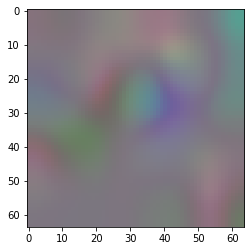

he stayed completely still for the task was different . EOS
-8.296685218811035 0.00024934197284483126


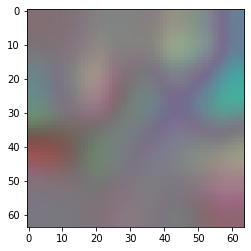

he stayed completely at once over the girl s image . EOS
-7.273155212402344 0.0006939190739469426


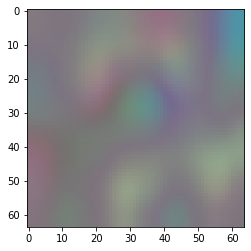

he only stayed near and his death was a second over the panic . EOS
-11.529169082641602 9.838875984506337e-06


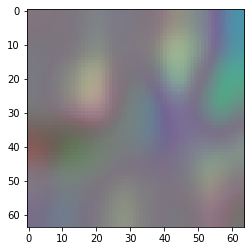

he only stayed straight for onto her heart . EOS
-10.397268295288086 3.0515729215894843e-05


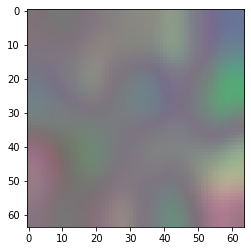

he stayed completely human for the next to still s concern . EOS
-7.063539028167725 0.0008557442257490187


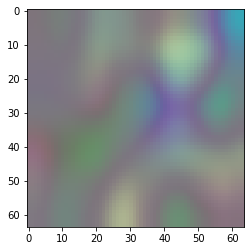

he stayed completely over until something had called the alarm . EOS
-9.027462005615234 0.000120066835753706


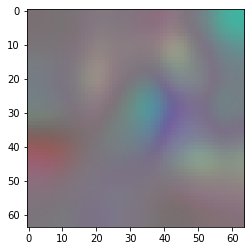

he stayed completely at any other than still had . EOS
-10.205610275268555 3.6962366843466536e-05


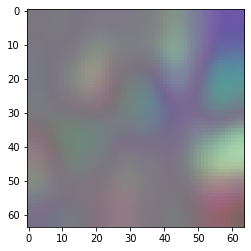

he stayed completely still for over the next year then . EOS
-7.465948104858398 0.0005722422714000288


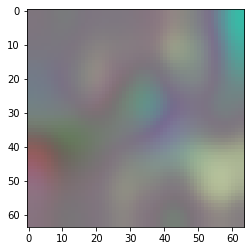

he stayed completely when some promise hit her no . EOS
-11.009760856628418 1.653947092264692e-05


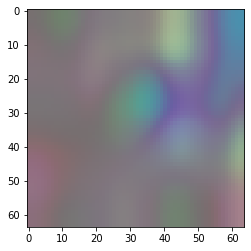

he stayed completely calm the most teasing a floor . EOS
-8.688299179077148 0.00016854644990363688


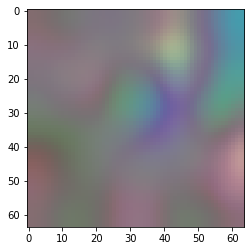

he stayed completely than a voice at the blow . EOS
-10.372848510742188 3.127008992490487e-05


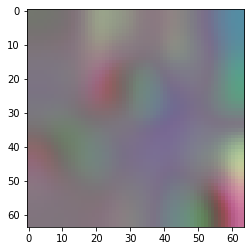

he stayed completely because a woman kept by my big frame . EOS
-8.993879318237305 0.0001241674725824023


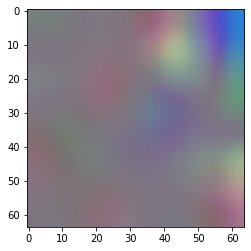

he stayed completely at the moment s two . EOS
-6.139334678649902 0.0021563578120356503


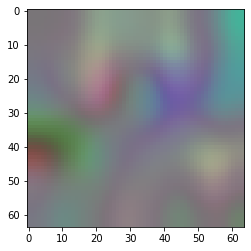

he left completely still waiting for what in the mind . EOS
-10.889856338500977 1.864642091188741e-05


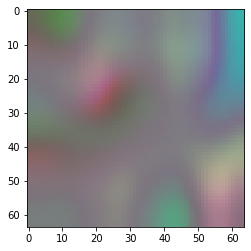

he still stayed somewhere behind for the last time of her eyes . EOS
-10.400527000427246 3.0416449302112166e-05


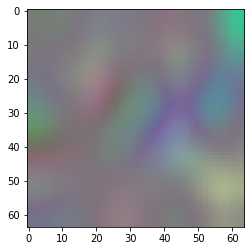

he still had anything over the place completely but its transfer . EOS
-10.6325101852417 2.4119011121101524e-05


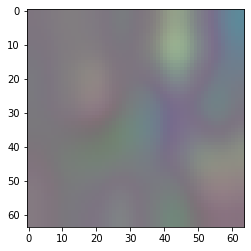

he stayed completely still at the moment that was underground and calm . EOS
-9.348251342773438 8.711762484201901e-05


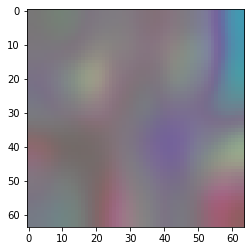




4.0
completely he had some body looking for his eyes but still remained . EOS
-11.194245338439941 1.3753113289315505e-05


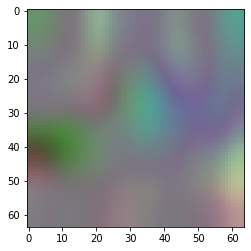

once he stayed thin at any reason , a rain became . EOS
-11.516703605651855 9.962289875119463e-06


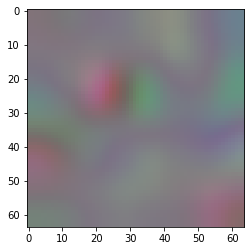

i stayed quiet beside her no they ever . EOS
-9.941444396972656 4.813772441035589e-05


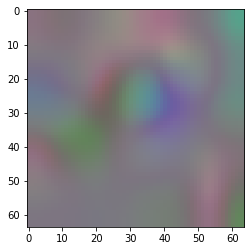

he stayed still has different for the moment . EOS
-8.361164093017578 0.00023377204291110545


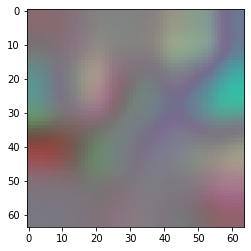

he mentally fell upon someone at the next time . EOS
-8.504637718200684 0.00020252692481627263


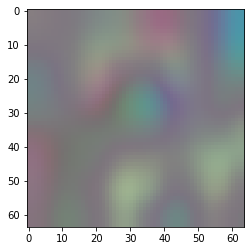

he only stayed near his death and no was the next thing passed . EOS
-10.368037223815918 3.142090180844357e-05


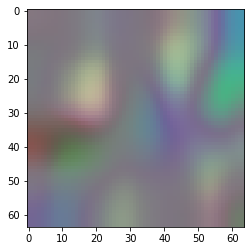

he barely remained next with get your clothes . EOS
-10.642959594726562 2.386829390228624e-05


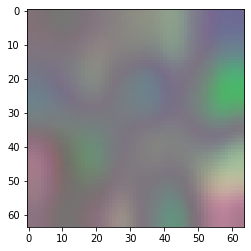

he stayed completely human for the next to someone s still . EOS
-9.75241756439209 5.8153902845394255e-05


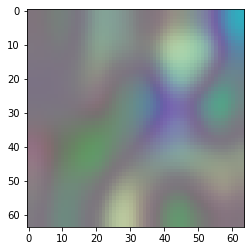

he stayed over shed been almost behind his answer . EOS
-10.314127922058105 3.3161270239320216e-05


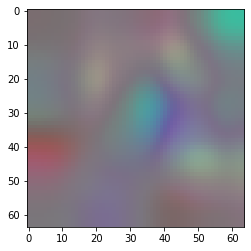

she stayed with no time or even his face burned young . EOS
-12.030417442321777 5.960134903535556e-06


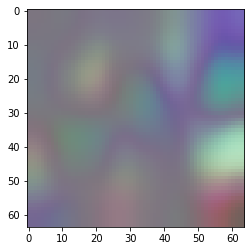

he stayed completely when must staring at some race . EOS
-8.667680740356445 0.0001720576882887103


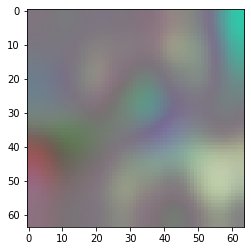

body stayed so he let her be an honestly . EOS
-13.170400619506836 1.9061965820645623e-06


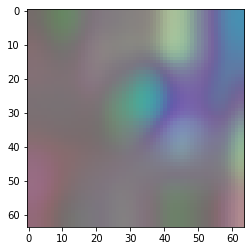

he stayed completely the most steady have a response . EOS
-7.869048118591309 0.0003823981867383421


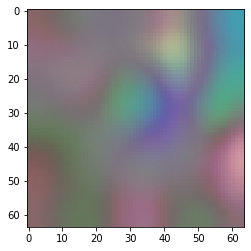

he stayed completely because at a my own trigger . EOS
-15.383819580078125 2.0839727977027672e-07


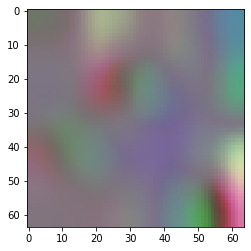

he stayed completely because a woman kept by my big frame . EOS
-11.263862609863281 1.2828226624914445e-05


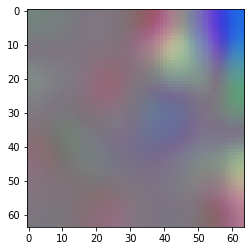

he stayed completely at the moment s two . EOS
-9.234623908996582 9.76008935856384e-05


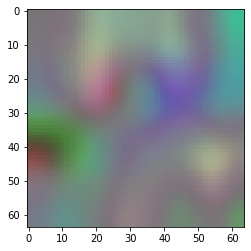

she still remained dark until what he could get over his voice . EOS
-15.448786735534668 1.952887243927452e-07


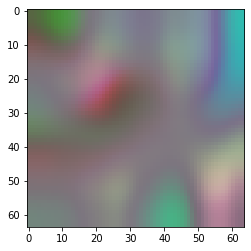

he still stayed outside behind her for some strangely line . EOS
-10.995519638061523 1.677669833739584e-05


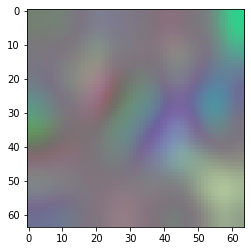

he still had another feeling over the place now it might exist . EOS
-13.013819694519043 2.229307197520314e-06


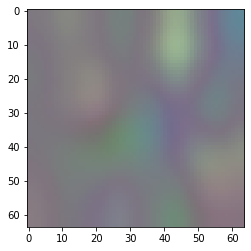

he stayed completely still at the moment that morning , and he was secure his life . EOS
-11.344902992248535 1.1829631947517502e-05


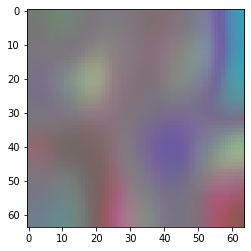




5.0
completely he had some body looking for his eyes but still remained . EOS
-15.744016647338867 1.453651989689045e-07


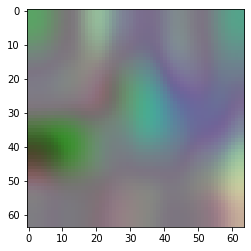

once he stayed wide at any emotion , be spreading . EOS
-11.947717666625977 6.473991815796074e-06


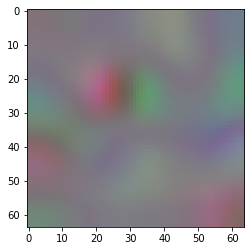

i obviously stay beside her no when they reached . EOS
-9.1181001663208 0.0001096628206743419


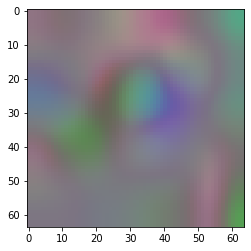

he stayed still would be different for the moment and . EOS
-11.732111930847168 8.03171940029675e-06


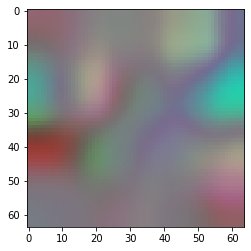

he mentally landed upon someone at the next time . EOS
-7.275622844696045 0.0006922088478033137


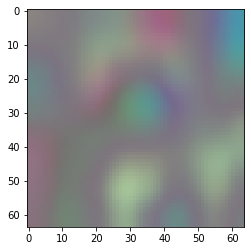

he only stayed near his death and was no doubt the next that had grown . EOS
-10.062540054321289 4.2647578815657235e-05


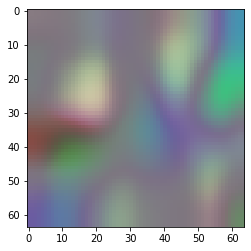

he barely remained next set with its cheeks . EOS
-11.113357543945312 1.4911802507909018e-05


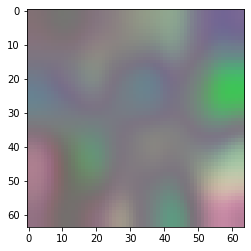

he stayed completely upon someone with the job and their very . EOS
-13.105842590332031 2.0333160198199214e-06


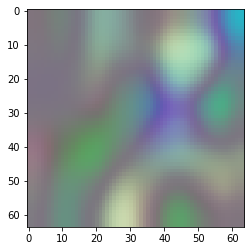

he stayed over shed been noise but finally his door . EOS
-8.17838191986084 0.00028065569633093637


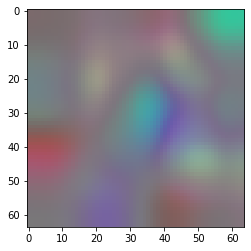

she stayed at the face only no more and barely melted before . EOS
-14.667699813842773 4.264802348153177e-07


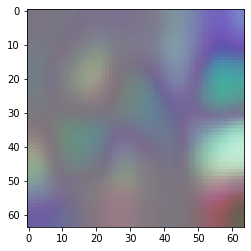

he stayed completely when must function for about my two . EOS
-11.275221824645996 1.2683332542891446e-05


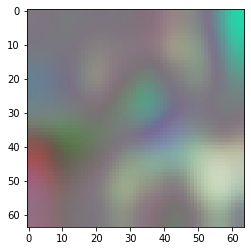

crying when he might get her two entirely desire . EOS
-12.906314849853516 2.482325216241614e-06


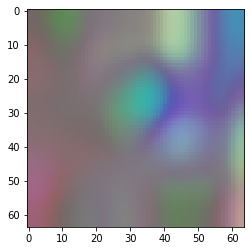

he stayed completely the most rapid thrust a response . EOS
-11.749905586242676 7.89006972316357e-06


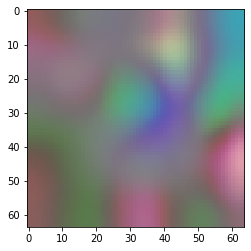

he stayed even than a voice and directed her throat . EOS
-13.618429183959961 1.2178431374466239e-06


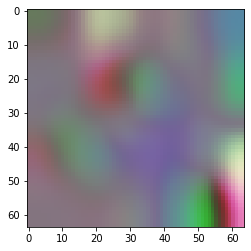

he stayed there maybe a burning body in my face , kept his going to the roaring . EOS
-21.081851959228516 6.986634527565358e-10


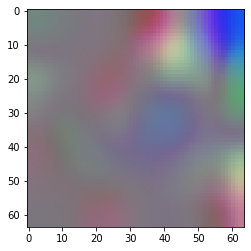

he completely appeared at the next two . EOS
-11.774062156677246 7.701756357971701e-06


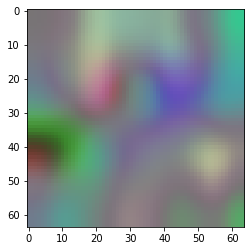

nothing she left because he ca nt fully and serious with ash . EOS
-20.191492080688477 1.7019484746136333e-09


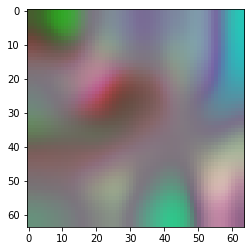

he still stayed outside again in front and her with a strangely beginning . EOS
-12.806306838989258 2.743415615238144e-06


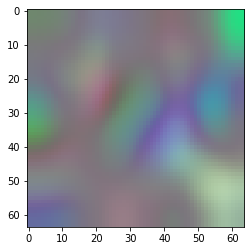

he had only an arm over her mind so you slept the headlights . EOS
-13.635499954223633 1.1972300581715273e-06


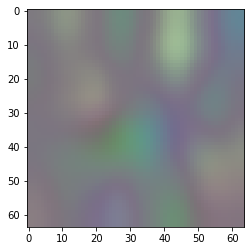

he still stayed completely at that moment and the room , he was finding his fresh life . EOS
-13.001543998718262 2.2568421541235787e-06


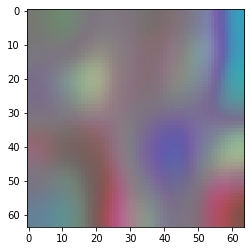

In [146]:
for k in np.linspace(1, 5, 5):
    with torch.no_grad():
        z = 0.5*x1_he + k*unit_rand_x
        print(k)
        for zi in z:
            bd_z, img_z = model.beam_search_from_vector(zi.unsqueeze(0), max_len=20)
            print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
            prob = bd_z[0][1].item()
            print(prob, np.exp(prob))
            plt.imshow(tensor2image(img_z[0]))
            plt.show()
        print("\n\n")

1.0
he stayed completely still for the next moment . EOS
-3.287874221801758 0.03733312705056329


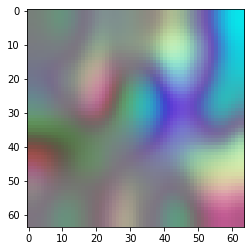

he stayed completely still for the next moment . EOS
-2.810641288757324 0.060166395984661426


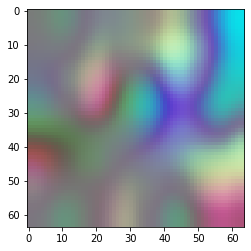

he stayed completely still for the next moment . EOS
-3.136368751525879 0.043440254204264096


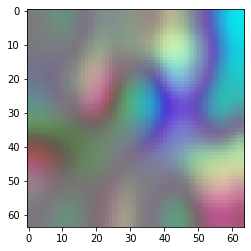

he stayed completely still for the next moment . EOS
-2.9260106086730957 0.05361048530509159


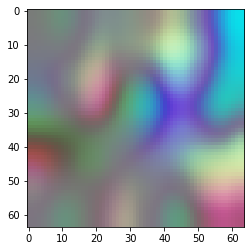

he stayed completely still for the next moment . EOS
-3.069840908050537 0.046428540676950486


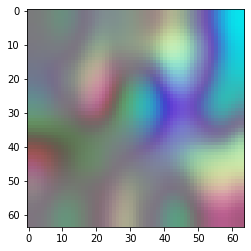

he stayed completely still for the next moment . EOS
-2.8048081398010254 0.06051838112744539


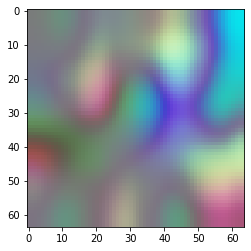

he stayed completely still for the next body . EOS
-3.1714539527893066 0.04194257103095945


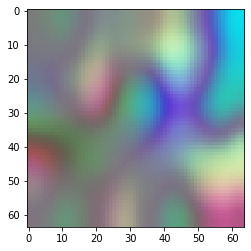

he stayed completely still for the next body . EOS
-3.348626136779785 0.035132588330579424


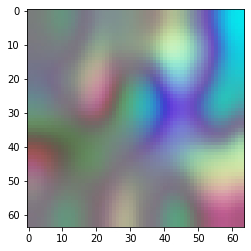

he stayed completely still for the next moment . EOS
-2.9199304580688477 0.05393743808354189


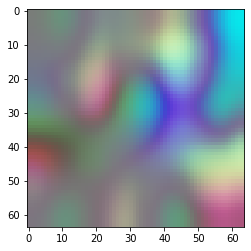

he stayed completely still for the next moment . EOS
-3.23935866355896 0.03918902038810768


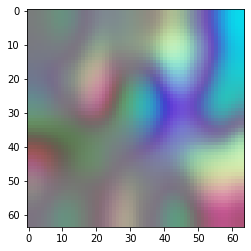

he stayed completely still for the next moment . EOS
-3.354499578475952 0.03492684392673331


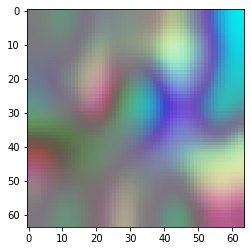

he stayed completely still for the next body . EOS
-3.166726589202881 0.04214131821894917


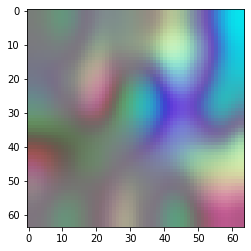

he stayed completely still for the next body . EOS
-3.4240047931671143 0.03258169038029813


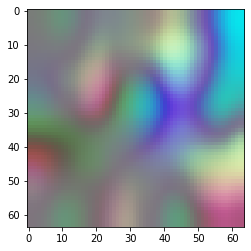

he stayed completely still for the next moment . EOS
-2.926102876663208 0.053605539001559795


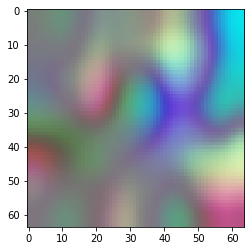

he stayed completely still for the next moment . EOS
-2.985666036605835 0.05050585359702413


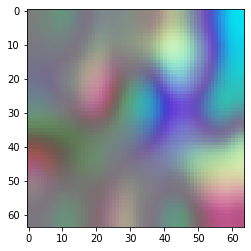

he stayed completely still for the next moment . EOS
-3.447740316390991 0.031817452582640376


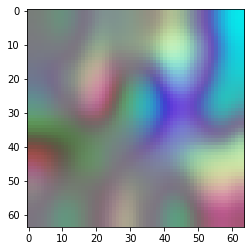

he stayed completely still for the next moment . EOS
-2.9946417808532715 0.05005455437520373


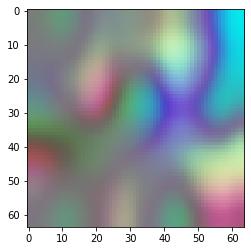

he stayed completely still for the next moment . EOS
-3.094529867172241 0.04529630273412584


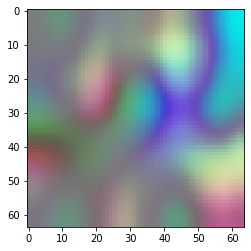

he stayed completely still for the next moment . EOS
-2.7036654949188232 0.0669596222048508


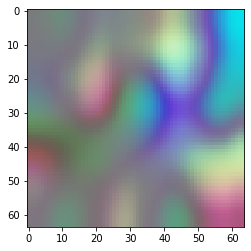

he stayed completely still for the next moment . EOS
-2.9307689666748047 0.05335599338537891


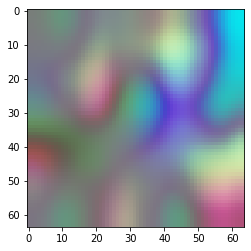




2.0
he stayed completely still for the next body . EOS
-3.8995561599731445 0.020250897610386346


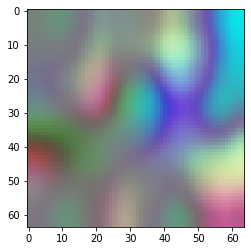

he stayed completely still for the next moment . EOS
-2.819014549255371 0.05966471038113351


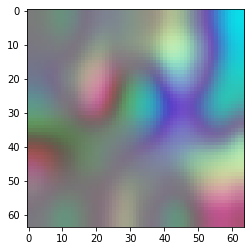

he stayed completely still for the next moment . EOS
-3.6275830268859863 0.02658035082671299


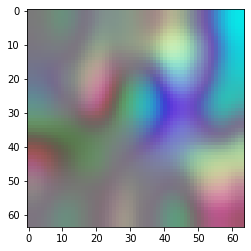

he stayed completely still for the next moment . EOS
-3.0223584175109863 0.04868626032687639


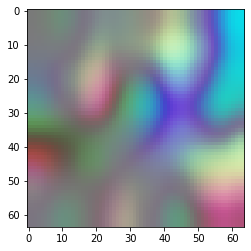

he stayed completely still for the next moment . EOS
-3.4108314514160156 0.033013739640763096


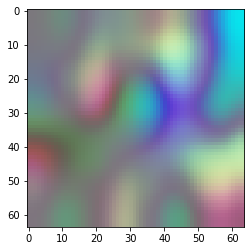

he stayed completely still for the next moment he stayed . EOS
-3.5946385860443115 0.0274706096438226


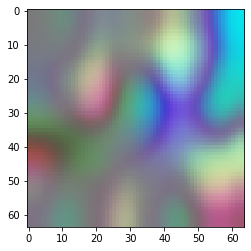

he stayed completely still for the next body . EOS
-3.2971689701080322 0.03698773269456035


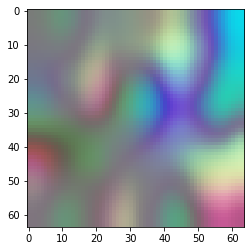

he stayed completely still for the next body . EOS
-3.94692325592041 0.019314034794530695


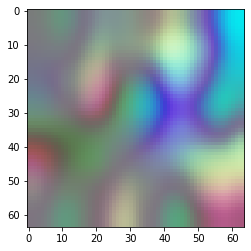

he stayed completely still for the next moment . EOS
-3.345221757888794 0.03525239679366633


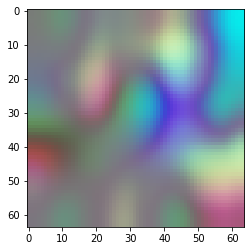

he stayed completely still for the next moment . EOS
-3.9587483406066895 0.019086989756538414


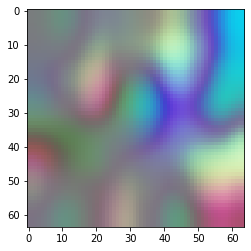

he stayed completely still for the next body . EOS
-4.0290751457214355 0.01779077622279461


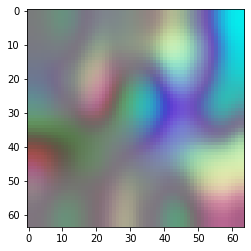

he stayed completely still for the next body . EOS
-3.200502395629883 0.04074173036857977


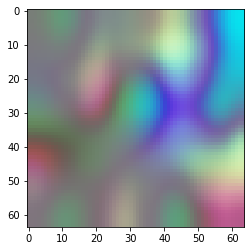

he stayed completely still for the next body . EOS
-4.120264053344727 0.016240225589845808


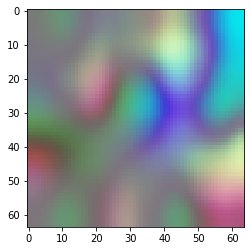

he stayed completely still for the next moment . EOS
-3.1689605712890625 0.042047280347529414


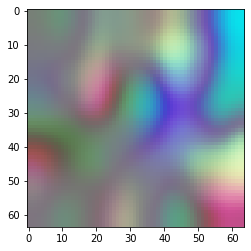

he stayed completely still for the next body he stayed . EOS
-4.04024600982666 0.017593143796947965


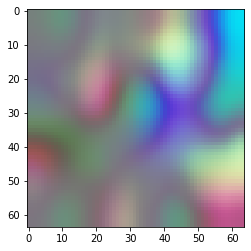

he stayed completely still for the next moment . EOS
-4.193686485290527 0.01509055111062332


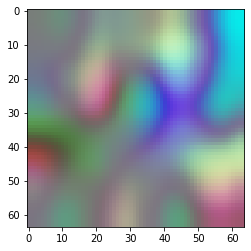

he stayed completely still for the next moment . EOS
-3.2254092693328857 0.03973951408313734


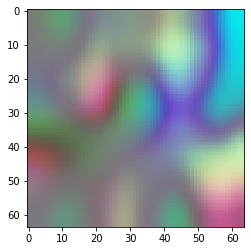

he stayed completely still for the next moment . EOS
-4.418583393096924 0.012051292141954353


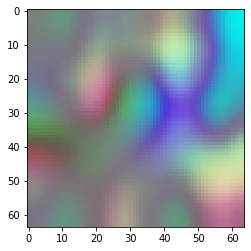

he stayed completely still for the next moment . EOS
-2.702641725540161 0.06702820851796402


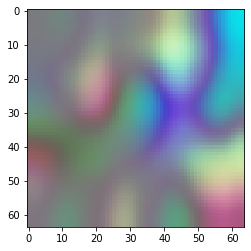

he stayed completely still for the next moment he stayed . EOS
-3.2840871810913086 0.03747477717064619


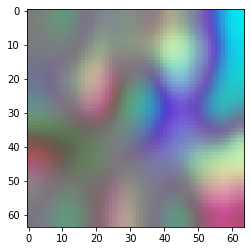




3.0
he stayed completely still for the next body completely . EOS
-4.853289604187012 0.007802667596631189


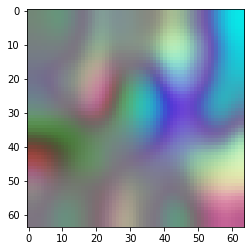

he stayed completely still for the next moment . EOS
-3.2788710594177246 0.03767076086108749


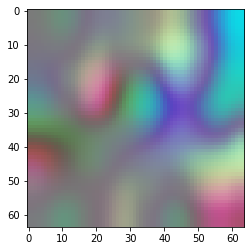

he stayed completely still for the next situation . EOS
-4.386514663696289 0.01244402533912649


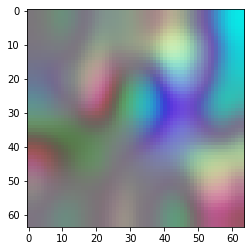

he stayed completely still for the next moment . EOS
-3.6552975177764893 0.025853804372413105


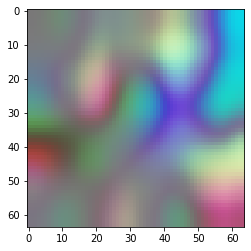

he stayed completely still for the next moment . EOS
-4.000887393951416 0.01829939291092532


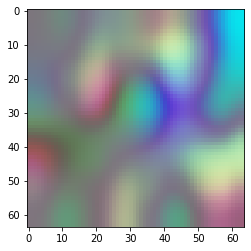

he stayed completely still for the next moment he stayed . EOS
-3.941783905029297 0.019413551904091053


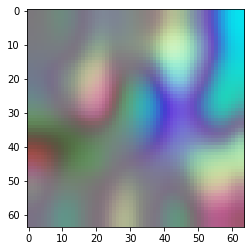

he stayed completely still for the next body . EOS
-3.6260390281677246 0.026621422553507797


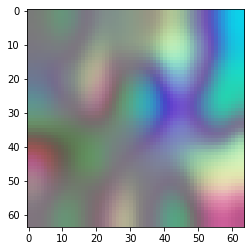

he stayed completely still for the next body . EOS
-5.675981521606445 0.003427303352559344


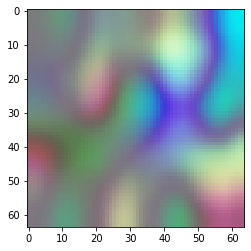

he stayed completely still for the next moment . EOS
-4.760186672210693 0.008564010585487421


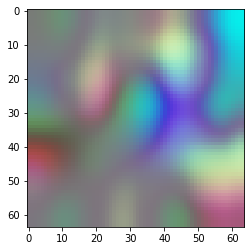

he stayed completely still for the next moment . EOS
-5.174722671508789 0.005657785761588835


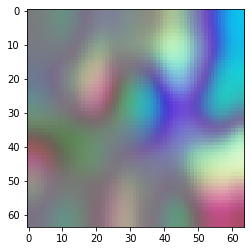

he stayed completely still for the next body he slept . EOS
-4.673763275146484 0.009337065381020197


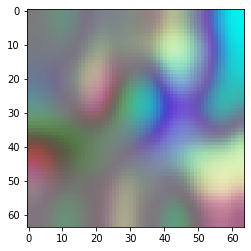

he stayed completely still for the next body . EOS
-3.910022497177124 0.02004005021205342


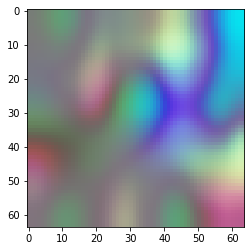

he stayed completely still for the next completely . EOS
-5.36361837387085 0.00468392720828194


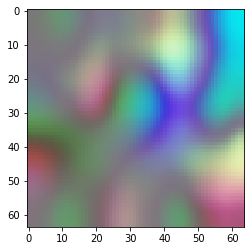

he stayed completely still for the next body . EOS
-3.6572535037994385 0.02580328411698439


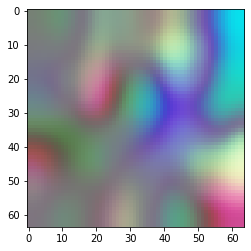

he stayed completely still for the next moment he stayed completely . EOS
-4.40546178817749 0.012210466463657654


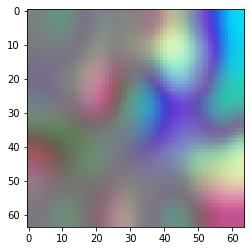

he stayed completely still for the next moment . EOS
-5.378410816192627 0.004615150427613684


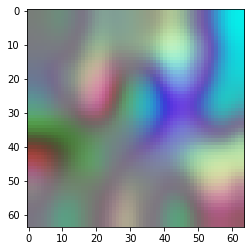

he stayed completely still for the next moment . EOS
-4.65665340423584 0.009498195894654868


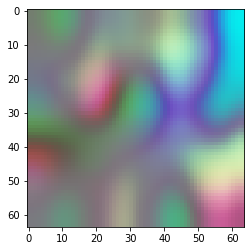

he stayed completely still for the next moment completely . EOS
-4.902766227722168 0.007426012590831404


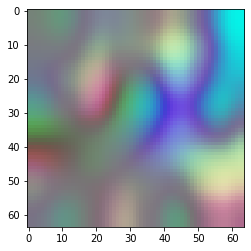

he stayed completely still for the next moment . EOS
-3.296630620956421 0.037007650369927265


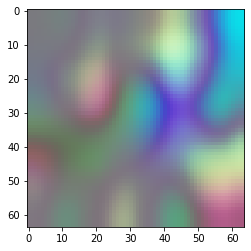

he stayed completely still for the next moment he stayed completely . EOS
-3.720489263534546 0.024222113949003022


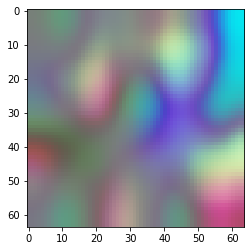




4.0
he stayed completely still for the next body completely . EOS
-5.800052165985107 0.003027396814119411


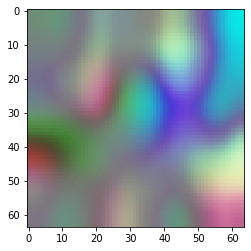

he stayed completely still for the next moment . EOS
-4.753832817077637 0.008618598305689902


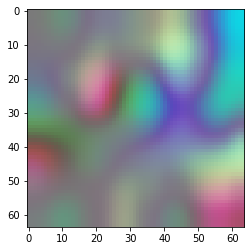

he stayed completely still for the next situation . EOS
-3.9617319107055664 0.019030127253436262


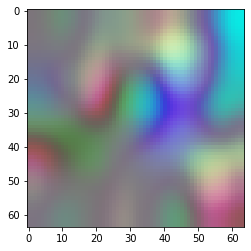

he stayed completely still for the next moment he stayed . EOS
-4.744895935058594 0.008695966903996885


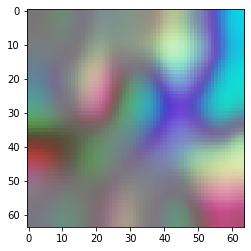

he stayed completely still for the next moment . EOS
-5.626336097717285 0.003601747632950151


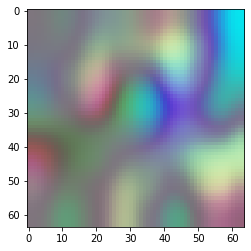

he stayed completely still for the next moment he stayed completely . EOS
-5.666088104248047 0.0034613793812815624


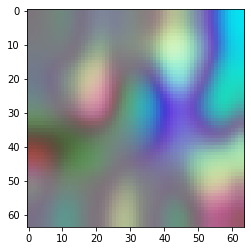

he stayed completely still for the next body . EOS
-4.188588619232178 0.015167677140987428


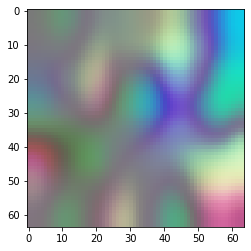

he stayed completely still for the next body he stayed . EOS
-7.225931644439697 0.0007274744757311898


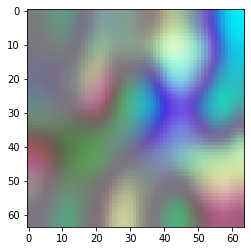

he stayed completely still for the next moment he stayed . EOS
-6.713254451751709 0.0012147044877251411


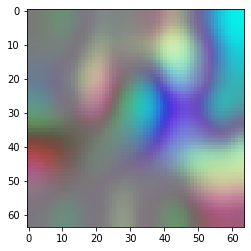

he stayed completely still for the next body he stayed . EOS
-7.31319522857666 0.0006666834392200795


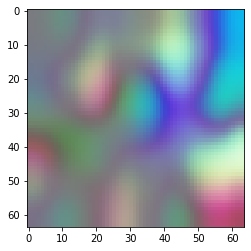

he stayed completely still for the next body he slept . EOS
-4.839903831481934 0.007907814497828762


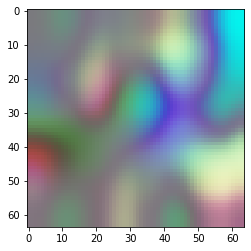

he stayed completely still for the next body . EOS
-6.160524845123291 0.0021111449567761814


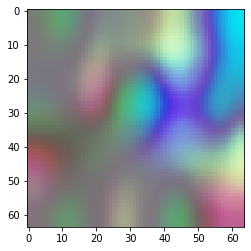

he stayed completely still for the next completely . EOS
-6.583499431610107 0.0013830010990558887


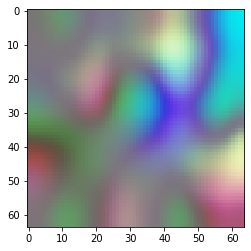

he stayed completely still for the next body . EOS
-4.316010475158691 0.013353049741641622


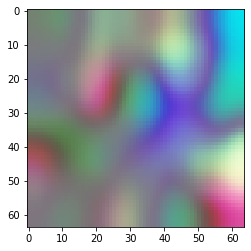

he stayed completely still for the next moment he stayed completely . EOS
-4.9200944900512695 0.00729844118412429


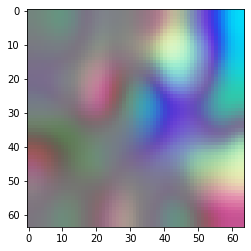

he stayed completely still for the next moment . EOS
-7.524486541748047 0.0005397057136137466


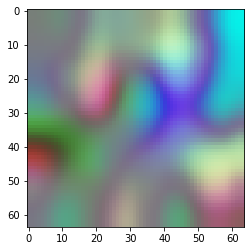

he stayed completely still for the next body she remained . EOS
-6.77606201171875 0.0011407583576647784


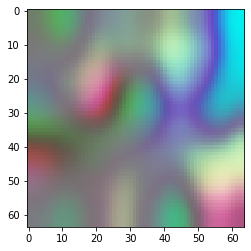

he stayed completely still for the next moment completely . EOS
-7.419485569000244 0.0005994574457010154


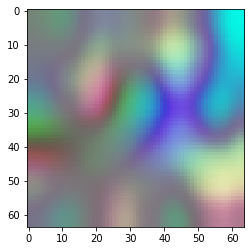

he stayed completely still for the next moment . EOS
-4.776230335235596 0.008427708799128002


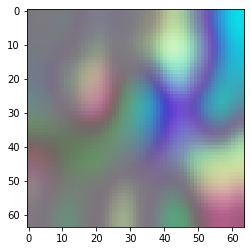

he stayed completely still for the next moment he stayed completely . EOS
-4.181808948516846 0.01527085836967942


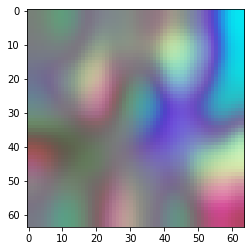




5.0
he stayed completely completely still for the next body . EOS
-8.123730659484863 0.00029642075022533865


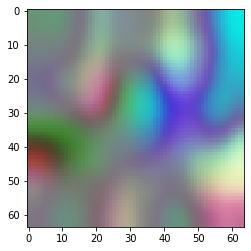

he stayed completely still for the next moment once . EOS
-8.014800071716309 0.0003305343165904949


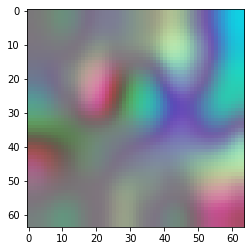

he stayed completely still for the next situation . EOS
-3.8902249336242676 0.020440747709332685


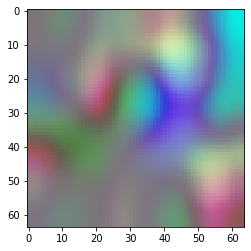

he stayed completely still for the next moment he stayed . EOS
-5.699698448181152 0.0033469745915862418


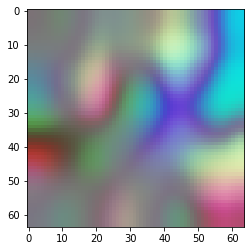

he stayed completely still for the next body he slept . EOS
-6.676847457885742 0.0012597431123581584


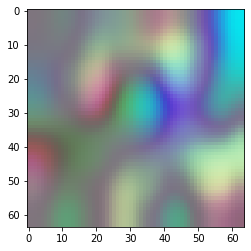

he stayed completely still for the next moment he only stayed his body . EOS
-7.651486873626709 0.00047533683751852456


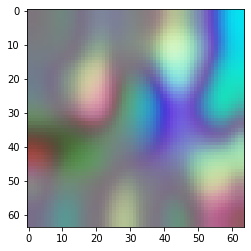

he stayed completely still for the next body . EOS
-5.414070129394531 0.0044534770453743934


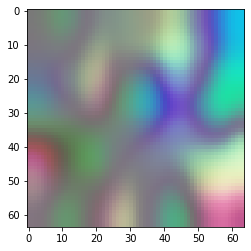

he stayed completely still for the next body he stayed . EOS
-9.488819122314453 7.569343521779465e-05


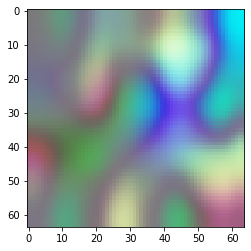

he stayed completely still for over the next moment he stayed . EOS
-8.9446439743042 0.00013043389982111492


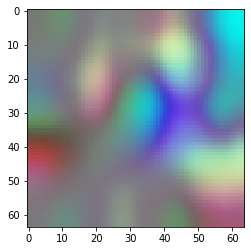

he stayed completely still for the next woman only completely . EOS
-9.279253005981445 9.334082246540815e-05


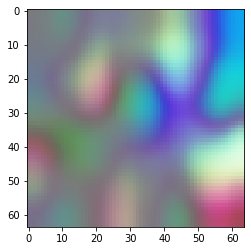

he stayed completely still for the next body he slept . EOS
-5.604620456695557 0.003680817308735686


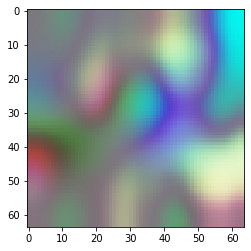

he stayed completely still for the next body harder . EOS
-8.312332153320312 0.00024547089951886165


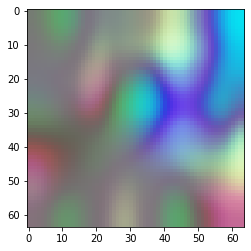

he stayed completely completely the body with a easier . EOS
-8.186029434204102 0.0002785175639872295


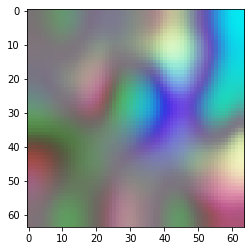

he stayed completely still for the next body . EOS
-5.653376579284668 0.003505659630196658


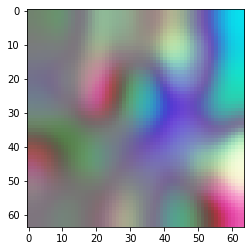

he stayed completely still for the next moment he stayed completely . EOS
-6.801429271697998 0.0011121843976259892


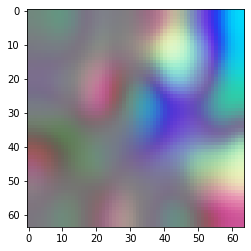

he stayed completely still for the next moment he completely . EOS
-10.435730934143066 2.936429920813636e-05


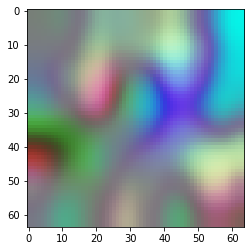

he stayed completely still for the next body she remained . EOS
-9.362619400024414 8.587486323535605e-05


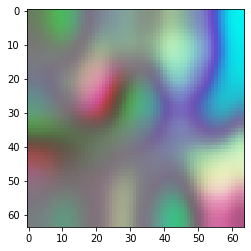

he stayed completely still for the next completely slept . EOS
-9.283939361572266 9.29044175531866e-05


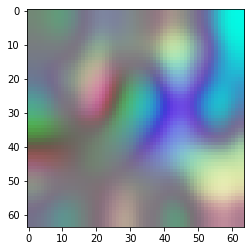

he stayed completely still for the next moment only had nt . EOS
-9.73818588256836 5.8987447993304755e-05


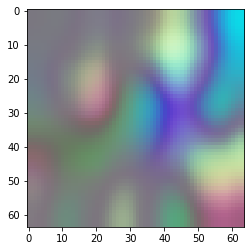

he stayed completely still for the next moment he stayed completely . EOS
-6.197502136230469 0.002034506213966687


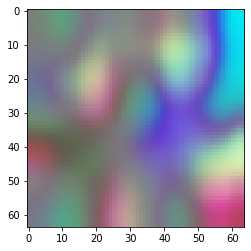




6.0
he stayed completely still for the next body only his completely . EOS
-11.684355735778809 8.424590099575552e-06


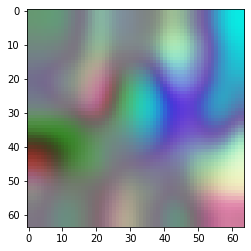

he stayed completely still for the next time after attraction . EOS
-9.899497032165527 5.019992465492992e-05


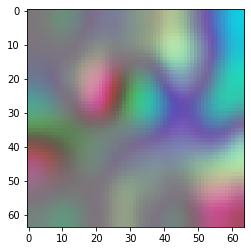

he stayed completely still for the next situation . EOS
-4.091778755187988 0.016709485025567693


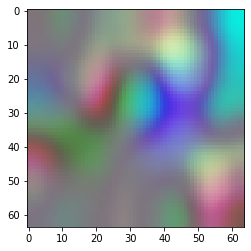

he stayed completely still for the next moment he stayed . EOS
-7.20615291595459 0.00074200623196716


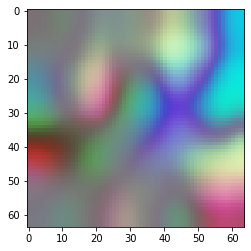

he stayed completely still for the next body he slept . EOS
-8.227317810058594 0.0002672521909246211


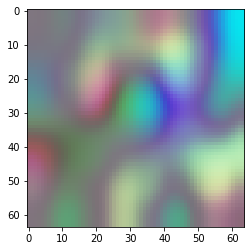

he stayed completely still for the next moment he only stayed his body and no . EOS
-12.732939720153809 2.9522595839378308e-06


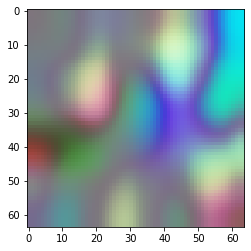

he stayed completely still for the next only body . EOS
-6.698249340057373 0.0012330686981913057


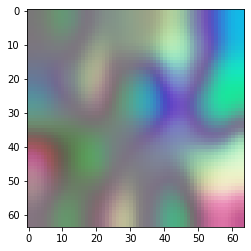

he stayed completely still for the next person he stayed completely . EOS
-11.39946460723877 1.1201480428987693e-05


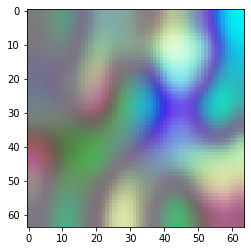

he stayed completely still for over the next moment he stayed . EOS
-10.85250186920166 1.935612077855614e-05


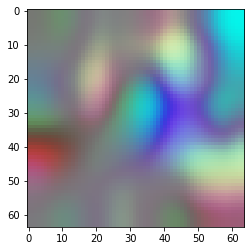

he stayed completely still for the next woman only by body . EOS
-11.130614280700684 1.4656681070351415e-05


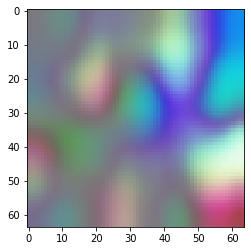

he stayed completely still for the next body he slept . EOS
-7.223515033721924 0.0007292346242864736


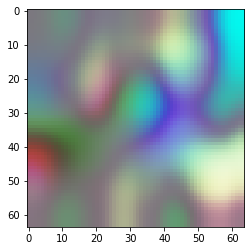

he stayed completely still for the next body harder . EOS
-10.220198631286621 3.642706078796688e-05


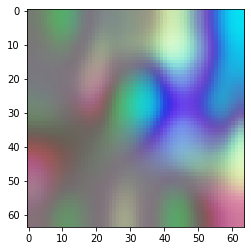

he stayed completely completely the body with a easier . EOS
-7.114439964294434 0.0008132760474454214


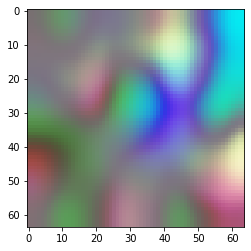

he stayed completely still for the next moment . EOS
-7.505070209503174 0.0005502872135953321


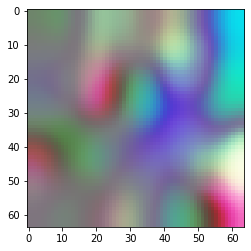

he stayed completely still after the woman stuck for a completely . EOS
-10.861663818359375 1.917959089783252e-05


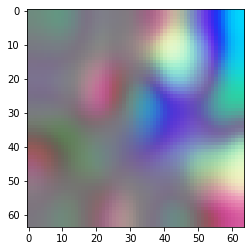

he stayed completely he only for the next still his body . EOS
-12.436991691589355 3.969018624869867e-06


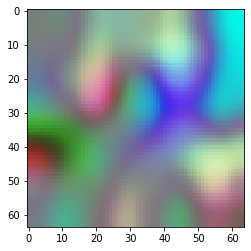

he stayed completely still for what she lay the next body . EOS
-11.636201858520508 8.840192915605825e-06


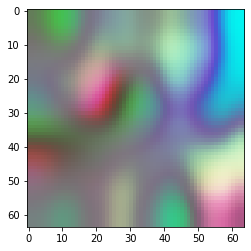

he stayed completely still for once the next completely slept . EOS
-10.475659370422363 2.8214927660241315e-05


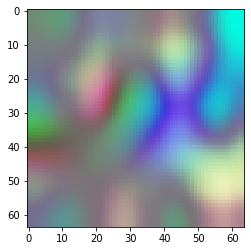

he still stayed completely waiting for the next moment i had another . EOS
-12.177404403686523 5.145415655571631e-06


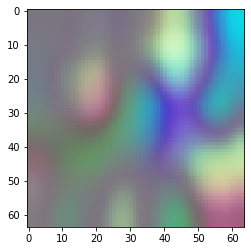

he stayed completely still for the moment he stayed completely beyond his body . EOS
-10.160711288452148 3.86597601437409e-05


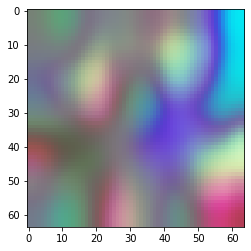




7.0
he completely stayed completely still for his body looked the next . EOS
-12.129049301147461 5.400336448012349e-06


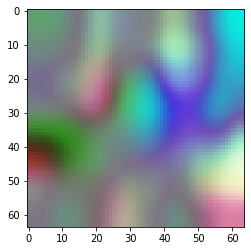

he stayed completely still for once the next moment grown . EOS
-10.843768119812012 1.9525912667207634e-05


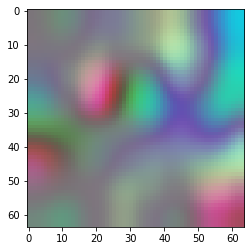

he stayed completely still for the next situation . EOS
-4.600769519805908 0.010044103633330298


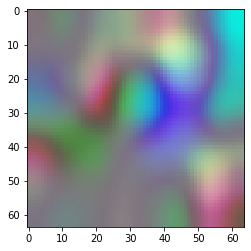

he stayed completely still for the next he only stayed . EOS
-8.509403228759766 0.00020156407667125991


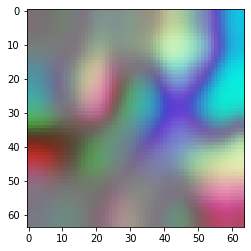

he stayed completely upon he still for the next moment . EOS
-10.066205978393555 4.249152225038301e-05


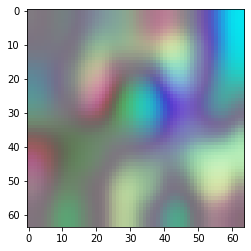

he stayed completely still for the next moment he only had his death and stayed no . EOS
-16.270305633544922 8.588079270962976e-08


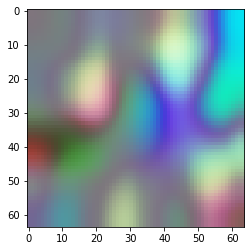

he stayed completely still for the next only body . EOS
-8.45593547821045 0.000212634574514726


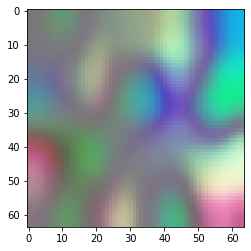

he stayed completely completely still for the next person with the body . EOS
-13.086752891540527 2.072504266031e-06


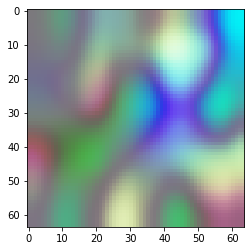

he stayed completely when shed stayed for his front easier . EOS
-12.491745948791504 3.7575404554459064e-06


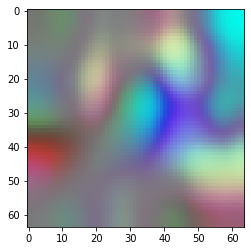

he stayed completely still for the next woman only by body . EOS
-12.11795711517334 5.4605714354670045e-06


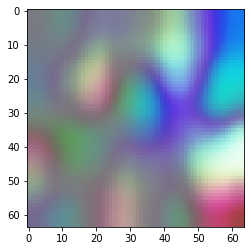

he stayed completely still for the next body he slept . EOS
-9.505319595336914 7.445470564908229e-05


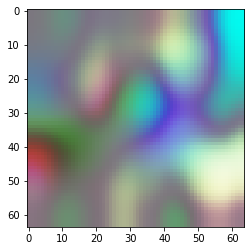

he stayed completely still when her body for the next response . EOS
-12.198387145996094 5.038575543954973e-06


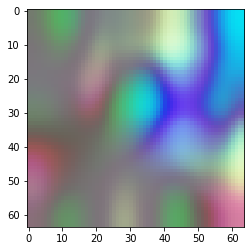

he stayed completely completely the body with a fully easier . EOS
-6.895762920379639 0.001012064555248966


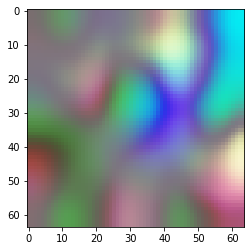

he stayed completely still for the voice after her body . EOS
-11.205382347106934 1.3600794509575194e-05


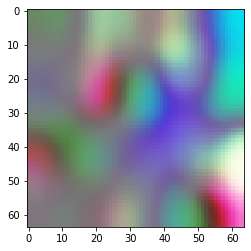

he stayed completely after he still stayed the whole place a woman stuck . EOS
-14.115595817565918 7.407550615078333e-07


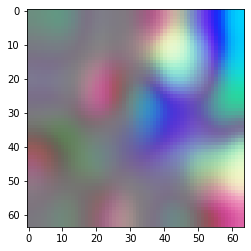

he stayed completely he only for the next still his body . EOS
-12.887234687805176 2.5301431196196795e-06


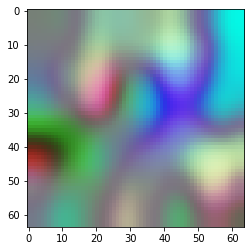

he stayed completely still for what she lay the next body . EOS
-13.761192321777344 1.0558205490026203e-06


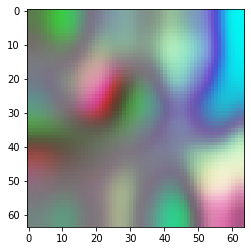

he stayed completely still for once the front slept completely continued . EOS
-13.243977546691895 1.770979903641373e-06


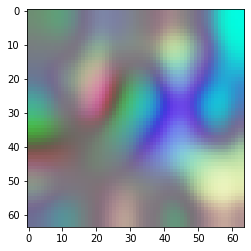

he stayed completely still for the next moment had nt only the arm . EOS
-14.169190406799316 7.020997094176444e-07


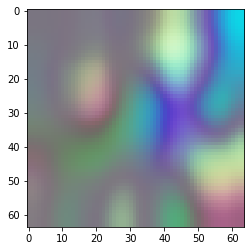

he stayed completely still after his body but he stayed at the next light . EOS
-10.360991477966309 3.1643067238459126e-05


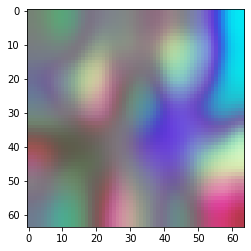




8.0
he stayed completely still for his body completely looked the next person . EOS
-13.139458656311035 1.9661000324837687e-06


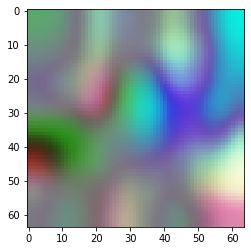

he stayed completely still for once the next ever formed . EOS
-11.786054611206055 7.6099450170706255e-06


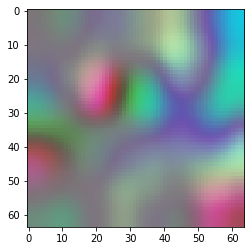

he stayed completely still for the next situation . EOS
-5.766227722167969 0.0031315483314142373


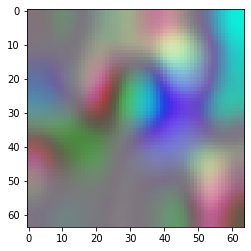

he stayed completely still for the next he only stayed . EOS
-9.612470626831055 6.688936133752314e-05


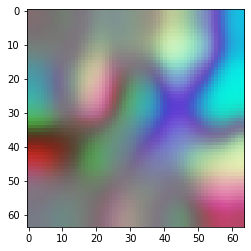

he completely stayed upon he still for the next moment . EOS
-10.981266975402832 1.701752307951456e-05


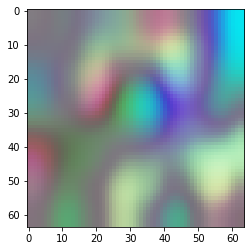

he only stayed completely near his body and an he still stayed for the next moment . EOS
-15.56478214263916 1.739005691664171e-07


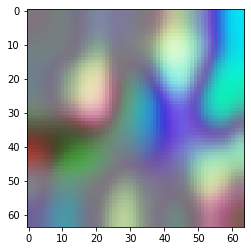

he stayed completely still next with the body . EOS
-10.44355583190918 2.9135423202352355e-05


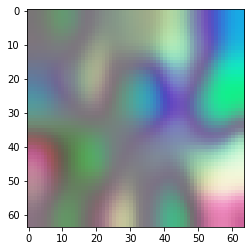

he stayed completely completely still with the next person for a body . EOS
-13.820473670959473 9.950491828997206e-07


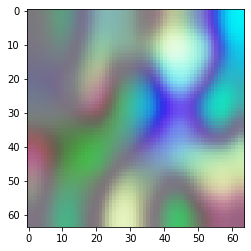

he stayed completely when shed stayed for his phone behind . EOS
-12.938440322875977 2.4038466739602096e-06


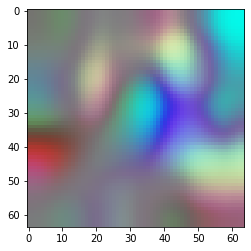

he stayed completely still at the next woman only after completely . EOS
-14.52152156829834 4.936092778208754e-07


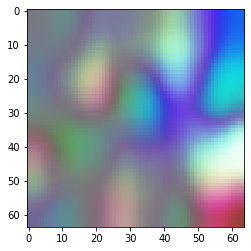

he stayed completely still for when he slept the next person . EOS
-11.82811450958252 7.296509246539928e-06


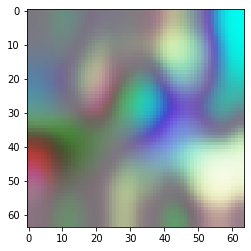

he stayed completely still when her body for the next response . EOS
-13.440713882446289 1.454695609315737e-06


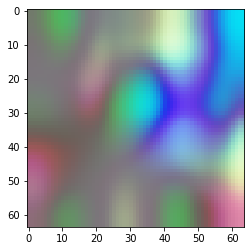

he stayed completely completely the body with a fully easier . EOS
-7.132164478302002 0.0007989881220711915


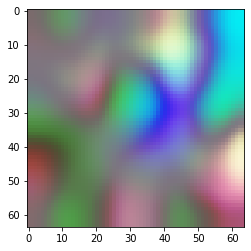

he stayed completely still for the body after her voice . EOS
-12.024484634399414 5.99560033989391e-06


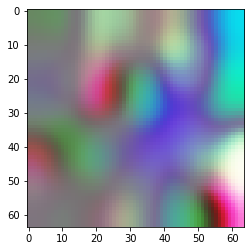

he stayed completely because i stayed a completely caught his body by the whole woman . EOS
-18.37477684020996 1.0469737958590648e-08


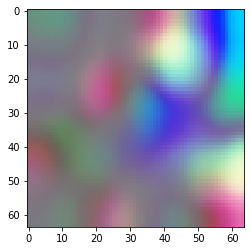

he stayed completely he only for the next still his body . EOS
-14.074216842651367 7.720497525797639e-07


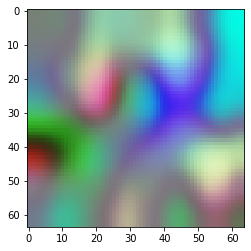

he stayed completely still for what she lay the next dark body . EOS
-17.451387405395508 2.6360809842161382e-08


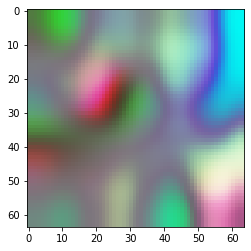

he stayed completely still for once the front slept completely continued . EOS
-13.781323432922363 1.0347782215305362e-06


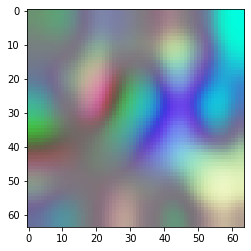

he still stayed there for the next moment her body had nt completely felt . EOS
-12.714073181152344 3.0084872473976473e-06


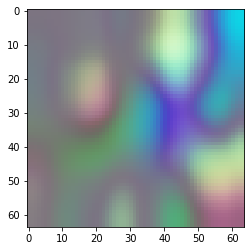

he stayed completely still after his body but he stayed at the next light completely . EOS
-11.83110523223877 7.274720010047392e-06


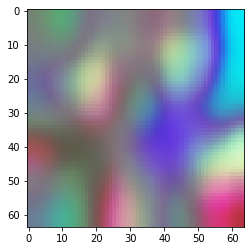




9.0
he completely stayed completely still for his body but two looked his eyes . EOS
-15.315407752990723 2.2315310021779883e-07


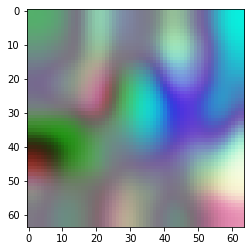

he stayed completely still for once the next ever traveled . EOS
-13.465757369995117 1.4187173488682159e-06


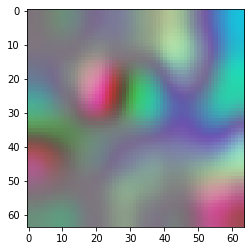

he stayed completely still for the next situation . EOS
-7.899421691894531 0.0003709580064613226


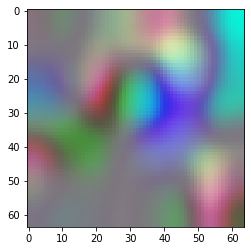

he stayed completely still for the next he only stayed . EOS
-11.194686889648438 1.3747041926029567e-05


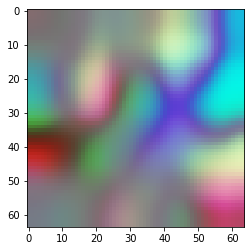

he stayed completely body next for he still to the time . EOS
-14.893150329589844 3.4039799527366463e-07


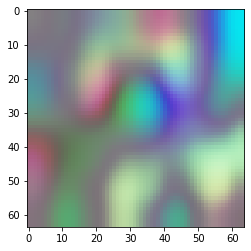

he only stayed completely near his body and an he had still for the next death slept . EOS
-20.14472198486328 1.7834395872191921e-09


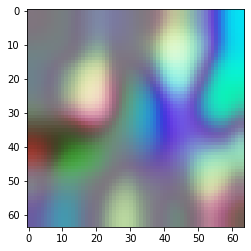

he stayed completely still next with the body . EOS
-12.261774063110352 4.7291074970296e-06


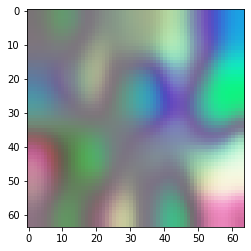

he stayed completely completely still with the whole body for the next person . EOS
-16.758487701416016 5.2708573932492945e-08


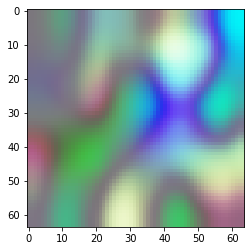

he stayed completely when shed stayed for his plan behind . EOS
-13.291330337524414 1.6890736126394828e-06


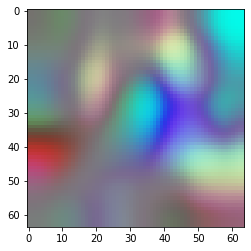

he stayed completely at the next body still with no woman . EOS
-16.318349838256836 8.185226685669852e-08


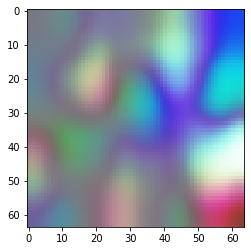

he stayed completely when i only slept for his next body . EOS
-14.714360237121582 4.070376143915979e-07


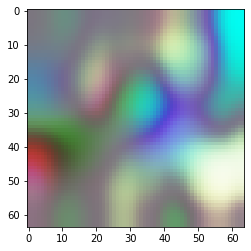

he stayed completely when her body probably for an response . EOS
-14.670923233032227 4.2510772352052935e-07


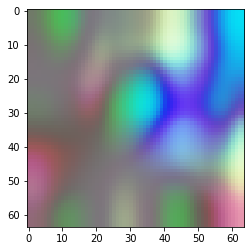

he stayed completely completely the body have a fully easier . EOS
-8.229524612426758 0.0002666630684343293


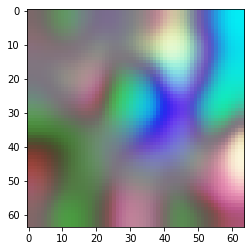

he stayed completely still for the voice after her body . EOS
-13.598993301391602 1.2417445134233775e-06


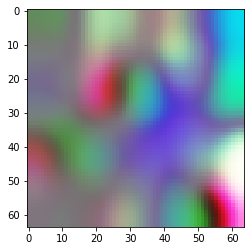

he stayed completely because i stayed a completely caught his face by his whole body . EOS
-17.274063110351562 3.1475287892579806e-08


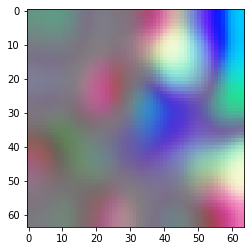

he stayed completely he only at the next his body . EOS
-14.516611099243164 4.960390917856572e-07


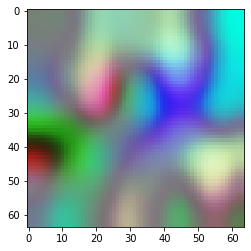

she stayed completely still until he no body for his body he leave . EOS
-21.59476089477539 4.183256604405359e-10


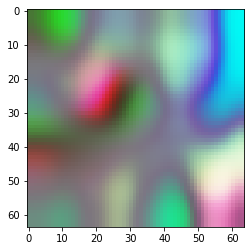

he stayed completely still for once some slept in the front completely continued . EOS
-16.18216323852539 9.379416041973033e-08


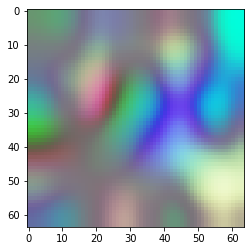

he still stayed there for the next moment her body had nt completely felt . EOS
-12.379289627075195 4.204775616523713e-06


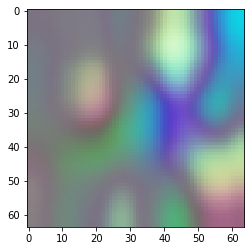

he stayed completely still after his body but he stayed at the first light a completely . EOS
-15.843092918395996 1.316534272374657e-07


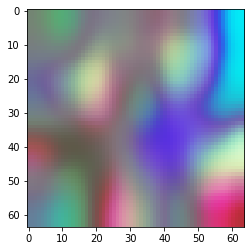




10.0
he completely stayed completely still for his body but two looked his eyes . EOS
-15.940673828125 1.194134700185791e-07


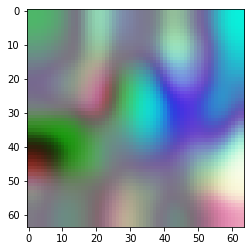

he stayed completely barely once for a body than stayed light . EOS
-15.862042427062988 1.29182148188135e-07


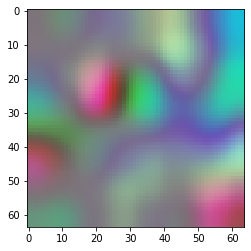

he stayed completely still for the next house no . EOS
-11.948638916015625 6.468030401183591e-06


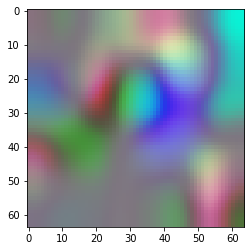

he stayed completely still for the only he stayed near his mind . EOS
-14.432171821594238 5.397434938696416e-07


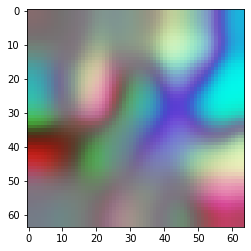

he stayed completely body next at once he slept with the woman . EOS
-17.885356903076172 1.7080012733312393e-08


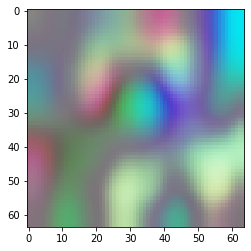

he only stayed completely near his body and an he had still stayed for the next almost a moment
-20.17250633239746 1.734569931456573e-09


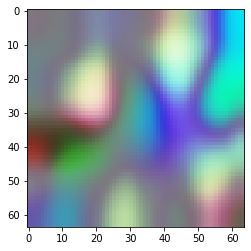

he barely stayed only next with her body . EOS
-12.009147644042969 6.088263575692871e-06


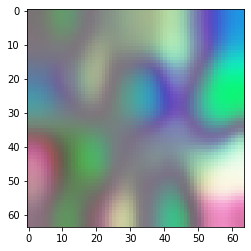

he stayed completely body she still with the whole person for his body . EOS
-18.466352462768555 9.553555359640202e-09


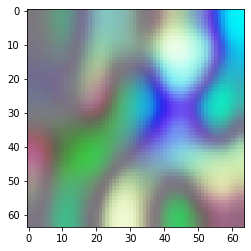

he stayed completely over he d stayed for almost his plan behind her phone . EOS
-18.426969528198242 9.937309487705387e-09


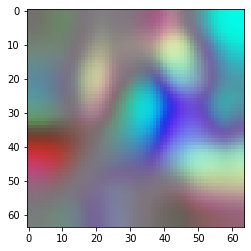

he stayed completely at the body with no woman almost completely passed . EOS
-18.690828323364258 7.63266843552701e-09


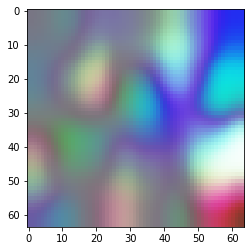

he stayed completely when i slept for only after his next body . EOS
-15.34943962097168 2.1568655423751562e-07


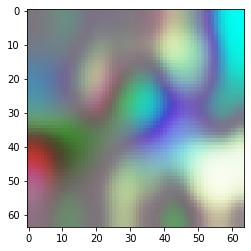

he stayed completely when her body barely feel some response . EOS
-15.839289665222168 1.3215509192665888e-07


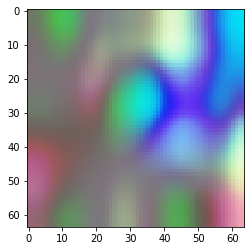

he stayed completely completely the body have a fully easier . EOS
-8.137800216674805 0.0002922794430219574


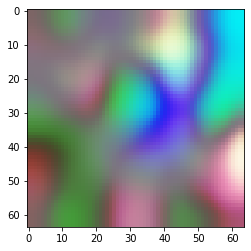

he stayed completely for a voice even the body surely . EOS
-16.84438705444336 4.836995142049329e-08


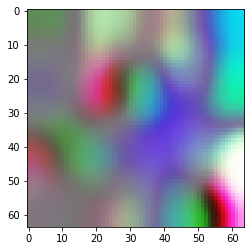

he stayed completely because i stayed a completely caught by his body upon the house his breathing . EOS
-18.0491886138916 1.449896435459671e-08


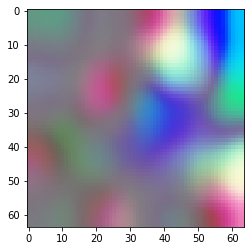

he stayed completely he only at the next his side . EOS
-14.967194557189941 3.1610400202041497e-07


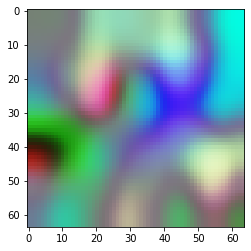

she stayed completely still for what he no body he remained he can leave the dark . EOS
-31.390918731689453 2.328612438497902e-14


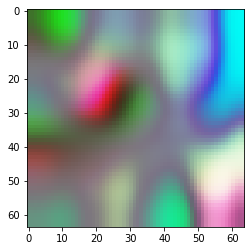

he still stayed completely behind just for the next one slept completely continued . EOS
-19.557466506958008 3.208486497954445e-09


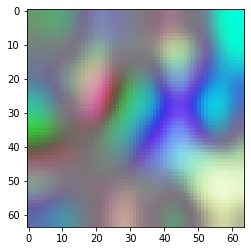

he stayed there only a body but had nt watch her body next to the face . EOS
-16.350528717041016 7.926027995815706e-08


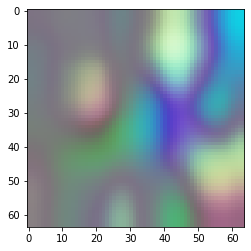

he stayed completely still after his body but he stayed at the light that completely a sudden . EOS
-16.539512634277344 6.561164547431237e-08


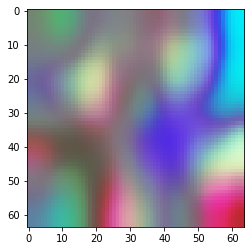

In [147]:
for k in np.linspace(1, 10, 10):
    with torch.no_grad():
        z = 2*x1_he + k*unit_rand_x
        print(k)
        for zi in z:
            bd_z, img_z = model.beam_search_from_vector(zi.unsqueeze(0), max_len=20)
            print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
            prob = bd_z[0][1].item()
            print(prob, np.exp(prob))
            plt.imshow(tensor2image(img_z[0]))
            plt.show()
        print("\n\n")

In [ ]:
model.to(gpu)

In [17]:
for k in np.linspace(0.1, 1, 10):
    with torch.no_grad():
        rand_x = torch.empty(5, 256).normal_()
        rand_x.index_fill_(1, zero_index, 0)
        unit_rand_x = torch.div(rand_x, torch.norm(rand_x, dim=1).unsqueeze(1))
        z = k*unit_rand_x
        z = z.to(gpu)
        print(k)
        for z_i in z:
            bd_z, _ = model.beam_search_from_vector(z_i.unsqueeze(0))
            print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
            prob = bd_z[0][1].item()
            print(prob, np.exp(prob))
    print()

0.1
rage do experienced beyond divine even a doubt he would do have such a human expression effects of such a result . EOS
-64.48760986328125 9.848880890445195e-29
rage at expression would truly have like they beneath his expression like a strange for human . EOS
-43.91439437866211 8.47658351481347e-20
nor have experienced expression he wondered believed had at such a future have believed a human person . EOS
-53.42103576660156 6.302878698196154e-24
faces he even perhaps have believed many have made at many even a human he had a person he could even effects of a man at a person he believed a man at least . EOS
-119.4651107788086 1.309066197743605e-52
perhaps he have experienced such self doubt had even a do a man of what a do capable . EOS
-51.76127243041992 3.31409540957343e-23

0.2
green expression showed like suddenly like heat like into a face like half he could hardly seen totally like a face like half of a expression like half like a man like expression like beneath angry like be

In [18]:
for k in np.linspace(1, 2, 10, endpoint=False):
    with torch.no_grad():
        rand_x = torch.empty(5, 256).normal_()
        rand_x.index_fill_(1, zero_index, 0)
        unit_rand_x = torch.div(rand_x, torch.norm(rand_x, dim=1).unsqueeze(1))
        z = k*unit_rand_x
        z = z.to(gpu)
        print(k)
        for z_i in z:
            bd_z, _ = model.beam_search_from_vector(z_i.unsqueeze(0))
            prob = bd_z[0][1].item()
            print(prob, np.exp(prob))
            if prob > -10:
                print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    print()

1.0
man suddenly he suddenly , suddenly , suddenly , anger of had he had , little of man of anger , little of man of he suddenly , half of man , little , he suddenly , half of man of man of he suddenly , suddenly , little
-176.1629638671875 3.1145612554732406e-77
perhaps , perhaps was terrified with terrified with what was scary to him with his emotion with his not scary with his emotion with his not stops his face to his soul was terrified with his to his , terrified , something was scary with emotion . EOS
-107.23023223876953 2.6946467830031287e-47
i ve known both men for five minutes or two new words , they have lost the first line of the words in the hall of one needs in the master . EOS
-49.883750915527344 2.16651769635589e-22
we can imagine your duke like this both if you are too much a cat . EOS
-18.466690063476562 9.55033061695513e-09
which she used my eating back for view . EOS
-9.077508926391602 0.00011420574832752505

1.1
but had not even had he wanted to get for the only ab

In [20]:
for k in np.linspace(2, 10, 17):
    with torch.no_grad():
        rand_x = torch.empty(20, 256).normal_()
        rand_x.index_fill_(1, zero_index, 0)
        unit_rand_x = torch.div(rand_x, torch.norm(rand_x, dim=1).unsqueeze(1))
        z = k*unit_rand_x
        z = z.to(gpu)
        print(k)
        for z_i in z:
            bd_z, _ = model.beam_search_from_vector(z_i.unsqueeze(0))
            prob = bd_z[0][1].item()
            print(prob, np.exp(prob))
            if prob > -10:
                print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
    print()

2.0
-12.521597862243652 3.647028387972189e-06
-100.50456237792969 2.246069306996506e-44
-44.936553955078125 3.050019258320379e-20
-10.267474174499512 3.474502455424708e-05
-120.3057861328125 5.647561143056938e-53
-107.34332275390625 2.406507717785108e-47
-129.8114013671875 4.203632083947268e-57
-143.12966918945312 6.911534407256913e-63
-115.11642456054688 1.0129127478772514e-50
-102.23143005371094 3.9944229711289e-45
-61.44259262084961 2.0692886274770777e-27
-44.593509674072266 4.298182185715819e-20
-17.35894012451172 2.891399437762819e-08
-19.84983253479004 2.3951199237502607e-09
-112.2716293334961 1.7420110526450178e-49
-142.15316772460938 1.8351166354164912e-62
-55.32931137084961 9.349435377102524e-25
-109.49861145019531 2.788414106241138e-48
-9.371923446655273 8.507958489373277e-05
looking too confused , i known with tanner . EOS
-146.50845336914062 2.3560643589982197e-64

2.5
-43.985694885253906 7.893242191744232e-20
-68.95149230957031 1.1343507720278984e-30
-119.41796875 1.372255

In [120]:
for k in np.linspace(0, 20, 41):
    with torch.no_grad():
        rand_x = torch.empty(20, 256).normal_()
        rand_x.index_fill_(1, zero_index, 0)
        unit_rand_x = torch.div(rand_x, torch.norm(rand_x, dim=1).unsqueeze(1))
        z = k*unit_rand_x
        print(k)
        print(torch.linalg.norm(z, dim=1, ord=1))
        print()

0.0
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

0.5
tensor([5.8705, 6.1131, 6.0973, 5.9973, 5.9596, 5.9676, 5.8860, 6.0407, 6.0643,
        5.9930, 6.1629, 6.1543, 5.8703, 5.9041, 5.9898, 5.9382, 6.0765, 6.1879,
        6.0246, 5.8694])

1.0
tensor([12.0078, 11.9032, 11.8729, 12.3375, 12.2343, 12.0182, 11.9313, 11.6018,
        11.8024, 11.9047, 11.9235, 12.0677, 12.0729, 11.6315, 11.7307, 11.8637,
        11.9414, 11.7635, 12.0575, 11.8855])

1.5
tensor([18.3383, 18.6081, 17.6723, 17.9065, 18.0174, 17.7879, 18.6731, 17.8362,
        17.4347, 18.4473, 18.0609, 18.3925, 17.9847, 18.8665, 17.9253, 17.6787,
        18.2936, 17.8959, 17.9719, 17.7963])

2.0
tensor([23.9382, 23.7346, 23.9657, 24.2809, 24.1117, 24.3533, 24.0747, 24.3659,
        24.3112, 24.2107, 22.7966, 23.5625, 24.1589, 24.2942, 23.8575, 23.4259,
        23.2979, 24.6883, 24.6496, 23.6153])

2.5
tensor([29.7104, 29.8993, 29.6125, 30.3860, 30.0102, 29.5818, 31.1768, 29.1655,
  

10
-11.165902137756348 1.414849729487729e-05
being put his heads on you as night away , too . EOS


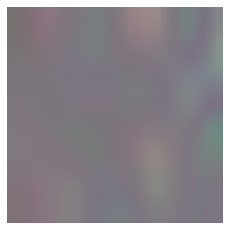

-13.12346363067627 1.99780070356953e-06
six s silence held on a sex reason to run . EOS


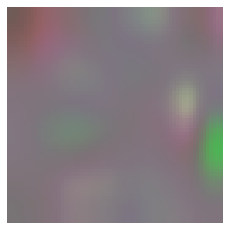

-18.769596099853516 7.0545284016281036e-09
inside the door looks cut i give him more than professional . EOS


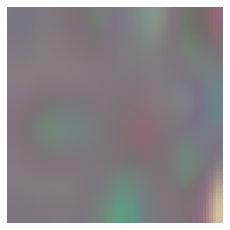

-12.693493843078613 3.0710413771729874e-06
so being the same manager picked on nothing like , i sighed . EOS


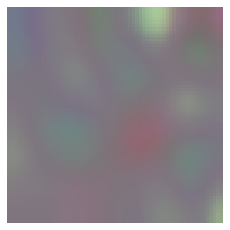

-11.904519081115723 6.759787650060582e-06
her grandfather found that just over very slowly . EOS


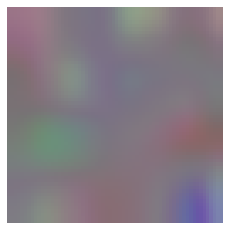

-15.388102531433105 2.0750663301834414e-07
another time i see somebody curled too sensitive to stay . EOS


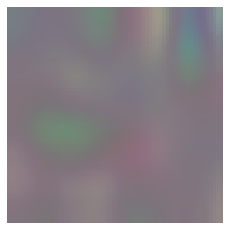

-12.84119701385498 2.649347926134221e-06
except she says no more used by my feet or pants . EOS


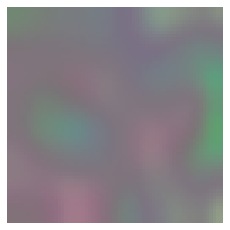

-19.873104095458984 2.340025300492467e-09
dinner gets a light but not lost in seriousness . EOS


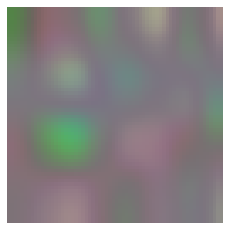

-10.59796142578125 2.4966854674562613e-05
six this moment does come on everyone s mouths . EOS


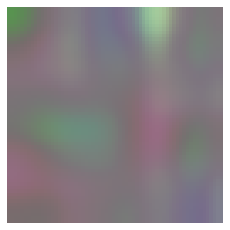

-11.458946228027344 1.0554626872955117e-05
his eyes see you re writing too many seconds . EOS


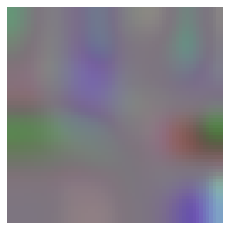

-11.674972534179688 8.504011758871097e-06
except shes told me we moved too fantastic . EOS


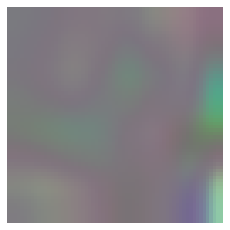

-12.242180824279785 4.822679727732829e-06
one day when he might lie under heavy venom . EOS


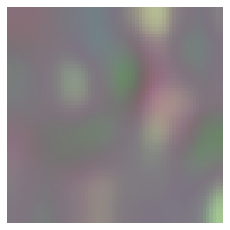

-22.821413040161133 1.226835254470953e-10
her works has just vanished under so many minutes ago , rob said . EOS


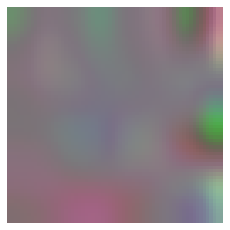

-14.303915023803711 6.136046407293606e-07
it s too late leave my hands on frame . EOS


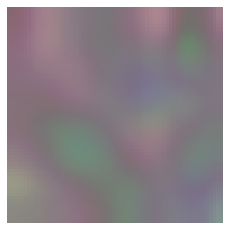

-12.314007759094238 4.488429210878117e-06
almost every set dinner he shouts on purpose . EOS


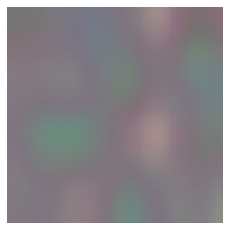

-11.557235717773438 9.566571058770996e-06
both sides run through any idea when he becomes . EOS


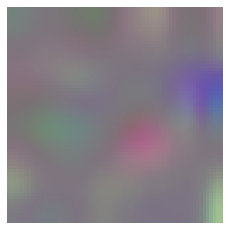

-11.015318870544434 1.6447799305147694e-05
its like he must lie working on so happily . EOS


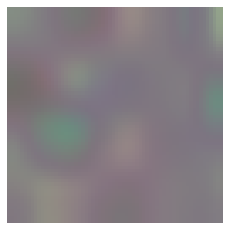

-19.02475357055664 5.465809671093118e-09
except i see her arms together for hit no land . EOS


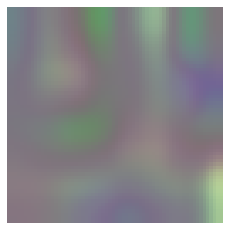

-12.044780731201172 5.87513963121495e-06
put out some time hes sleeping with jazz . EOS


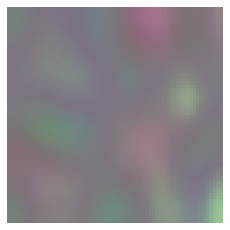

-9.21833324432373 9.920389857209705e-05
this cant both think i came over to church . EOS


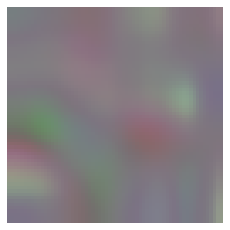

In [141]:
model.eval()
model.to("cpu")
k = 10
with torch.no_grad():
    rand_x = torch.empty(20, 256).normal_()
    rand_x.index_fill_(1, zero_index, 0)
    rand_x[:, pos_index] = torch.abs(rand_x[:, pos_index])
    rand_x[:, neg_index] = -torch.abs(rand_x[:, neg_index])
    unit_rand_x = torch.div(rand_x, torch.norm(rand_x, dim=1).unsqueeze(1))
    z = k*unit_rand_x
    print(k)
    for z_i in z:
        bd_z, image = model.beam_search_from_vector(z_i.unsqueeze(0))
        prob = bd_z[0][1].item()
        print(prob, np.exp(prob))
        print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))
        show_image(tensor2image(image[0]))
print()

-26.59142303466797 2.828080127498974e-12


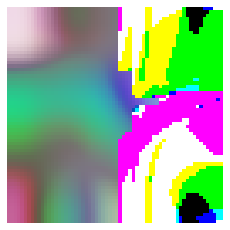

i reached i along i said together i connected my month of my foot he shoes . EOS


In [130]:
bd_z, image = model.beam_search_from_vector(z[3].unsqueeze(0))
prob = bd_z[0][1].item()
print(prob, np.exp(prob))
show_image(tensor2image(image[0]))
print(index2sentence(bd_z[0][0][0,1:].tolist(), index2word))

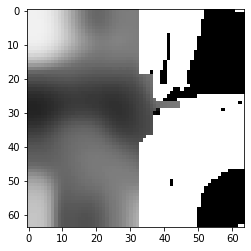

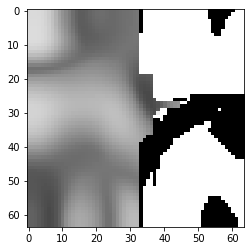

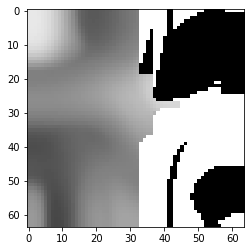

In [131]:
plt.imshow(image[0,0].detach().numpy(), cmap='gray')
plt.show()
plt.imshow(image[0,1].detach().numpy(), cmap='gray')
plt.show()
plt.imshow(image[0,2].detach().numpy(), cmap='gray')
plt.show()